## TOC:
* [Reading CVS files](#first-bullet)
* [Luminosity section](#second-bullet)
* [Trigger rate section](#third-bullet)
* [Model training section](#fourth-bullet)

In [1]:
import math
import numpy as np
import pandas as pd
import tensorflow as tf

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
#from mpl_toolkits.axes_grid1 import make_axes_locatable

from scipy import ndimage, misc, stats
import datetime
from datetime import timedelta

import keras
from keras import backend as K
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.models import Sequential, load_model
from keras.layers import Dense, Flatten, Reshape, Conv1D, MaxPooling1D, AveragePooling1D,\
UpSampling1D, InputLayer

from sklearn import svm
from sklearn.ensemble import IsolationForest
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc
from sklearn.model_selection import cross_val_score, train_test_split, StratifiedKFold, GridSearchCV
from sklearn.preprocessing import MaxAbsScaler
from sklearn.externals import joblib
from sklearn.neighbors import LocalOutlierFactor
from sklearn import cluster, datasets

Using TensorFlow backend.


In [2]:
from pandas.tseries import converter
converter.register() 

/cvmfs/sft.cern.ch/lcg/views/LCG_94/x86_64-slc6-gcc62-opt/lib/python2.7/site-packages/ipykernel/__main__.py:2: FutureWarning: 'pandas.tseries.converter.register' has been moved and renamed to 'pandas.plotting.register_matplotlib_converters'. 
  from ipykernel import kernelapp as app


In [3]:
# Change presentation settings
%matplotlib inline

matplotlib.rcParams["figure.figsize"] = (15.0, 8.0)
matplotlib.rcParams["xtick.labelsize"] = 16
matplotlib.rcParams["ytick.labelsize"] = 16
matplotlib.rcParams["axes.spines.left"] = True
matplotlib.rcParams["axes.spines.bottom"] = True
matplotlib.rcParams["axes.spines.right"] = True
matplotlib.rcParams["axes.spines.top"] = True
matplotlib.rcParams["axes.titlesize"] = 16
matplotlib.rcParams["figure.titlesize"] = 16
matplotlib.rcParams["axes.labelsize"] = 14
matplotlib.rcParams["legend.fontsize"] = 14

In [4]:
import os
cwd = os.getcwd()
print cwd

/eos/home-c/calabria/Merve/L1MTriggerRateMonitoringWithML


In [5]:
lumi_directory = "./lumi"
rates_directory = "./rates"
runs = [297101, 297178, 297179, 297180, 297181]
runs_ref = [297219, 299481, 300122, 300155, 300157, 300576, 300636, 300785, 301959, 301987, 301998, 302163,\
            302263, 302448, 302573, 302597, 302635, 303832, 303838, 303885, 303948, 304062, 304125, 304144,\
            304158, 304169, 304292, 304333, 304366, 304447, 304508, 304655, 304671, 304738, 304778, 304797,\
            305064, 305081, 305112, 305188, 305204, 305207, 305237, 305366, 305377, 305406, 305518, 305590,\
            305636, 305814, 305840, 306125, 306135, 306138, 306139, 306154, 306155, 306459]

# Reading cvs files <a class="anchor" id="first-bullet"></a>

Reading instantaneous luminosities from the cvs file produced with brilcalc and saving into a pandas dataframe:

In [6]:
df_rates = pd.DataFrame()
int_lumi2 = pd.DataFrame()
for run in runs:
    print("Loading %s" % run)
    path = "%s/lumi_%s.csv" % (lumi_directory, run)
    int_lumi2 = int_lumi2.append(pd.read_csv(path,
        names=["runfill", "ls", "time", "beamstatus", "energy", "delivered",\
               "recorded", "avgpu", "source"]), 
        ignore_index=True);    
    path = "%s/dt_rates_%s.csv" % (rates_directory, run)
    df_rates = df_rates.append(pd.read_csv(path, 
        names=["run", "time", "board", "RPC1", "RPC2", "RPC3", "RPC4",\
               "DT1", "DT2", "DT3", "DT4", "DT5"]), 
        ignore_index=True);
print("Done.")

Loading 297101
Loading 297178
Loading 297179
Loading 297180
Loading 297181
Done.


In [7]:
for run in runs_ref:
    print("Loading %s" % run)
    path = "%s/lumi_%s.csv" % (lumi_directory, run)
    int_lumi2 = int_lumi2.append(pd.read_csv(path,
        names=["runfill", "ls", "time", "beamstatus", "energy", "delivered",\
               "recorded", "avgpu", "source"]), 
        ignore_index=True);    
    path = "%s/dt_rates_%s.csv" % (rates_directory, run)
    df_rates = df_rates.append(pd.read_csv(path, 
        names=["run", "time", "board", "RPC1", "RPC2", "RPC3", "RPC4",\
               "DT1", "DT2", "DT3", "DT4", "DT5"]), 
        ignore_index=True);
print("Done.")

Loading 297219
Loading 299481
Loading 300122
Loading 300155
Loading 300157
Loading 300576
Loading 300636
Loading 300785
Loading 301959
Loading 301987
Loading 301998
Loading 302163
Loading 302263
Loading 302448
Loading 302573
Loading 302597
Loading 302635
Loading 303832
Loading 303838
Loading 303885
Loading 303948
Loading 304062
Loading 304125
Loading 304144
Loading 304158
Loading 304169
Loading 304292
Loading 304333
Loading 304366
Loading 304447
Loading 304508
Loading 304655
Loading 304671
Loading 304738
Loading 304778
Loading 304797
Loading 305064
Loading 305081
Loading 305112
Loading 305188
Loading 305204
Loading 305207
Loading 305237
Loading 305366
Loading 305377
Loading 305406
Loading 305518
Loading 305590
Loading 305636
Loading 305814
Loading 305840
Loading 306125
Loading 306135
Loading 306138
Loading 306139
Loading 306154
Loading 306155
Loading 306459
Done.


In [8]:
df_certified = pd.DataFrame()
print("Loading info")
path = "runs_2017.csv"
df_certified = df_certified.append(pd.read_csv(path,\
                                               names=["runfill", "time", "nls", "ncms", "delivered", "recorded"]),\
                                   ignore_index=True)
print("Done.")

Loading info
Done.


In [9]:
df_certified = df_certified.drop(index = [0, 1, 473, 474, 475, 476, 477])
df_certified['run'], df_certified['fill'] = df_certified['runfill'].str.split(':', 1).str

Number of runs with more than 1000 LS': 471


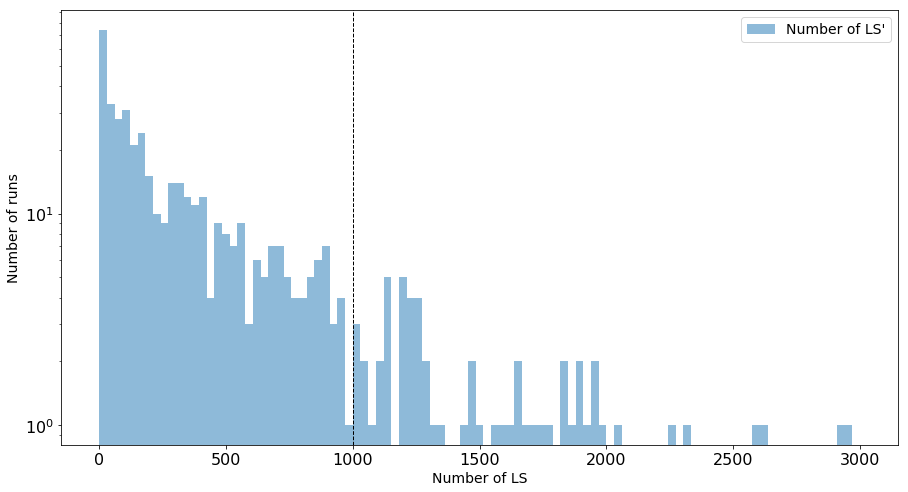

Runs with more than 1000 LS': [297178 297219 299481 300122 300155 300157 300576 300636 300785 301959
 301987 301998 302163 302263 302448 302573 302597 302635 303832 303838
 303885 303948 304062 304125 304144 304158 304169 304292 304333 304366
 304447 304508 304655 304671 304738 304778 304797 305064 305081 305112
 305188 305204 305207 305237 305366 305377 305406 305518 305590 305636
 305814 305840 306125 306135 306138 306139 306154 306155 306459]


In [10]:
nLS = 1000
print ("Number of runs with more than %s LS': %i" % (nLS, len(df_certified[df_certified.ncms > nLS].ncms.values)))
df_certified.ncms = df_certified.ncms.astype('int')
df_certified.run = df_certified.run.astype('int')

fig, ax = plt.subplots()
ax.set_yscale('log')
bins = np.linspace(0, 3000, 100)
plt.hist(df_certified.ncms, bins=bins, alpha=0.5, label="Number of LS'")
plt.axvline(nLS, color='k', linestyle='dashed', linewidth=1)
plt.ylabel('Number of runs')
plt.xlabel('Number of LS')
plt.legend(loc='best')
plt.show()

print "Runs with more than 1000 LS':", df_certified[df_certified.ncms > nLS].run.values

# Luminosity section <a class="anchor" id="second-bullet"></a>

Dropping useless rows inherited from the lumi CVS file:

In [11]:
int_lumi2["source"] = int_lumi2["source"].astype('str')
int_lumi2 = int_lumi2[int_lumi2["source"] != "nan"]
int_lumi2 = int_lumi2[int_lumi2["source"] != "source"]

Splitting run:fill field and the start and end lumi sections:

In [12]:
int_lumi2['run'], int_lumi2['fill'] = int_lumi2['runfill'].str.split(':', 1).str
int_lumi2['ls_start'], int_lumi2['ls_end'] = int_lumi2['ls'].str.split(':', 1).str

Converting run to integer and luminosities to float:

In [13]:
int_lumi2["run"] = int_lumi2["run"].astype('int')
int_lumi2["ls_start"] = int_lumi2["ls_start"].astype('int')
int_lumi2["ls_end"] = int_lumi2["ls_end"].astype('int')
int_lumi2["delivered"] = int_lumi2["delivered"].astype('float64')
int_lumi2["recorded"] = int_lumi2["recorded"].astype('float64') 

Converting time stamp to datetime:

In [14]:
def transform_time(data):
    from datetime import datetime
    time_str = data.time
    #print time_str
    datetime_object = datetime.strptime(time_str, "%m/%d/%y %H:%M:%S")
    #print datetime_object
    return datetime_object
int_lumi2["time"] = int_lumi2.apply(transform_time, axis=1);

Creating end time column from the start time:

In [15]:
int_lumi2["time_end"] = int_lumi2["time"]

Finding the runs and their start and end times:

In [16]:
boundaries = pd.DataFrame(columns=["run", "start", "end", "ls_start", "ls_end", "nLS"])
for i in runs+runs_ref:
    start = int_lumi2[int_lumi2["run"] == i]["time"]
    end = int_lumi2[int_lumi2["run"] == i]["time_end"]
    start_ls = int_lumi2[int_lumi2["run"] == i]["ls_start"]
    end_ls = int_lumi2[int_lumi2["run"] == i]["ls_end"]
    start =  start.reset_index(drop=True)
    end =  end.reset_index(drop=True)
    start_ls =  start_ls.reset_index(drop=True)
    end_ls =  end_ls.reset_index(drop=True)
    nLS = int(start_ls.iloc[-1]) - int(start_ls.iloc[0]) + 1
    print i, start.iloc[0], start.iloc[-1], start_ls.iloc[0], start_ls.iloc[-1], nLS
    boundaries = boundaries.append({"run": i, "start": start.iloc[0], "end": start.iloc[-1], 
                                   "ls_start": start_ls.iloc[0], "ls_end": start_ls.iloc[-1],\
                                    "nLS": nLS}, ignore_index = True)

297101 2017-06-17 22:12:25 2017-06-18 05:20:11 1 1102 1102
297178 2017-06-19 22:09:07 2017-06-20 07:09:32 1 1392 1392
297179 2017-06-20 07:09:38 2017-06-20 07:49:39 1 104 104
297180 2017-06-20 07:49:55 2017-06-20 08:43:55 1 140 140
297181 2017-06-20 08:44:01 2017-06-20 09:20:32 1 95 95
297219 2017-06-20 14:26:07 2017-06-21 07:52:24 1 2694 2694
299481 2017-07-20 19:55:18 2017-07-21 04:03:40 1 1258 1258
300122 2017-07-29 21:37:22 2017-07-30 05:57:47 23 1311 1289
300155 2017-07-30 18:44:37 2017-07-31 02:33:34 22 1229 1208
300157 2017-07-31 03:11:37 2017-07-31 10:24:49 1 1116 1116
300576 2017-08-07 04:06:31 2017-08-07 11:55:04 1 1207 1207
300636 2017-08-07 21:23:44 2017-08-08 07:37:12 1 1580 1580
300785 2017-08-09 10:49:33 2017-08-09 19:06:05 1 1279 1279
301959 2017-08-27 18:19:32 2017-08-28 06:47:26 20 1945 1926
301987 2017-08-28 21:03:26 2017-08-29 04:23:38 1 1134 1134
301998 2017-08-29 09:19:31 2017-08-29 20:40:35 1 1754 1754
302163 2017-09-01 03:29:53 2017-09-01 11:25:25 23 1247 1225
3

In [17]:
boundaries = boundaries.sort_values('run')
boundaries = boundaries.reset_index()

Reindexing the dataframe after removing some lines:

In [18]:
int_lumi2.index = pd.RangeIndex(len(int_lumi2.index))

In [19]:
print len(int_lumi2.index)

94647


Filling end time column:

In [20]:
def addTimeOffSet(startdate):
    enddate = pd.to_datetime(startdate) + pd.DateOffset(seconds=23)
    return enddate

def shiftElement(df, boundaries):
    run0 = boundaries["run"].iloc[0]
    for index, rows in df.iterrows():
        run = rows["run"]
        nls = int(boundaries[boundaries["run"] == run]["nLS"])
        if(run > run0):
            nls = nls + index
        #print run, nls
        if((index < nls) & (index < len(int_lumi2.index)-1)):
            #print index, run, rows["time"], df["time"][index+1]
            df.loc[index, "time_end"] = df["time"][index+1]
        elif (index == len(int_lumi2.index)-1):
            #print index, run, rows["time"], addTimeOffSet(rows["time"])
            df.loc[index, "time_end"] = addTimeOffSet(rows["time"])
                    
shiftElement(int_lumi2, boundaries)

Selecting only beam status STABLE BEAM:

In [21]:
#print int_lumi2["beamstatus"]
int_lumi2 = int_lumi2[int_lumi2["beamstatus"] == "STABLE BEAMS"]

In [22]:
#int_lumi2.to_csv("int_lumi2.csv", sep='\t')

Plotting the instantaneous luminosities:

In [23]:
def plot_inst_lumi(x_val, y_val, z_val, title):
    fig, ax = plt.subplots()
    plt.xlabel("Time")
    plt.ylabel(r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]")
    xfmt = mdates.DateFormatter('%y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)
    ax.grid()
    fig.autofmt_xdate()
    plt.plot(x_val, y_val, 'ro-')
    plt.plot(x_val, z_val, 'bo-')
    plt.title(title)
    plt.legend(loc="best")
    plt.show();

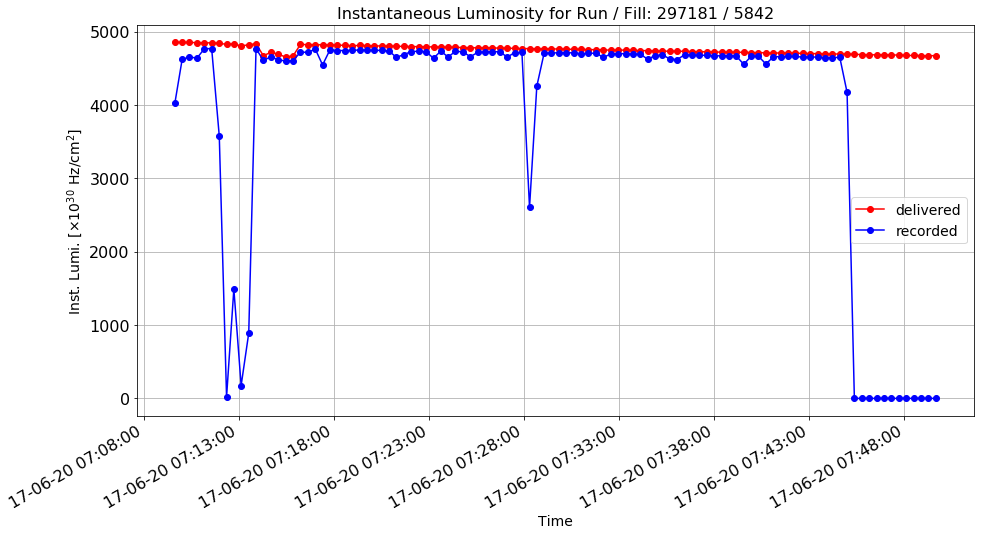

In [24]:
plot_inst_lumi(int_lumi2[int_lumi2["run"] == 297179]["time"], 
               int_lumi2[int_lumi2["run"] == 297179]["delivered"], 
               int_lumi2[int_lumi2["run"] == 297179]["recorded"], 
               ("Instantaneous Luminosity for Run / Fill: %s / %s" % 
               ("297181", int_lumi2["fill"].iloc[0])))

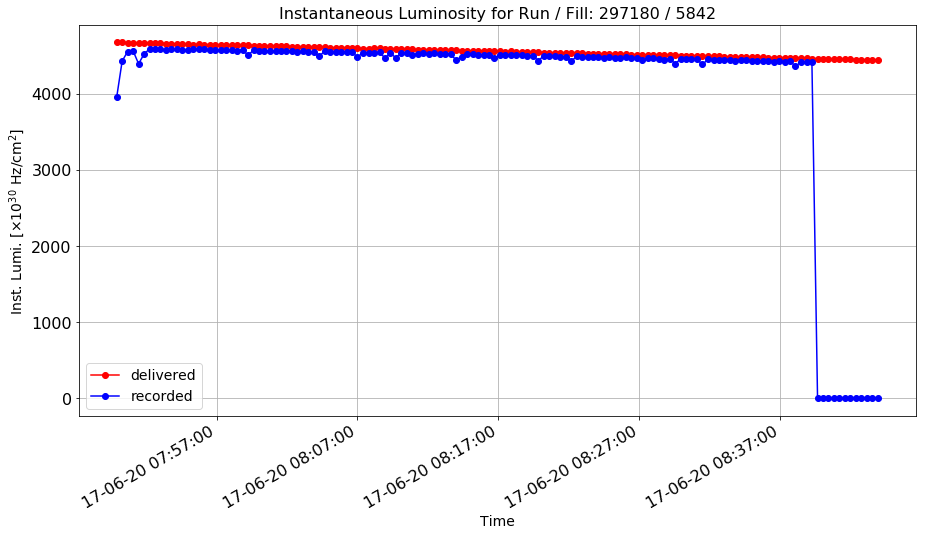

In [25]:
plot_inst_lumi(int_lumi2[int_lumi2["run"] == 297180]["time"], 
               int_lumi2[int_lumi2["run"] == 297180]["delivered"], 
               int_lumi2[int_lumi2["run"] == 297180]["recorded"], 
               ("Instantaneous Luminosity for Run / Fill: %s / %s" % 
               ("297180", int_lumi2["fill"].iloc[0])))

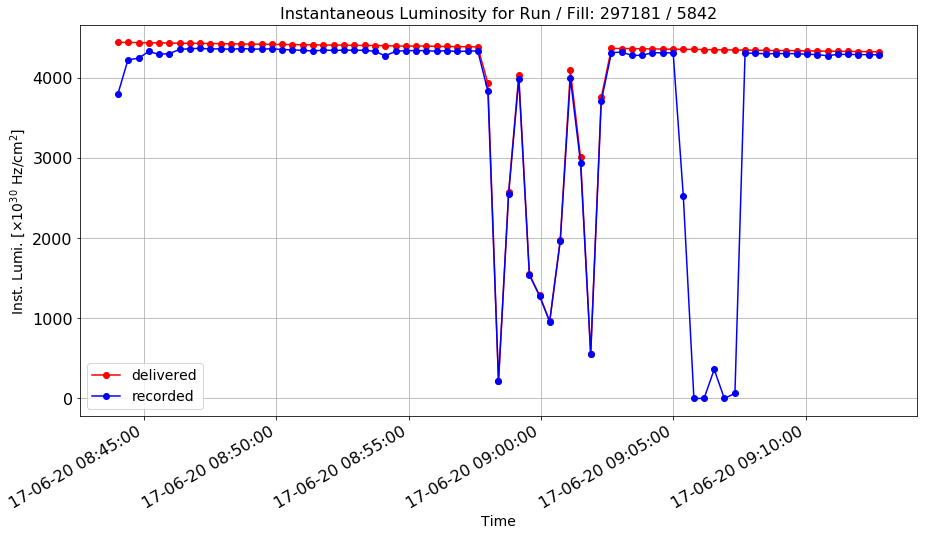

In [26]:
plot_inst_lumi(int_lumi2[int_lumi2["run"] == 297181]["time"], 
               int_lumi2[int_lumi2["run"] == 297181]["delivered"], 
               int_lumi2[int_lumi2["run"] == 297181]["recorded"], 
               ("Instantaneous Luminosity for Run / Fill: %s / %s" % 
               ("297181", int_lumi2["fill"].iloc[0])))

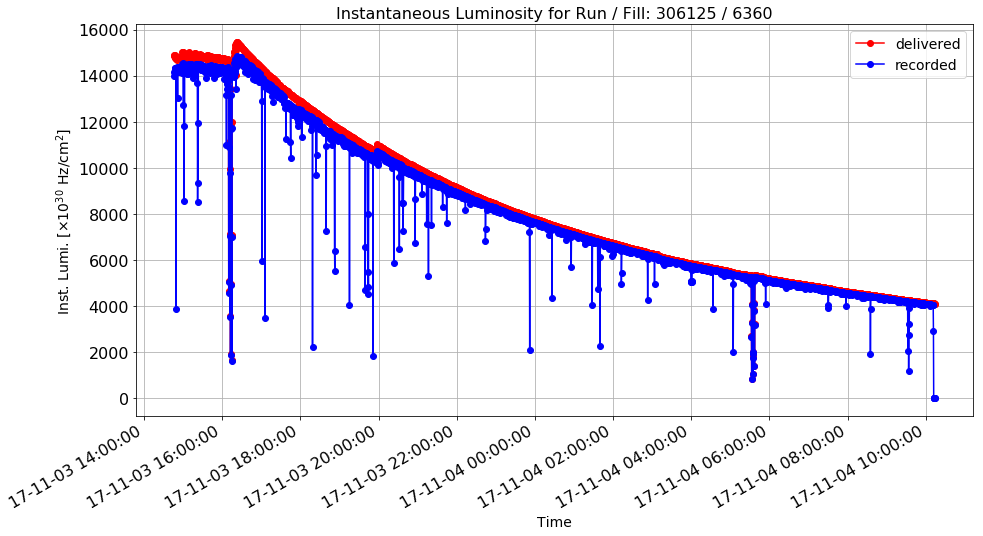

In [27]:
plot_inst_lumi(int_lumi2[int_lumi2["run"] == 306125]["time"], 
               int_lumi2[int_lumi2["run"] == 306125]["delivered"], 
               int_lumi2[int_lumi2["run"] == 306125]["recorded"], 
               ("Instantaneous Luminosity for Run / Fill: %s / %s" % 
               ("306125", int_lumi2[int_lumi2.run == 306125]["fill"].iloc[0])))

# Trigger rate section <a class="anchor" id="third-bullet"></a>

Converting columns to proper data types:

In [28]:
df_rates["time"] = pd.to_datetime(df_rates["time"])
df_rates["run"] = df_rates["run"].astype('int')
#print df_rates["time"]

Splitting, converting and adding new columns:

In [ ]:
df_rates['wheel'], df_rates['sector'] = df_rates['board'].str.split('_', 1).str
df_rates["wheel"] = df_rates["wheel"].astype(str)
df_rates["sector"] = df_rates["sector"].astype(str)

In [ ]:
df_rates["wheel"].replace(regex=True,inplace=True,to_replace=r'YB',value=r'')
df_rates["sector"].replace(regex=True,inplace=True,to_replace=r'S',value=r'')
df_rates["wheel"] = df_rates["wheel"].astype('int')
df_rates["sector"] = df_rates["sector"].astype('int')
df_rates["ls"] = -1
df_rates["lumi"] = -1.0
df_rates["score"] = -1
#df_rates.to_csv("df_rates.csv", sep='\t')

Plotting the rate coming from one of the stations:

In [ ]:
def plot_rate_vs_time(df, x_val, y_val, z_val, title):
    df_temp = df.copy()
    crit = df_temp["board"] == z_val
    df_temp = df_temp[crit]
    fig, ax = plt.subplots()
    plt.xlabel("Time")
    plt.ylabel("Rate [Hz]")
    ax.xaxis_date()
    xfmt = mdates.DateFormatter('%d-%m-%y %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)
    ax.grid()
    fig.autofmt_xdate()
    plt.plot(df_temp[x_val], df_temp[y_val], 'ro-')
    plt.title(title)
    plt.legend(loc="best")
    plt.show()

In [ ]:
rule = (df_rates.run == 306125)
boards = ["YB-1_S4", "YB-1_S5", "YB-1_S6"]
for board in boards:
    plot_rate_vs_time(df_rates[rule],\
                      "time", "RPC1", board, "Rates for Runs / Fill / Board: %s / %s / %s" % 
                      ("306125", int_lumi2[int_lumi2.run == 306125]["fill"].iloc[0], board))

Associating a LS and an instantaneous luminosity to each rate:

In [ ]:
#Just a backup copy
df_rates_backup = df_rates.copy()

In [ ]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

Removing the measurements taken before and after the start and end time reported by the brilcalc output. All the 60 boards are measured at the same time. In order to speed-up the association, we take just one board, the first one. This reduces the dataframe and the time needed to go though it by a factor of 60.

In [ ]:
time0 = boundaries["start"].iloc[0]
timeF = boundaries["end"].iloc[-1]
print time0, timeF
#print df_rates[(df_rates.time >= time0) & (df_rates.time <= timeF)]
df_rates = df_rates[(df_rates.time >= time0) & (df_rates.time <= timeF)]
rule = df_rates.duplicated(subset=["time"])
count = (rule == False).sum()
print "Duplicates:", rule.sum()
df_rates_noduplicates = df_rates[rule == False]
#print df_rates_noduplicates

2017-06-17 22:12:25 2017-11-10 12:47:56


In [ ]:
print len(df_rates_noduplicates)

Assigning the LS and the inst. lumi. to the measurements for the selected board:

In [ ]:
def assignLS(df1, df2, boundaries):
    temp = df1.copy()
    j = 1
    for index1, row1 in df1.iterrows():
        run1 = row1["run"]
        time1 = row1["time"]
        #print index1, run1, time1
        ti = time1 - 2*pd.DateOffset(seconds=23)
        tf = time1 + 2*pd.DateOffset(seconds=23)
        indexes2 = df2[(df2.run == run1) & (df2.time > ti) & (df2.time < tf)].index
        #print indexes2
        for i in indexes2:
            if((time1 >= df2["time"].loc[i]) & (time1 < df2["time_end"].loc[i])):
                #print time1, df2["time"].loc[i], df2["time_end"].loc[i]
                if(j%1000 == 0): 
                    print j
                j = j + 1
                ls = df2["ls_start"].loc[i]
                lumi = df2["delivered"].loc[i]
                #print index1, run1, time1, ls, lumi
                temp.loc[index1, "ls"] = ls
                temp.loc[index1, "lumi"] = lumi
                break
    return temp

temp = assignLS(df_rates_noduplicates, int_lumi2, boundaries)
df_rates_noduplicates = temp

Removing the few cases not assigned and that are still at -1:

In [138]:
df_rates_noduplicates = df_rates_noduplicates[df_rates_noduplicates["ls"] > 0]
print len(df_rates_noduplicates)

39845


Save in a csv file:

In [139]:
#df_rates.to_csv("df_rates.csv", sep='\t')
#df_rates_noduplicates.to_csv("df_rates_nodup.csv", sep='\t')

In [140]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

Assign the LS and the inst. lumi. to all the 60 boards for each time:

In [141]:
def assignLS_ext(df1, df2):
    temp = df1.copy()
    indexes = []
    for index in df2.index:
        if index%10000 == 0:
            print index
        time = df2["time"].loc[index]
        ls = df2["ls"].loc[index]
        lumi = df2["lumi"].loc[index]
        des = (temp["time"] == time)
        indexes = temp[des].index
        #print time, ls, indexes
        temp.loc[des, "ls"] = ls
        temp.loc[des, "lumi"] = lumi
    return temp
    
temp = assignLS_ext(df_rates, df_rates_noduplicates)

30000
60000
90000
120000
150000
180000
210000
240000
270000
300000
330000
360000
390000
420000
450000
480000
510000
540000
570000
600000
630000
660000
690000
720000
750000
780000
810000
840000
870000
900000
930000
960000
990000
1020000
1050000
1080000
1110000
1140000
1170000
1200000
1230000
1260000
1290000
1320000
1350000
1380000
1410000
1440000
1470000
1500000
1530000
1560000
1590000
1620000
1650000
1680000
1710000
1740000
1770000
1800000
1830000
1860000
1890000
1920000
1950000
1980000
2010000
2040000
2070000
2100000
2130000
2160000
2190000
2220000
2250000
2280000
2310000
2340000
2370000


In [142]:
df_rates = temp.copy()
#print df_rates[df_rates.ls <= 0]

Removing measurements without LS assignment:

In [143]:
df_rates_backup = df_rates.copy()
df_rates = df_rates[df_rates.ls > 0]
#print df_rates["ls"]

In [144]:
#print df_rates[df_rates.ls <= 0]
#df_rates.to_csv("df_rates.csv", sep='\t')

Averaging the rates associated to the same LS:

In [145]:
df_boards = df_rates.copy()
df_boards = df_boards.groupby(['board']).size().reset_index(name='counts')
print len(df_boards)
#print df_boards

60


Too slow to use all the measurements. Averaging over 10 LS:

In [146]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

In [147]:
bunch = 50
def assignGroup(data, div = bunch):
    res = int(data/div)
    #print data, res
    return res

df_rates["group"] = df_rates["ls"]
df_rates["group"] = df_rates["group"].apply(assignGroup)

In [148]:
#print df_rates["group"]

In [149]:
temp1 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["ls", "lumi", "RPC1", "RPC2", "RPC3", "RPC4",\
  "DT1", "DT2", "DT3", "DT4", "DT5"]].mean().reset_index()

temp2 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["lumi", "RPC1", "RPC2", "RPC3", "RPC4",\
  "DT1", "DT2", "DT3", "DT4", "DT5"]].std().reset_index()

temp3 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["lumi", "RPC1", "RPC2", "RPC3", "RPC4",\
  "DT1", "DT2", "DT3", "DT4", "DT5"]].size().reset_index(name='counts')

temp2 = temp2.rename(index=str, columns={"lumi": "errLumi", "RPC1": "errRPC1", "RPC2": "errRPC2",\
                                         "RPC3": "errRPC3", "RPC4": "errRPC4", "DT1": "errDT1",\
                                         "DT2": "errDT2", "DT3": "errDT3", "DT4":\
                                         "errDT4", "DT5": "errDT5"})

cols_to_use2 = temp2.columns.difference(temp1.columns)
cols_to_use3 = temp3.columns.difference(temp1.columns)

temp2 = temp2[cols_to_use2]
temp3 = temp3[cols_to_use3]

#print temp1.iloc[100]
#print temp2.iloc[100]
#print temp3.iloc[100]

temp1.reset_index(drop=True, inplace=True)
temp2.reset_index(drop=True, inplace=True)
temp3.reset_index(drop=True, inplace=True)

df_rates = pd.concat([temp1, temp2, temp3], axis = 1)

Calculating the errors on the mean values calculated in the previous step:

In [150]:
import math
def applySqrt(data):
    return math.sqrt(data)

df_rates["counts"] = df_rates["counts"].apply(applySqrt)

for i in list(df_rates):
    if "err" in i:
        #print i
        df_rates[i] = df_rates[i]/df_rates["counts"]

In [151]:
#print df_rates

Check for null or NaN values:

In [152]:
print df_rates.isnull().values.any()
null_columns=df_rates.columns[df_rates.isnull().any()]
print(df_rates[df_rates.isnull().any(axis=1)][null_columns].head())
#df_rates = df_rates.fillna(0)
#print(df_rates[df_rates.isnull().any(axis=1)][null_columns].head())

False
Empty DataFrame
Columns: []
Index: []


In [153]:
#Another backup
#df_rates_backup = df_rates.copy()
#df_rates.to_csv("df_rates.csv", sep='\t')

In [154]:
#Restore backup
#df_rates = df_rates_backup.copy()

In [155]:
print len(df_rates)

9900


Uncomment to check just one case case:

In [156]:
#for index, row in df_rates.iterrows():
    #if row["board"] == "YB0_S1":
        #print "Index:", index,", Run:", row["run"],", Board: ",row["board"],",\
        #LS: ",row["ls"],", Rate: ",row["DT1"],", Error: ",row["errDT1"]

Plotting the result:

In [157]:
def calc_bounds(x, a, b, s_a, s_b, mode):
    if (mode == "low"):
        return (x * (a - s_a) + (b - s_b))
    else:
        return (x * (a + s_a) + (b + s_b))

def plot_rate_vs_ls(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y, title, opt, log,\
                    fit = True, fmin = 5000, fmax = 15000):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    inter = []
    for i in range(len(run)):
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        newstr = opt[i].replace("o", "")
        plt.errorbar(df_temp[rule][x_val], df_temp[rule][y_val], xerr=x_err,\
        yerr=df_temp[rule][y_err], fmt=opt[i], ecolor=newstr, label=str(run[i]))
        plt.legend(loc="best")
        
        if ((run[i] == 306125) & fit):
            rule2 = (df_temp[x_val] > fmin) & (df_temp[x_val] < fmax)
            val1 = df_temp[rule & rule2][x_val]
            #print val1
            val2 = df_temp[rule & rule2][y_val]
            print "Linear correlation:", stats.pearsonr(val1.values, val2.values)
            coeff, pcov = np.polyfit(val1, val2, 1, cov = True)
            #print pcov
            perr3 = np.sqrt(np.diag(pcov))
            inter.append(coeff)
            inter.append(perr3)
            p = np.poly1d(coeff)
            xp = np.linspace(3000, 16000, 1000)
            _ = plt.plot(xp, p(xp), '-')
            print "Linear fit parameters:", coeff
            print "Paramenters uncertainty:", perr3
            y_low = calc_bounds(val1, coeff[0], coeff[1], perr3[0], perr3[1], "low")
            y_high = calc_bounds(val1, coeff[0], coeff[1], perr3[0], perr3[1], "high")
            plt.plot(val1, y_low, 'r-')
            plt.plot(val1, y_high, 'r-')
        
    plt.title(title)
    plt.show()
    if ((run[i] == 306125) & fit):
        return inter

Linear correlation: (0.9999376230105629, 1.7134307528961267e-89)
Linear fit parameters: [  12.59668881 2451.89986378]
Paramenters uncertainty: [2.14570342e-02 2.09750967e+02]


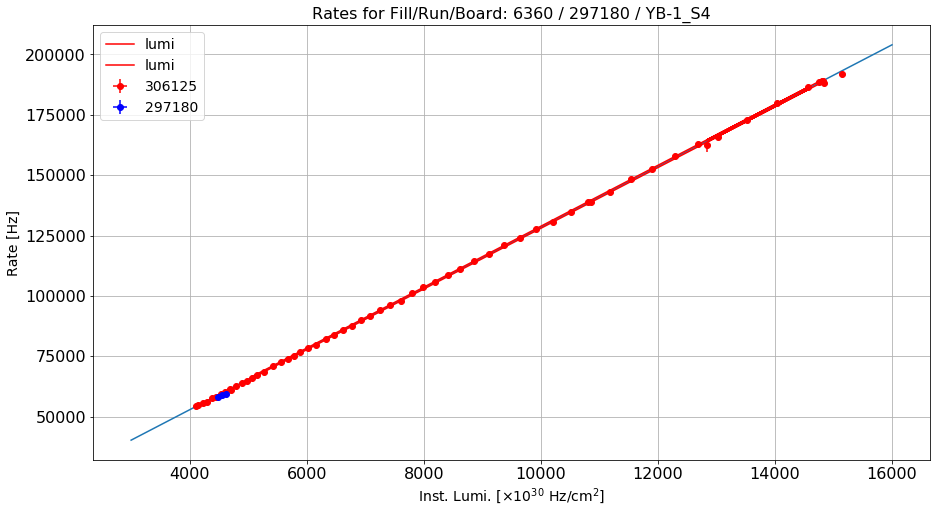

Linear correlation: (0.994262706228974, 2.4622150126723002e-45)
Linear fit parameters: [3.73126505e+00 6.10905559e+04]
Paramenters uncertainty: [6.12160708e-02 5.98411222e+02]


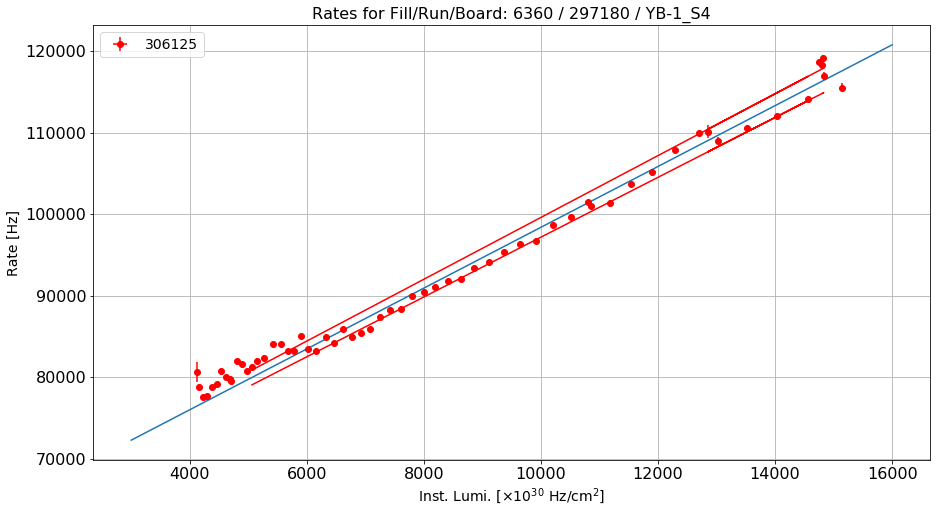

Linear correlation: (0.9956522927243432, 4.8696648776738916e-48)
Linear fit parameters: [9.42529381e-01 1.42233967e+04]
Paramenters uncertainty: [1.34470047e-02 1.31449771e+02]


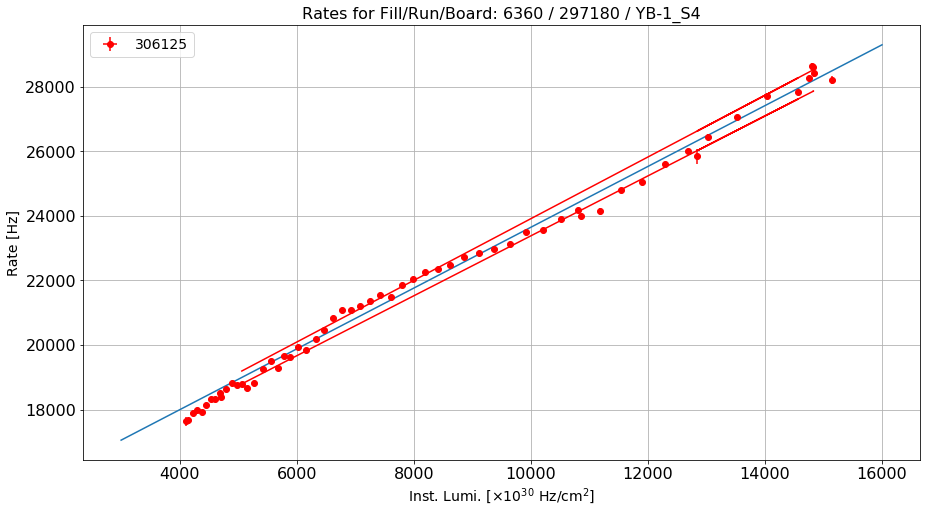

Linear correlation: (0.9999391679395042, 9.745544179117429e-90)
Linear fit parameters: [  28.34079322 8287.39325386]
Paramenters uncertainty: [4.76736990e-02 4.66029199e+02]


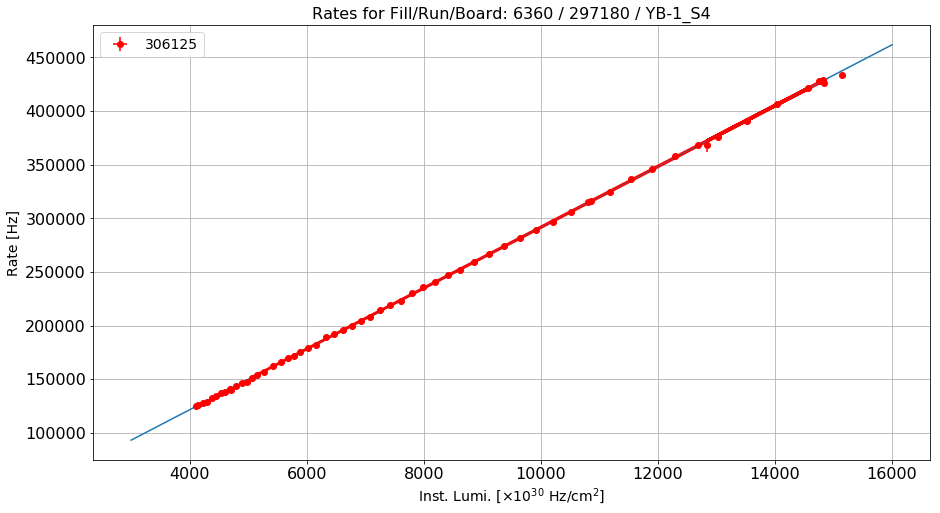

[array([  28.34079322, 8287.39325386]),
 array([4.76736990e-02, 4.66029199e+02])]

In [158]:
#boards = ["YB-1_S4", "YB-1_S5", "YB-1_S6"]    
    
title = "Rates for Fill/Run/Board: "+str(int_lumi2[int_lumi2.run == 306125]["fill"].iloc[0])+" / "\
+str(boundaries["run"].iloc[3])+" / YB-1_S4"

plot_rate_vs_ls(df_rates, [306125, 297180], "lumi", "RPC1", "YB-1_S4", 0, "errRPC1",\
                r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, ["ro", "bo"], False)
plot_rate_vs_ls(df_rates, [306125], "lumi", "RPC2", "YB-1_S4", 0, "errRPC2",\
                r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, ["ro"], False)
plot_rate_vs_ls(df_rates, [306125], "lumi", "RPC3", "YB-1_S4", 0, "errRPC3",\
                r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, ["ro"], False)
plot_rate_vs_ls(df_rates, [306125], "lumi", "RPC4", "YB-1_S4", 0, "errRPC4",\
                r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, ["ro"], False)

Create a new dataframe with the input features already organized in a numpy array:

In [159]:
print len(df_rates)
algos = ['RPC1', 'RPC2', 'RPC3', 'RPC4']
df_rates_new_2 = pd.DataFrame(columns=['run', 'group', 'board', 'wheel', 'sector', 'ls',\
                                     'lumi', 'errLumi', 'rate', 'err', 'system', 'station'])

for i in algos:
    list_a = ['run', 'group', 'board', 'wheel', 'sector', 'ls', 'lumi', 'errLumi', i, 'err'+i,]
    temp = df_rates.copy()
    temp = temp[list_a]
    temp["system"] = -1
    temp["station"] = -1
    j = i
    if (i.find("RPC") != -1):
        temp["system"] = 1
        num = i.replace("RPC", "")
        temp["station"] = int(num)
    else:
        temp["system"] = 2
        num = i.replace("DT", "")
        temp["station"] = int(num)
    temp = temp.rename(columns={j: 'rate', 'err'+j: 'err'})
    #print temp.columns
    df_rates_new_2 = pd.concat([df_rates_new_2, temp], ignore_index=True)

print len(df_rates_new_2)

9900
39600


Adding the lumi/rate ratio:

In [160]:
df_rates_new_2["CS"] = -1
df_rates_new_2["errCS"] = -1

df_rates_new_2["CS"] = df_rates_new_2["rate"]/df_rates_new_2["lumi"]
print "Number of NaN's in CS before:"
print len(df_rates_new_2["CS"][df_rates_new_2["CS"].isnull() == True])
print "Number of Inf's in CS before:"
print len(df_rates_new_2["CS"][np.isinf(df_rates_new_2["CS"])])

df_rates_new_2["CS"] = df_rates_new_2["CS"].replace([np.inf, -np.inf], np.nan)
df_rates_new_2["CS"] = df_rates_new_2["CS"].fillna(-1)

print "Number of NaN's in CS after:"
print len(df_rates_new_2["CS"][df_rates_new_2["CS"].isnull() == True])
print "Number of Inf's in CS after:"
print len(df_rates_new_2["CS"][np.isinf(df_rates_new_2["CS"])])

df_rates_new_2["errCS"] = (1/df_rates_new_2["lumi"])*\
np.sqrt(df_rates_new_2["err"]**2 + df_rates_new_2["CS"]**2 * df_rates_new_2["errLumi"]**2)

print "Number of NaN's in errCS before:"
print len(df_rates_new_2["errCS"][df_rates_new_2["errCS"].isnull() == True])
print "Number of Inf's in errCS before:"
print len(df_rates_new_2["errCS"][np.isinf(df_rates_new_2["errCS"])])

df_rates_new_2["errCS"] = df_rates_new_2["errCS"].replace([np.inf, -np.inf], np.nan)
df_rates_new_2["errCS"] = df_rates_new_2["errCS"].fillna(-1)

print "Number of NaN's in errCS after:"
print len(df_rates_new_2["errCS"][df_rates_new_2["errCS"].isnull() == True])
print "Number of Inf's in errCS after:"
print len(df_rates_new_2["errCS"][np.isinf(df_rates_new_2["errCS"])])

Number of NaN's in CS before:
0
Number of Inf's in CS before:
0
Number of NaN's in CS after:
0
Number of Inf's in CS after:
0
Number of NaN's in errCS before:
0
Number of Inf's in errCS before:
0
Number of NaN's in errCS after:
0
Number of Inf's in errCS after:
0


In [161]:
array = df_rates_new_2.as_matrix(columns=['system', 'wheel', 'sector', 'station',\
                                        'lumi', 'errLumi', 'rate', 'err',\
                                        'CS', 'errCS'])

/cvmfs/sft.cern.ch/lcg/views/LCG_94/x86_64-slc6-gcc62-opt/lib/python2.7/site-packages/ipykernel/__main__.py:1: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  if __name__ == '__main__':


In [162]:
df_rates_new_2["content"] = np.empty((len(df_rates_new_2), 0)).tolist()
for index, rows in df_rates_new_2.iterrows():
    #print index, array[index]
    df_rates_new_2.at[index, "content"] = array[index]
df_rates_new_2["score"] = -1

Check if the two dataframes are exactly the same:

In [163]:
def plot_rate_vs_ls_2(df1, df2, x_val, y_val, x_err, y_err, title_x, title_y, title, opt, log = False):
    fig, ax = plt.subplots()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    plt.errorbar(df1[x_val], df1[y_val], xerr=x_err, yerr=df1[y_err], fmt='ro', ecolor='r')
    num = y_val
    num = num.replace("RPC", "")
    tmp = df2[df2.station == int(num)]
    plt.errorbar(tmp[x_val], tmp["rate"], xerr=x_err, yerr=tmp["err"], fmt='b+', ecolor='b')
    plt.title(title)
    plt.legend(loc="best")
    plt.show()

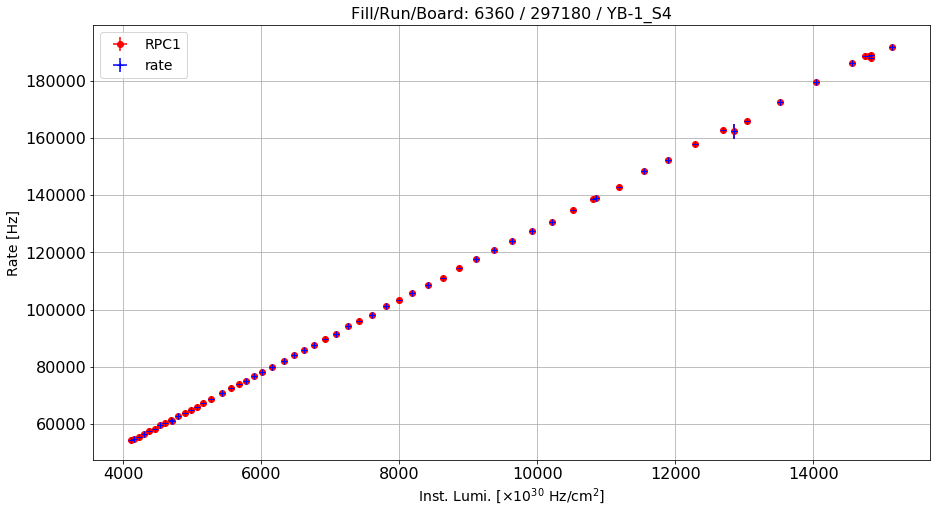

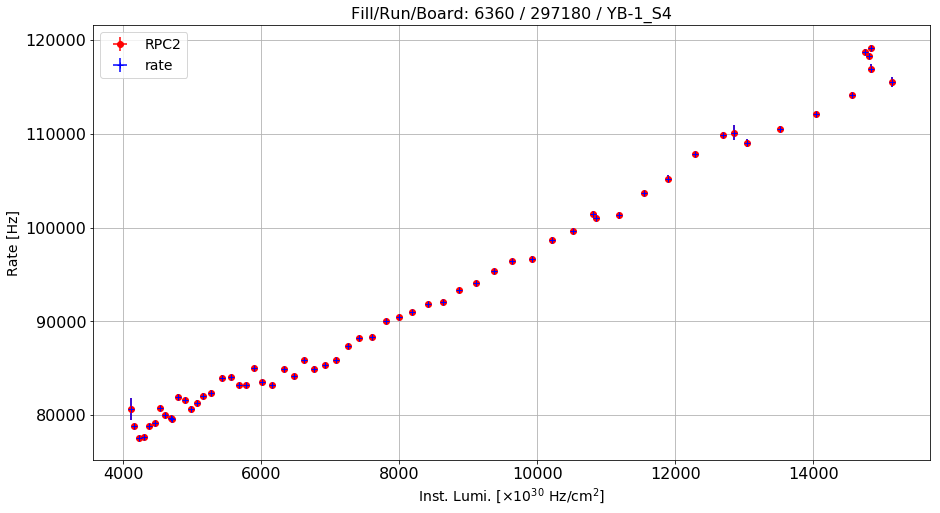

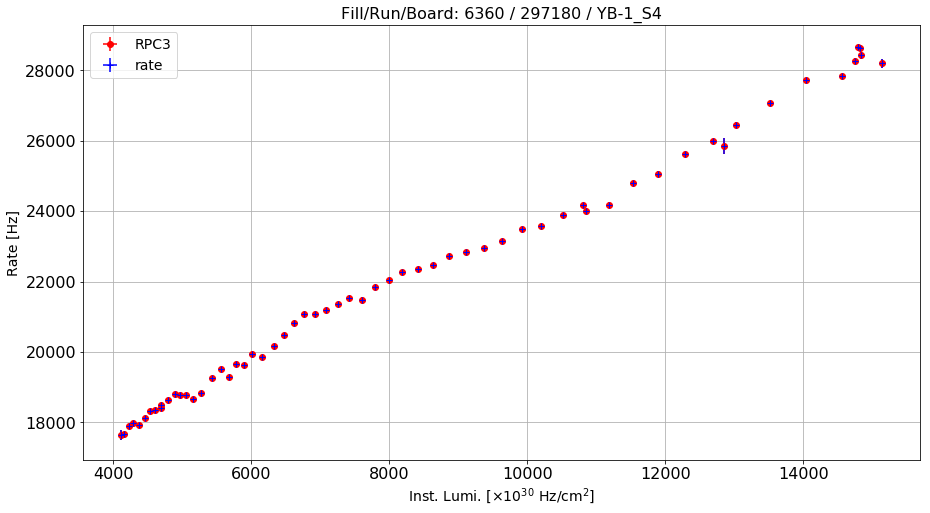

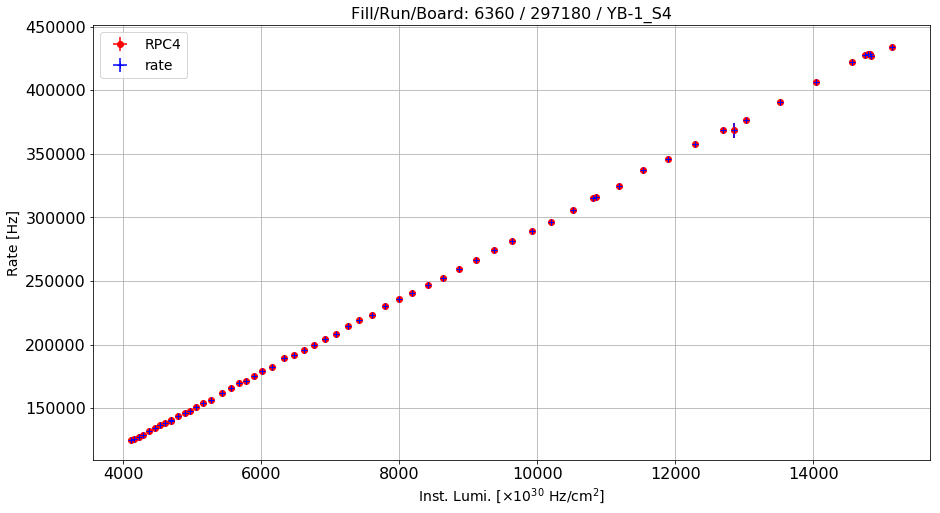

In [164]:
title = "Fill/Run/Board: "+str(int_lumi2[int_lumi2.run == 306125]["fill"].iloc[0])+\
" / "+str(boundaries["run"].iloc[3])+" / YB-1_S4"

rule_1 = ((df_rates["wheel"] == -1) & (df_rates["sector"] == 4) & (df_rates["run"] == 306125))
rule_2 = ((df_rates_new_2["wheel"] == -1) & (df_rates_new_2["sector"] == 4)\
          & (df_rates_new_2["run"] == 306125))

temp1 = df_rates[rule_1]
temp2 = df_rates_new_2[rule_2]

plot_rate_vs_ls_2(temp1, temp2, "lumi", "RPC1", 0, "errRPC1", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
                "Rate [Hz]", title, "ro")
plot_rate_vs_ls_2(temp1, temp2, "lumi", "RPC2", 0, "errRPC2", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
                "Rate [Hz]", title, "ro")
plot_rate_vs_ls_2(temp1, temp2, "lumi", "RPC3", 0, "errRPC3", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
                "Rate [Hz]", title, "ro")
plot_rate_vs_ls_2(temp1, temp2, "lumi", "RPC4", 0, "errRPC4", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
                "Rate [Hz]", title, "ro")

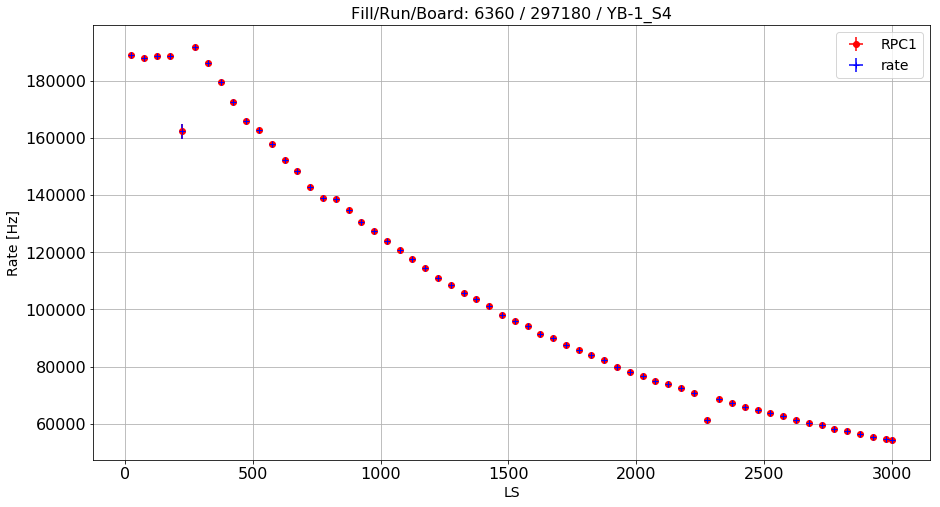

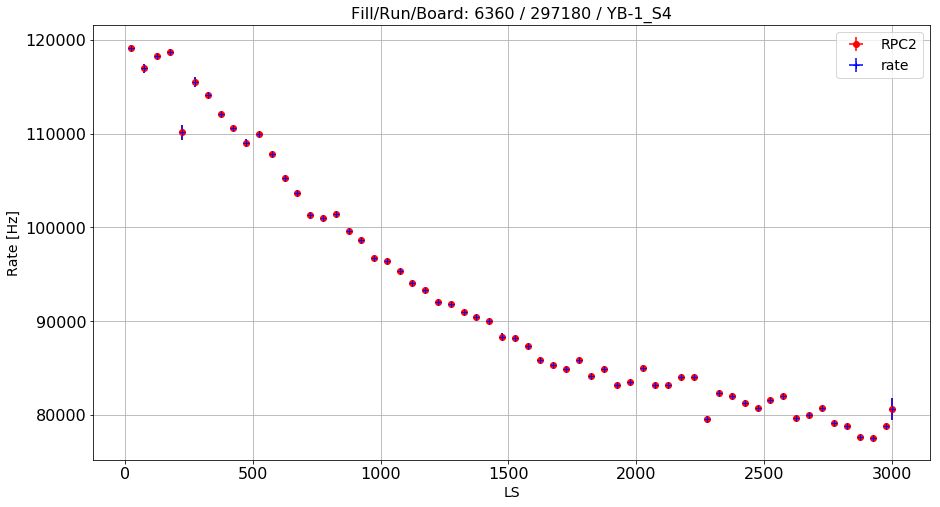

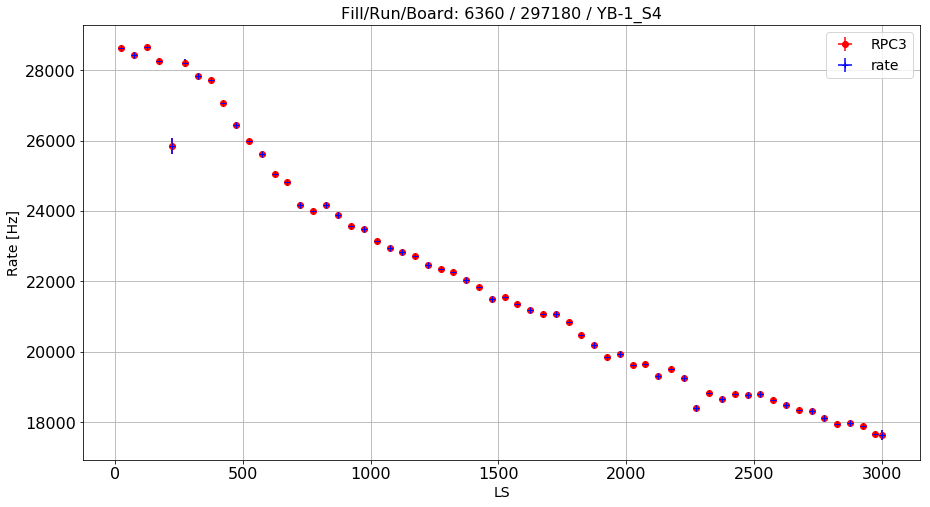

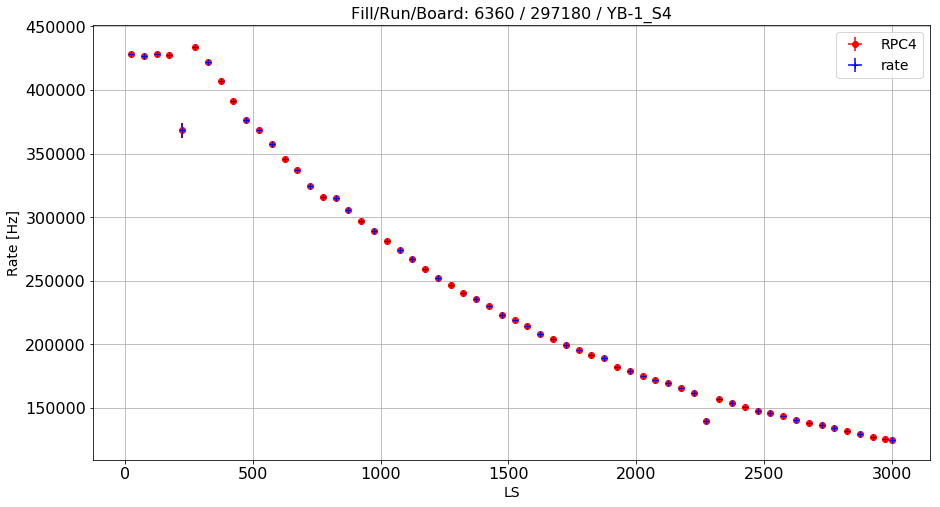

In [165]:
plot_rate_vs_ls_2(temp1, temp2, "ls", "RPC1", 0, "errRPC1", "LS", 
                "Rate [Hz]", title, "ro")
plot_rate_vs_ls_2(temp1, temp2, "ls", "RPC2", 0, "errRPC2", "LS", 
                "Rate [Hz]", title, "ro")
plot_rate_vs_ls_2(temp1, temp2, "ls", "RPC3", 0, "errRPC3", "LS", 
                "Rate [Hz]", title, "ro")
plot_rate_vs_ls_2(temp1, temp2, "ls", "RPC4", 0, "errRPC4", "LS", 
                "Rate [Hz]", title, "ro")

Checking cross-sections for some chambers:

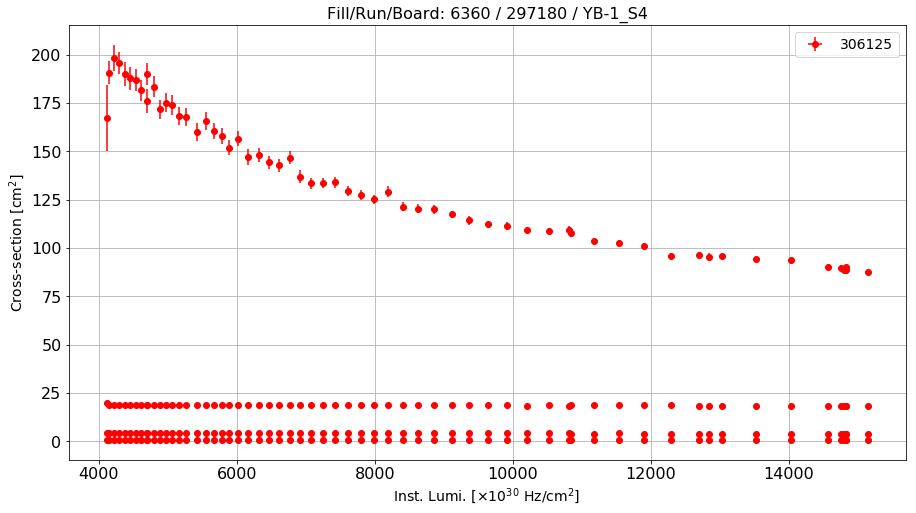

In [166]:
title = "Fill/Run/Board: "+str(int_lumi2[int_lumi2.run == 306125]["fill"].iloc[0])+\
" / "+str(boundaries["run"].iloc[3])+" / YB-1_S4"

plot_rate_vs_ls(df_rates_new_2, [306125], "lumi", "CS", "YB-1_S6", 0, "errCS",\
                r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
                "Cross-section [cm$^{2}$]", title, ["ro"], False, False)

Defining the fit ranges for all the chambers:

In [167]:
df_rates_new_2["fmin"] = 5000
df_rates_new_2["fmax"] = 15000
df_rates_new_2["slope"] = 9999
df_rates_new_2["inter"] = 9999
df_rates_new_2["err_a"] = 9999
df_rates_new_2["err_b"] = 9999
df_rates_new_2["rate_low"] = df_rates_new_2["rate"].copy()
df_rates_new_2["rate_high"] = df_rates_new_2["rate"].copy()
df_rates_new_2["rate_mid"] = df_rates_new_2["rate"].copy()

In [168]:
def set_range(df, wh, sec, st, fmin, fmax):
    rule = (df_rates_new_2.wheel == wh) &\
           (df_rates_new_2.sector == sec) &\
           (df_rates_new_2.station == st)
    indexes = df[rule].index
    for m in indexes:
        df.loc[m, "fmin"] = fmin
        df.loc[m, "fmax"] = fmax

In [169]:
set_range(df_rates_new_2, -2, 7, 3, 4000, 10000)
set_range(df_rates_new_2, -2, 10, 3, 8000, 15000)
set_range(df_rates_new_2, 0, 3, 2, 5000, 12000)
set_range(df_rates_new_2, 0, 9, 2, 5000, 10000)
set_range(df_rates_new_2, +1, 8, 1, 6000, 15000)
set_range(df_rates_new_2, +1, 8, 3, 5000, 15000)

In [170]:
def plot_scatter_2(df, arg, wheel, norm = False, show = True, fit = False, fmin = 5000, fmax = 15000):
    wheel_s = "All"
    temp = df.copy()
    if wheel != -3:
        temp = temp[(temp["wheel"] == wheel)]
        wheel_s = str(wheel)
    else:
        return 1
    
    temp = temp.groupby(['run', 'wheel', 'sector', 'system', 'station'])\
    [[arg]].mean().reset_index()
    #print temp
    
    if fit:
        for j in range(1, 13):
            for k in range(1, 5):
    
                rule = (df.wheel == wheel) & (df.sector == j) & (df.station == k) & (df.system == 1)
                rule2 = (df.lumi > df.fmin) & (df.lumi < df.fmax)
                val1 = df[rule & rule2]["lumi"]
                val2 = df[rule & rule2]["rate"]
                coeff = np.polyfit(val1, val2, 1)
                #print "Linear fit parameters:", wheel, j, k, coeff[0]

                rule = (temp.sector == j) & (temp.station == k) & (temp.system == 1)
                ind = temp[rule].index
                temp.loc[ind[0], arg] = coeff[0]
                #print temp.loc[ind[0]]
    
    mat = []
    for i in [4, 3, 2, 1]:
        rule = (temp.station == i)
        temp2 = temp[rule].sort_values(["sector"], ascending=True)
        vec = list(temp2[arg].values)
        mat.append(vec)      
        #print i, temp[rule][arg].values
    if norm:
        mat = mat/np.matrix(mat).sum()
        mat = [100*i for i in mat]
    #print mat

    plt.figure()
    
    ax = plt.gca()
    ax.set_yticklabels(["1", "2", "3", "4"])
    ax.set_yticks([3, 2, 1, 0])
    ax.set_xticklabels(["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"])
    ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])
    
    plt.xlabel("Sector")
    plt.ylabel("Station")
    title = "Wheel: "+wheel_s
    plt.title(title, loc="left")   

    im = ax.imshow(mat, interpolation="nearest")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    
    if show:
        for i in range(0,4):
            for j in range(0,12):
                if (mat[i][j] == 0):
                    ax.text(j, i, -1,\
                    ha="center", va="center", color="r")
                else:
                    text = ax.text(j, i, round(mat[i][j], 2),\
                    ha="center", va="center", color="w")
    
    plt.colorbar(im, cax=cax, ticks=[np.min(np.nan_to_num(mat)), np.max(np.nan_to_num(mat))])
    plt.show()

Checking the slope of the rate vs. inst. lumi. for each chamber during the good reference run:

In [171]:
#plot_scatter_2(df_rates_new_2[df_rates_new_2.run == 306125], "CS", -2, False, True, True)
#plot_scatter_2(df_rates_new_2[df_rates_new_2.run == 306125], "CS", -1, False, True, True)
#plot_scatter_2(df_rates_new_2[df_rates_new_2.run == 306125], "CS", 0, False, True, True)
#plot_scatter_2(df_rates_new_2[df_rates_new_2.run == 306125], "CS", +1, False, True, True)
#plot_scatter_2(df_rates_new_2[df_rates_new_2.run == 306125], "CS", +2, False, True, True)

Plotting the cross-sections for the good and anomalous runs on the same canvas:

In [172]:
def plot_ratio_vs_ls(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y, title, opt, log,\
                     fit = False, fmin = 5000, fmax = 15000):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    df_temp["ratio"] = df_temp[y_val]/df_temp[x_val]
    df_temp["errRatio"] = (1/df_temp[x_val])*\
    np.sqrt(df_temp[y_err]**2 + df_temp["errLumi"]**2*df_temp["ratio"]**2)
    inter = []
    for i in range(len(run)):
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        if ((run[i] == 306125) & fit):
            rule2 = (df_temp[x_val] > fmin) & (df_temp[x_val] < fmax)
            val1 = df_temp[rule & rule2][x_val]
            val2 = df_temp[rule & rule2]["ratio"]
            coeff = np.polyfit(val1, val2, 2)
            inter.append(coeff)
            p = np.poly1d(coeff)
            xp = np.linspace(3000, 16000, 1000)
            _ = plt.plot(xp, p(xp), '-')
        
        newstr = opt[i].replace("o", "")
        plt.errorbar(df_temp[rule][x_val], df_temp[rule]["ratio"], xerr=x_err,\
        yerr=df_temp[rule]["errRatio"], fmt=opt[i], ecolor=newstr, label=str(run[i]))
        
    print "Linear fit for the reference run:", inter[0]
    plt.legend(loc="best")
    plt.title(title)
    plt.show()

YB-2_S1_RB1
Linear correlation: (0.9999280424500434, 4.265724270381615e-88)
Linear fit parameters: [  38.94927231 6835.75861067]
Paramenters uncertainty: [7.12593311e-02 6.96588050e+02]


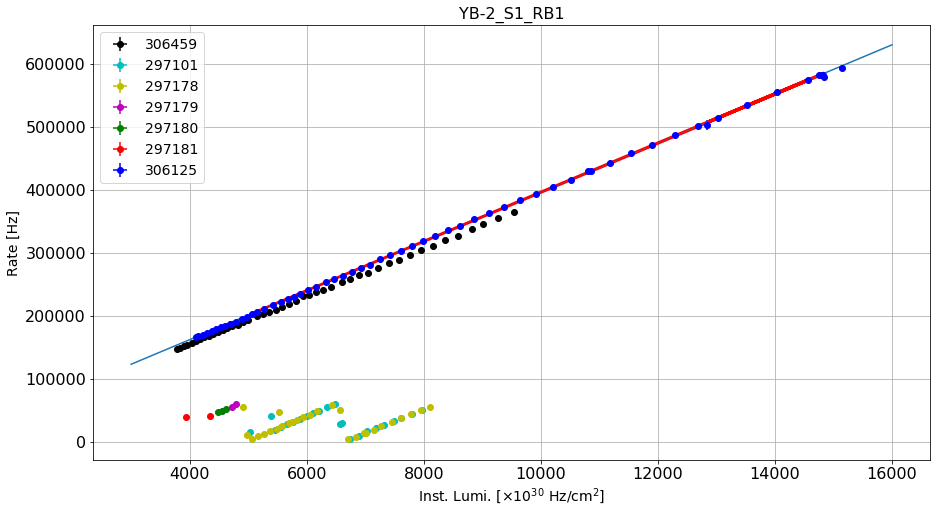

----------------------------------------------------------------------------------------------------------------
YB-2_S1_RB2
Linear correlation: (0.9998859947772686, 1.3378066742550875e-83)
Linear fit parameters: [   9.57189766 4418.29297771]
Paramenters uncertainty: [2.20433871e-02 2.15482797e+02]


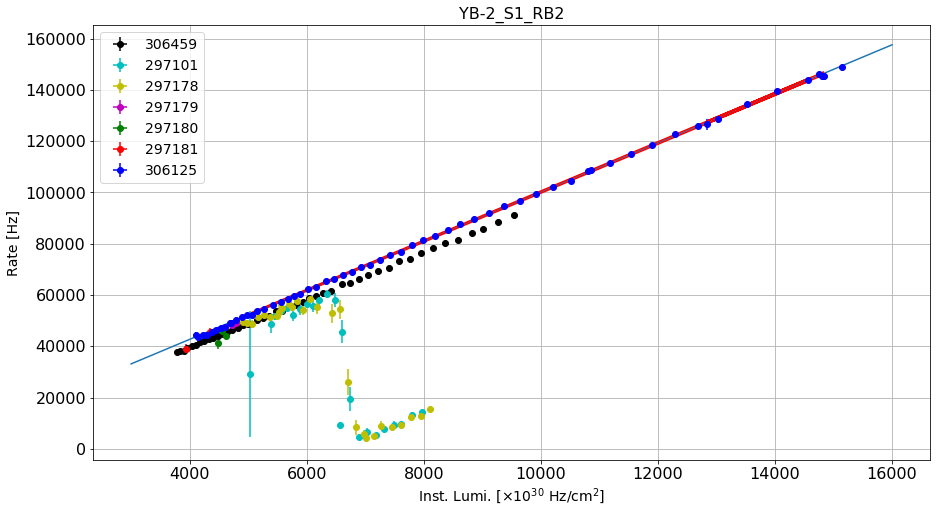

----------------------------------------------------------------------------------------------------------------
YB-2_S1_RB3
Linear correlation: (0.9788918574719393, 1.1256578745840008e-32)
Linear fit parameters: [1.05524570e+00 4.22711923e+03]
Paramenters uncertainty: [3.35985618e-02 3.28439185e+02]


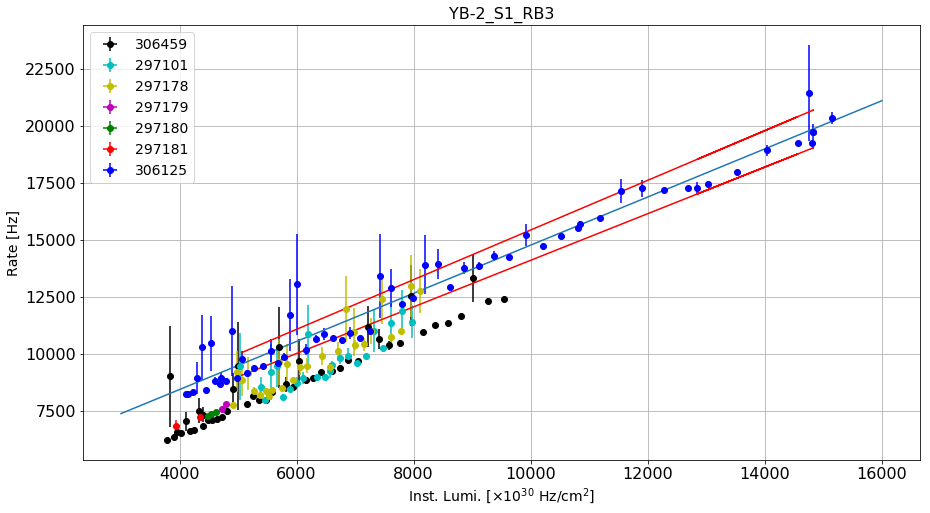

----------------------------------------------------------------------------------------------------------------
YB-2_S1_RB4
Linear correlation: (0.999956261981667, 5.824121800970413e-93)
Linear fit parameters: [  11.27517294 1713.11402539]
Paramenters uncertainty: [1.60822860e-02 1.57210684e+02]


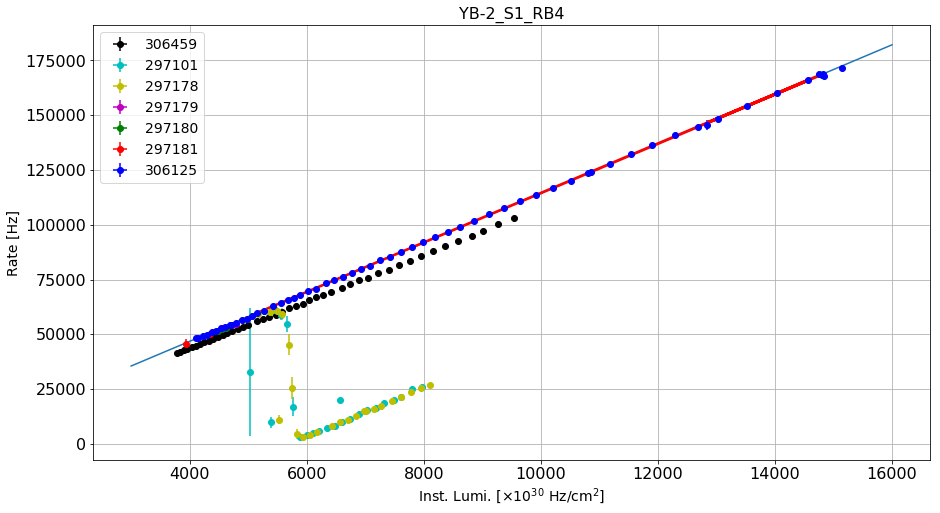

----------------------------------------------------------------------------------------------------------------
YB-2_S2_RB1
Linear correlation: (0.9999297418953309, 2.4914476706232173e-88)
Linear fit parameters: [  36.76586466 9310.32522819]
Paramenters uncertainty: [6.64655579e-02 6.49727028e+02]


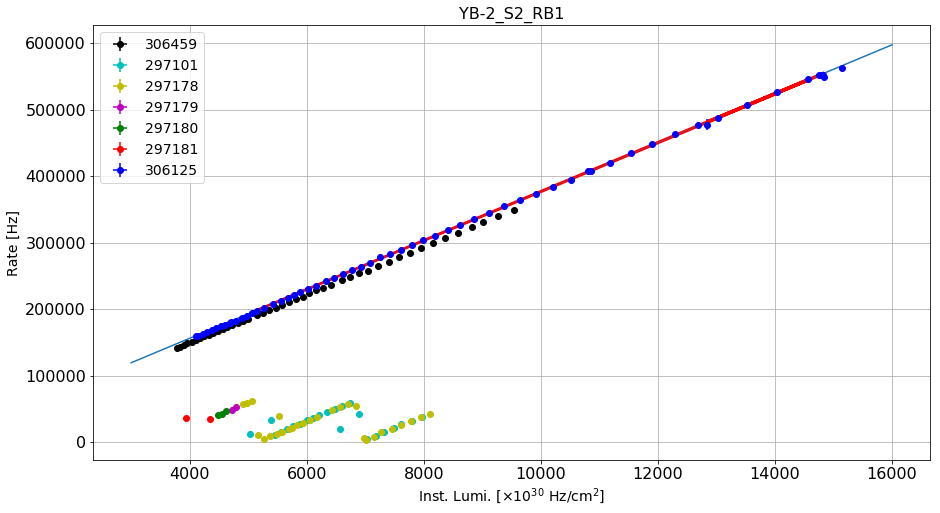

----------------------------------------------------------------------------------------------------------------
YB-2_S2_RB2
Linear correlation: (0.9064856998535443, 1.8347951577912252e-18)
Linear fit parameters: [1.07142682e+01 5.17864634e+04]
Paramenters uncertainty: [7.61067400e-01 7.43973383e+03]


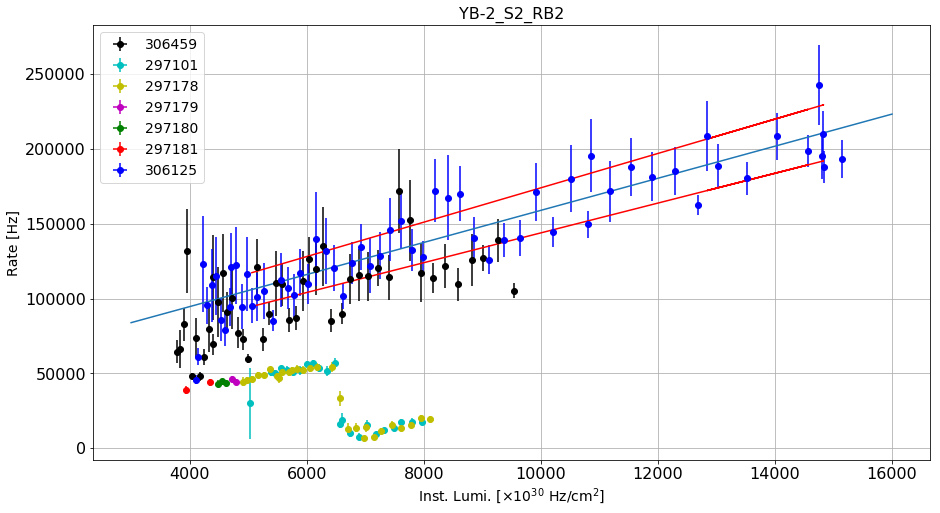

----------------------------------------------------------------------------------------------------------------
YB-2_S2_RB3
Linear correlation: (0.8919437863526939, 4.053160784062495e-17)
Linear fit parameters: [1.36810744e+00 5.57019931e+03]
Paramenters uncertainty: [1.05761470e-01 1.03386006e+03]


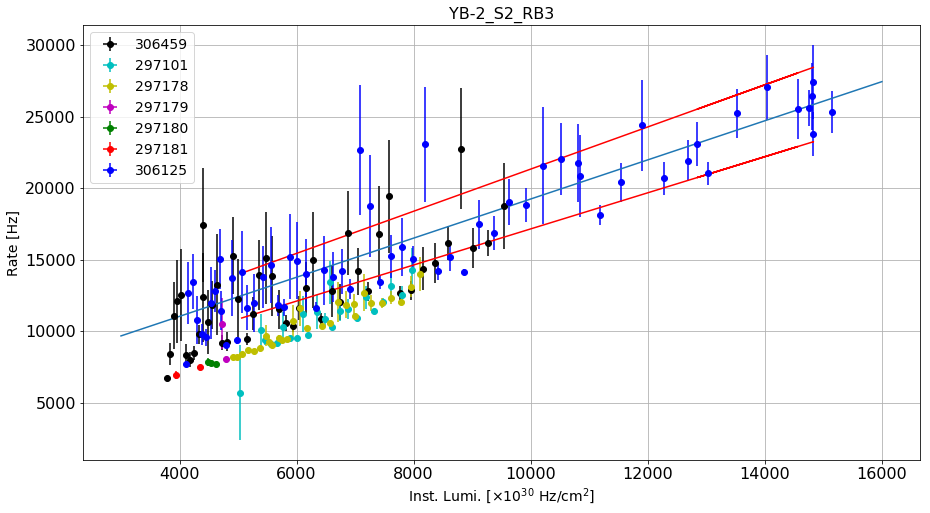

----------------------------------------------------------------------------------------------------------------
YB-2_S2_RB4
Linear correlation: (0.9999193930098356, 5.484306300826886e-87)
Linear fit parameters: [   28.48579174 22176.47122079]
Paramenters uncertainty: [5.51596719e-02 5.39207535e+02]


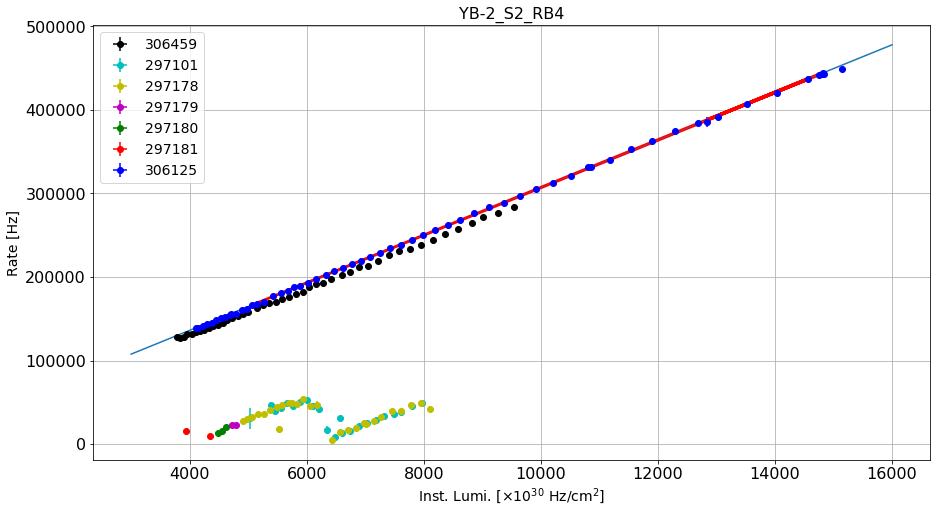

----------------------------------------------------------------------------------------------------------------
YB-2_S3_RB1
Linear correlation: (0.9999198787316516, 4.787004804070963e-87)
Linear fit parameters: [   38.58088964 16061.46598794]
Paramenters uncertainty: [7.44822888e-02 7.28093732e+02]


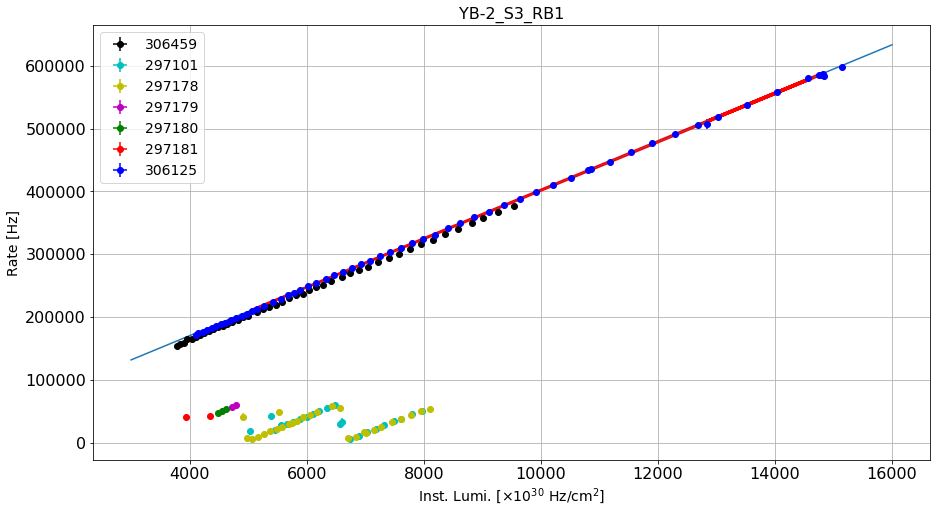

----------------------------------------------------------------------------------------------------------------
YB-2_S3_RB2
Linear correlation: (0.999882606875807, 2.5854209434975085e-83)
Linear fit parameters: [   8.75705772 4901.42516788]
Paramenters uncertainty: [2.04643782e-02 2.00047363e+02]


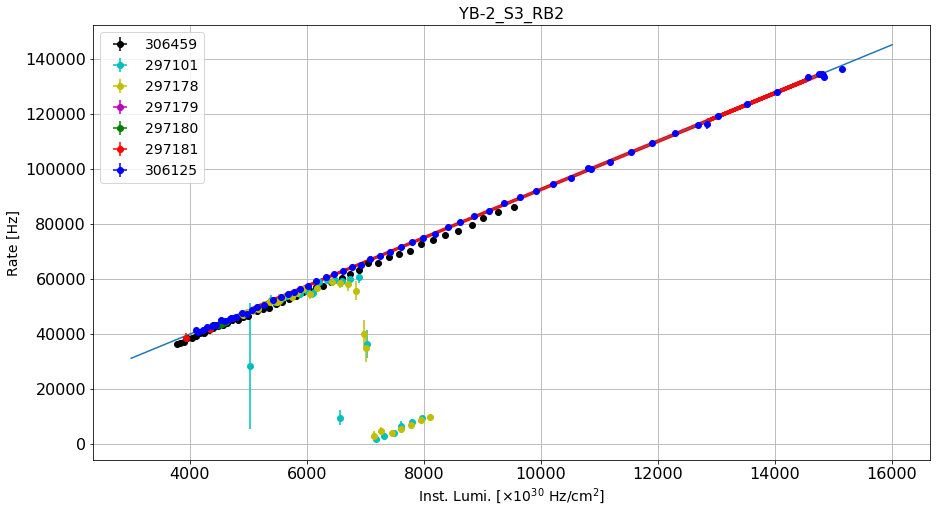

----------------------------------------------------------------------------------------------------------------
YB-2_S3_RB3
Linear correlation: (0.29408576436450096, 0.04480580927421103)
Linear fit parameters: [1.42839792e-04 9.04305059e-01]
Paramenters uncertainty: [7.07943304e-05 6.92042485e-01]


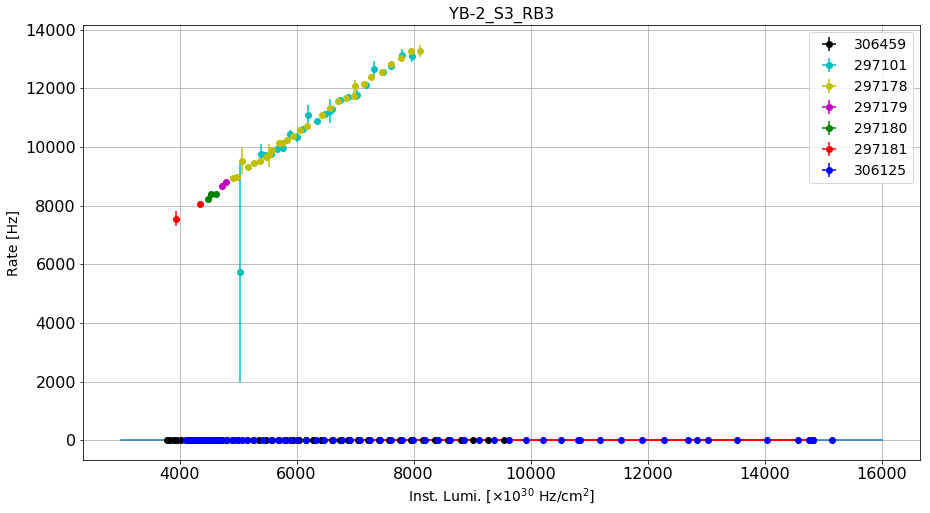

----------------------------------------------------------------------------------------------------------------
YB-2_S3_RB4
Linear correlation: (0.999906100984063, 1.7003950833079404e-85)
Linear fit parameters: [   48.0382537  39147.35482777]
Paramenters uncertainty: [1.00398931e-01 9.81439125e+02]


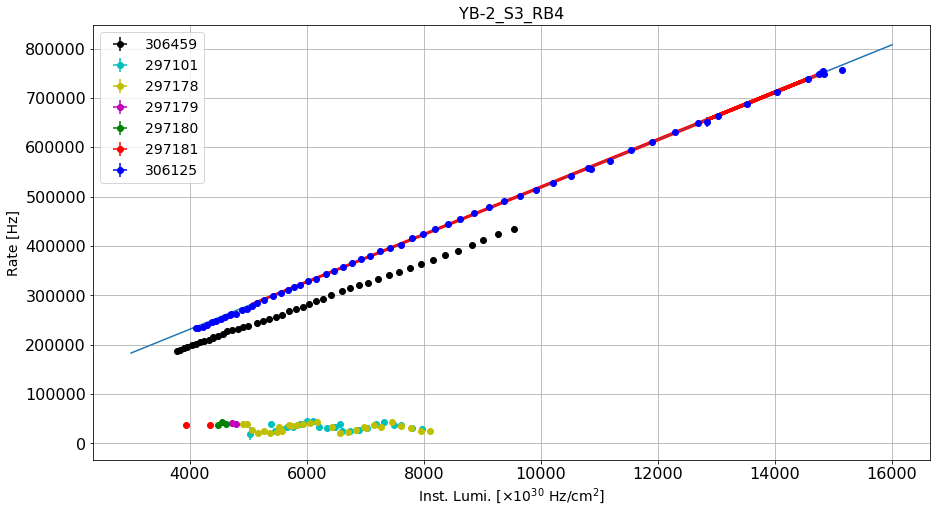

----------------------------------------------------------------------------------------------------------------
YB-2_S4_RB1
Linear correlation: (0.9966278354380442, 1.6179234218433128e-50)
Linear fit parameters: [3.82707591e+01 7.67607756e+04]
Paramenters uncertainty: [4.80510384e-01 4.69717841e+03]


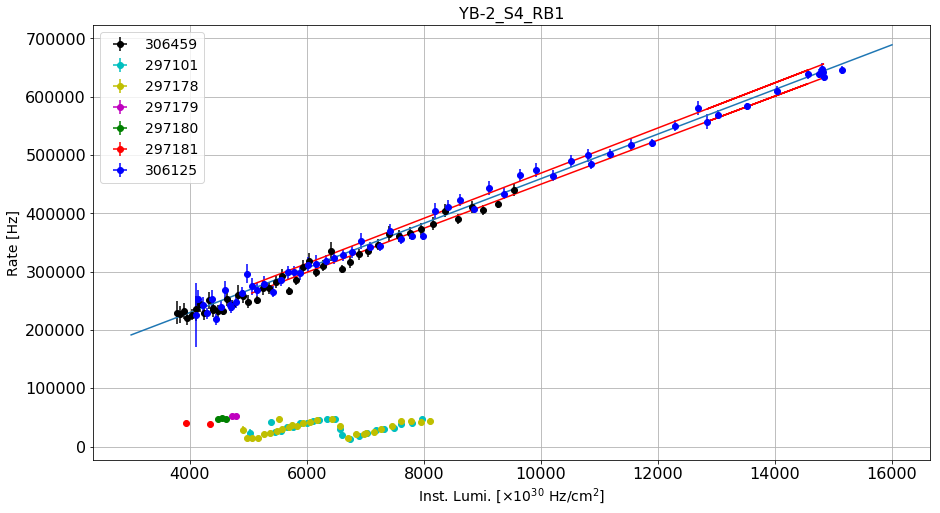

----------------------------------------------------------------------------------------------------------------
YB-2_S4_RB2
Linear correlation: (0.9999000876665441, 6.871939640477914e-85)
Linear fit parameters: [   8.48587678 4608.03692488]
Paramenters uncertainty: [1.82944597e-02 1.78835555e+02]


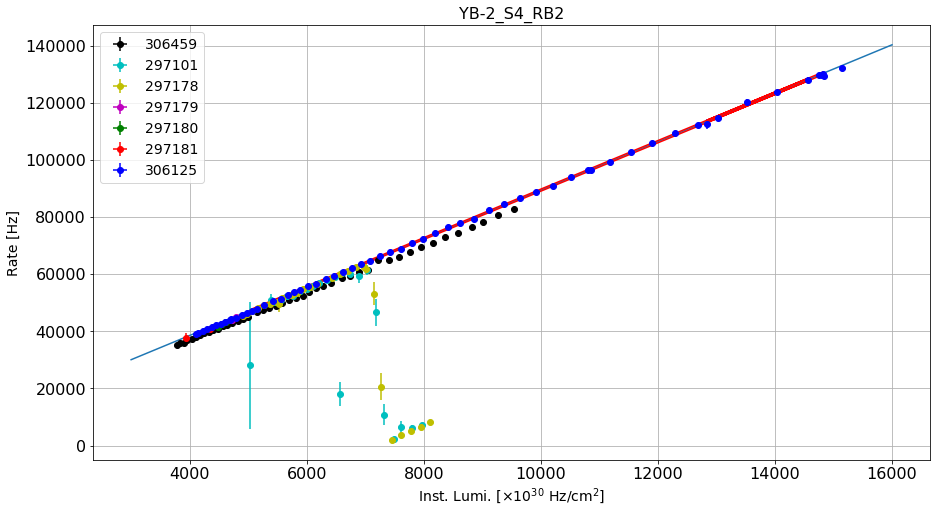

----------------------------------------------------------------------------------------------------------------
YB-2_S4_RB3
Linear correlation: (0.99836033347801, 1.481710961959764e-57)
Linear fit parameters: [1.17865947e+00 4.21161171e+03]
Paramenters uncertainty: [1.03057943e-02 1.00743202e+02]


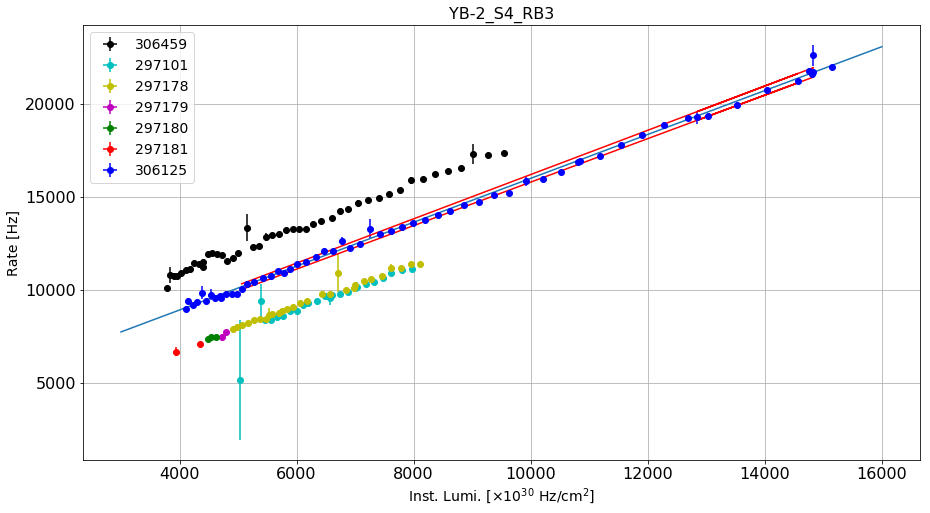

----------------------------------------------------------------------------------------------------------------
YB-2_S4_RB4
Linear correlation: (0.9999459271037449, 6.884876706081965e-91)
Linear fit parameters: [  37.67545052 8687.54679897]
Paramenters uncertainty: [5.97512030e-02 5.84091562e+02]


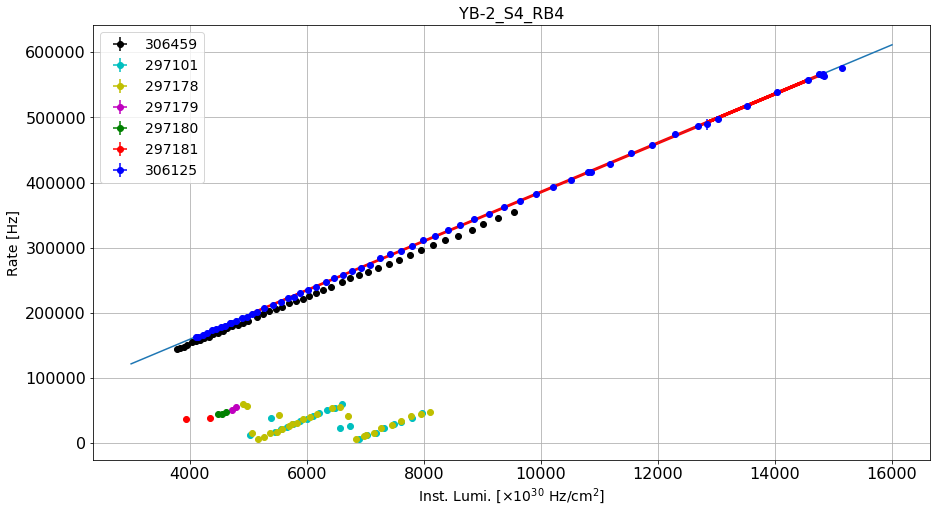

----------------------------------------------------------------------------------------------------------------
YB-2_S5_RB1
Linear correlation: (0.9998965362800601, 1.5078761328543716e-84)
Linear fit parameters: [   39.8717285  12651.01784229]
Paramenters uncertainty: [8.74729111e-02 8.55082186e+02]


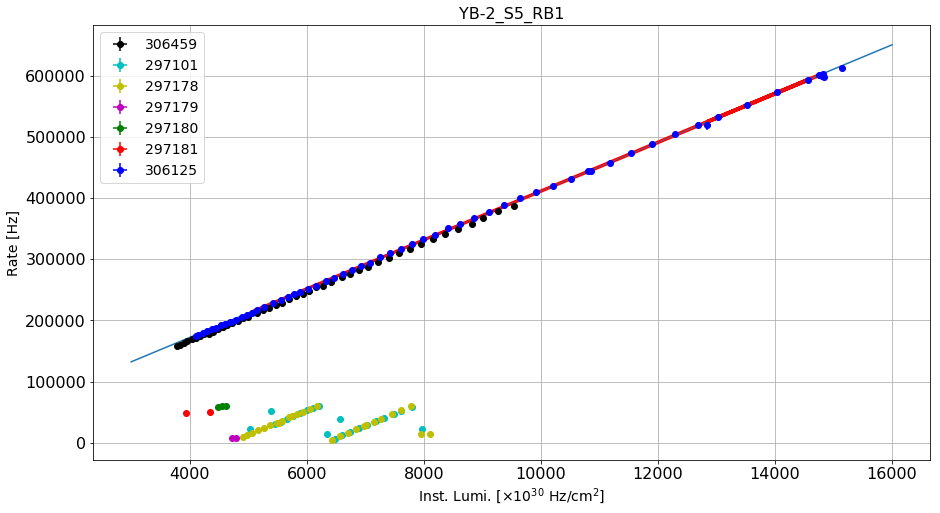

----------------------------------------------------------------------------------------------------------------
YB-2_S5_RB2
Linear correlation: (0.9998925319170483, 3.5432725220789345e-84)
Linear fit parameters: [   9.64136739 3679.56233402]
Paramenters uncertainty: [2.15572898e-02 2.10731005e+02]


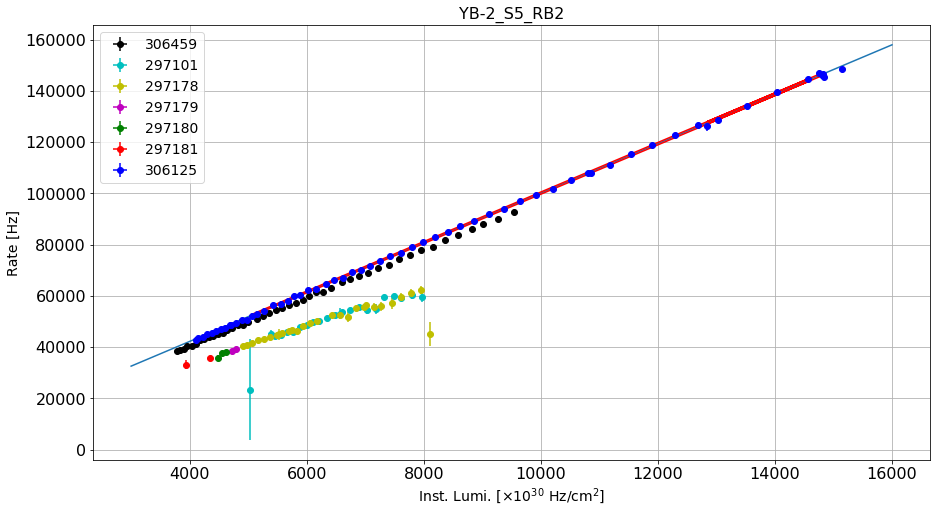

----------------------------------------------------------------------------------------------------------------
YB-2_S5_RB3
Linear correlation: (0.9984754078209874, 2.8856045048110712e-58)
Linear fit parameters: [1.42288973e+00 5.54627916e+03]
Paramenters uncertainty: [1.19957081e-02 1.17262775e+02]


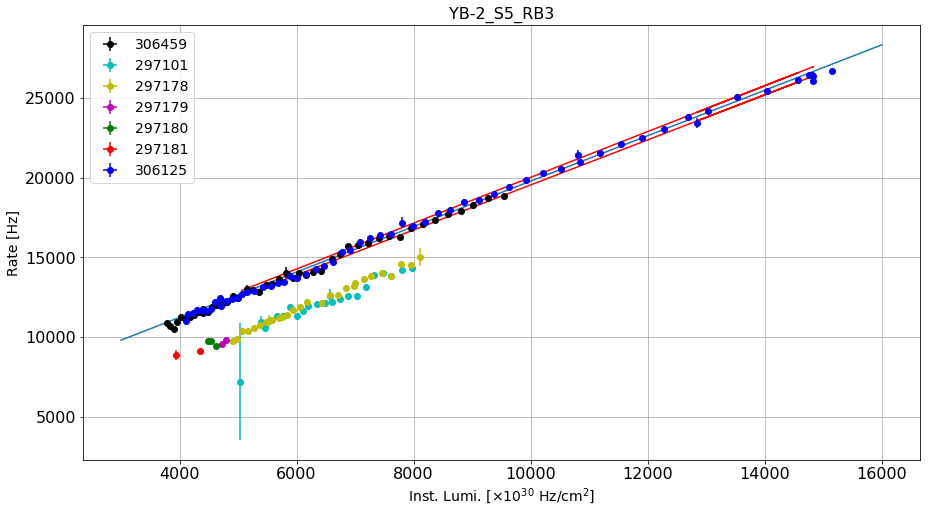

----------------------------------------------------------------------------------------------------------------
YB-2_S5_RB4
Linear correlation: (0.9854562751438641, 2.7610167126987e-36)
Linear fit parameters: [8.57488392e+00 4.13917498e+04]
Paramenters uncertainty: [2.25488632e-01 2.20424026e+03]


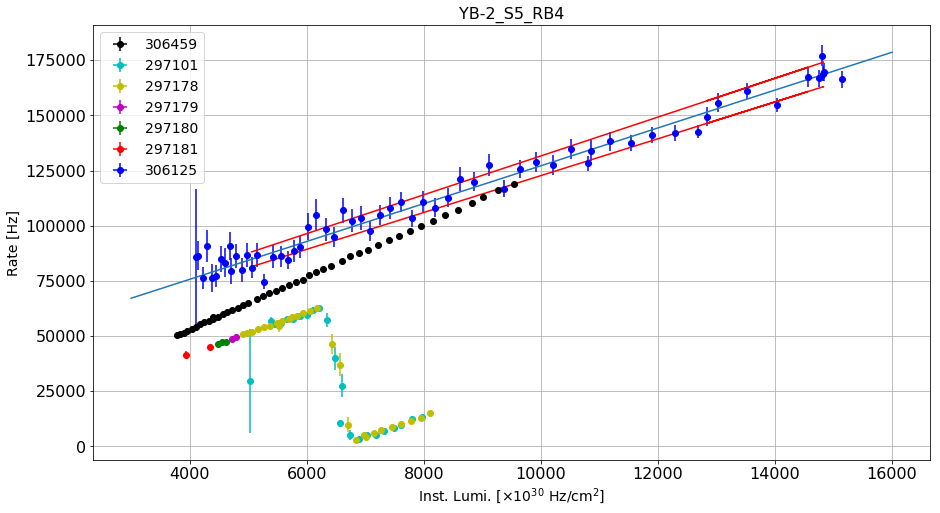

----------------------------------------------------------------------------------------------------------------
YB-2_S6_RB1
Linear correlation: (0.999929220499156, 2.9423776890797274e-88)
Linear fit parameters: [  40.58087687 9082.58300298]
Paramenters uncertainty: [7.36341029e-02 7.19802381e+02]


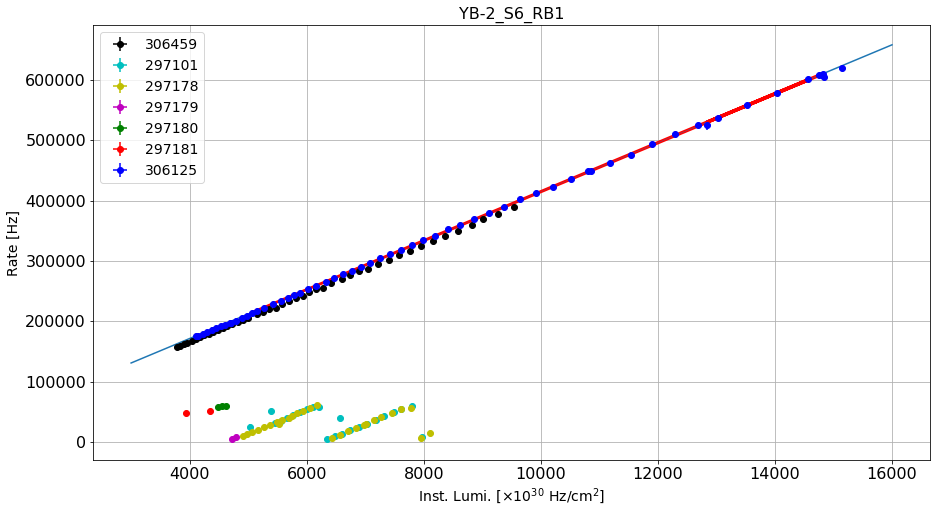

----------------------------------------------------------------------------------------------------------------
YB-2_S6_RB2
Linear correlation: (0.9998609913563465, 1.1585516525299778e-81)
Linear fit parameters: [   9.15444769 4811.50285218]
Paramenters uncertainty: [2.32797924e-02 2.27569146e+02]


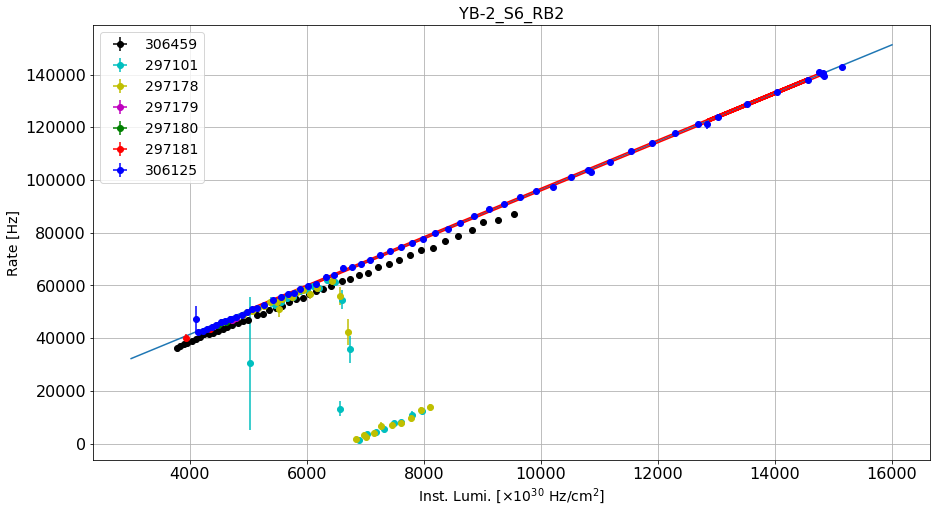

----------------------------------------------------------------------------------------------------------------
YB-2_S6_RB3
Linear correlation: (0.990197743041573, 4.045923689156008e-40)
Linear fit parameters: [1.26436647e+00 1.98466050e+03]
Paramenters uncertainty: [2.71974361e-02 2.65865658e+02]


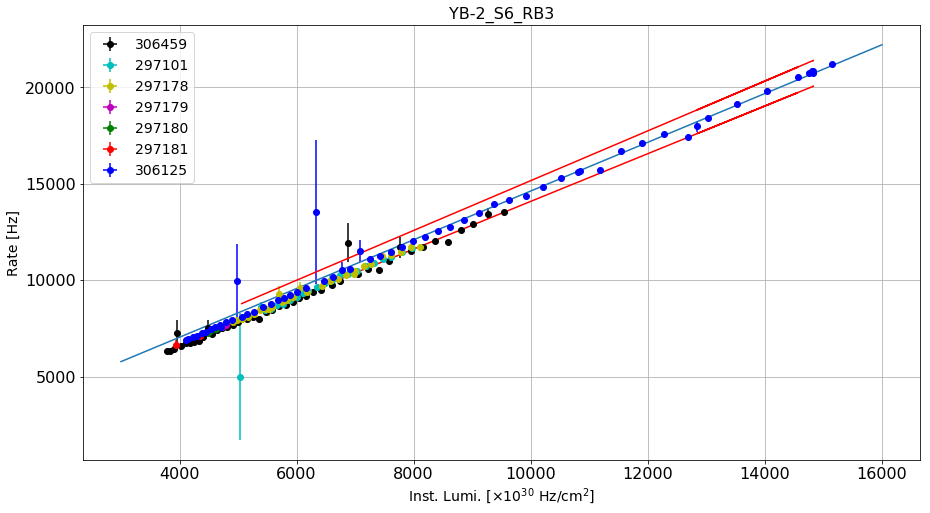

----------------------------------------------------------------------------------------------------------------
YB-2_S6_RB4
Linear correlation: (0.995136963779025, 6.022167651254137e-47)
Linear fit parameters: [2.90377981e+01 3.05187613e+04]
Paramenters uncertainty: [4.38315374e-01 4.28470556e+03]


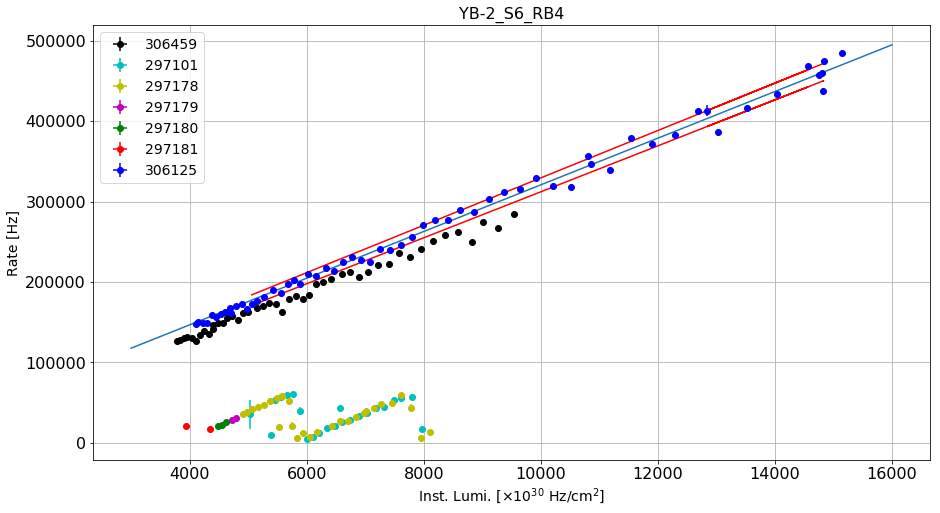

----------------------------------------------------------------------------------------------------------------
YB-2_S7_RB1
Linear correlation: (0.9924107672346822, 1.3078711996798568e-42)
Linear fit parameters: [   41.28306707 10425.91194225]
Paramenters uncertainty: [7.80071904e-01 7.62551035e+03]


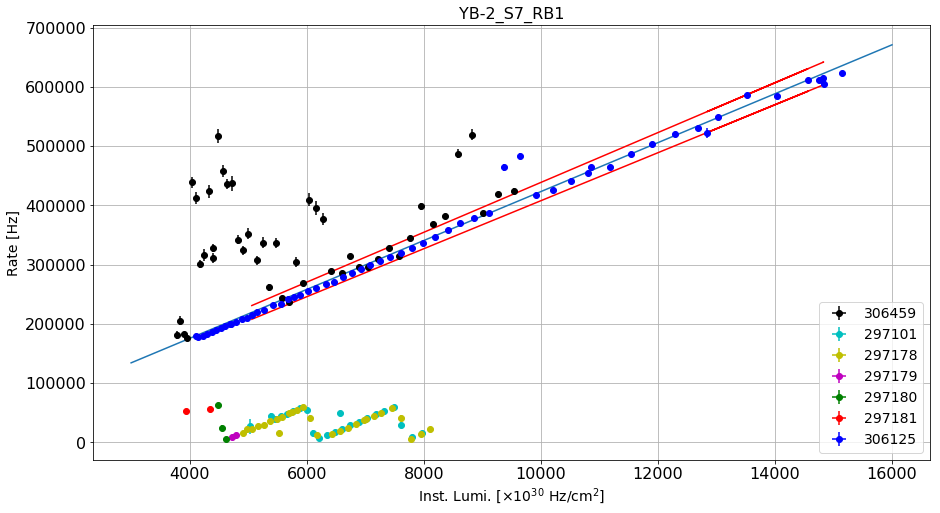

----------------------------------------------------------------------------------------------------------------
YB-2_S7_RB2
Linear correlation: (0.9998883809166799, 8.312130778420734e-84)
Linear fit parameters: [   8.73477253 5928.31343291]
Paramenters uncertainty: [1.99038896e-02 1.94568366e+02]


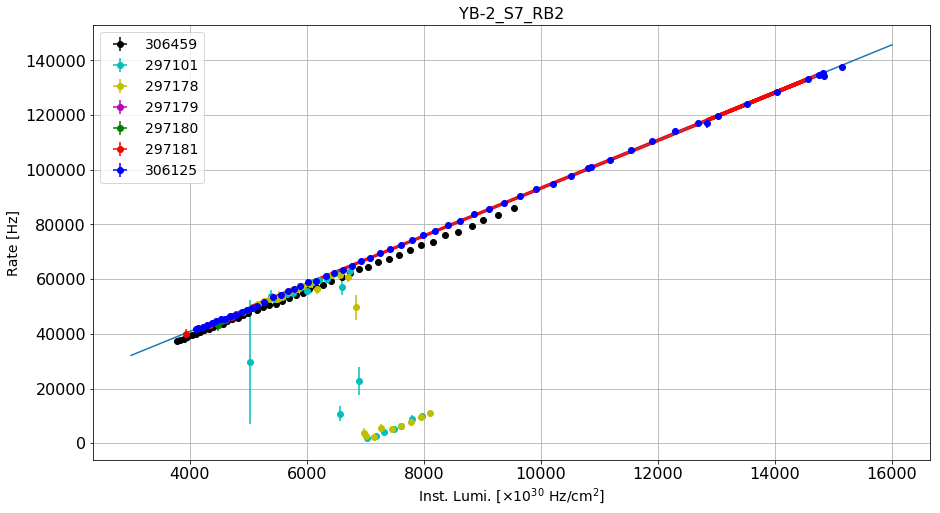

----------------------------------------------------------------------------------------------------------------
YB-2_S7_RB3
Linear correlation: (0.20332317954829326, 0.19654494442869858)
Linear fit parameters: [9.30386515e-01 1.03024894e+04]
Paramenters uncertainty: [7.26803396e-01 4.75063678e+03]


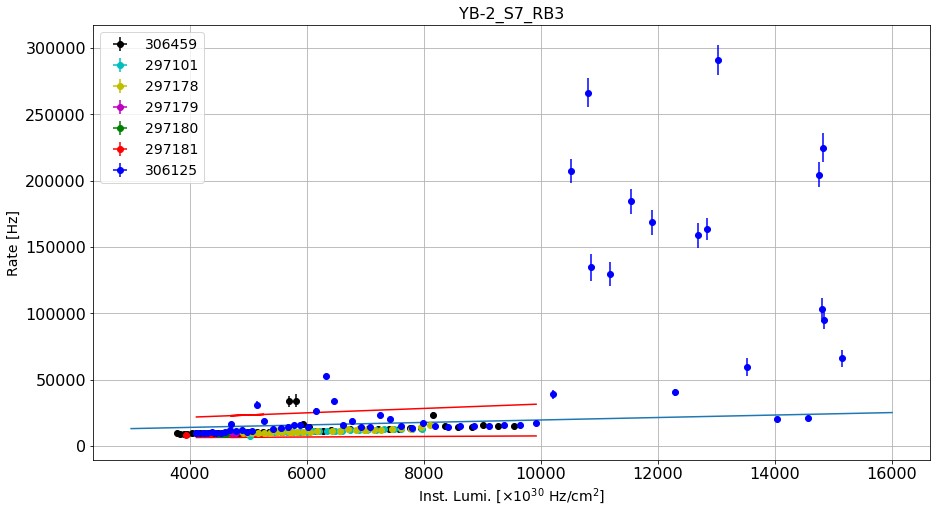

----------------------------------------------------------------------------------------------------------------
YB-2_S7_RB4
Linear correlation: (0.9999577950679356, 2.6096341392917433e-93)
Linear fit parameters: [  22.31771893 3947.90520237]
Paramenters uncertainty: [3.12698591e-02 3.05675198e+02]


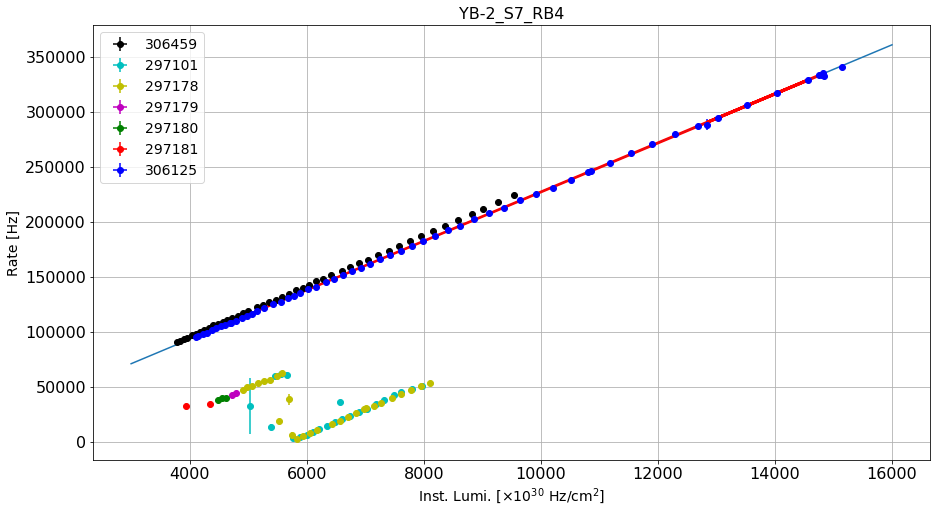

----------------------------------------------------------------------------------------------------------------
YB-2_S8_RB1
Linear correlation: (0.9993833269332276, 4.1646289253750955e-67)
Linear fit parameters: [   32.63886933 16036.54515046]
Paramenters uncertainty: [1.74881674e-01 1.70953730e+03]


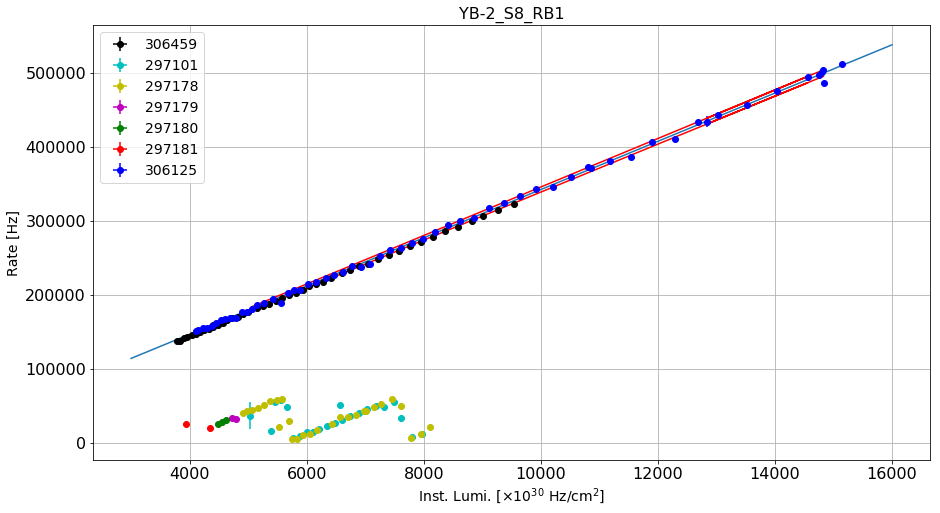

----------------------------------------------------------------------------------------------------------------
YB-2_S8_RB2
Linear correlation: (0.9998764622502168, 8.14773461485913e-83)
Linear fit parameters: [   9.82134236 8107.75789801]
Paramenters uncertainty: [2.35446211e-02 2.30157952e+02]


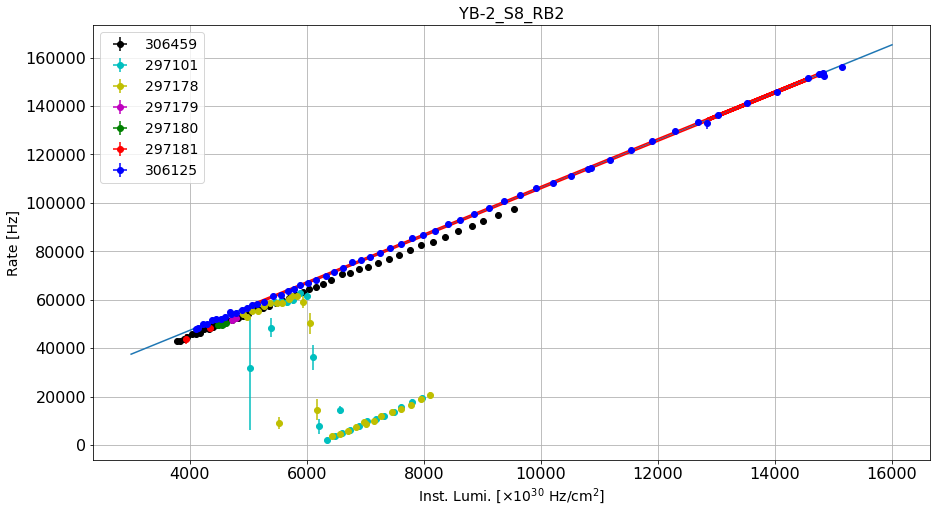

----------------------------------------------------------------------------------------------------------------
YB-2_S8_RB3
Linear correlation: (0.9832970774453962, 6.081011856530638e-35)
Linear fit parameters: [1.10189462e+00 4.59249817e+03]
Paramenters uncertainty: [3.11036391e-02 3.04050333e+02]


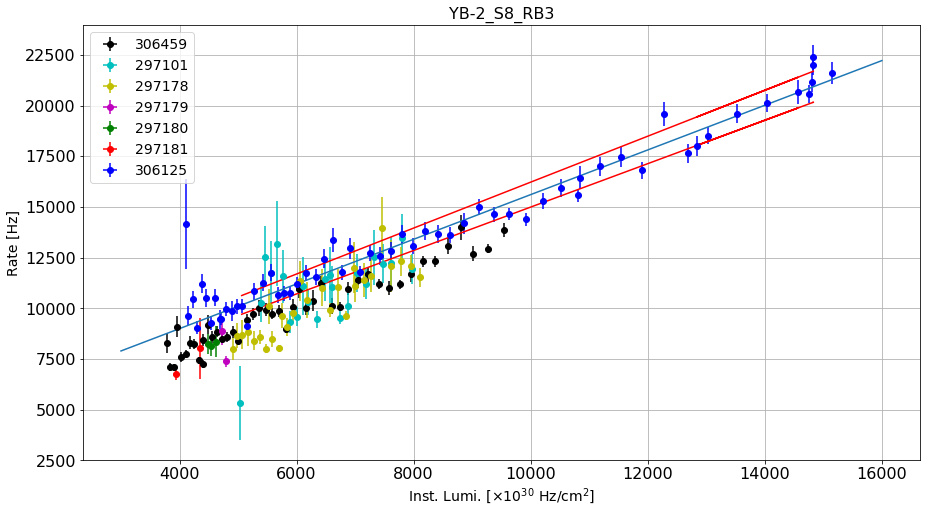

----------------------------------------------------------------------------------------------------------------
YB-2_S8_RB4
Linear correlation: (0.9999608772216452, 4.7379370359515524e-94)
Linear fit parameters: [  10.13491292 4578.81750179]
Paramenters uncertainty: [1.36718845e-02 1.33648060e+02]


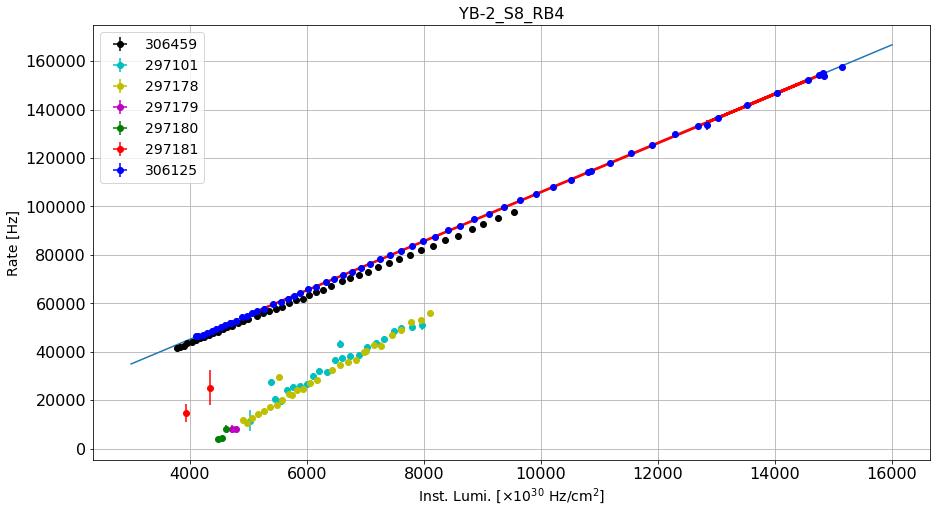

----------------------------------------------------------------------------------------------------------------
YB-2_S9_RB1
Linear correlation: (0.9946652614960729, 4.811340405473606e-46)
Linear fit parameters: [   35.39643108 34482.69934599]
Paramenters uncertainty: [5.59809001e-01 5.47235365e+03]


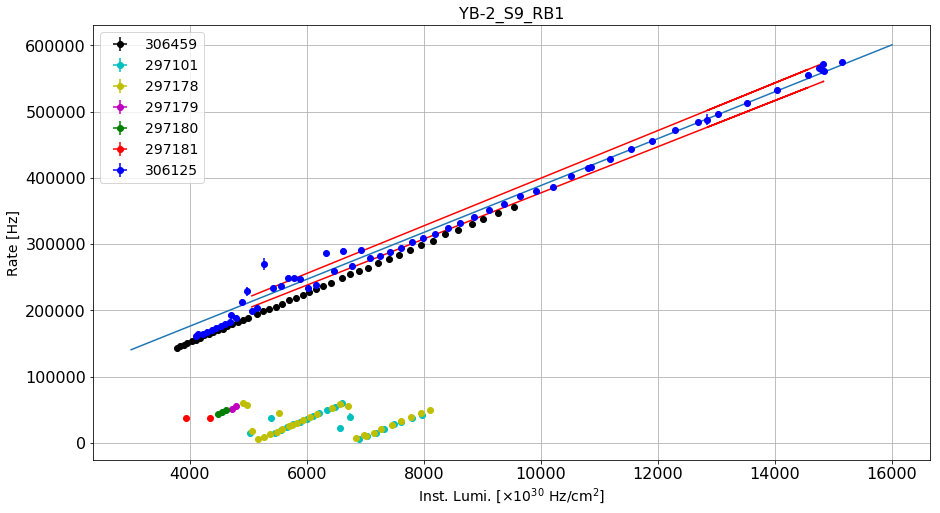

----------------------------------------------------------------------------------------------------------------
YB-2_S9_RB2
Linear correlation: (0.9997023297365873, 3.190165001859544e-74)
Linear fit parameters: [   8.44300869 3445.30298969]
Paramenters uncertainty: [3.14226426e-02 3.07168718e+02]


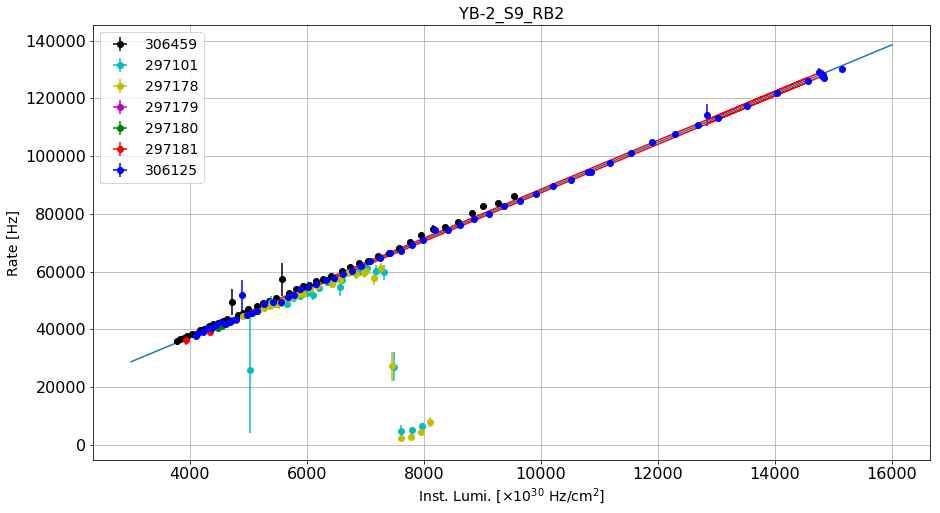

----------------------------------------------------------------------------------------------------------------
YB-2_S9_RB3
Linear correlation: (0.999380880284377, 4.552579806645746e-67)
Linear fit parameters: [6.54519139e-01 2.41902626e+03]
Paramenters uncertainty: [3.51392243e-03 3.43499769e+01]


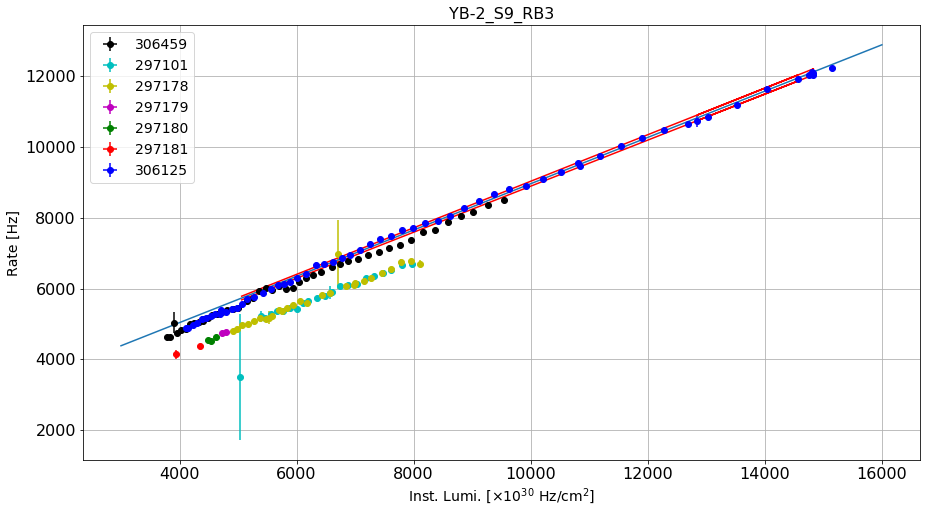

----------------------------------------------------------------------------------------------------------------
YB-2_S9_RB4
Linear correlation: (0.998915660149694, 1.3566564056643091e-61)
Linear fit parameters: [1.44193915e+00 2.78165794e+03]
Paramenters uncertainty: [1.02485832e-02 1.00183940e+02]


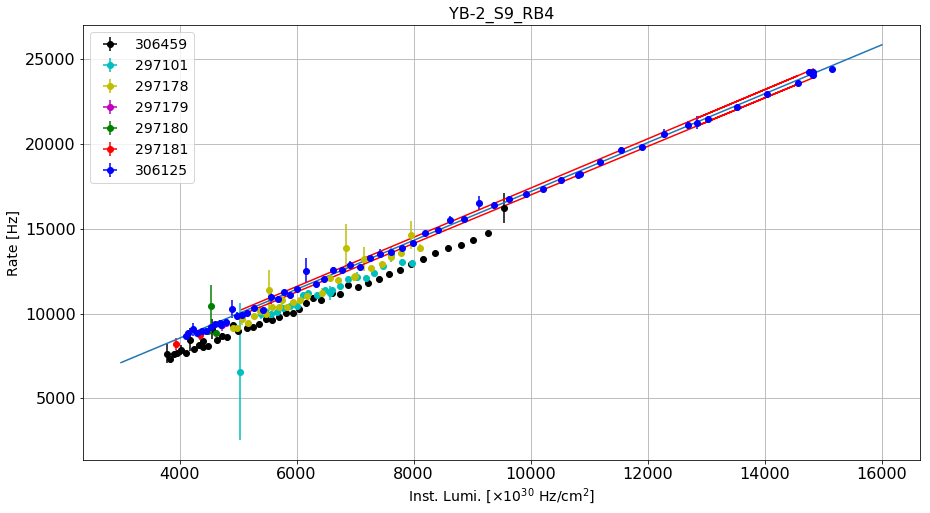

----------------------------------------------------------------------------------------------------------------
YB-2_S10_RB1
Linear correlation: (0.9999299867963445, 2.3032022737956534e-88)
Linear fit parameters: [  29.10090661 7146.47656829]
Paramenters uncertainty: [5.25170194e-02 5.13374566e+02]


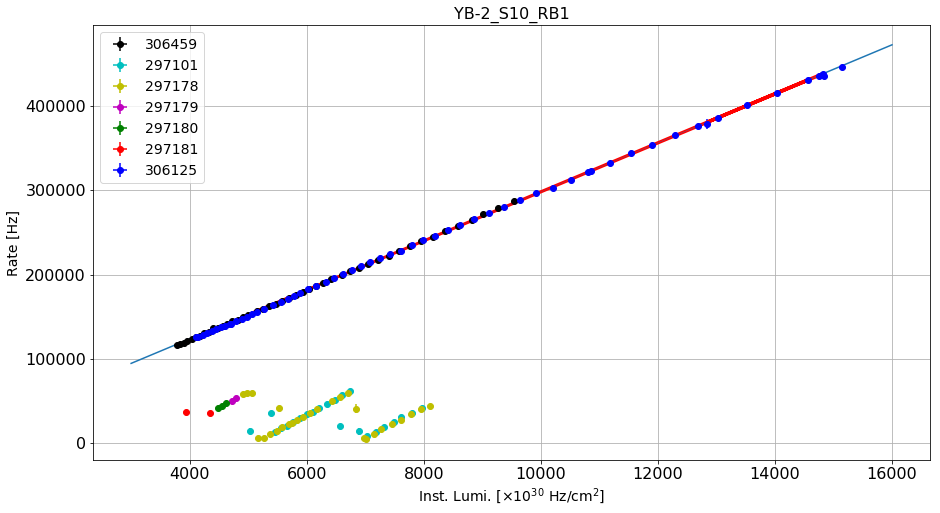

----------------------------------------------------------------------------------------------------------------
YB-2_S10_RB2
Linear correlation: (0.9986143849722153, 3.3640205603767335e-59)
Linear fit parameters: [   8.52102254 5573.29504016]
Paramenters uncertainty: [6.84771166e-02 6.69390807e+02]


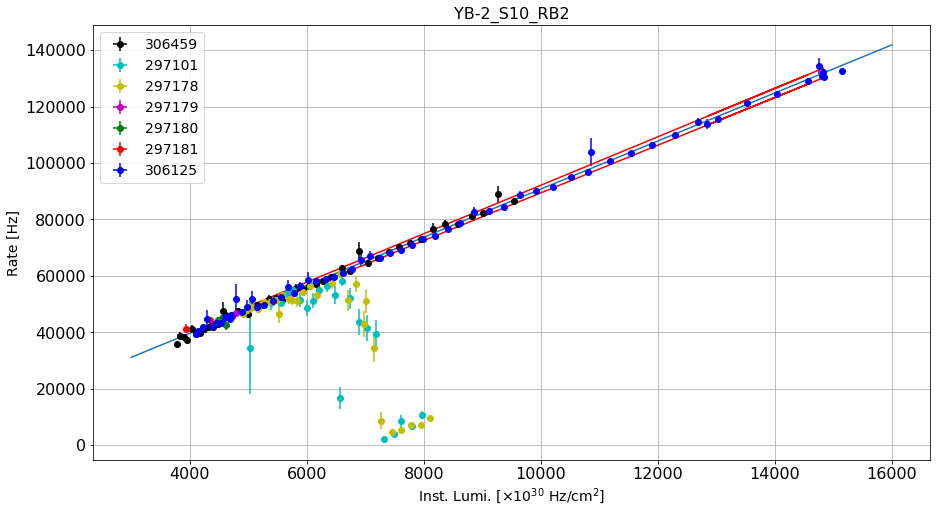

----------------------------------------------------------------------------------------------------------------
YB-2_S10_RB3
Linear correlation: (0.6772155017723274, 0.00014475009628579812)
Linear fit parameters: [3.27020327e-01 3.78659323e+03]
Paramenters uncertainty: [7.57508107e-02 8.93414512e+02]


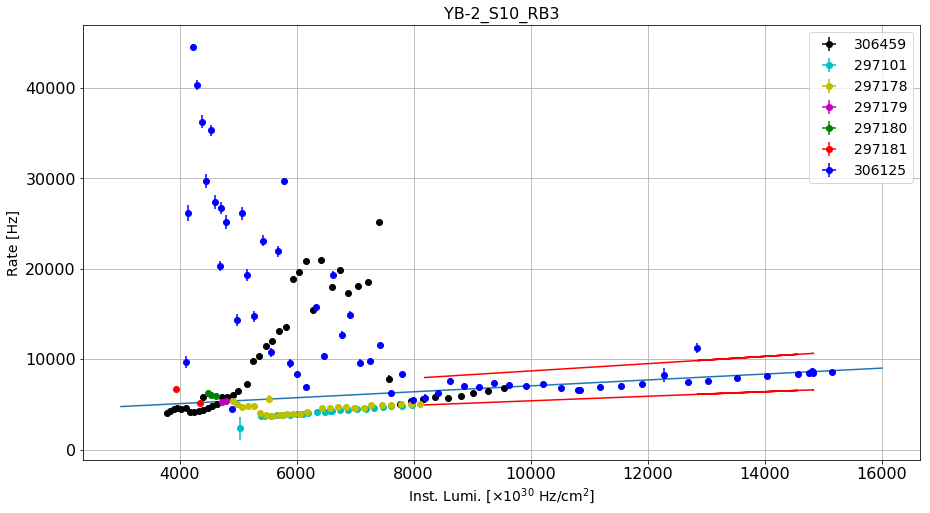

----------------------------------------------------------------------------------------------------------------
YB-2_S10_RB4
Linear correlation: (0.9991553494144652, 4.926679422831984e-64)
Linear fit parameters: [1.57329941e+00 3.15881693e+03]
Paramenters uncertainty: [9.86747308e-03 9.64584389e+01]


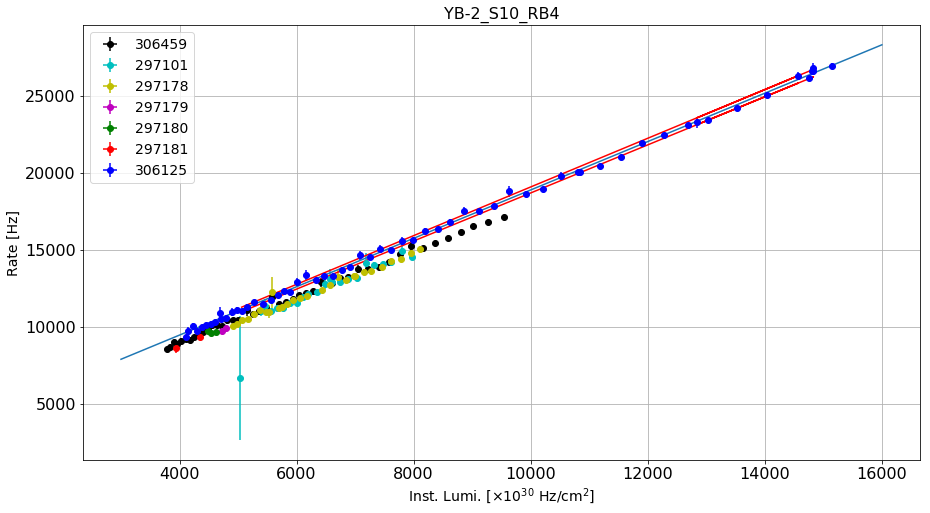

----------------------------------------------------------------------------------------------------------------
YB-2_S11_RB1
Linear correlation: (0.9998010379602104, 3.6943395905412956e-78)
Linear fit parameters: [   36.82742546 11089.15035605]
Paramenters uncertainty: [1.12047470e-01 1.09530819e+03]


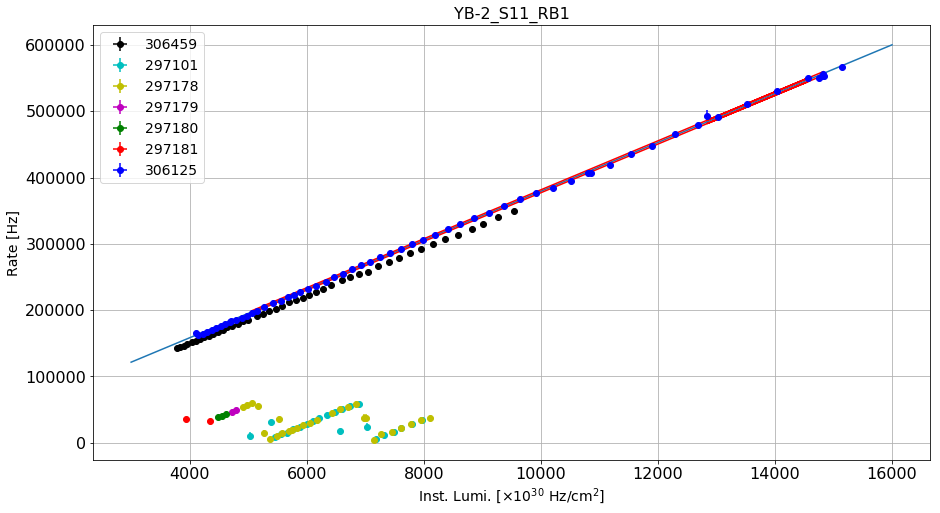

----------------------------------------------------------------------------------------------------------------
YB-2_S11_RB2
Linear correlation: (0.9999419755833087, 3.365731050662036e-90)
Linear fit parameters: [   8.95848647 5518.27623821]
Paramenters uncertainty: [1.47176918e-02 1.43871239e+02]


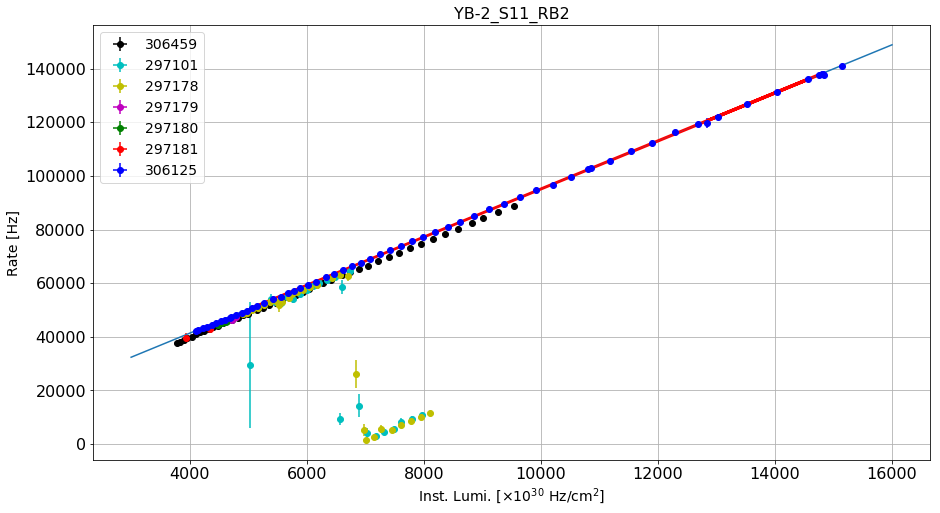

----------------------------------------------------------------------------------------------------------------
YB-2_S11_RB3
Linear correlation: (0.28323202939733777, 0.053710666445307045)
Linear fit parameters: [9.53199719e-01 2.11109291e+04]
Paramenters uncertainty: [4.92208608e-01 4.81153316e+03]


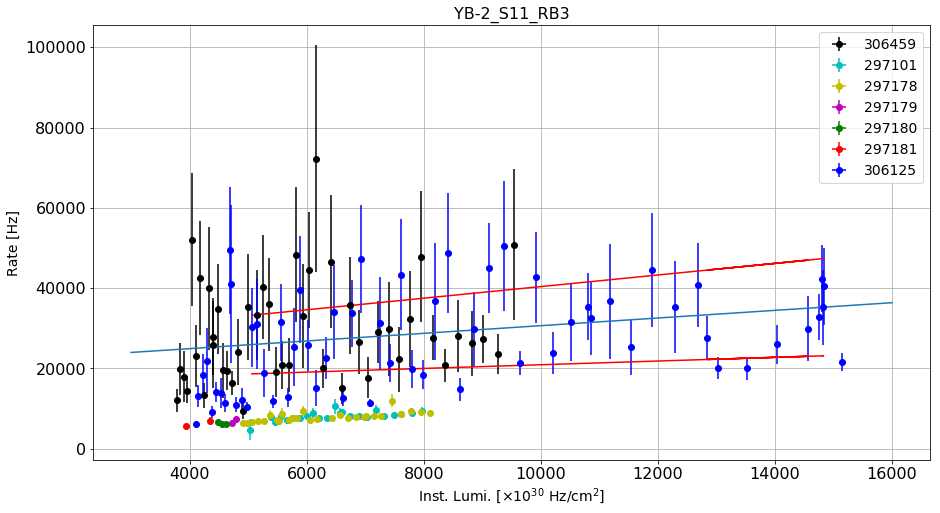

----------------------------------------------------------------------------------------------------------------
YB-2_S11_RB4
Linear correlation: (0.999328454634417, 2.8332793999751056e-66)
Linear fit parameters: [   1.29619647 1192.70743248]
Paramenters uncertainty: [7.24783176e-03 7.08504124e+01]


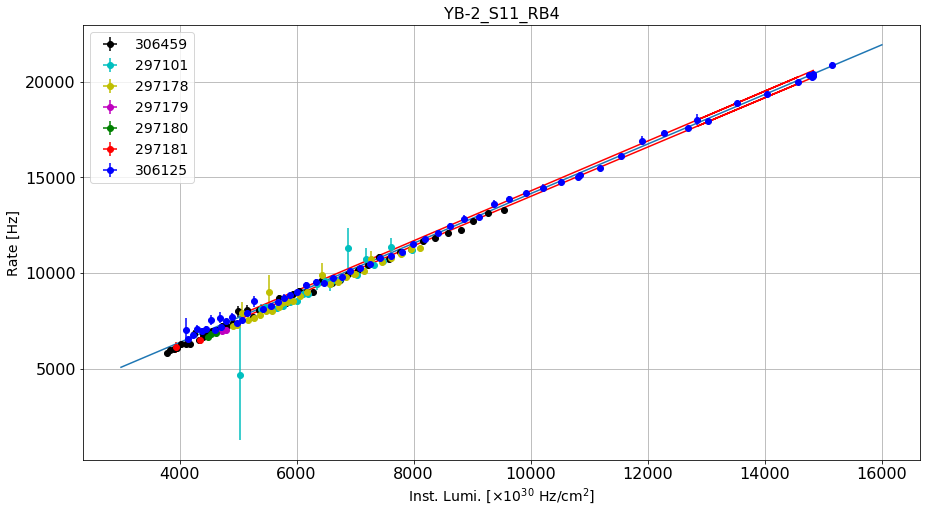

----------------------------------------------------------------------------------------------------------------
YB-2_S12_RB1
Linear correlation: (0.9997445078830622, 1.0255288891602093e-75)
Linear fit parameters: [   38.72824527 29498.37804306]
Paramenters uncertainty: [1.33530530e-01 1.30531357e+03]


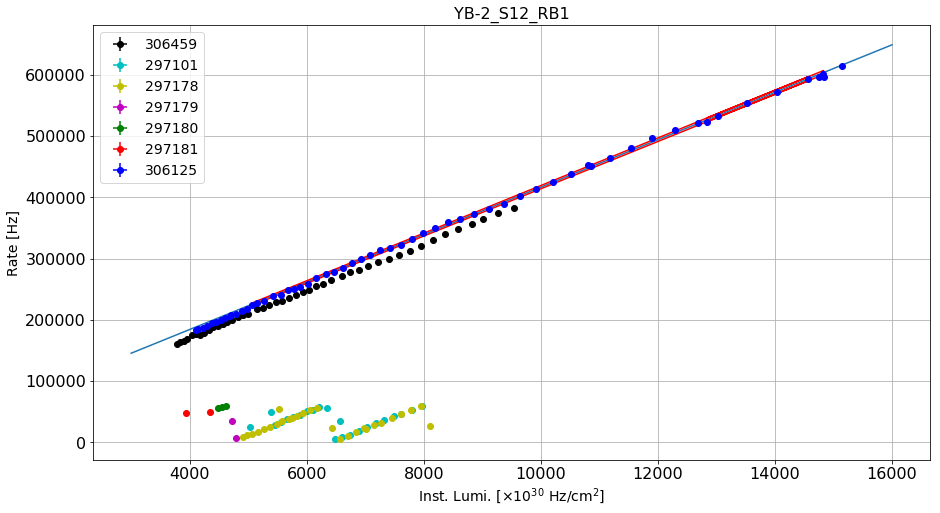

----------------------------------------------------------------------------------------------------------------
YB-2_S12_RB2
Linear correlation: (0.999951064000295, 7.286481584996281e-92)
Linear fit parameters: [   9.17894099 4009.61386024]
Paramenters uncertainty: [1.38485250e-02 1.35374791e+02]


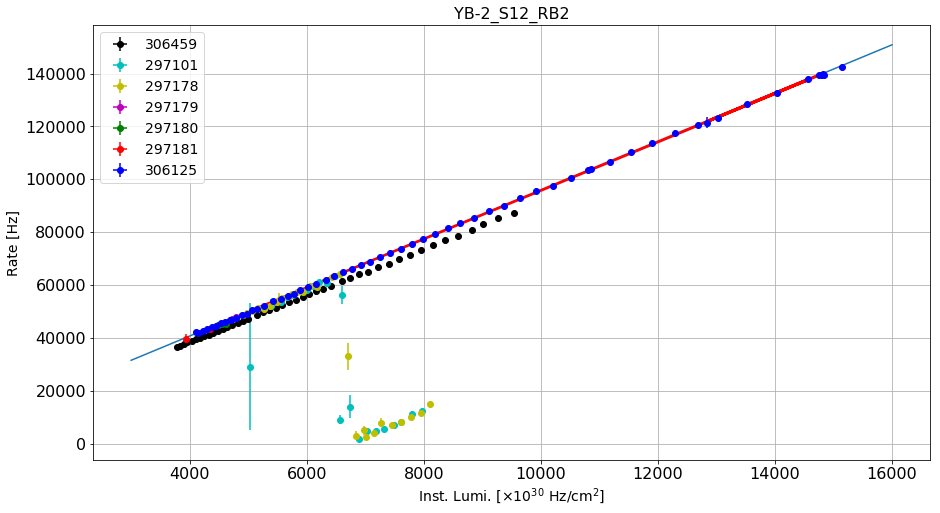

----------------------------------------------------------------------------------------------------------------
YB-2_S12_RB3
Linear correlation: (0.9918638776193512, 6.223754853739829e-42)
Linear fit parameters: [2.02347281e-01 2.40729204e+03]
Paramenters uncertainty: [3.96049652e-03 3.87154146e+01]


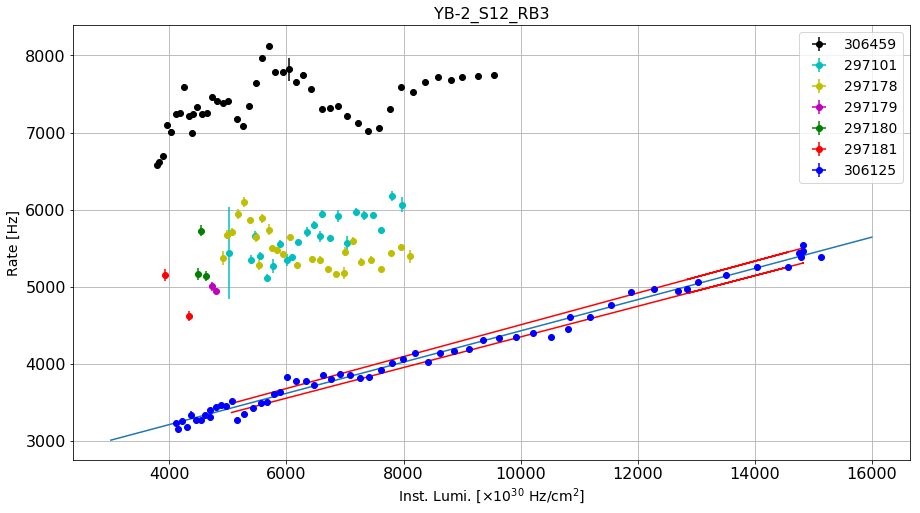

----------------------------------------------------------------------------------------------------------------
YB-2_S12_RB4
Linear correlation: (0.99996542849527, 2.9315883219570397e-95)
Linear fit parameters: [  15.25295021 5246.01987324]
Paramenters uncertainty: [1.93421624e-02 1.89077261e+02]


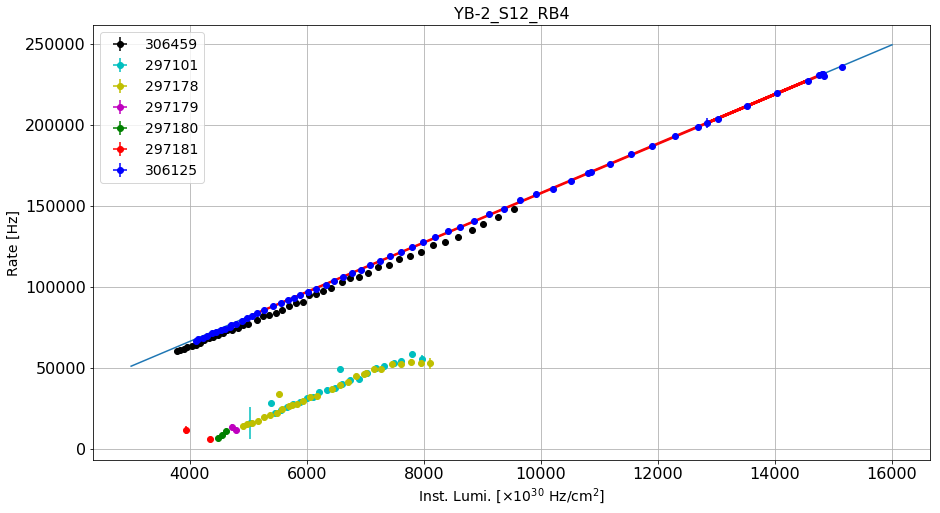

----------------------------------------------------------------------------------------------------------------
YB-1_S1_RB1
Linear correlation: (0.9999263000336389, 7.307700347122783e-88)
Linear fit parameters: [  15.929304   2499.88427102]
Paramenters uncertainty: [2.94941050e-02 2.88316502e+02]


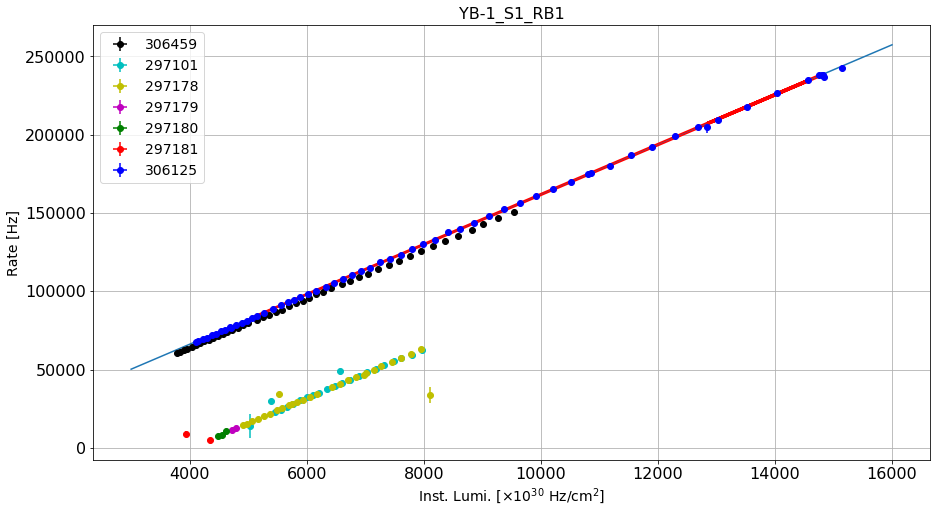

----------------------------------------------------------------------------------------------------------------
YB-1_S1_RB2
Linear correlation: (0.9992248177204208, 7.148530794984498e-65)
Linear fit parameters: [   3.54698536 3310.27077982]
Paramenters uncertainty: [2.13105516e-02 2.08319042e+02]


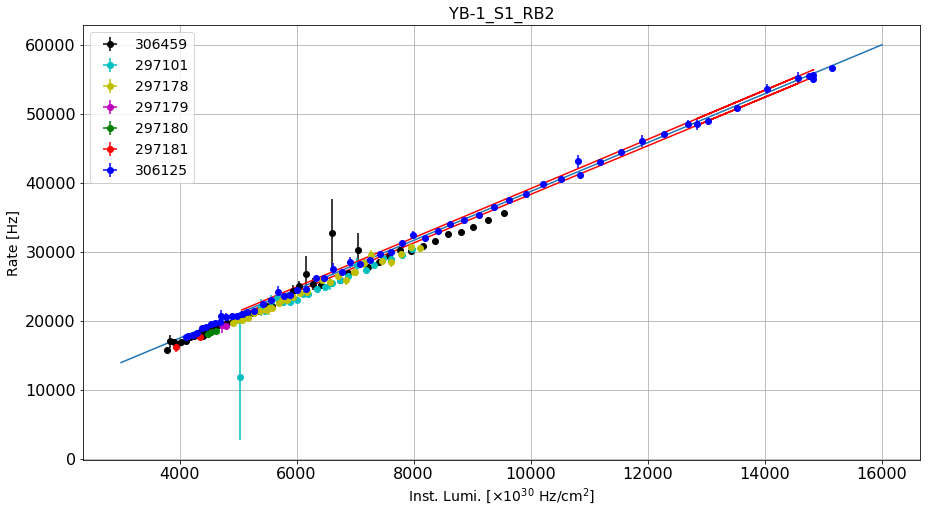

----------------------------------------------------------------------------------------------------------------
YB-1_S1_RB3
Linear correlation: (0.4216227918882794, 0.0031609984889597945)
Linear fit parameters: [4.21183511e-04 8.59423558e-01]
Paramenters uncertainty: [1.38137257e-04 1.35034614e+00]


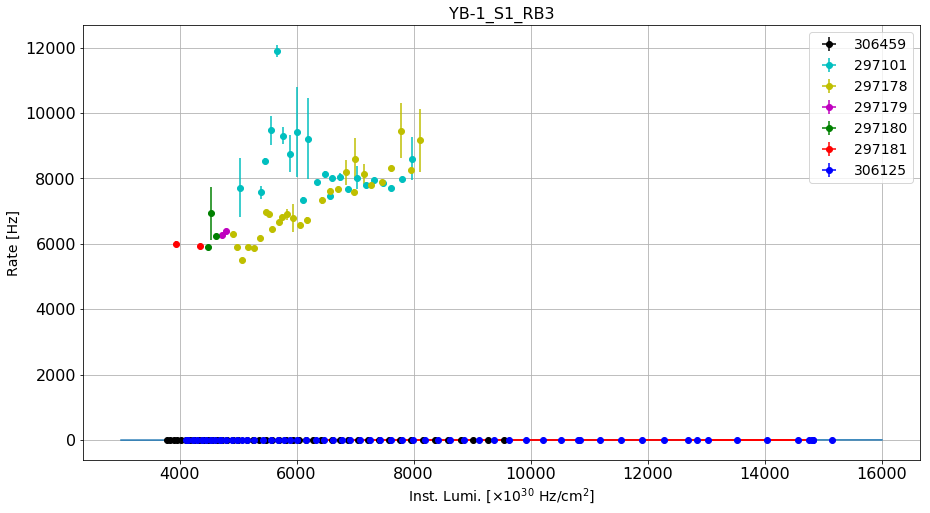

----------------------------------------------------------------------------------------------------------------
YB-1_S1_RB4
Linear correlation: (0.99793391183946, 2.677351855892624e-55)
Linear fit parameters: [1.93188523e+01 1.93949809e+04]
Paramenters uncertainty: [1.89675089e-01 1.85414876e+03]


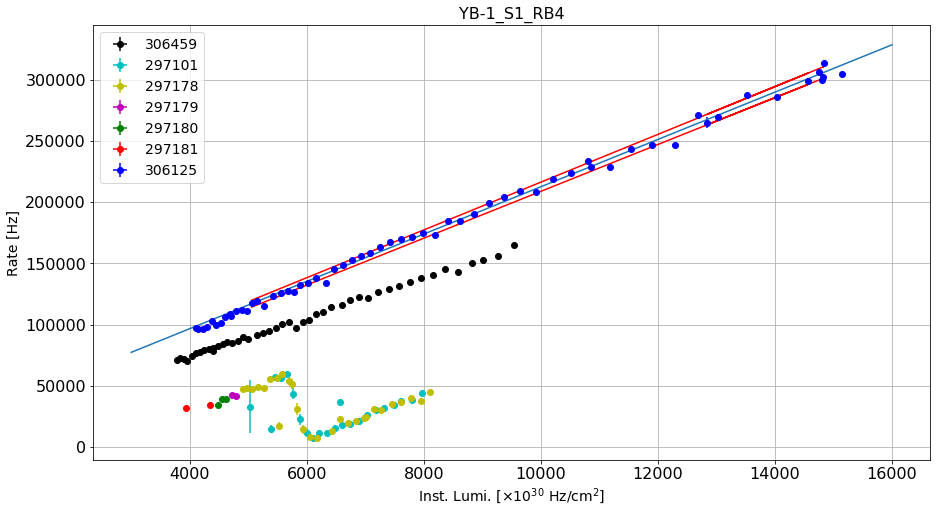

----------------------------------------------------------------------------------------------------------------
YB-1_S2_RB1
Linear correlation: (0.9999068095824795, 1.4339462819090807e-85)
Linear fit parameters: [   16.19446627 15486.24756267]
Paramenters uncertainty: [3.37181233e-02 3.29607946e+02]


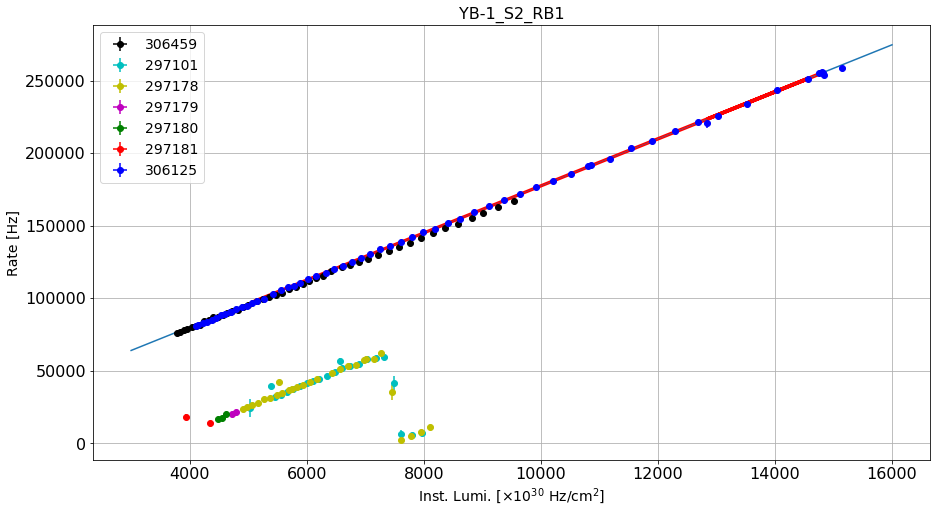

----------------------------------------------------------------------------------------------------------------
YB-1_S2_RB2
Linear correlation: (0.9998619595906253, 9.899641466258208e-82)
Linear fit parameters: [   3.81665139 3045.14952485]
Paramenters uncertainty: [9.67189003e-03 9.45465374e+01]


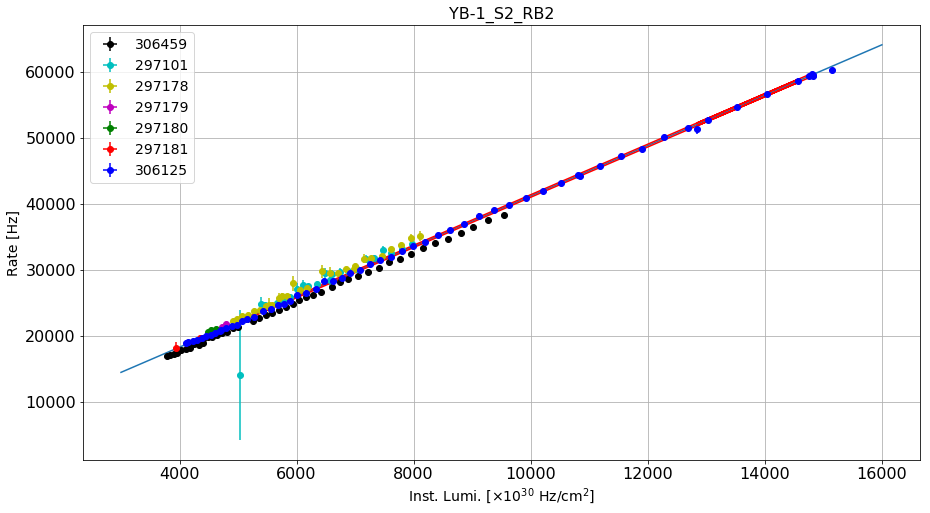

----------------------------------------------------------------------------------------------------------------
YB-1_S2_RB3
Linear correlation: (0.9900794592648239, 5.292915174486772e-40)
Linear fit parameters: [7.94261559e-01 1.82956436e+03]
Paramenters uncertainty: [1.71894565e-02 1.68033713e+02]


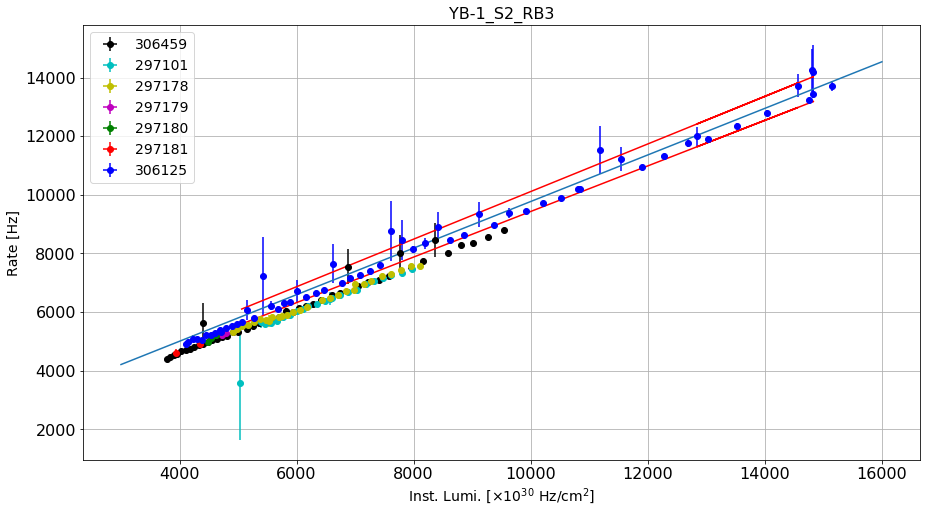

----------------------------------------------------------------------------------------------------------------
YB-1_S2_RB4
Linear correlation: (0.44360086748821653, 0.001789480247871058)
Linear fit parameters: [8.40176691e-04 1.54613165e+00]
Paramenters uncertainty: [2.58857530e-04 2.53043439e+00]


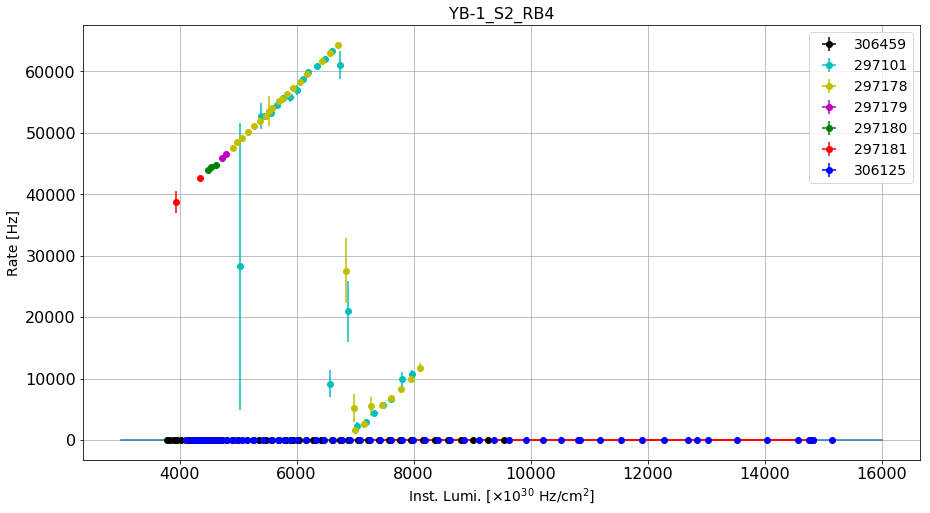

----------------------------------------------------------------------------------------------------------------
YB-1_S3_RB1
Linear correlation: (0.9998949798775528, 2.109883200666851e-84)
Linear fit parameters: [  15.08285793 2749.01062153]
Paramenters uncertainty: [3.33376421e-02 3.25888592e+02]


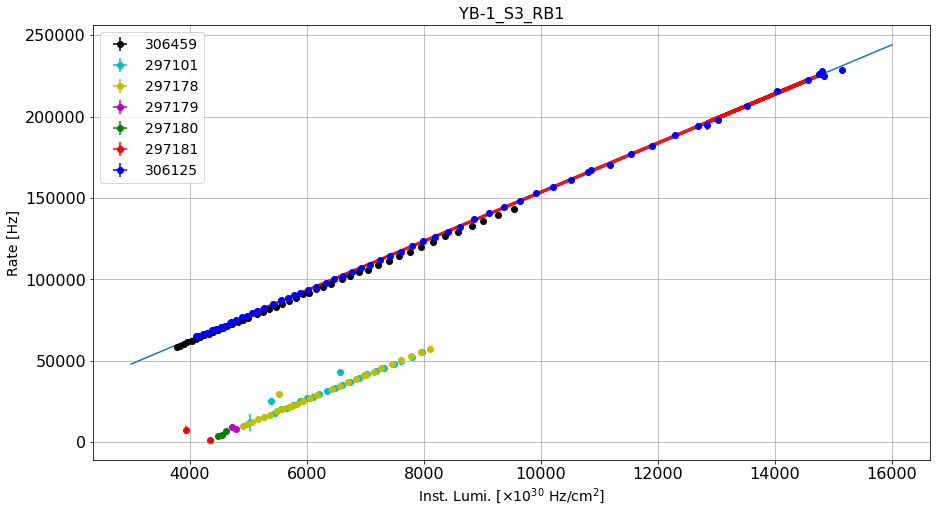

----------------------------------------------------------------------------------------------------------------
YB-1_S3_RB2
Linear correlation: (0.9968967535300924, 2.5008105680495413e-51)
Linear fit parameters: [3.50137962e+00 3.71379471e+03]
Paramenters uncertainty: [4.21638957e-02 4.12168700e+02]


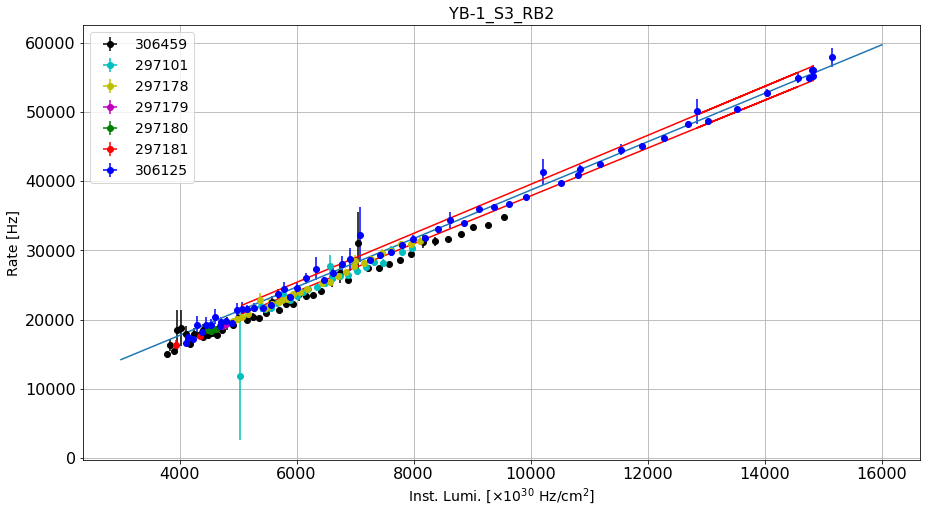

----------------------------------------------------------------------------------------------------------------
YB-1_S3_RB3
Linear correlation: (0.9994279240589251, 7.695671575970263e-68)
Linear fit parameters: [8.33116841e-01 5.77403124e+03]
Paramenters uncertainty: [4.29932152e-03 4.20275626e+01]


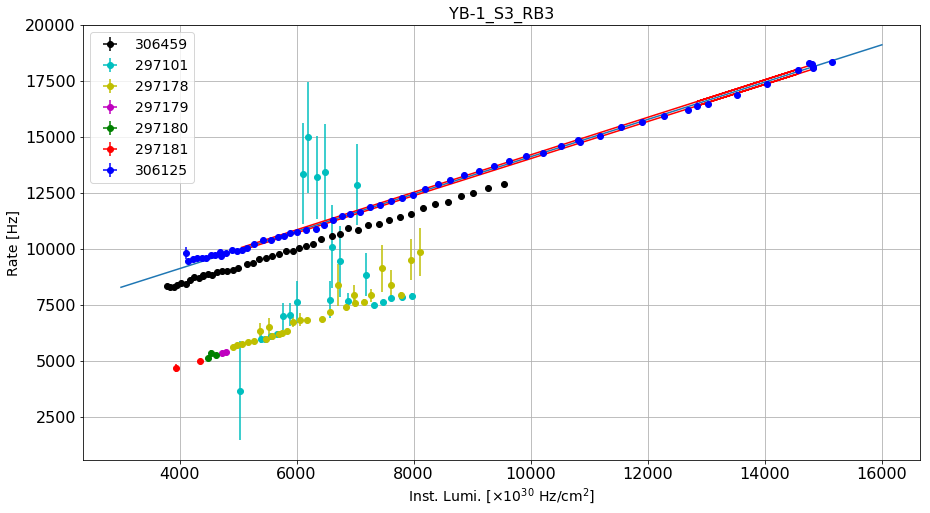

----------------------------------------------------------------------------------------------------------------
YB-1_S3_RB4
Linear correlation: (0.9999285374207287, 3.652137940036592e-88)
Linear fit parameters: [  28.95819773 7119.40036615]
Paramenters uncertainty: [5.27976899e-02 5.16118230e+02]


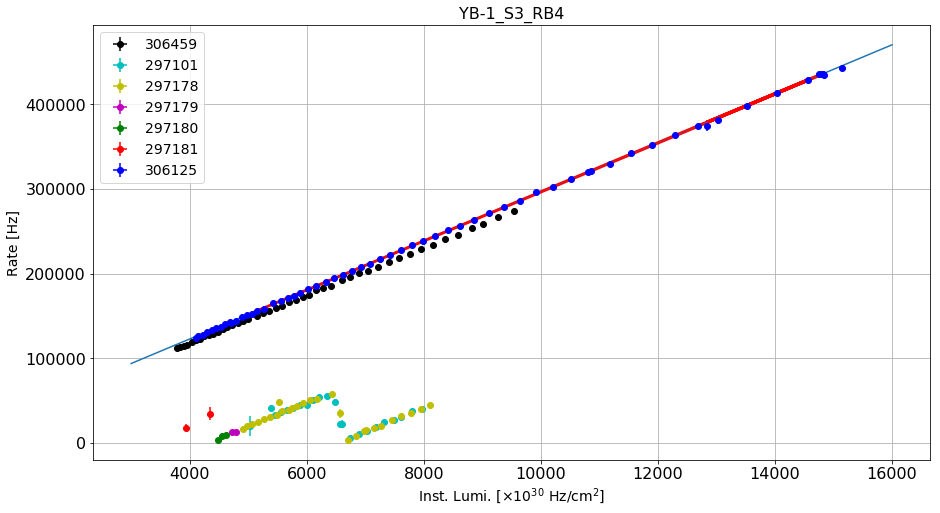

----------------------------------------------------------------------------------------------------------------
YB-1_S4_RB1
Linear correlation: (0.9999376230105629, 1.7134307528961267e-89)
Linear fit parameters: [  12.59668881 2451.89986378]
Paramenters uncertainty: [2.14570342e-02 2.09750967e+02]


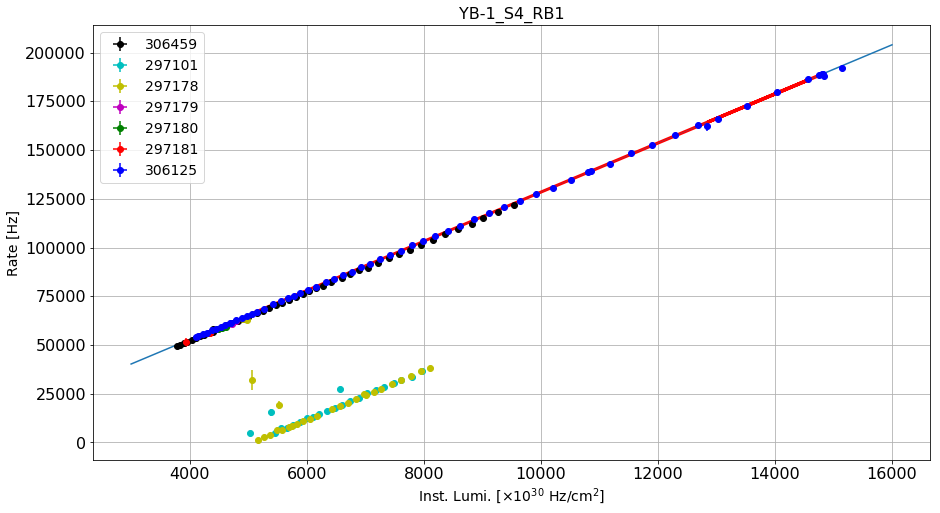

----------------------------------------------------------------------------------------------------------------
YB-1_S4_RB2
Linear correlation: (0.994262706228974, 2.4622150126723002e-45)
Linear fit parameters: [3.73126505e+00 6.10905559e+04]
Paramenters uncertainty: [6.12160708e-02 5.98411222e+02]


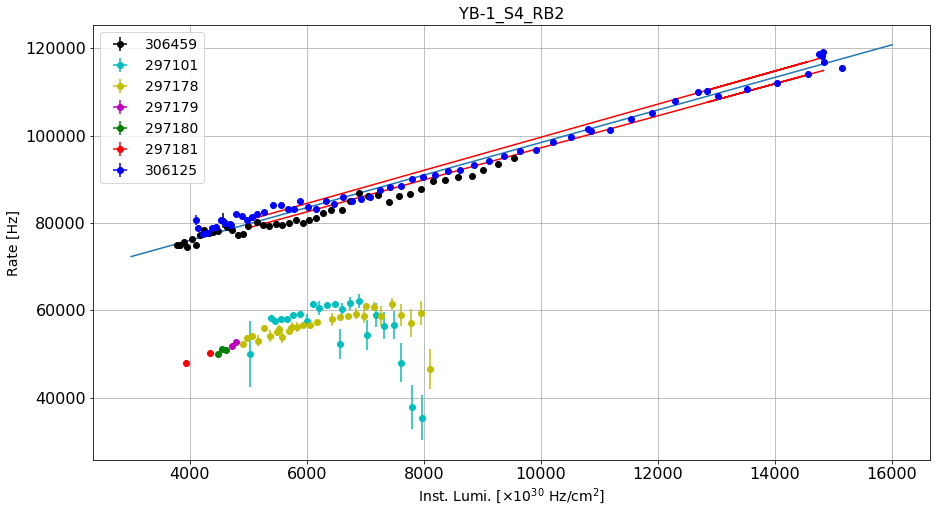

----------------------------------------------------------------------------------------------------------------
YB-1_S4_RB3
Linear correlation: (0.9956522927243432, 4.8696648776738916e-48)
Linear fit parameters: [9.42529381e-01 1.42233967e+04]
Paramenters uncertainty: [1.34470047e-02 1.31449771e+02]


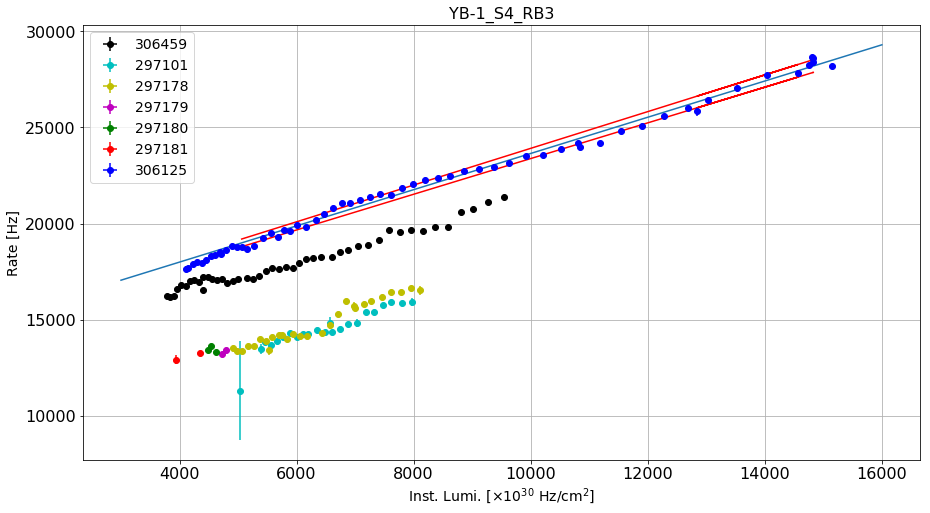

----------------------------------------------------------------------------------------------------------------
YB-1_S4_RB4
Linear correlation: (0.9999391679395042, 9.745544179117429e-90)
Linear fit parameters: [  28.34079322 8287.39325386]
Paramenters uncertainty: [4.76736990e-02 4.66029199e+02]


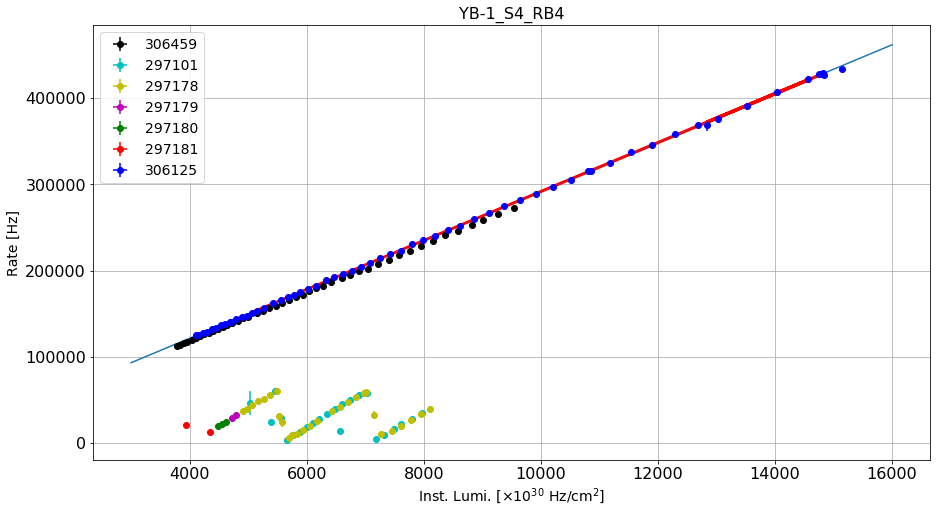

----------------------------------------------------------------------------------------------------------------
YB-1_S5_RB1
Linear correlation: (0.9999488364535499, 1.9837268124558612e-91)
Linear fit parameters: [  16.85423686 3661.07392271]
Paramenters uncertainty: [2.60008083e-02 2.54168150e+02]


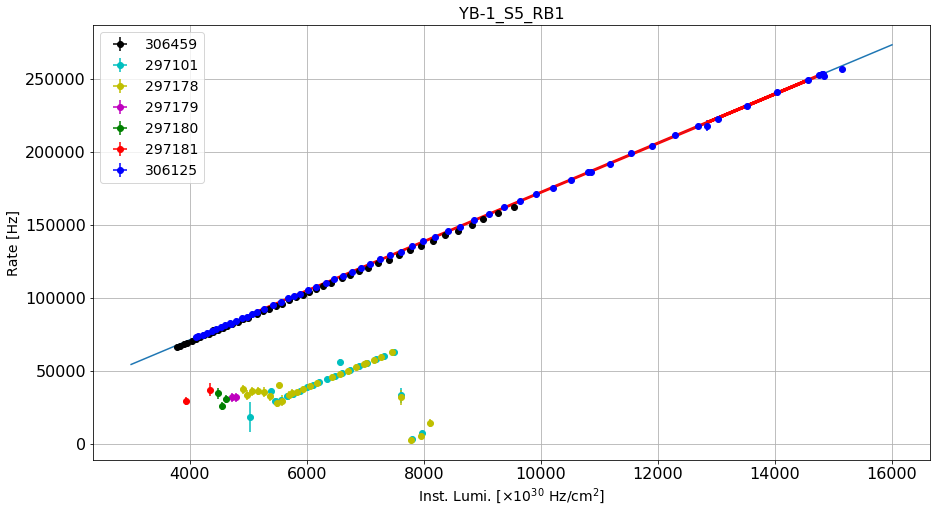

----------------------------------------------------------------------------------------------------------------
YB-1_S5_RB2
Linear correlation: (0.9965708691426624, 2.357203805519911e-50)
Linear fit parameters: [   3.65141645 2518.58044511]
Paramenters uncertainty: [4.62331353e-02 4.51947121e+02]


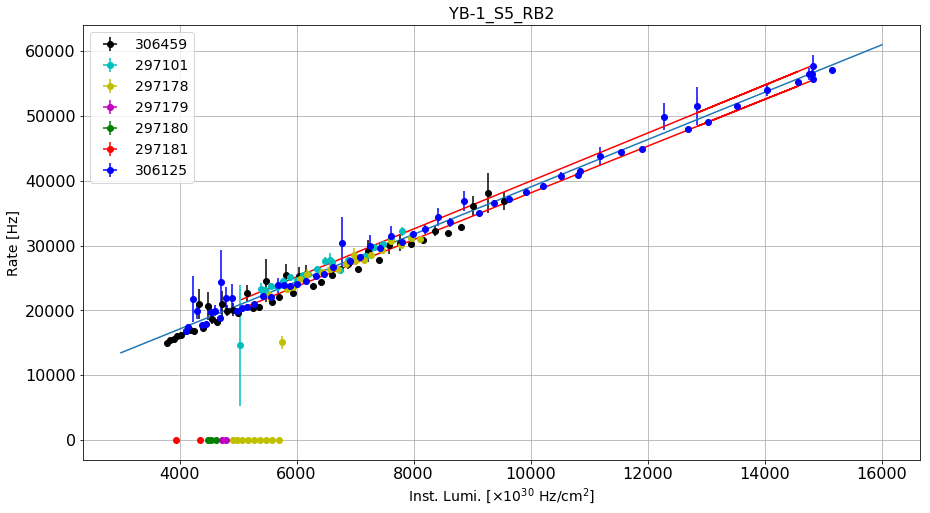

----------------------------------------------------------------------------------------------------------------
YB-1_S5_RB3
Linear correlation: (0.9997116922610797, 1.5544404541790363e-74)
Linear fit parameters: [9.11965185e-01 2.90961297e+03]
Paramenters uncertainty: [3.34026638e-03 3.26524206e+01]


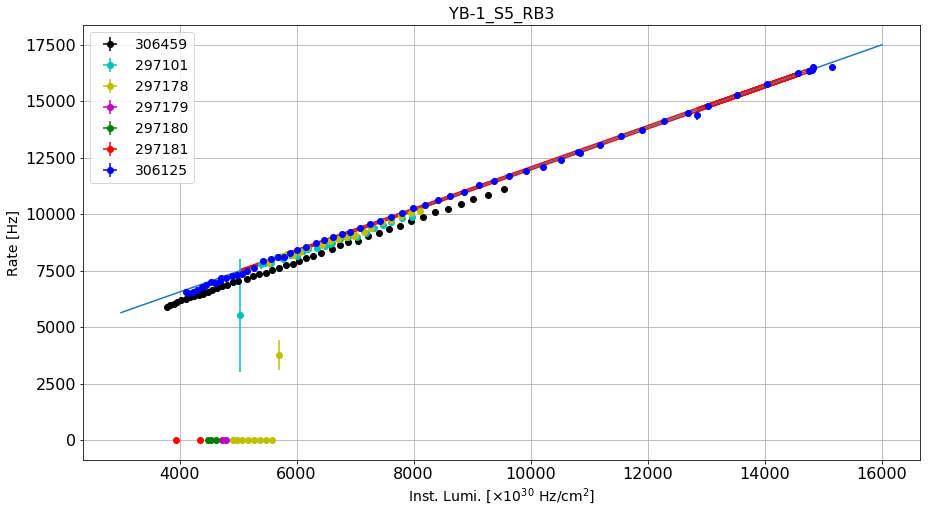

----------------------------------------------------------------------------------------------------------------
YB-1_S5_RB4
Linear correlation: (0.3908287410309379, 0.006603559583064093)
Linear fit parameters: [8.15792003e-04 2.98898611e+00]
Paramenters uncertainty: [2.92998403e-04 2.86417488e+00]


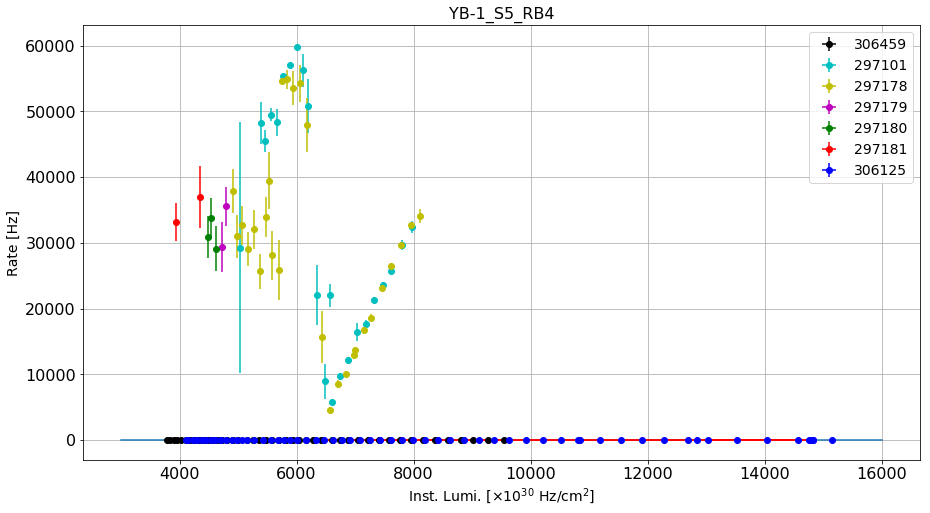

----------------------------------------------------------------------------------------------------------------
YB-1_S6_RB1
Linear correlation: (0.9997054447047903, 2.517869296401405e-74)
Linear fit parameters: [  18.00215385 5316.81211574]
Paramenters uncertainty: [6.66476154e-02 6.51506712e+02]


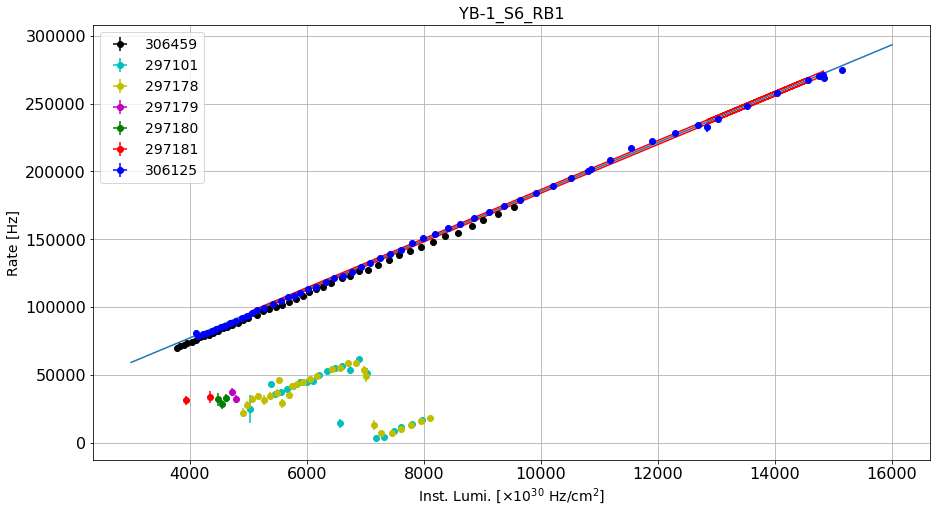

----------------------------------------------------------------------------------------------------------------
YB-1_S6_RB2
Linear correlation: (0.9999089941073296, 8.409175537194113e-86)
Linear fit parameters: [   3.82120666 2766.79152391]
Paramenters uncertainty: [7.86222915e-03 7.68563890e+01]


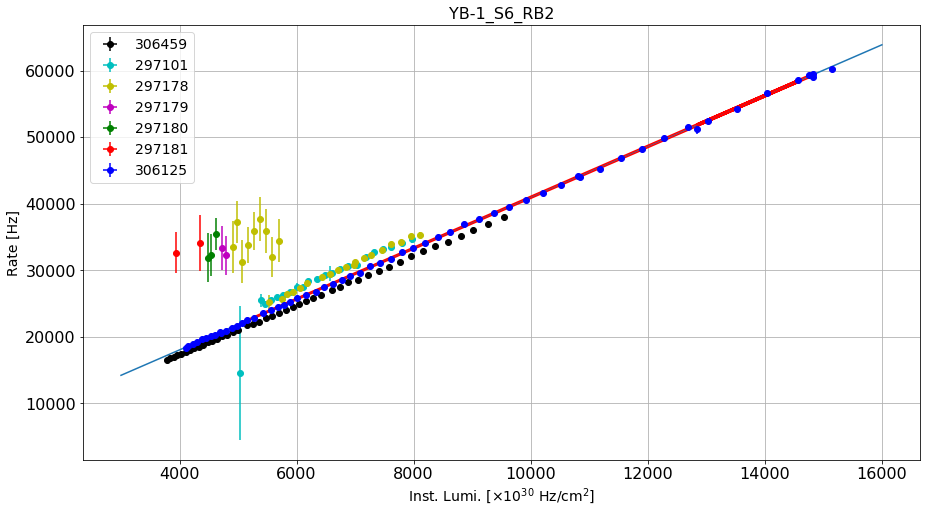

----------------------------------------------------------------------------------------------------------------
YB-1_S6_RB3
Linear correlation: (0.9996937189356229, 6.059409566257605e-74)
Linear fit parameters: [5.45803629e-01 1.27986499e+03]
Paramenters uncertainty: [2.06052099e-03 2.01424049e+01]


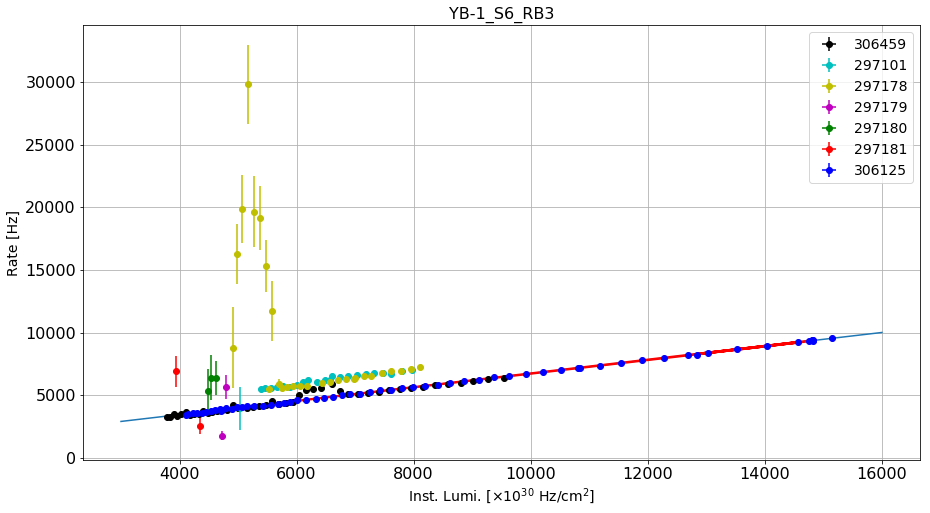

----------------------------------------------------------------------------------------------------------------
YB-1_S6_RB4
Linear correlation: (0.9941177547479192, 4.310098548213808e-45)
Linear fit parameters: [4.65769248e+01 6.39981107e+05]
Paramenters uncertainty: [7.73830276e-01 7.56449597e+03]


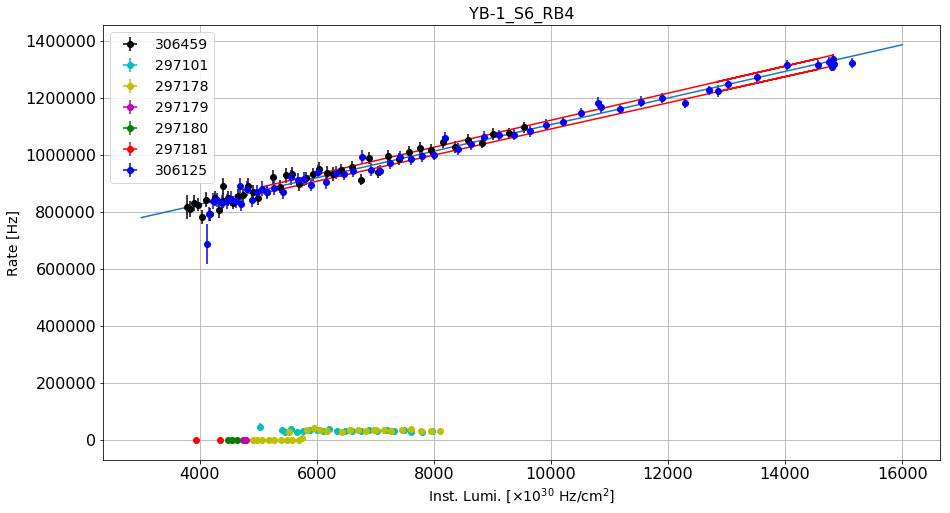

----------------------------------------------------------------------------------------------------------------
YB-1_S7_RB1
Linear correlation: (0.9999226693254827, 2.156085339809468e-87)
Linear fit parameters: [  17.89193076 2574.69104698]
Paramenters uncertainty: [3.39343135e-02 3.31721290e+02]


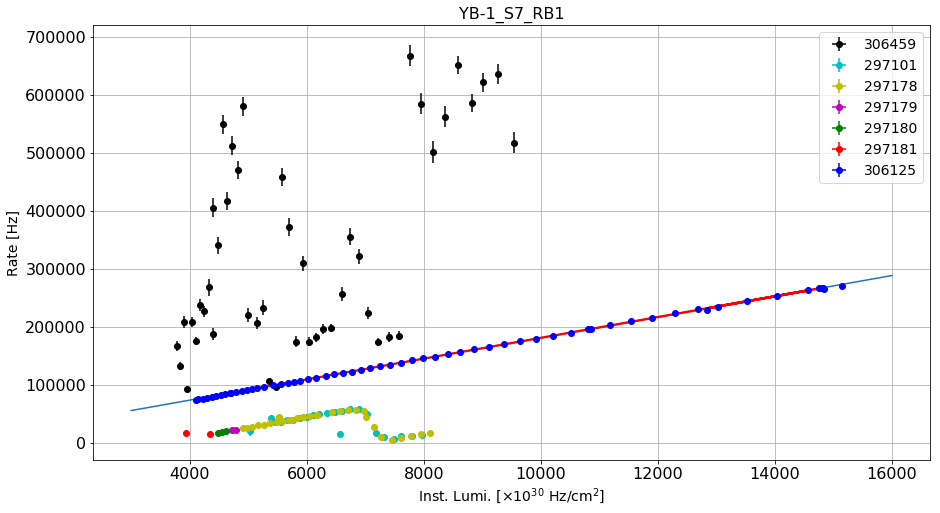

----------------------------------------------------------------------------------------------------------------
YB-1_S7_RB2
Linear correlation: (0.9930797568289479, 1.6513675399813152e-43)
Linear fit parameters: [1.78721661e+00 4.69508723e+03]
Paramenters uncertainty: [3.22315990e-02 3.15076585e+02]


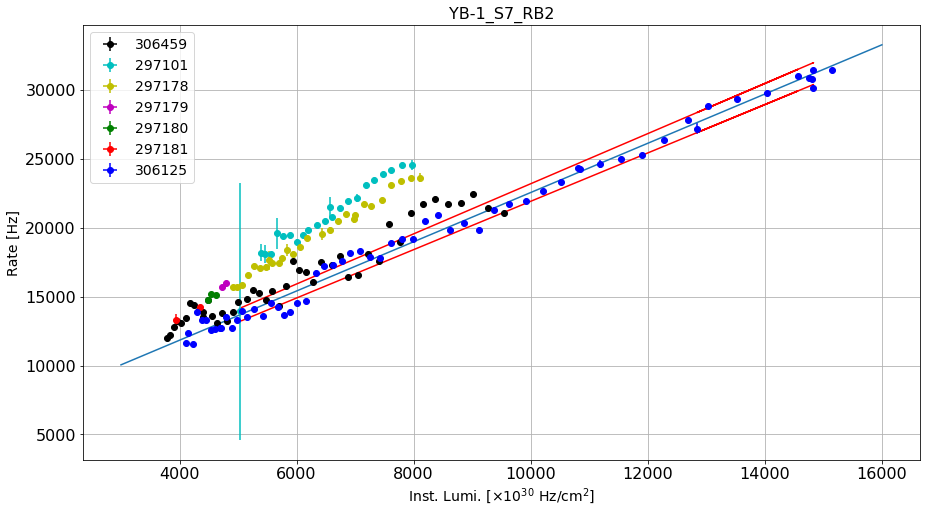

----------------------------------------------------------------------------------------------------------------
YB-1_S7_RB3
Linear correlation: (0.9962914025106018, 1.3700070341209693e-49)
Linear fit parameters: [5.88191420e-01 2.08405763e+03]
Paramenters uncertainty: [7.74666709e-03 7.57267244e+01]


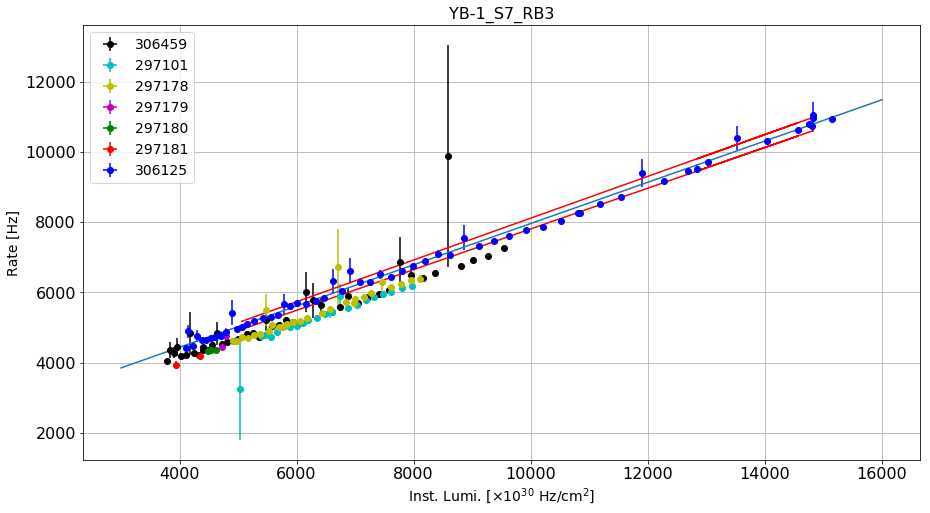

----------------------------------------------------------------------------------------------------------------
YB-1_S7_RB4
Linear correlation: (0.5007828592335924, 0.0003370030389515127)
Linear fit parameters: [0.00172709 0.68566672]
Paramenters uncertainty: [4.55235020e-04 4.45010176e+00]


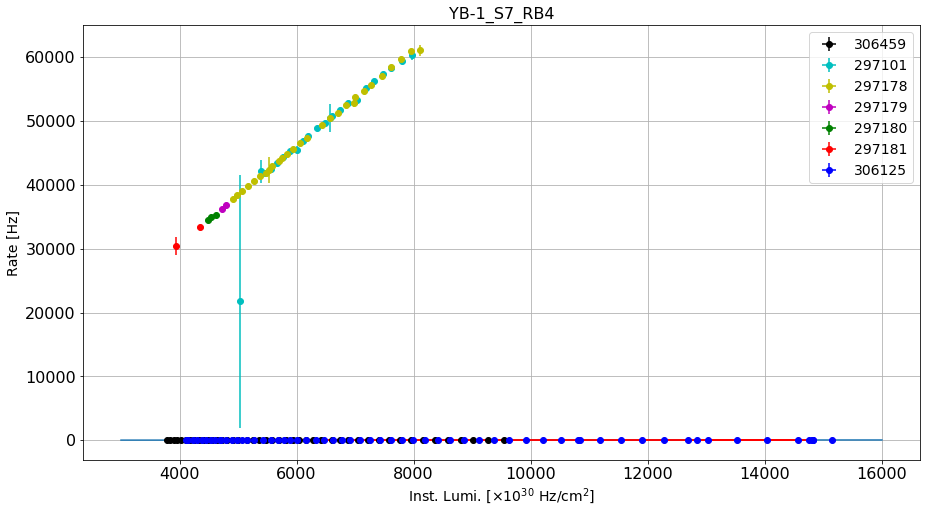

----------------------------------------------------------------------------------------------------------------
YB-1_S8_RB1
Linear correlation: (0.9999240972204737, 1.4176031315376682e-87)
Linear fit parameters: [  14.32000385 8286.94259722]
Paramenters uncertainty: [2.69077553e-02 2.63033914e+02]


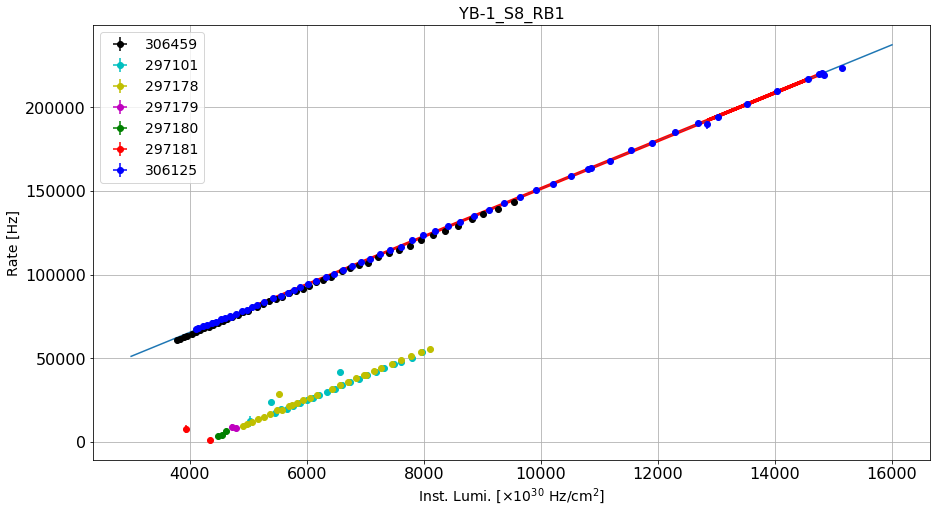

----------------------------------------------------------------------------------------------------------------
YB-1_S8_RB2
Linear correlation: (0.9998066634688042, 1.9377384530370693e-78)
Linear fit parameters: [3.67274115e+00 5.80100923e+03]
Paramenters uncertainty: [1.10151657e-02 1.07677586e+02]


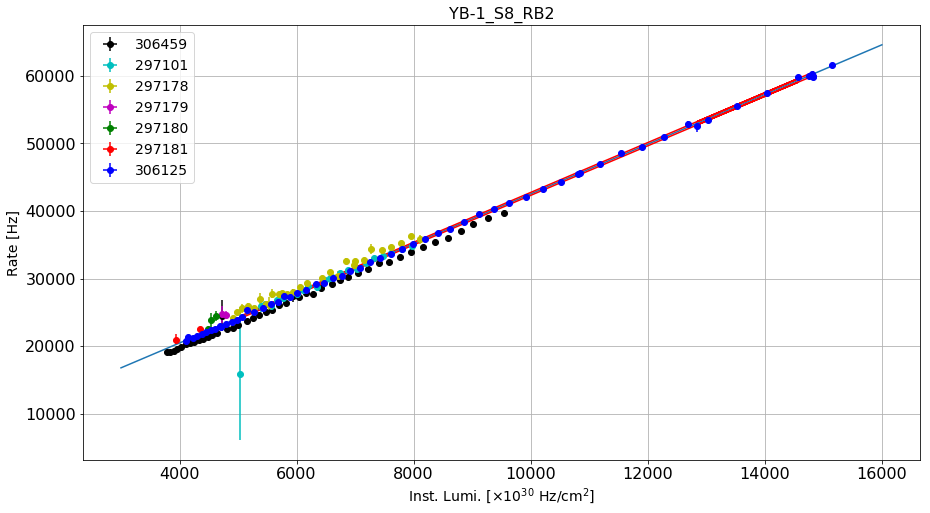

----------------------------------------------------------------------------------------------------------------
YB-1_S8_RB3
Linear correlation: (0.9945114143441396, 9.107331504842795e-46)
Linear fit parameters: [5.05009709e-01 8.32407645e+03]
Paramenters uncertainty: [8.10222340e-03 7.92024275e+01]


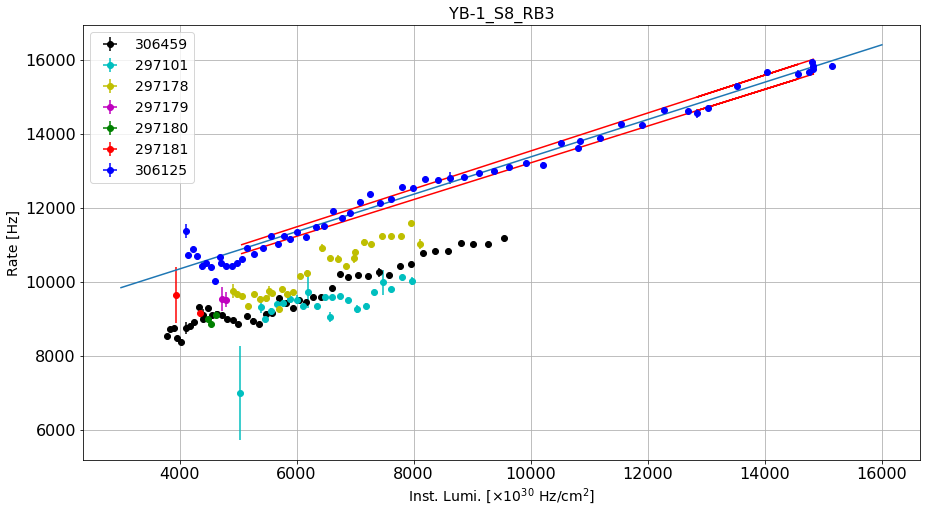

----------------------------------------------------------------------------------------------------------------
YB-1_S8_RB4
Linear correlation: (0.46969515883945884, 0.0008656856295483283)
Linear fit parameters: [ 2.16618635e-03 -2.38778978e+00]
Paramenters uncertainty: [6.20900387e-04 6.06954602e+00]


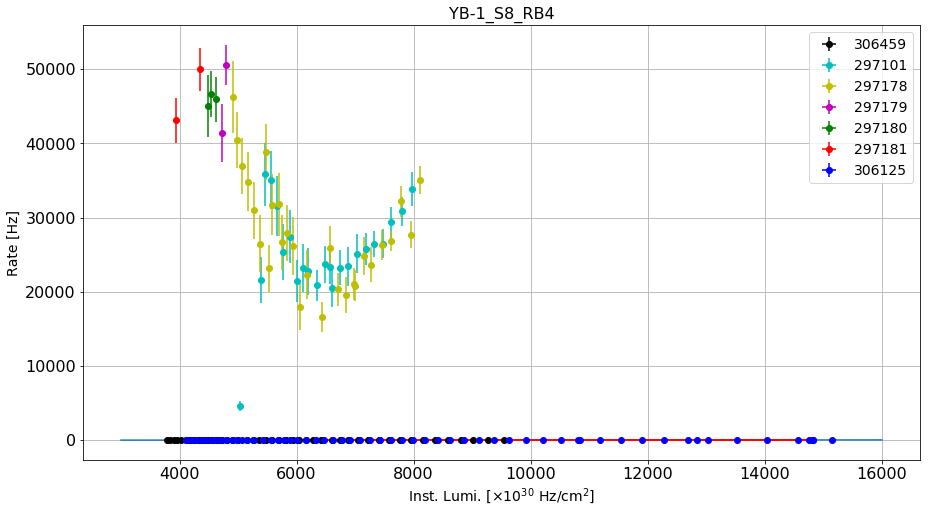

----------------------------------------------------------------------------------------------------------------
YB-1_S9_RB1
Linear correlation: (0.9999130370013689, 3.025058817902811e-86)
Linear fit parameters: [  16.67506076 4794.38044555]
Paramenters uncertainty: [3.35385108e-02 3.27852163e+02]


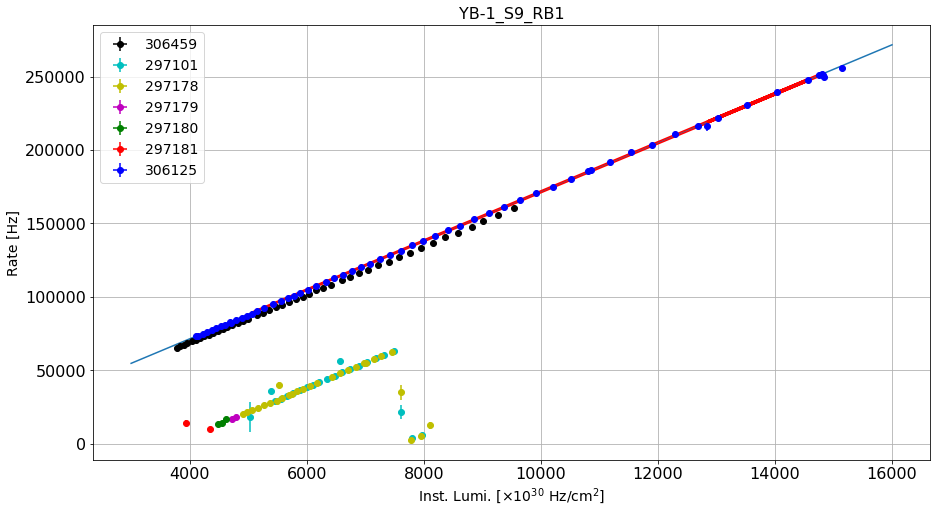

----------------------------------------------------------------------------------------------------------------
YB-1_S9_RB2
Linear correlation: (0.9902256154674749, 3.795927733170319e-40)
Linear fit parameters: [3.44065405e+00 8.63708707e+04]
Paramenters uncertainty: [7.39040926e-02 7.22441636e+02]


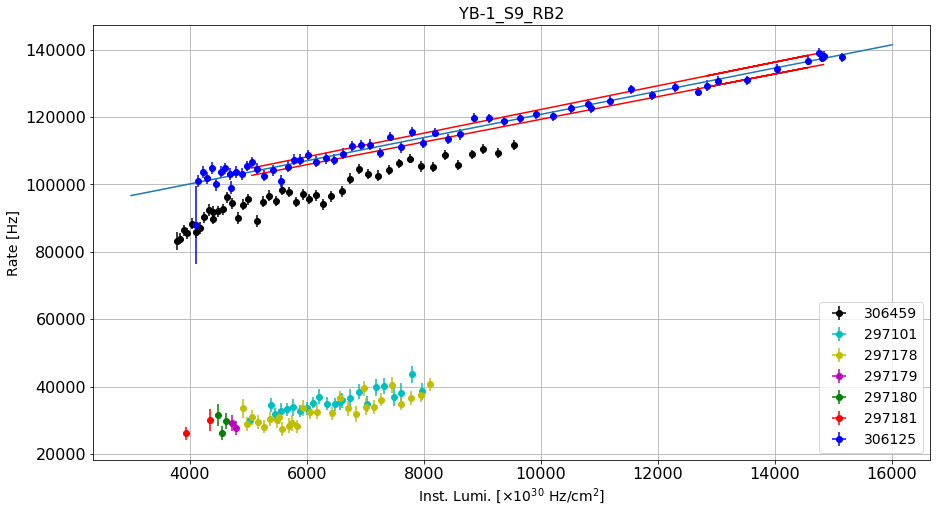

----------------------------------------------------------------------------------------------------------------
YB-1_S9_RB3
Linear correlation: (0.9835647702773515, 4.239417084027703e-35)
Linear fit parameters: [4.84325378e-01 2.28233261e+03]
Paramenters uncertainty: [1.35584835e-02 1.32539520e+02]


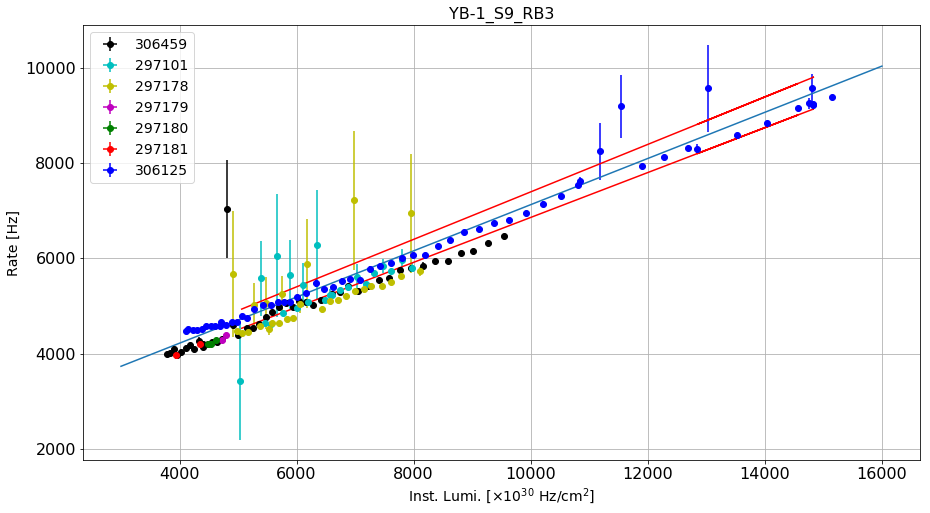

----------------------------------------------------------------------------------------------------------------
YB-1_S9_RB4
Linear correlation: (0.9968737829254162, 2.951496932110265e-51)
Linear fit parameters: [4.78858198e-01 4.14964148e+03]
Paramenters uncertainty: [5.78785173e-03 5.65785321e+01]


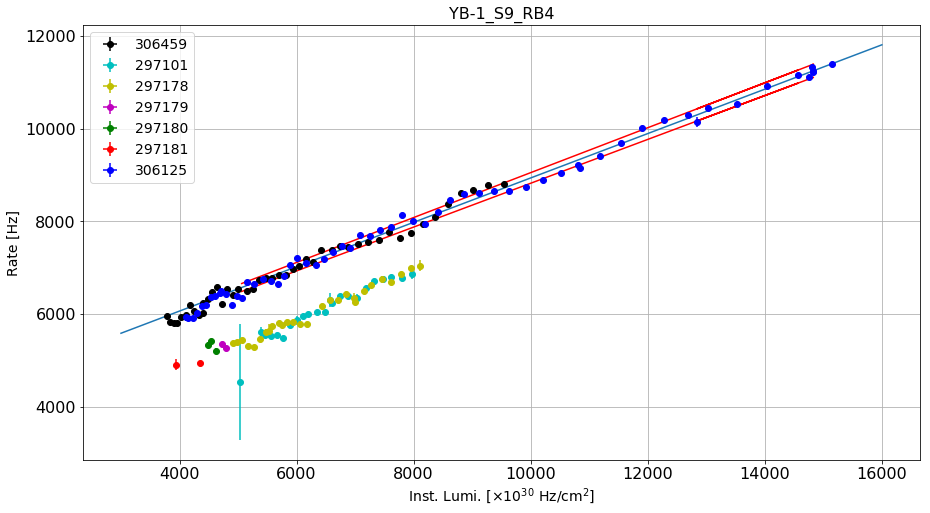

----------------------------------------------------------------------------------------------------------------
YB-1_S10_RB1
Linear correlation: (0.9998057001351632, 2.166999520450483e-78)
Linear fit parameters: [  16.41579293 8532.37685464]
Paramenters uncertainty: [4.93562527e-02 4.82476825e+02]


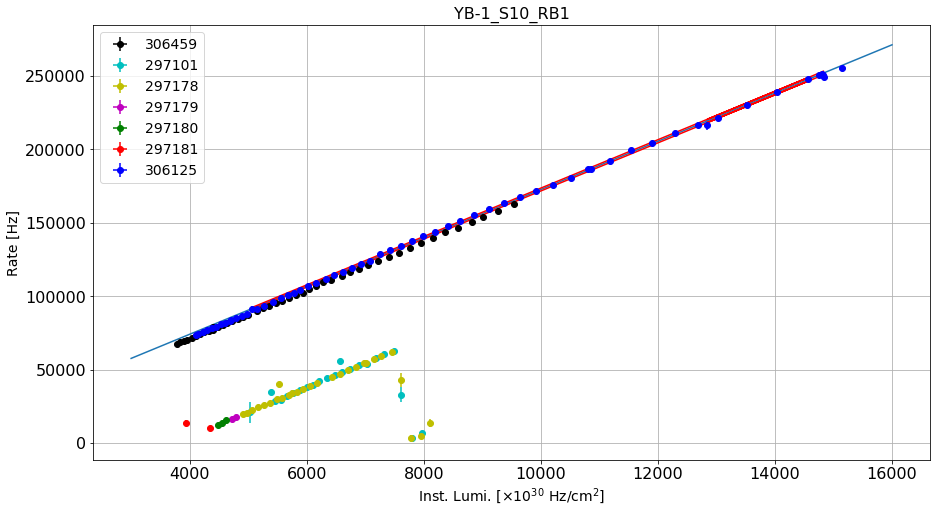

----------------------------------------------------------------------------------------------------------------
YB-1_S10_RB2
Linear correlation: (0.9996616534907853, 5.691436373596046e-73)
Linear fit parameters: [   3.57687422 2899.17446059]
Paramenters uncertainty: [1.41930430e-02 1.38742589e+02]


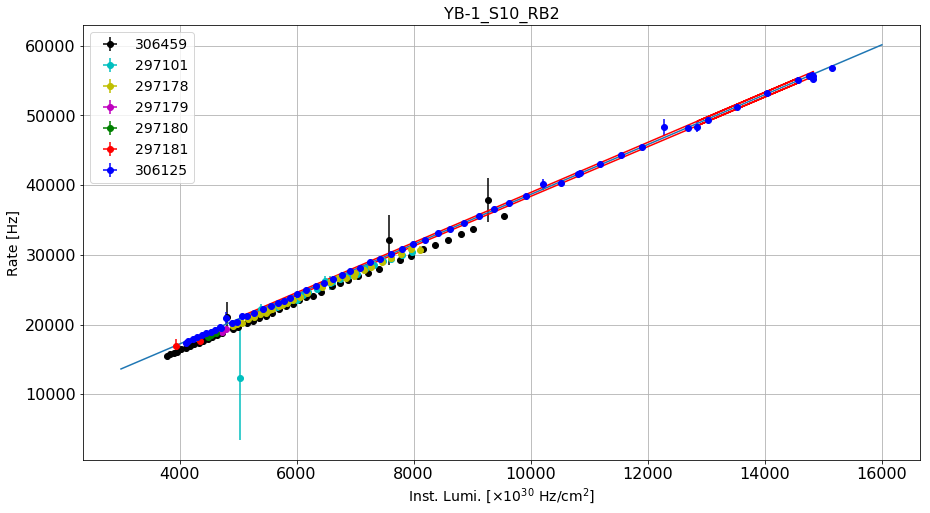

----------------------------------------------------------------------------------------------------------------
YB-1_S10_RB3
Linear correlation: (0.9171160639042245, 1.3612569122435285e-19)
Linear fit parameters: [5.16162217e-01 4.81947107e+03]
Paramenters uncertainty: [3.42126780e-02 3.34442413e+02]


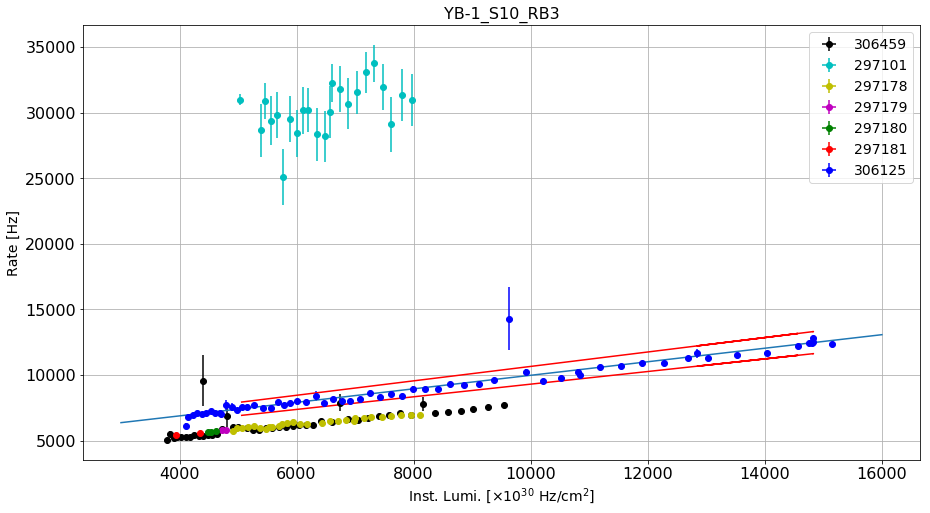

----------------------------------------------------------------------------------------------------------------
YB-1_S10_RB4
Linear correlation: (0.9973933227654714, 4.970506397230329e-53)
Linear fit parameters: [7.65312668e-01 5.41788171e+03]
Paramenters uncertainty: [8.44332768e-03 8.25368562e+01]


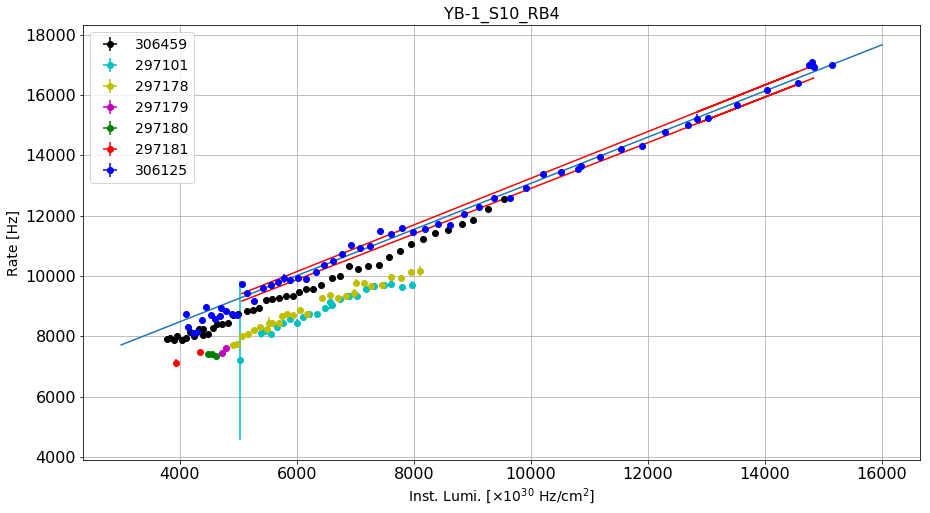

----------------------------------------------------------------------------------------------------------------
YB-1_S11_RB1
Linear correlation: (0.999928282868913, 3.956316336589956e-88)
Linear fit parameters: [  16.60064149 8557.28499635]
Paramenters uncertainty: [3.03207860e-02 2.96397635e+02]


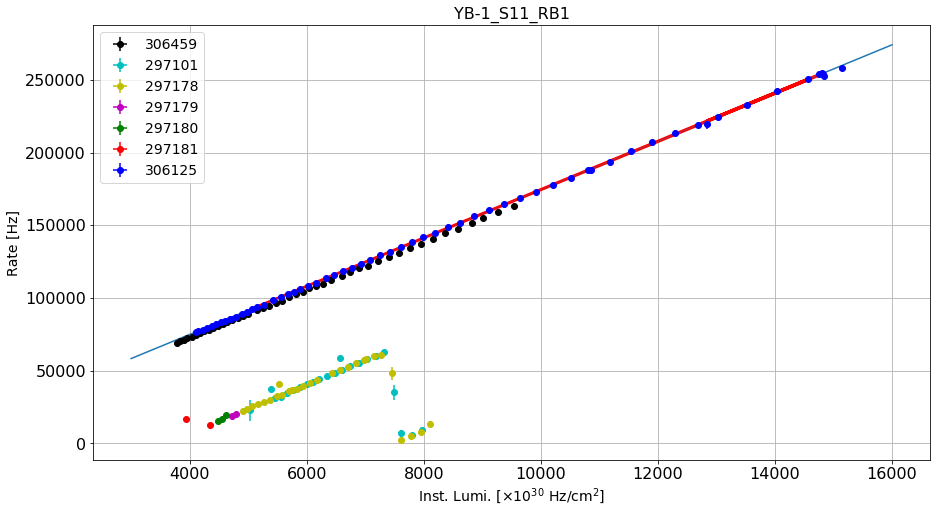

----------------------------------------------------------------------------------------------------------------
YB-1_S11_RB2
Linear correlation: (0.9998943532145566, 2.4120725509193606e-84)
Linear fit parameters: [3.57644919e+00 3.70977390e+03]
Paramenters uncertainty: [7.92857953e-03 7.75049901e+01]


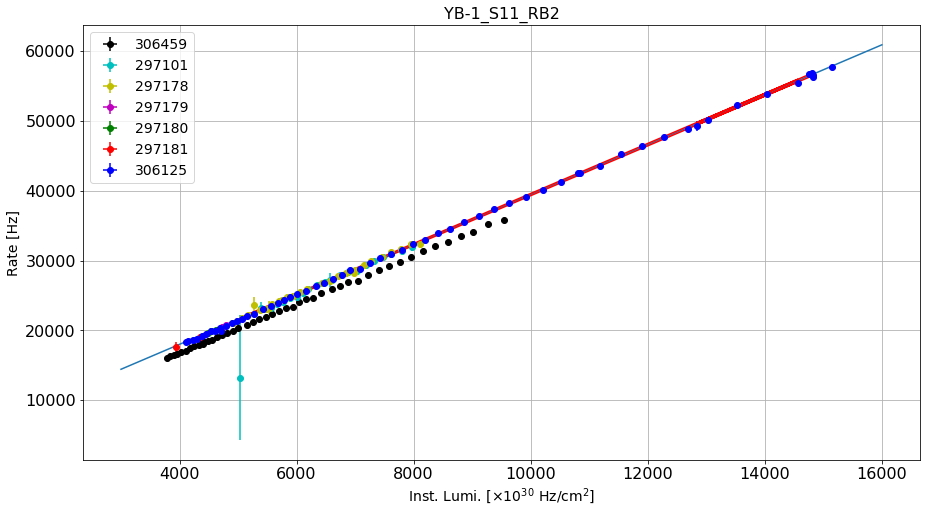

----------------------------------------------------------------------------------------------------------------
YB-1_S11_RB3
Linear correlation: (-0.06464603699077891, 0.6659530002411439)
Linear fit parameters: [-3.63801827e+00  3.39264330e+05]
Paramenters uncertainty: [8.56405323e+00 8.37169960e+04]


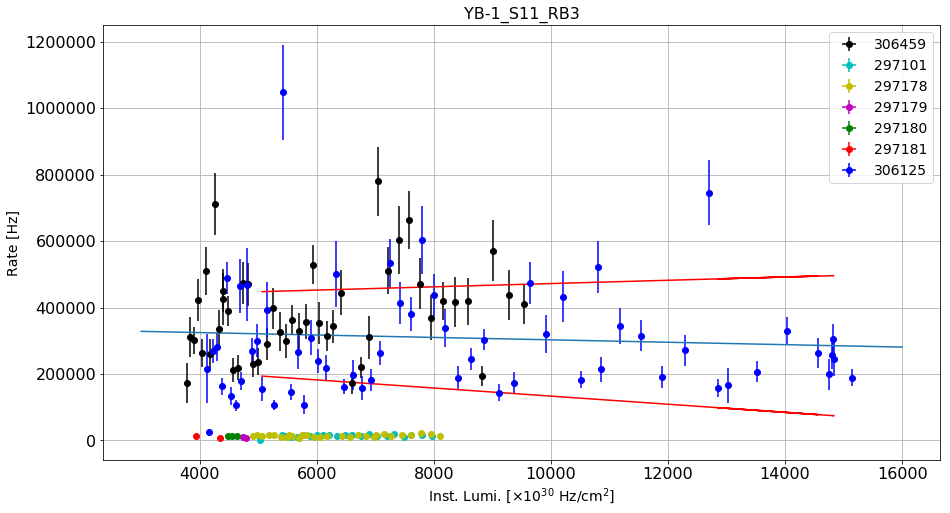

----------------------------------------------------------------------------------------------------------------
YB-1_S11_RB4
Linear correlation: (0.994652118736481, 5.084533846803334e-46)
Linear fit parameters: [5.72802169e-01 1.25147065e+03]
Paramenters uncertainty: [9.07034223e-03 8.86661706e+01]


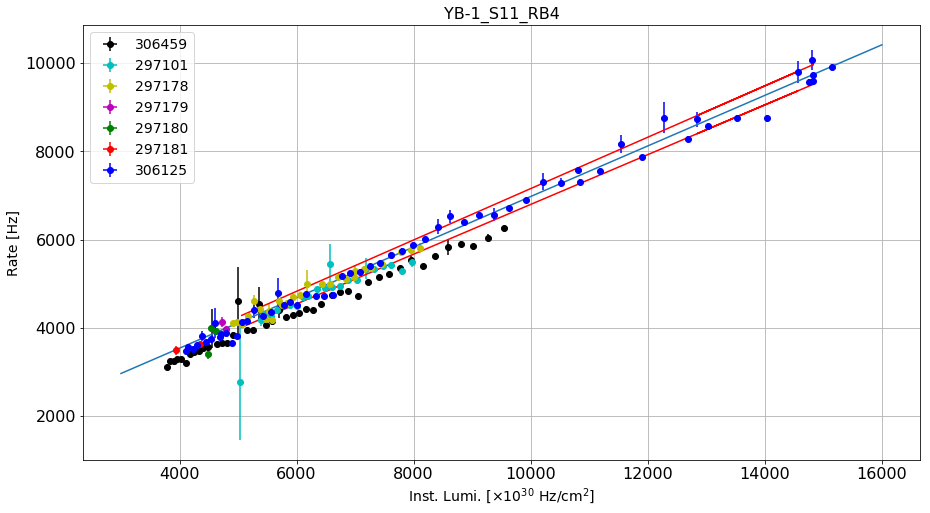

----------------------------------------------------------------------------------------------------------------
YB-1_S12_RB1
Linear correlation: (0.9998216315136058, 3.16196221353648e-79)
Linear fit parameters: [  15.67302863 5679.75386107]
Paramenters uncertainty: [4.51492837e-02 4.41352045e+02]


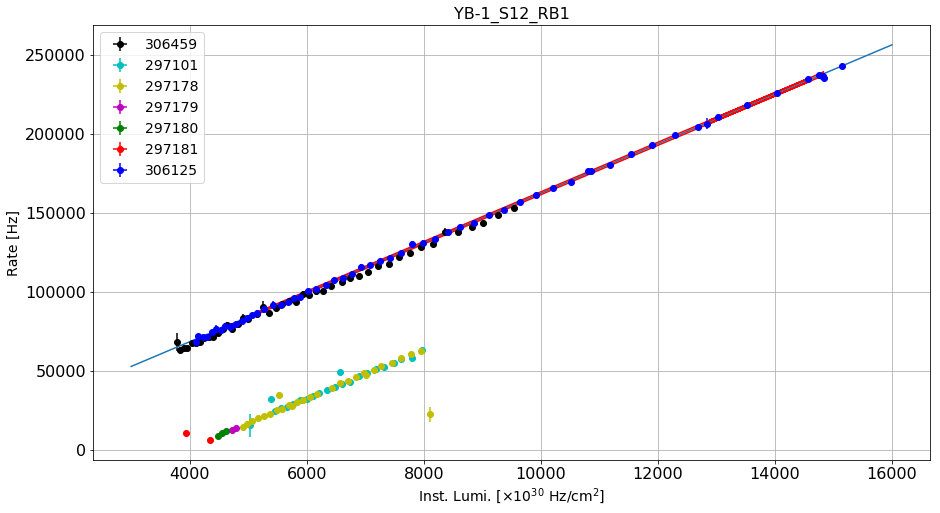

----------------------------------------------------------------------------------------------------------------
YB-1_S12_RB2
Linear correlation: (0.9999338333225922, 6.459296847154875e-89)
Linear fit parameters: [2.98127307e+00 3.36315464e+03]
Paramenters uncertainty: [5.23026560e-03 5.11279078e+01]


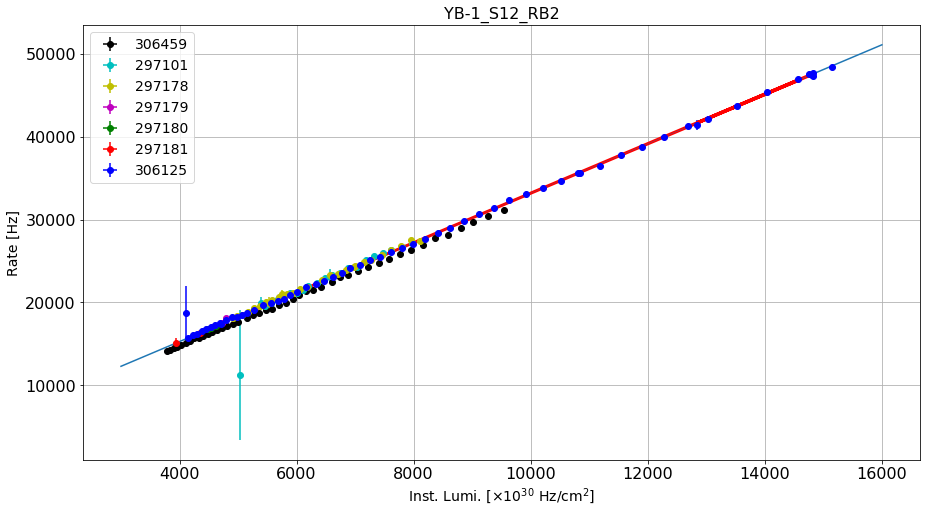

----------------------------------------------------------------------------------------------------------------
YB-1_S12_RB3
Linear correlation: (0.9992789626906824, 1.4025607408654214e-65)
Linear fit parameters: [5.23035842e-01 2.16536173e+03]
Paramenters uncertainty: [3.03058204e-03 2.96251340e+01]


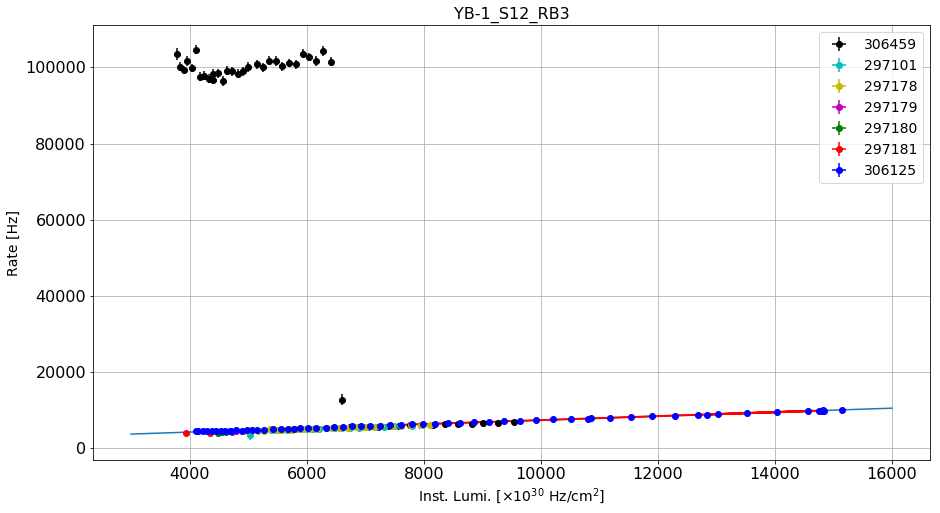

----------------------------------------------------------------------------------------------------------------
YB-1_S12_RB4
Linear correlation: (0.9391232155998548, 1.6605621307446583e-22)
Linear fit parameters: [8.66091851e+00 2.26793247e+04]
Paramenters uncertainty: [4.83209766e-01 4.72356593e+03]


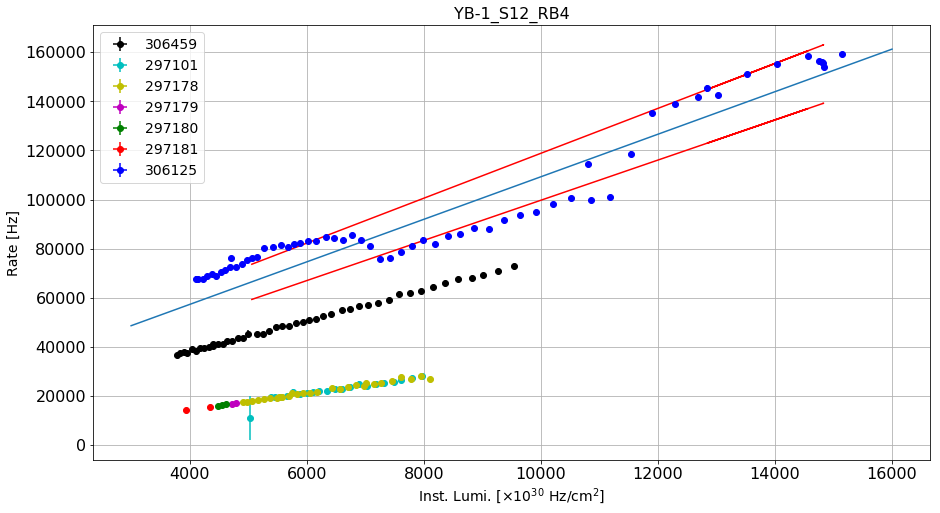

----------------------------------------------------------------------------------------------------------------
YB0_S1_RB1
Linear correlation: (0.9998619129387657, 9.975188211780174e-82)
Linear fit parameters: [   3.96963331 1916.22070668]
Paramenters uncertainty: [1.00612661e-02 9.83528421e+01]


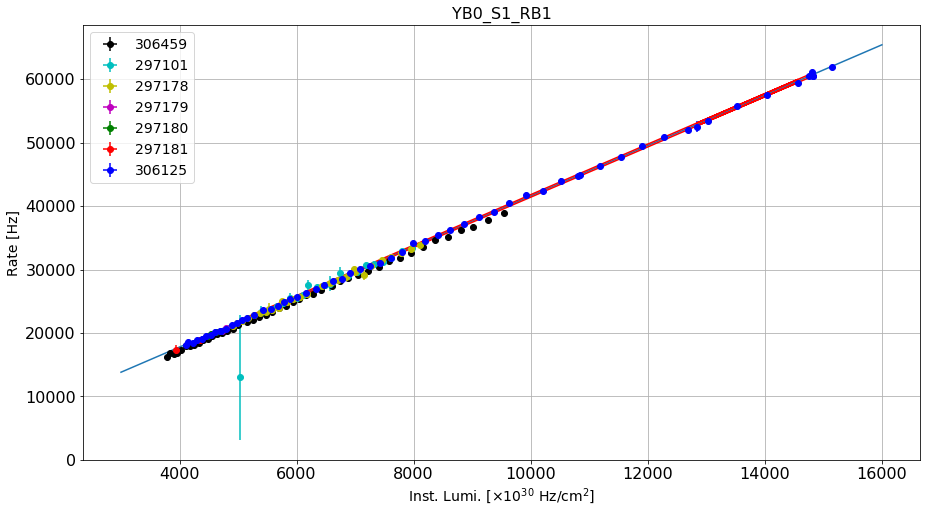

----------------------------------------------------------------------------------------------------------------
YB0_S1_RB2
Linear correlation: (0.9977508855373661, 1.8042531202026692e-54)
Linear fit parameters: [1.47304162e+00 3.43597515e+03]
Paramenters uncertainty: [1.5091594e-02 1.4752628e+02]


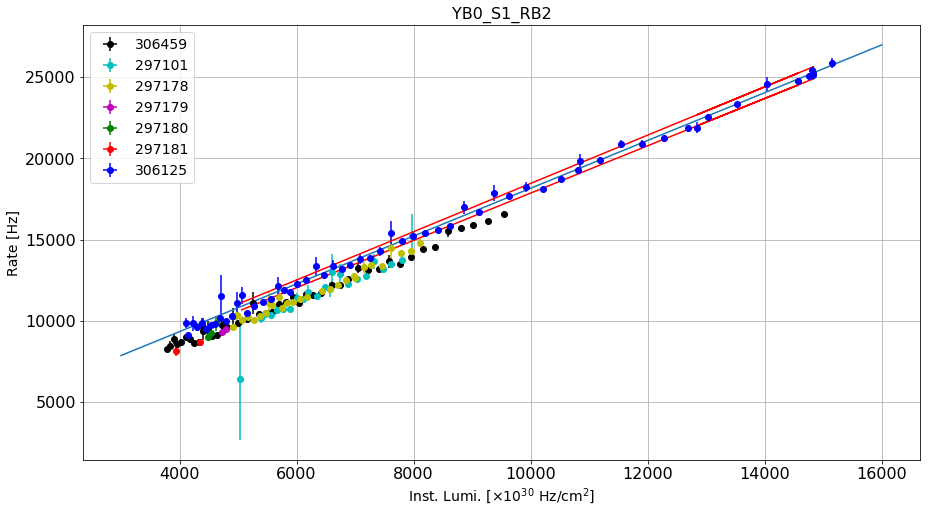

----------------------------------------------------------------------------------------------------------------
YB0_S1_RB3
Linear correlation: (0.20065062253076885, 0.17626351083071234)
Linear fit parameters: [1.24791013e-01 1.57380976e+05]
Paramenters uncertainty: [9.29148685e-02 9.08279465e+02]


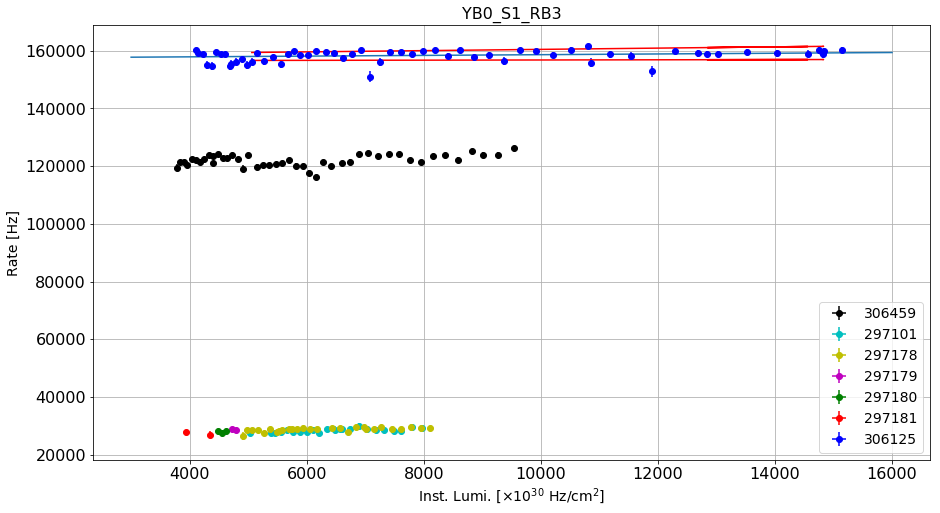

----------------------------------------------------------------------------------------------------------------
YB0_S1_RB4
Linear correlation: (0.5486468951556283, 6.528404116864932e-05)
Linear fit parameters: [ 1.52808807e-03 -2.13616135e+00]
Paramenters uncertainty: [3.55104072e-04 3.47128228e+00]


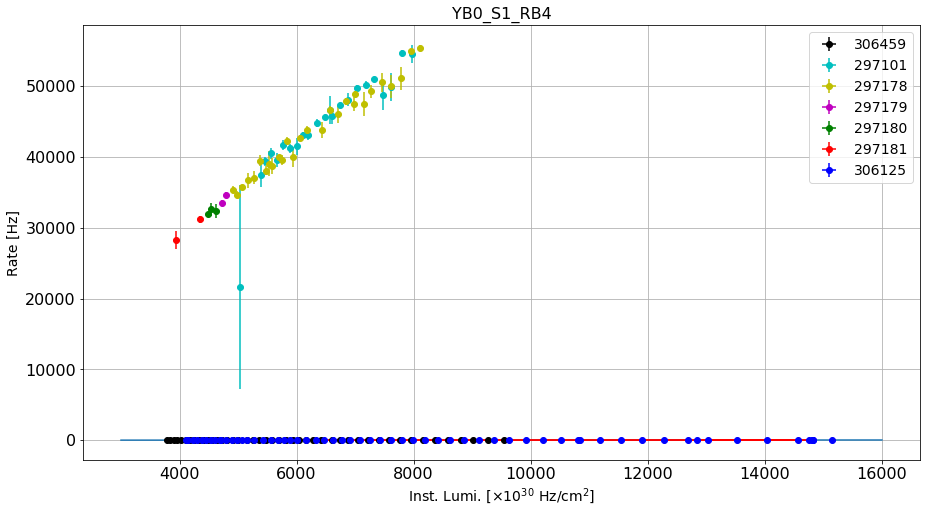

----------------------------------------------------------------------------------------------------------------
YB0_S2_RB1
Linear correlation: (0.999716569435115, 1.0589598492089545e-74)
Linear fit parameters: [5.13720956e+00 5.87782812e+03]
Paramenters uncertainty: [1.86562231e-02 1.82371935e+02]


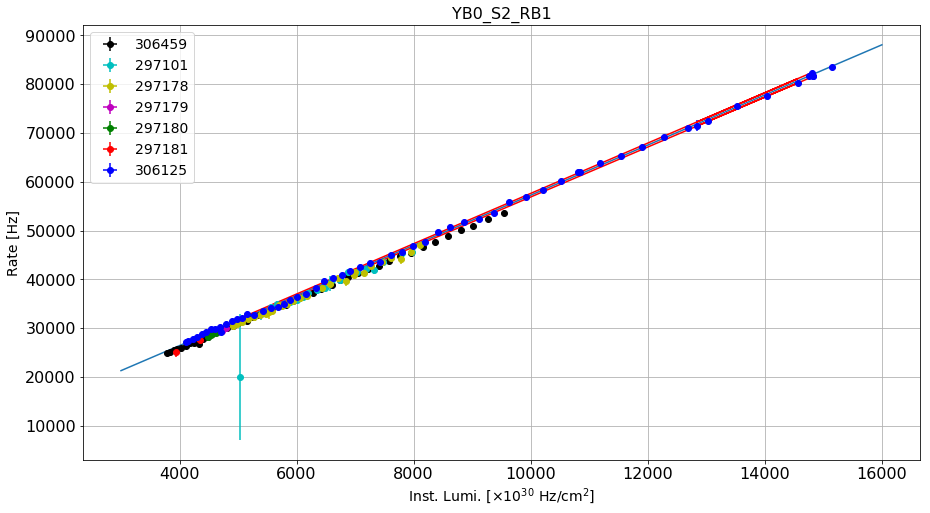

----------------------------------------------------------------------------------------------------------------
YB0_S2_RB2
Linear correlation: (0.9969348291119847, 1.895028443778899e-51)
Linear fit parameters: [1.99809564e+00 3.83773908e+03]
Paramenters uncertainty: [2.39124772e-02 2.33753890e+02]


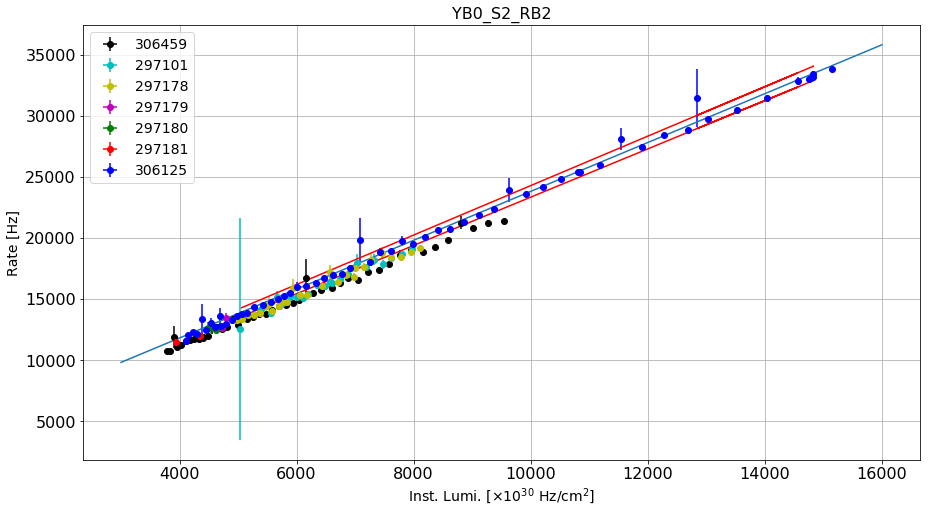

----------------------------------------------------------------------------------------------------------------
YB0_S2_RB3
Linear correlation: (0.8054887761259318, 8.6422801040173e-12)
Linear fit parameters: [6.58429598e-01 5.24919095e+04]
Paramenters uncertainty: [7.38729350e-02 7.22137058e+02]


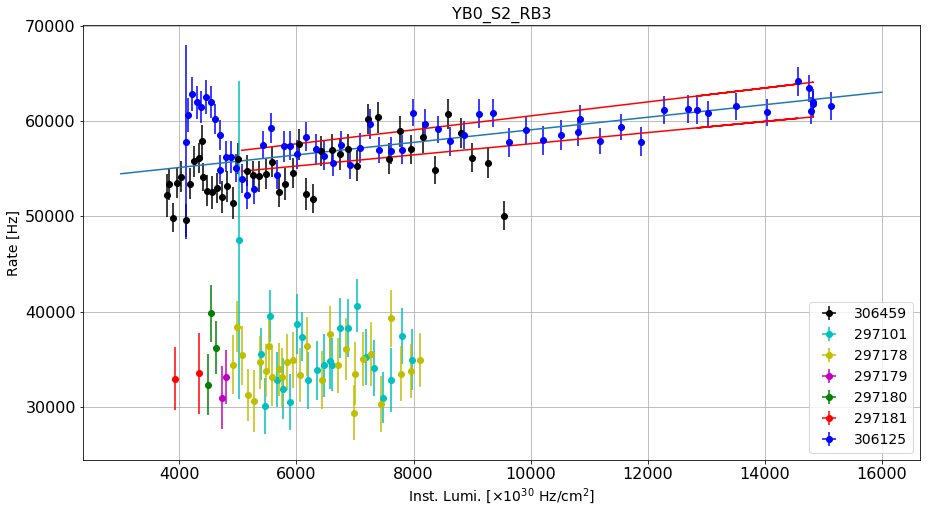

----------------------------------------------------------------------------------------------------------------
YB0_S2_RB4
Linear correlation: (0.9967908345252305, 5.315731989444142e-51)
Linear fit parameters: [  18.09563727 7453.57688972]
Paramenters uncertainty: [2.21614392e-01 2.16636804e+03]


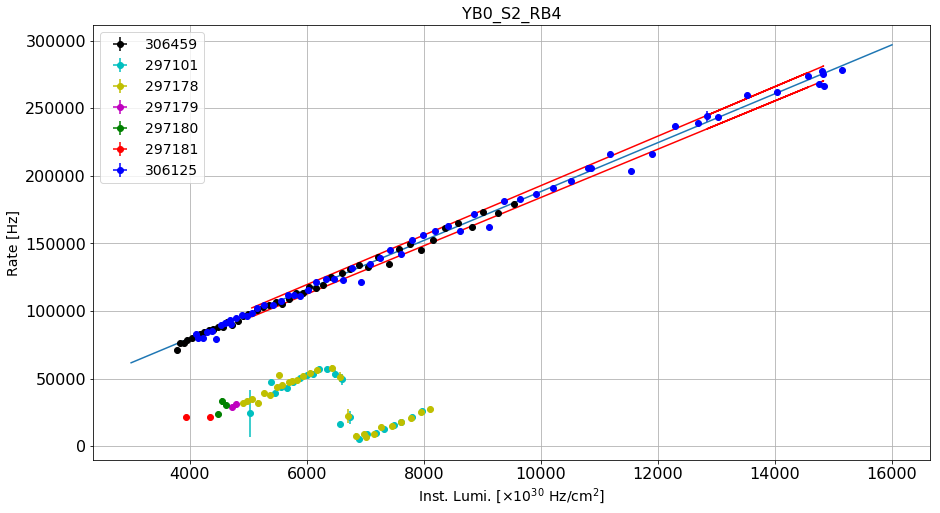

----------------------------------------------------------------------------------------------------------------
YB0_S3_RB1
Linear correlation: (0.9759724960127959, 2.0139060441812568e-31)
Linear fit parameters: [   5.14166292 3786.26468092]
Paramenters uncertainty: [1.75055827e-01 1.71123971e+03]


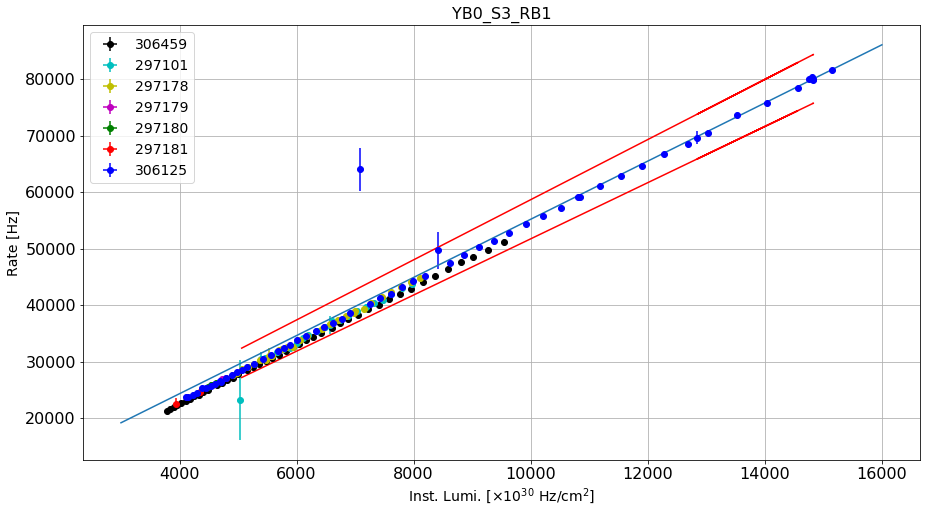

----------------------------------------------------------------------------------------------------------------
YB0_S3_RB2
Linear correlation: (0.980410169322489, 1.414078053621079e-25)
Linear fit parameters: [2.63821317e+00 7.58744469e+03]
Paramenters uncertainty: [9.36957737e-02 7.61244258e+02]


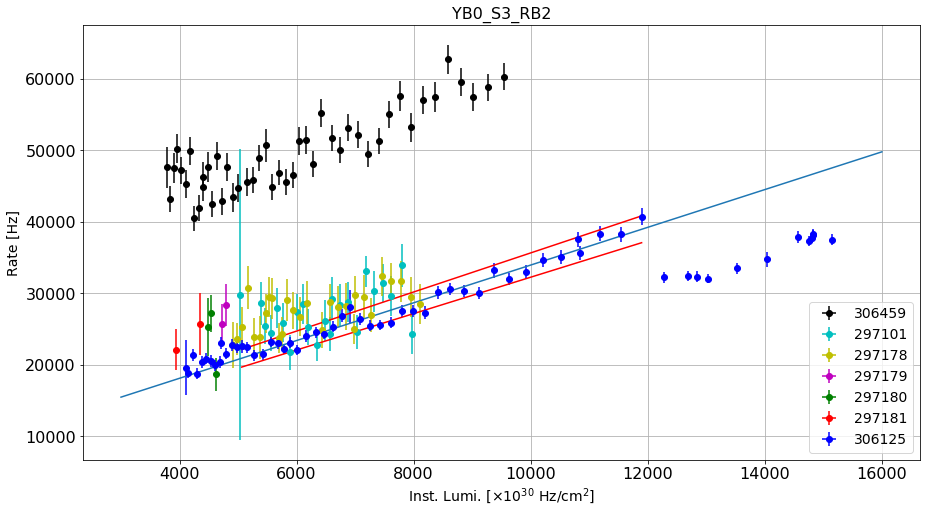

----------------------------------------------------------------------------------------------------------------
YB0_S3_RB3
Linear correlation: (0.9979064320117127, 3.603233846152833e-55)
Linear fit parameters: [7.63669913e-01 2.99524554e+03]
Paramenters uncertainty: [7.54766712e-03 7.37814212e+01]


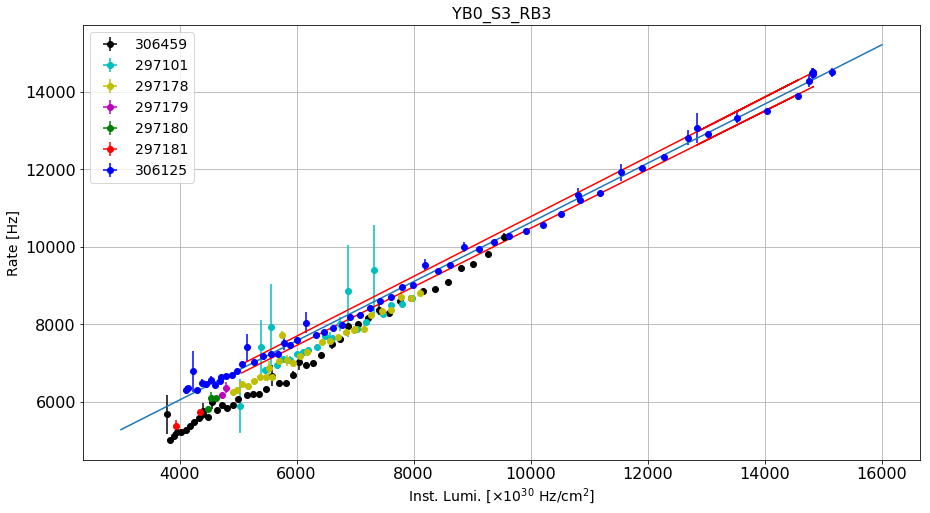

----------------------------------------------------------------------------------------------------------------
YB0_S3_RB4
Linear correlation: (0.9998818534334476, 2.9856774976263814e-83)
Linear fit parameters: [   30.58740988 21628.7026769 ]
Paramenters uncertainty: [7.17088092e-02 7.00981876e+02]


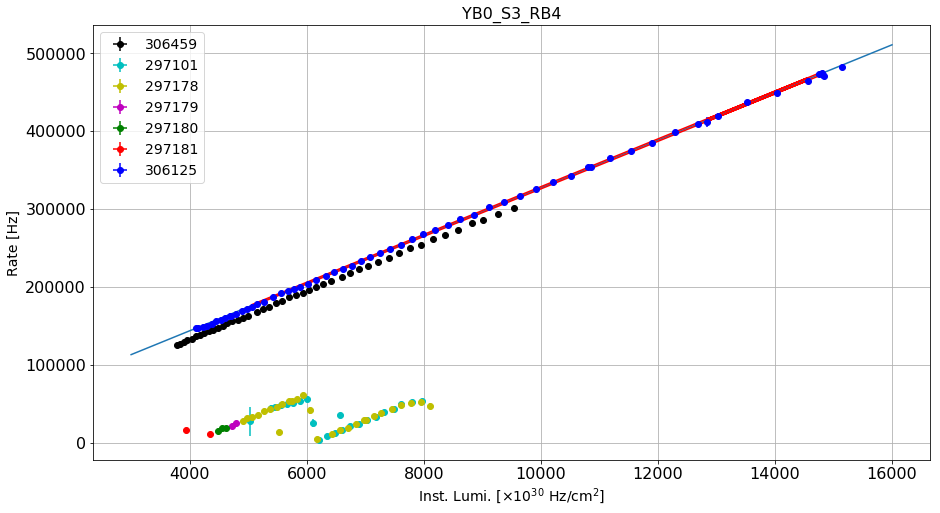

----------------------------------------------------------------------------------------------------------------
YB0_S4_RB1
Linear correlation: (0.9999549448655796, 1.135380102105884e-92)
Linear fit parameters: [   5.32160915 1847.09999008]
Paramenters uncertainty: [7.70389872e-03 7.53086467e+01]


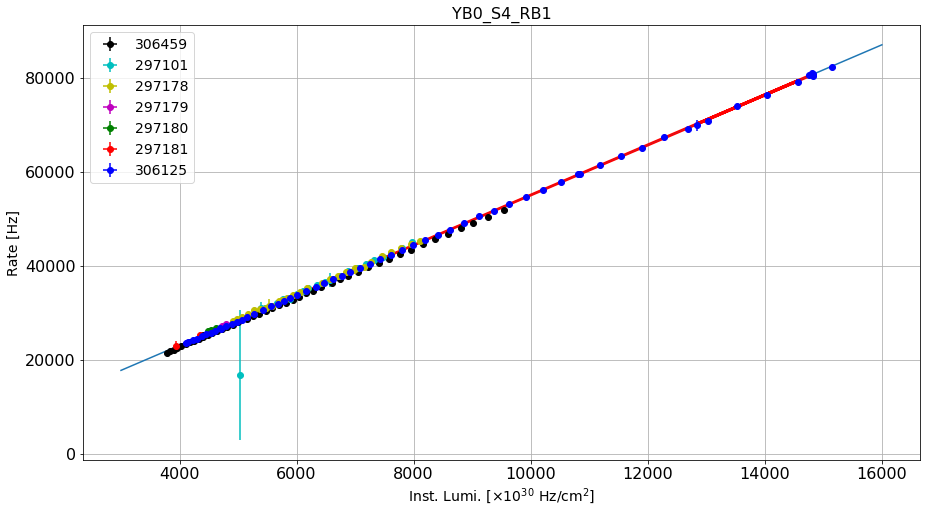

----------------------------------------------------------------------------------------------------------------
YB0_S4_RB2
Linear correlation: (0.9997832650516514, 2.532378420711009e-77)
Linear fit parameters: [1.89075698e+00 2.80941102e+03]
Paramenters uncertainty: [6.00415037e-03 5.86929365e+01]


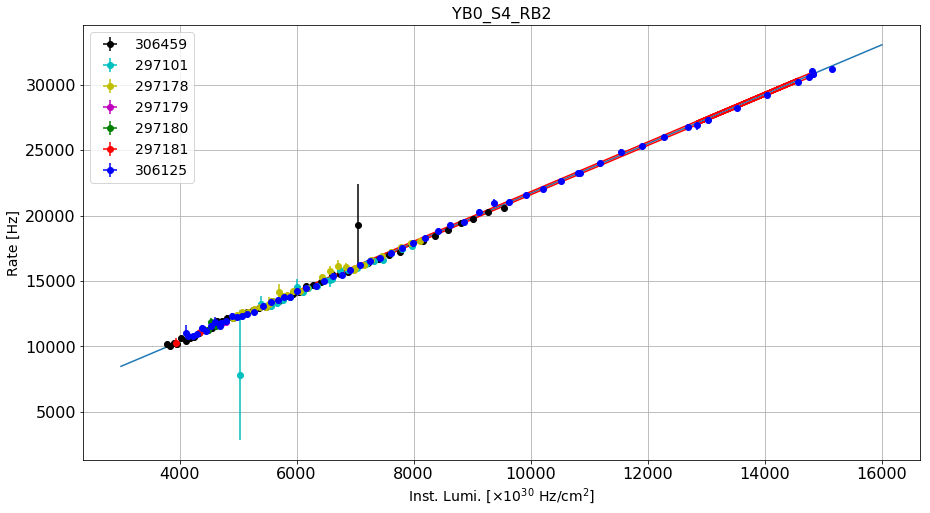

----------------------------------------------------------------------------------------------------------------
YB0_S4_RB3
Linear correlation: (0.7830712280536305, 7.796479437488979e-11)
Linear fit parameters: [1.00241585e+00 4.51293376e+03]
Paramenters uncertainty: [1.21410250e-01 1.18683305e+03]


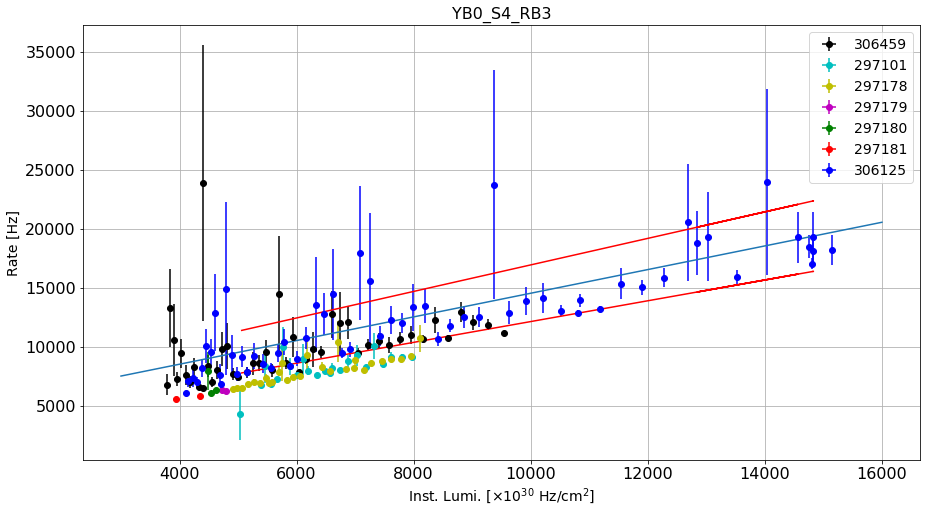

----------------------------------------------------------------------------------------------------------------
YB0_S4_RB4
Linear correlation: (0.999937011180785, 2.134236807363673e-89)
Linear fit parameters: [   57.1126601  23047.81681659]
Paramenters uncertainty: [9.77609492e-02 9.55651813e+02]


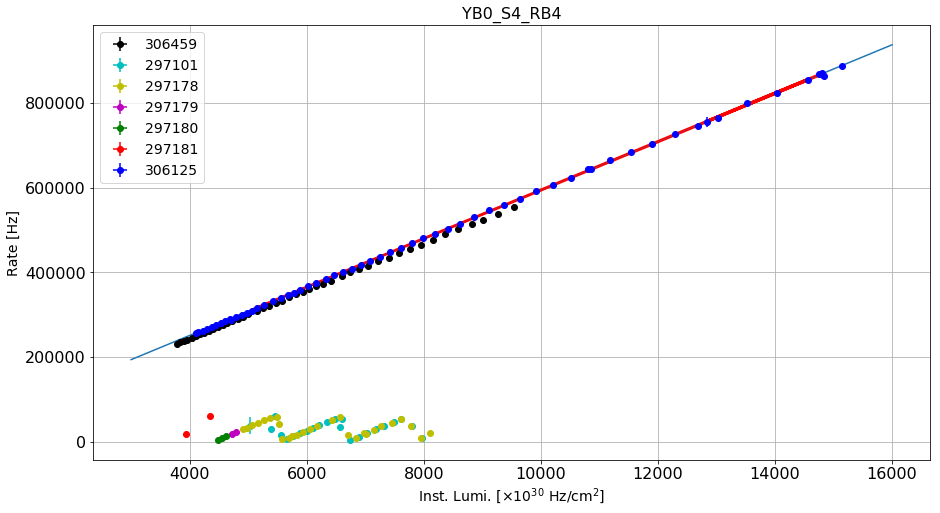

----------------------------------------------------------------------------------------------------------------
YB0_S5_RB1
Linear correlation: (0.9998046834301214, 2.436983277551897e-78)
Linear fit parameters: [5.20872682e+00 2.21655875e+04]
Paramenters uncertainty: [1.57016583e-02 1.53489899e+02]


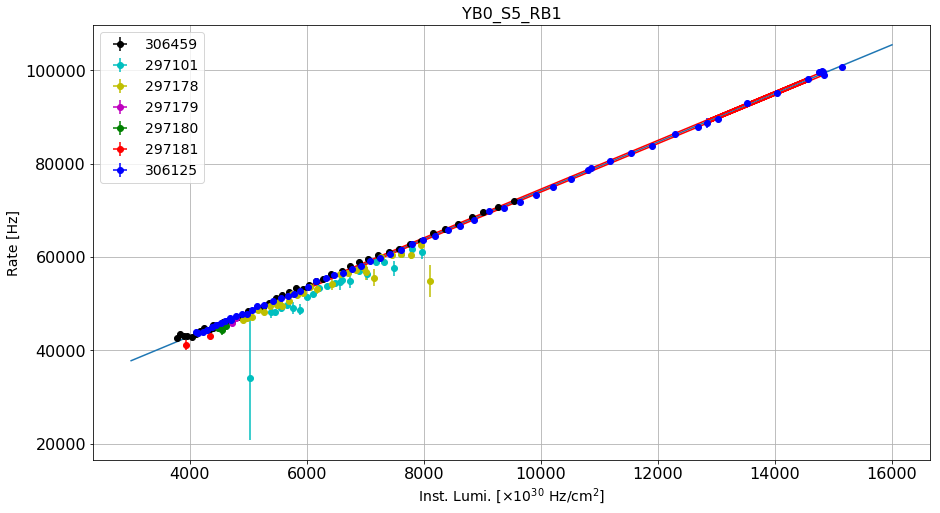

----------------------------------------------------------------------------------------------------------------
YB0_S5_RB2
Linear correlation: (0.4068976453772149, 0.004534247822588829)
Linear fit parameters: [4.16988467e+00 1.40772032e+05]
Paramenters uncertainty: [1.42758085e+00 1.39551655e+04]


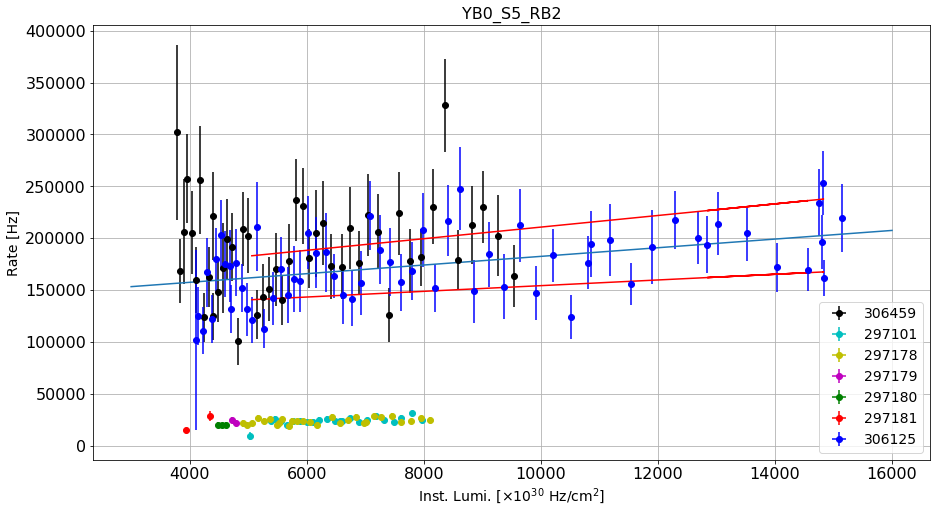

----------------------------------------------------------------------------------------------------------------
YB0_S5_RB3
Linear correlation: (0.9947727309014877, 3.047097746762777e-46)
Linear fit parameters: [7.53311554e-01 2.65299280e+03]
Paramenters uncertainty: [1.17923584e-02 1.15274951e+02]


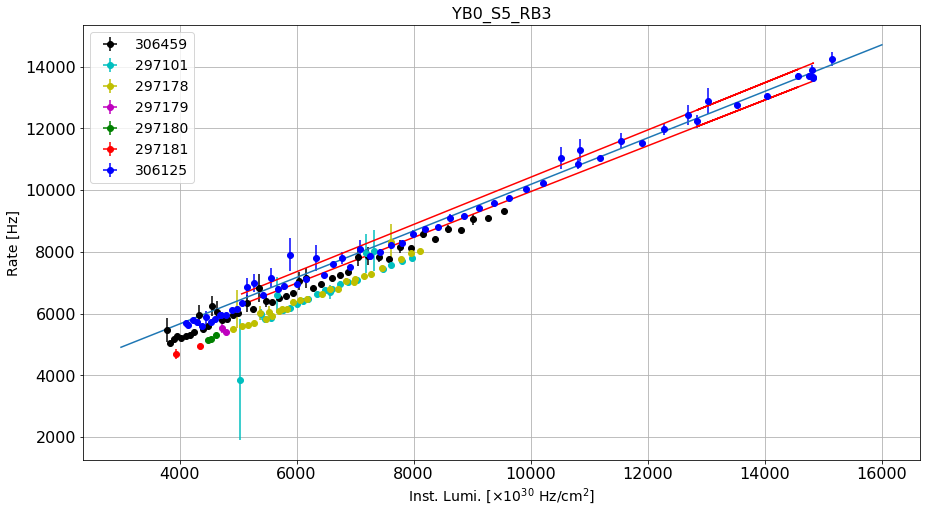

----------------------------------------------------------------------------------------------------------------
YB0_S5_RB4
Linear correlation: (0.9999320301776801, 1.1827837734523242e-88)
Linear fit parameters: [   36.91025527 14829.32543401]
Paramenters uncertainty: [6.56308496e-02 6.41567425e+02]


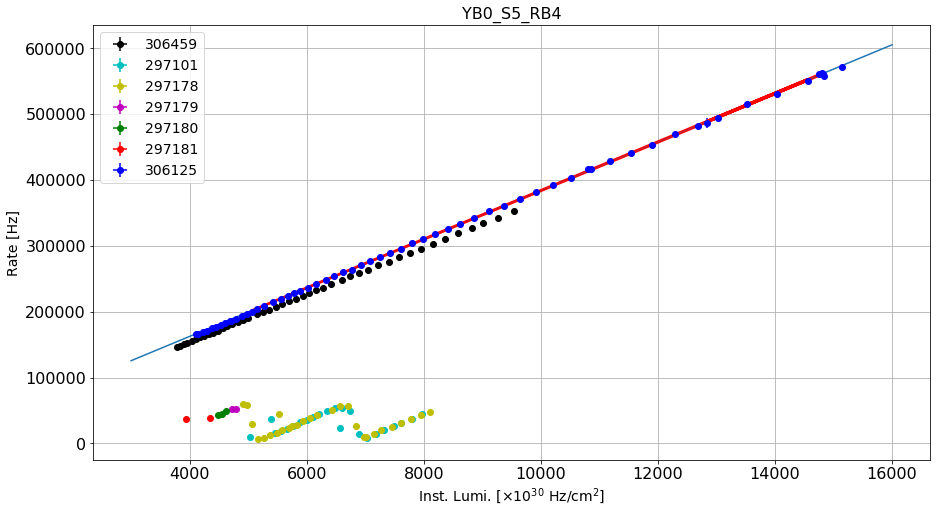

----------------------------------------------------------------------------------------------------------------
YB0_S6_RB1
Linear correlation: (0.99995870399739, 1.5989758082433518e-93)
Linear fit parameters: [   5.17797641 3133.65583066]
Paramenters uncertainty: [7.17642741e-03 7.01524067e+01]


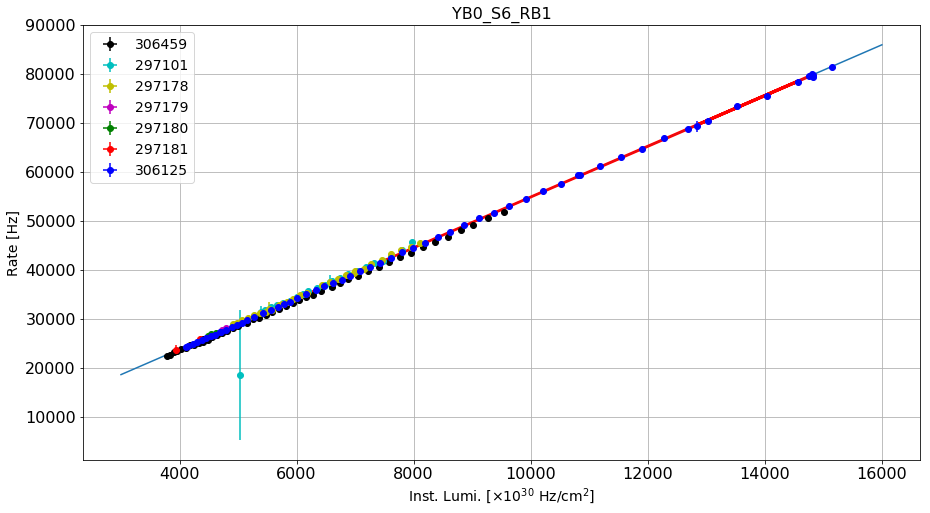

----------------------------------------------------------------------------------------------------------------
YB0_S6_RB2
Linear correlation: (0.9147703377519124, 2.4873814434472007e-19)
Linear fit parameters: [1.85704804e+00 1.17460600e+04]
Paramenters uncertainty: [1.25063496e-01 1.22254497e+03]


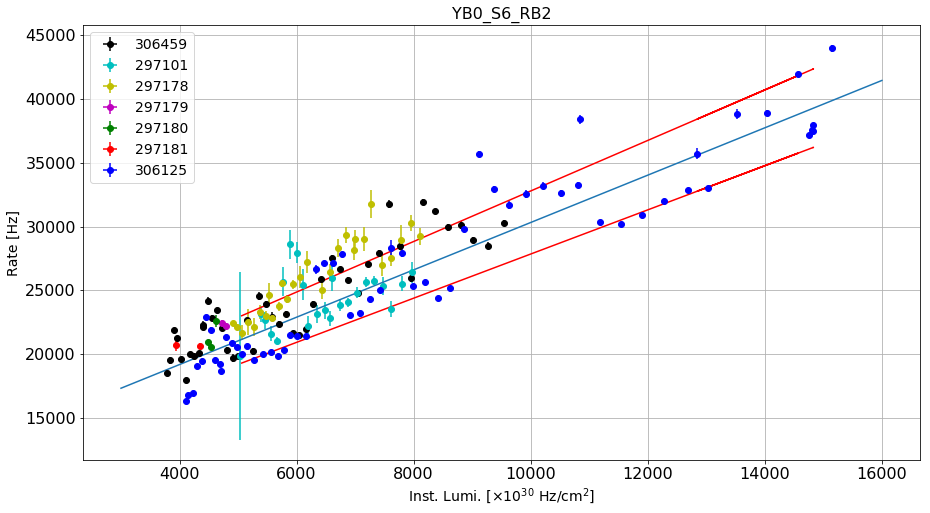

----------------------------------------------------------------------------------------------------------------
YB0_S6_RB3
Linear correlation: (0.994157811392223, 3.6974028003274367e-45)
Linear fit parameters: [6.00345733e-01 2.25678657e+03]
Paramenters uncertainty: [9.93984059e-03 9.71658598e+01]


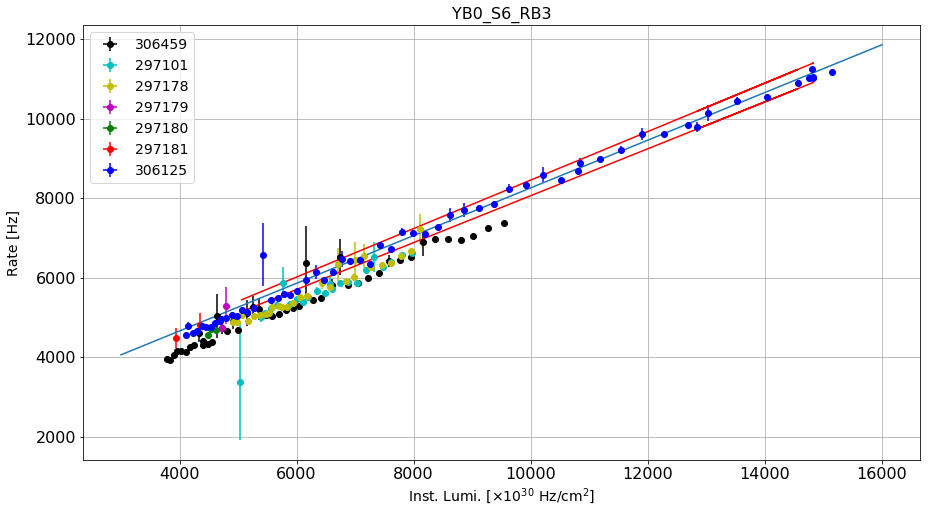

----------------------------------------------------------------------------------------------------------------
YB0_S6_RB4
Linear correlation: (0.9999409474879877, 4.9968425408665505e-90)
Linear fit parameters: [  21.83028066 8760.90045693]
Paramenters uncertainty: [3.61808290e-02 3.53681865e+02]


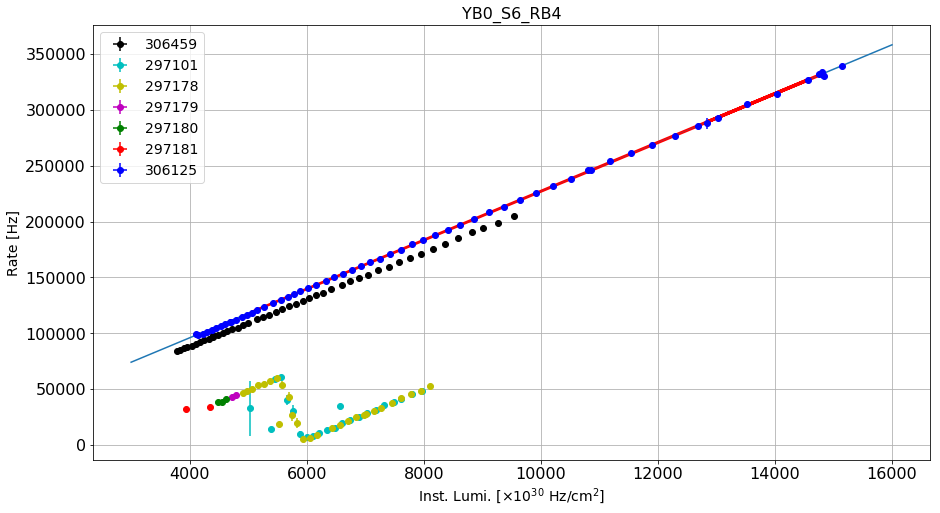

----------------------------------------------------------------------------------------------------------------
YB0_S7_RB1
Linear correlation: (0.9998346082265229, 5.77989131047987e-80)
Linear fit parameters: [   4.0678299  1856.26827565]
Paramenters uncertainty: [1.12837741e-02 1.10303340e+02]


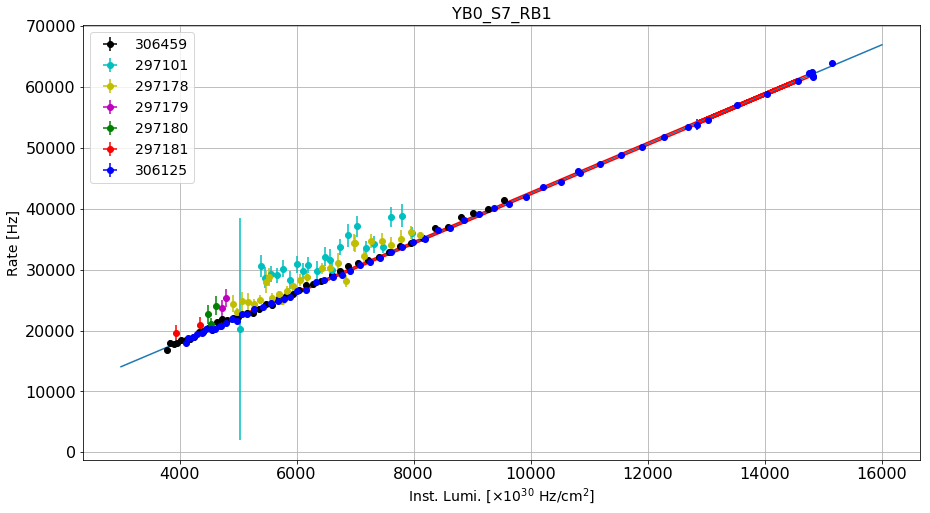

----------------------------------------------------------------------------------------------------------------
YB0_S7_RB2
Linear correlation: (0.9957533883731002, 2.8711273695386494e-48)
Linear fit parameters: [1.61677080e+00 4.32379013e+03]
Paramenters uncertainty: [2.27948713e-02 2.22828852e+02]


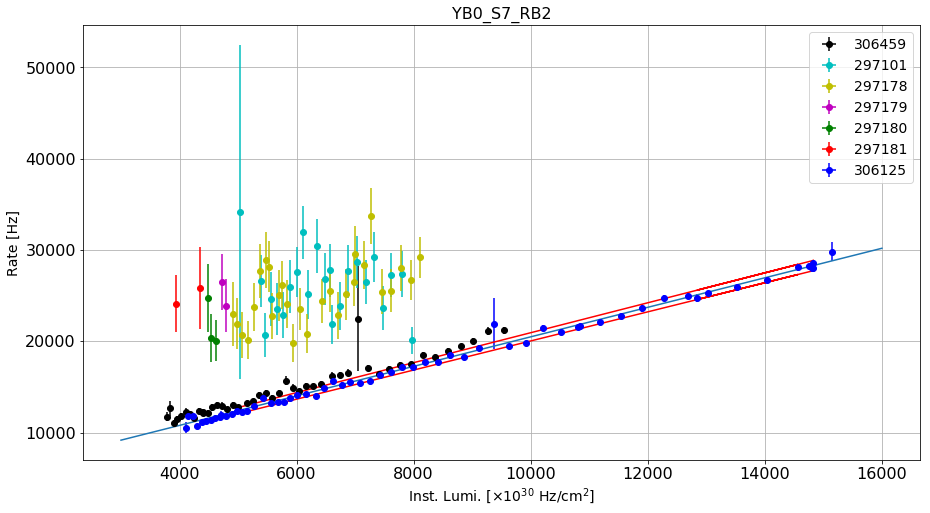

----------------------------------------------------------------------------------------------------------------
YB0_S7_RB3
Linear correlation: (0.995001533647137, 1.1157185048892194e-46)
Linear fit parameters: [4.19982366e-01 3.34808949e+03]
Paramenters uncertainty: [6.42781074e-03 6.28343836e+01]


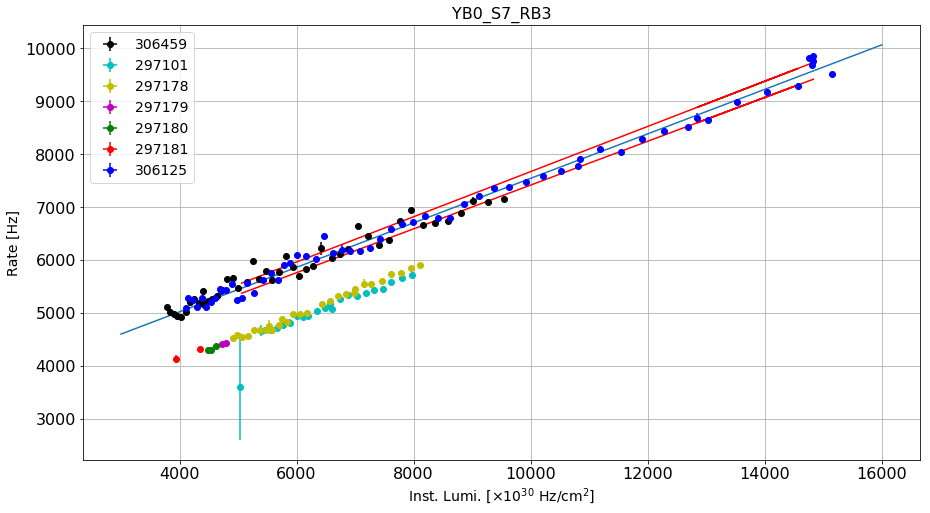

----------------------------------------------------------------------------------------------------------------
YB0_S7_RB4
Linear correlation: (0.6378133620410844, 1.4208863092432736e-06)
Linear fit parameters: [ 1.76949012e-03 -3.12789272e+00]
Paramenters uncertainty: [3.25850746e-04 3.18531948e+00]


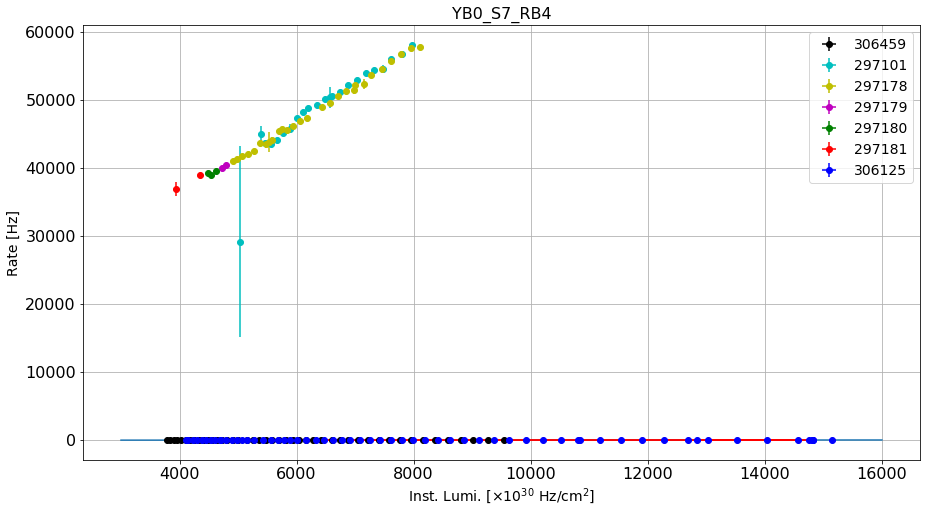

----------------------------------------------------------------------------------------------------------------
YB0_S8_RB1
Linear correlation: (0.9984368251438046, 5.061466504621642e-58)
Linear fit parameters: [   4.17076949 1448.37466795]
Paramenters uncertainty: [3.56049485e-02 3.48052406e+02]


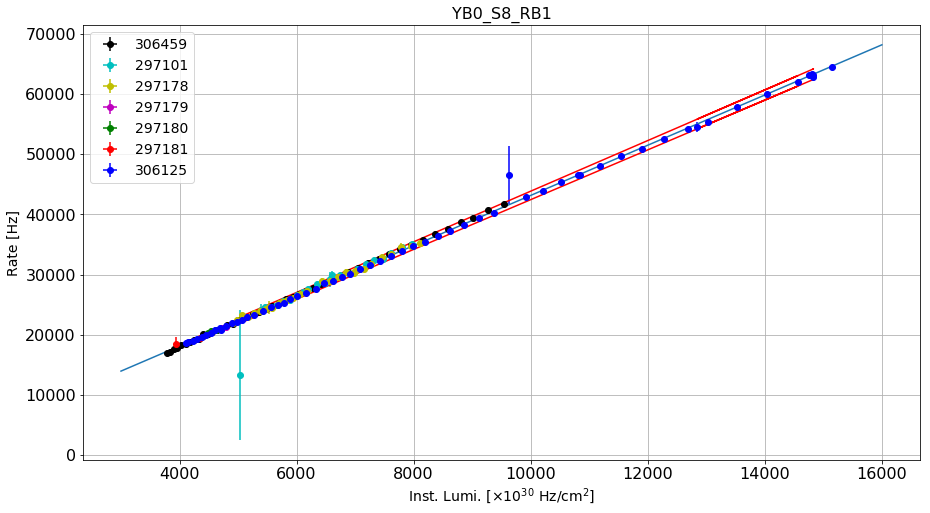

----------------------------------------------------------------------------------------------------------------
YB0_S8_RB2
Linear correlation: (0.5434733752259651, 7.890595571024651e-05)
Linear fit parameters: [3.32735251e+00 3.77243373e+04]
Paramenters uncertainty: [7.83734455e-01 7.66131322e+03]


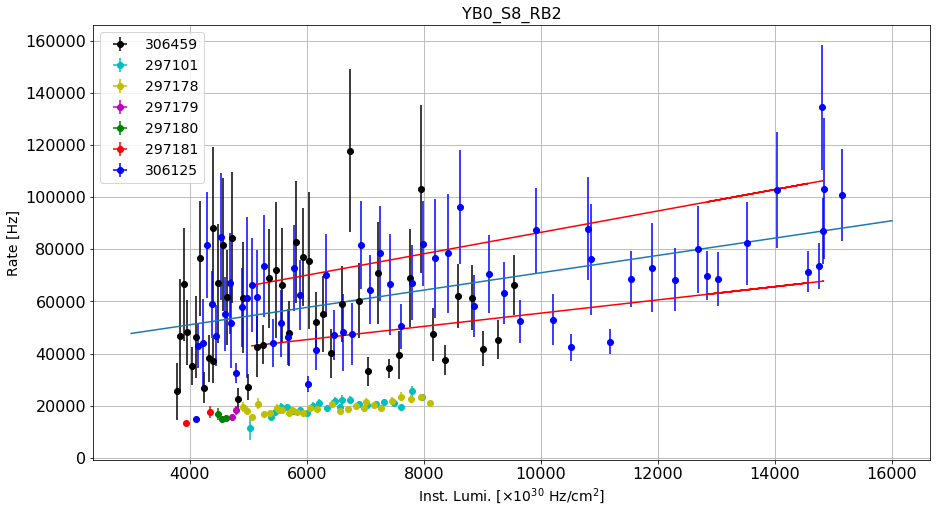

----------------------------------------------------------------------------------------------------------------
YB0_S8_RB3
Linear correlation: (0.7981466424172124, 1.8305946452253176e-11)
Linear fit parameters: [1.00125690e+00 5.54997926e+04]
Paramenters uncertainty: [1.15254833e-01 1.12666142e+03]


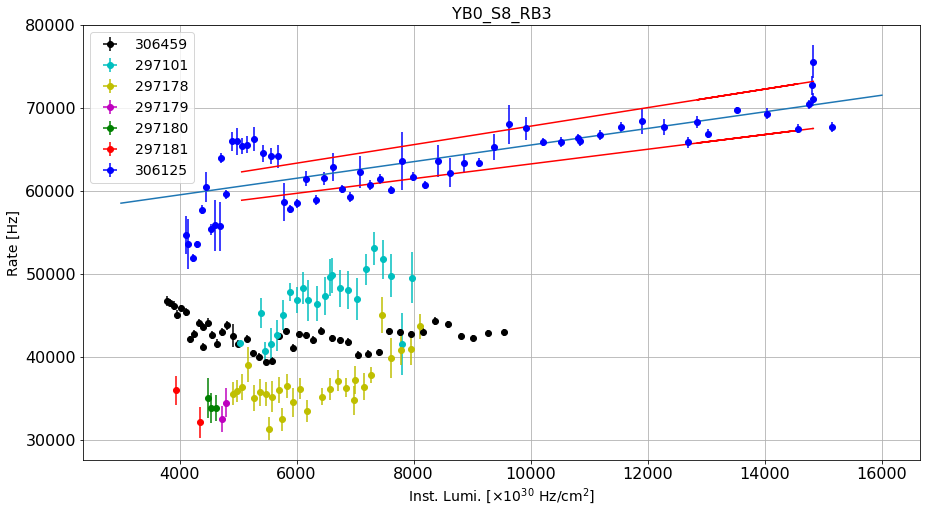

----------------------------------------------------------------------------------------------------------------
YB0_S8_RB4
Linear correlation: (0.9999356122743532, 3.498466750691694e-89)
Linear fit parameters: [   6.58070448 3544.57705073]
Paramenters uncertainty: [1.13887399e-02 1.11329421e+02]


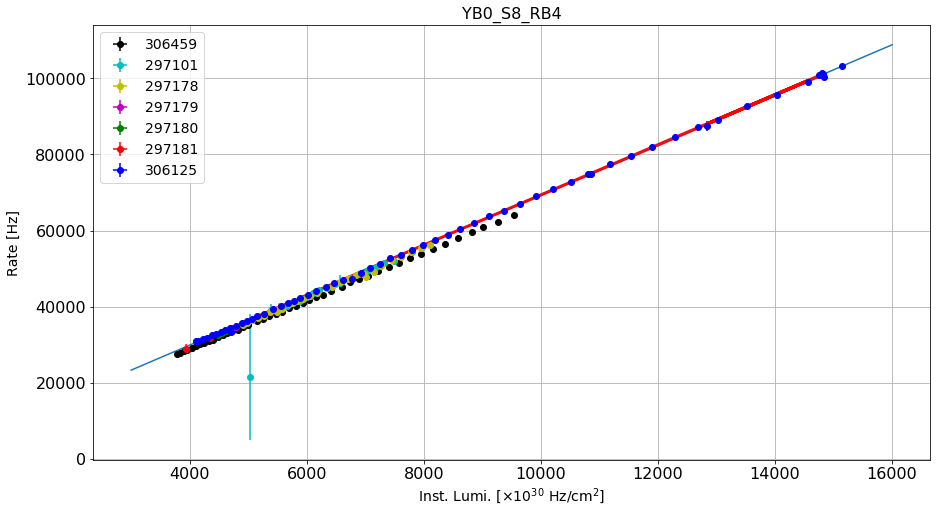

----------------------------------------------------------------------------------------------------------------
YB0_S9_RB1
Linear correlation: (0.9997423495355985, 1.2391968718594788e-75)
Linear fit parameters: [   5.40611231 3398.64618773]
Paramenters uncertainty: [1.87182496e-02 1.82978268e+02]


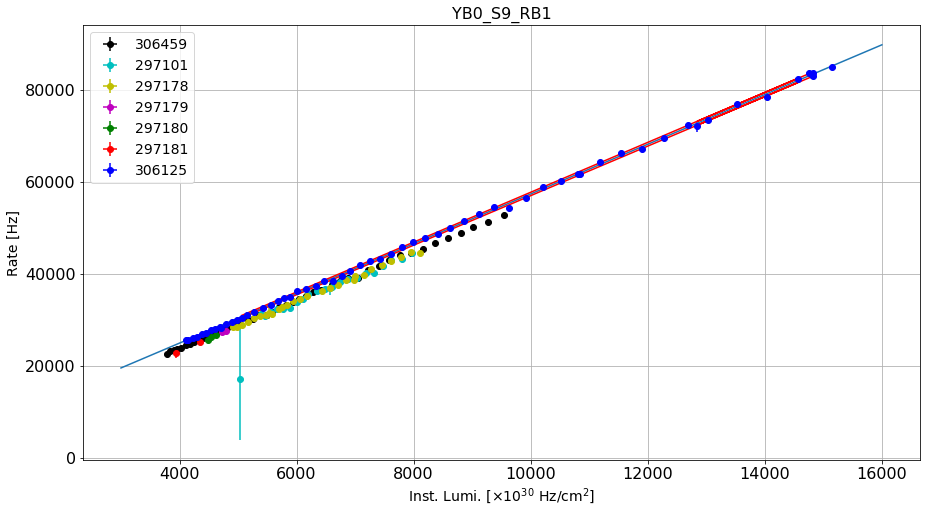

----------------------------------------------------------------------------------------------------------------
YB0_S9_RB2
Linear correlation: (0.5682337538320168, 0.0013010324423729778)
Linear fit parameters: [ 1.16589168e+01 -4.76727026e+04]
Paramenters uncertainty: [3.37668783e+00 2.45051347e+04]


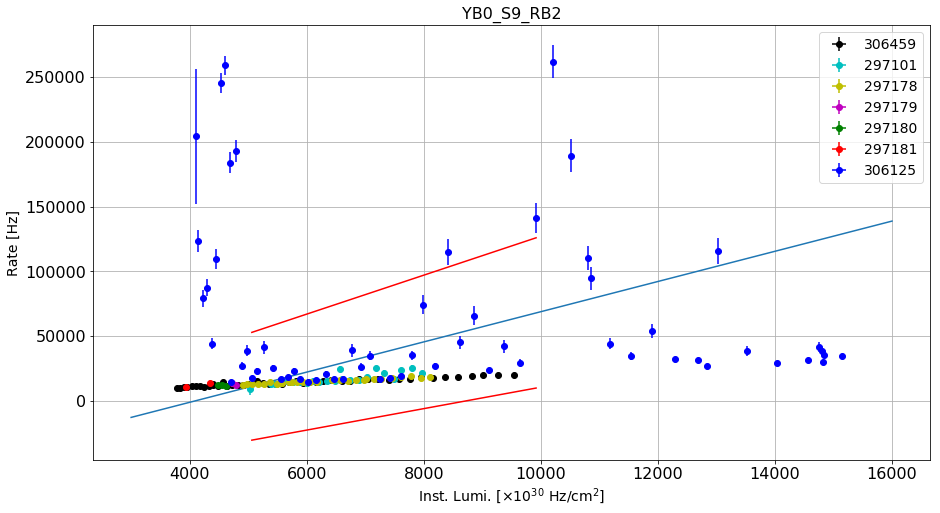

----------------------------------------------------------------------------------------------------------------
YB0_S9_RB3
Linear correlation: (0.9989555743932834, 5.8367414072752365e-62)
Linear fit parameters: [3.53640965e-01 2.40445368e+03]
Paramenters uncertainty: [2.46673498e-03 2.41133067e+01]


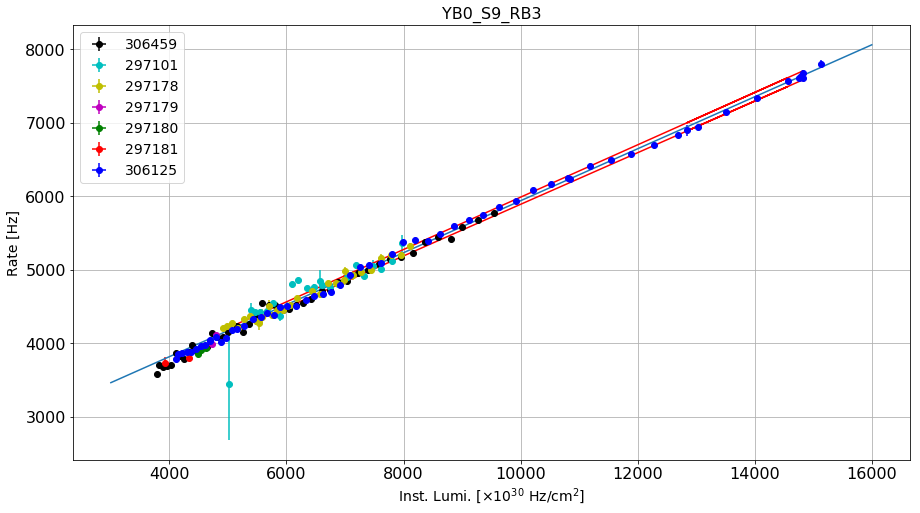

----------------------------------------------------------------------------------------------------------------
YB0_S9_RB4
Linear correlation: (0.9580161828645142, 4.741698796385301e-26)
Linear fit parameters: [4.18619432e-01 3.25894172e+03]
Paramenters uncertainty: [1.91056321e-02 1.86765085e+02]


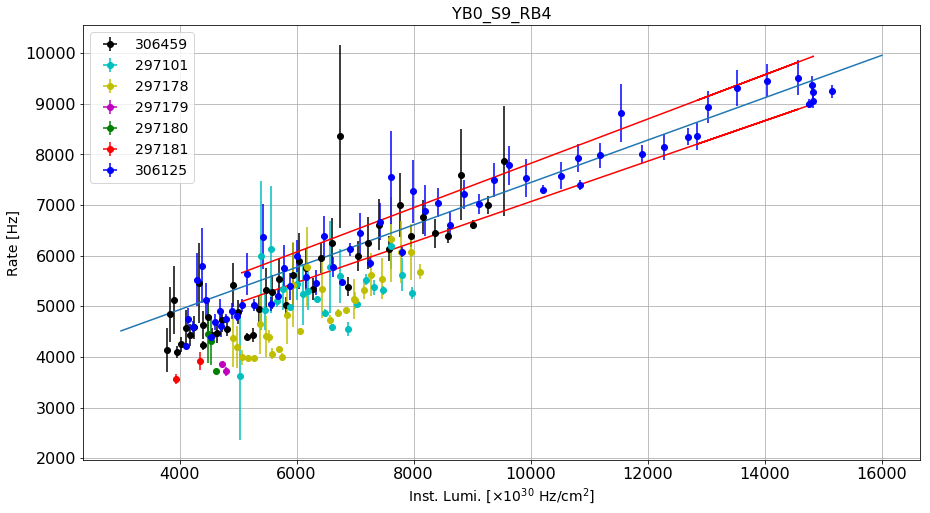

----------------------------------------------------------------------------------------------------------------
YB0_S10_RB1
Linear correlation: (0.9999540837731629, 1.7383220828434252e-92)
Linear fit parameters: [   5.06602281 1919.30713981]
Paramenters uncertainty: [7.40365143e-03 7.23736111e+01]


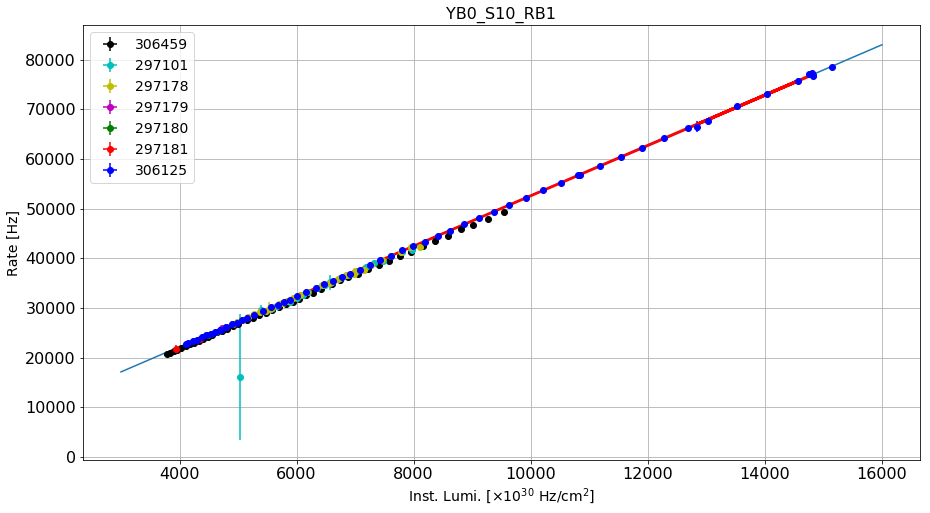

----------------------------------------------------------------------------------------------------------------
YB0_S10_RB2
Linear correlation: (0.999780454122143, 3.384026093890896e-77)
Linear fit parameters: [1.67882091e+00 3.10875513e+03]
Paramenters uncertainty: [5.36561247e-03 5.24509769e+01]


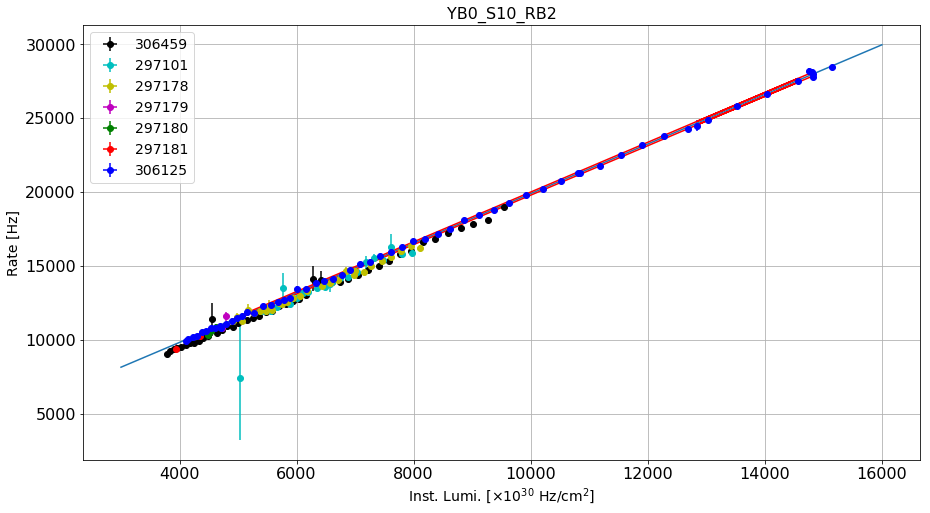

----------------------------------------------------------------------------------------------------------------
YB0_S10_RB3
Linear correlation: (0.9912314707629328, 3.331757701321007e-41)
Linear fit parameters: [2.83437697e-01 2.95520678e+03]
Paramenters uncertainty: [5.76199068e-03 5.63257301e+01]


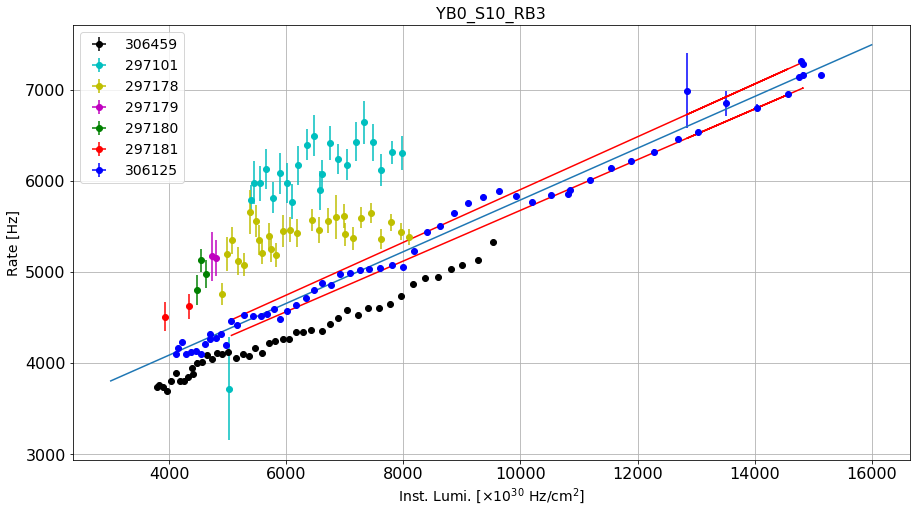

----------------------------------------------------------------------------------------------------------------
YB0_S10_RB4
Linear correlation: (0.9989924543599592, 2.600445552156488e-62)
Linear fit parameters: [8.14414156e-01 2.61057474e+03]
Paramenters uncertainty: [5.57939129e-03 5.45407491e+01]


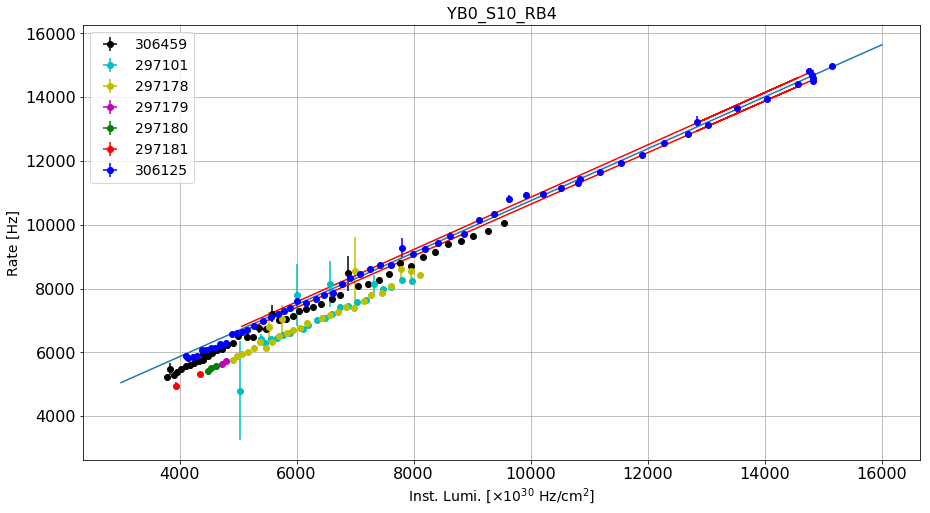

----------------------------------------------------------------------------------------------------------------
YB0_S11_RB1
Linear correlation: (0.997678572907294, 3.6745352766518455e-54)
Linear fit parameters: [5.23200694e+00 8.40863672e+03]
Paramenters uncertainty: [5.44607689e-02 5.32375482e+02]


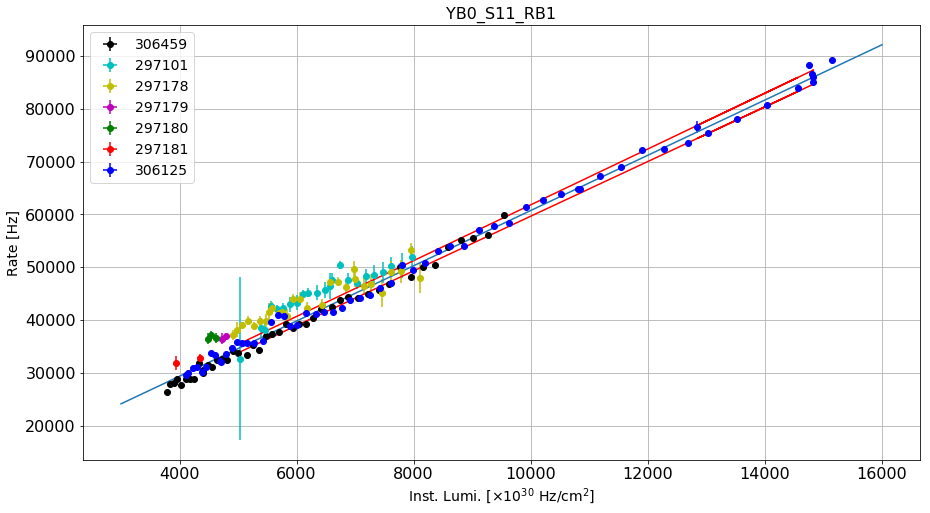

----------------------------------------------------------------------------------------------------------------
YB0_S11_RB2
Linear correlation: (0.9938252512173802, 1.2805300870322667e-44)
Linear fit parameters: [1.71233981e+00 6.93581422e+03]
Paramenters uncertainty: [2.91540498e-02 2.84992329e+02]


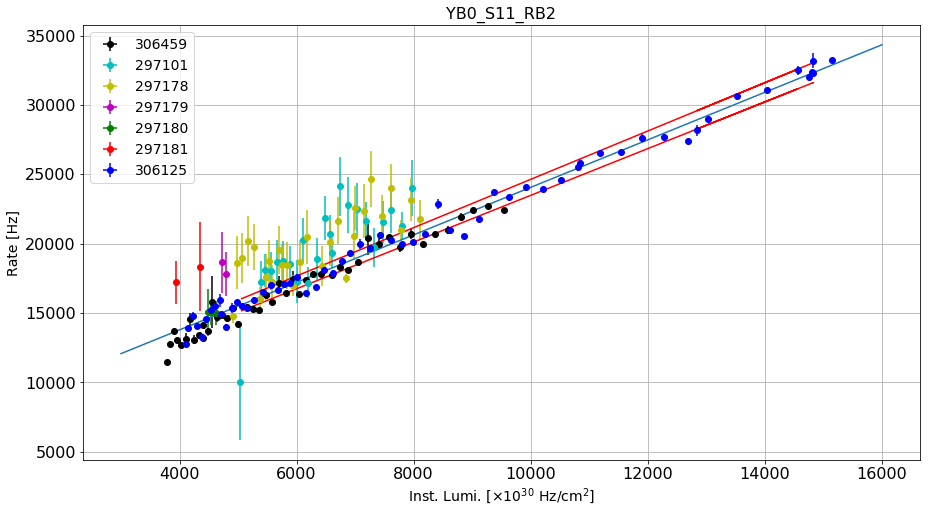

----------------------------------------------------------------------------------------------------------------
YB0_S11_RB3
Linear correlation: (0.9714744479779175, 9.130785430637657e-30)
Linear fit parameters: [2.81049736e-01 2.80717823e+03]
Paramenters uncertainty: [1.04623724e-02 1.02273815e+02]


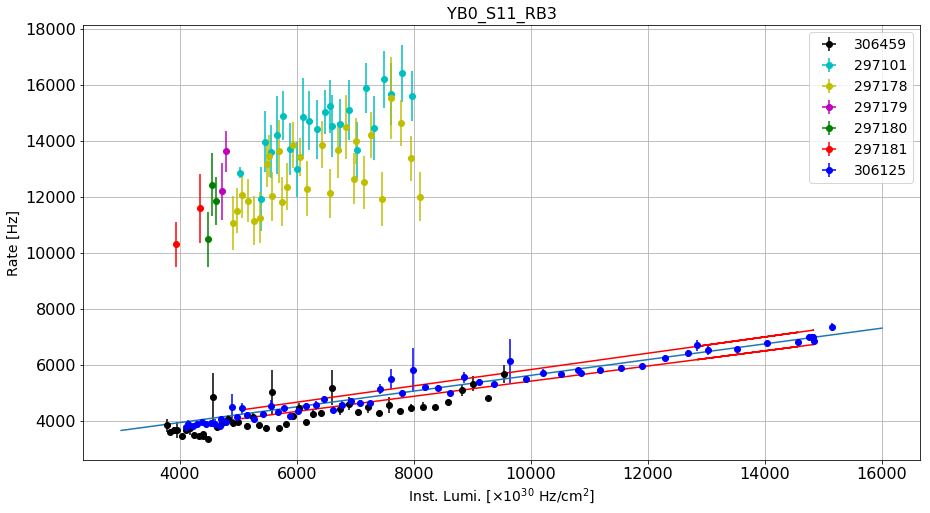

----------------------------------------------------------------------------------------------------------------
YB0_S11_RB4
Linear correlation: (0.9908249633522088, 9.197556771028513e-41)
Linear fit parameters: [3.51294944e-01 5.81862915e+03]
Paramenters uncertainty: [7.30737129e-03 7.14324348e+01]


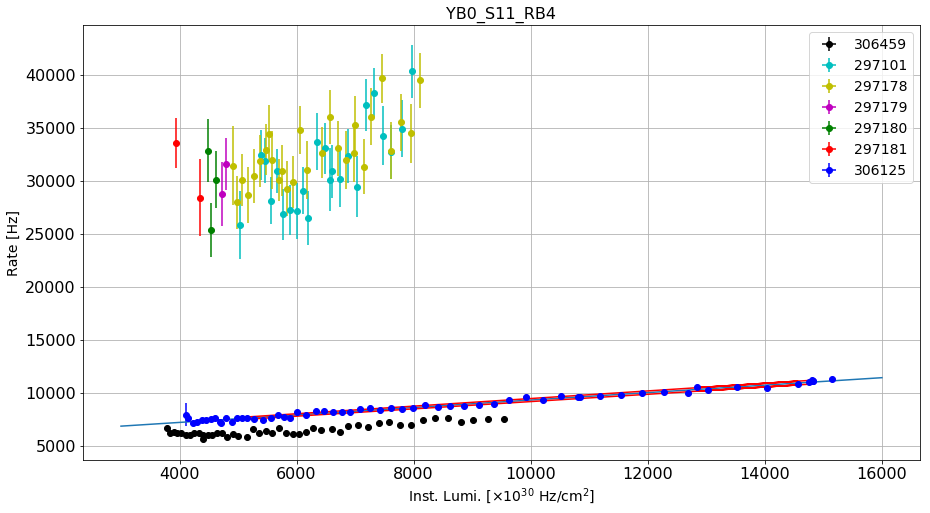

----------------------------------------------------------------------------------------------------------------
YB0_S12_RB1
Linear correlation: (0.9990528983157994, 6.468229053682706e-63)
Linear fit parameters: [   4.96582553 4202.64144336]
Paramenters uncertainty: [3.29821675e-02 3.22413688e+02]


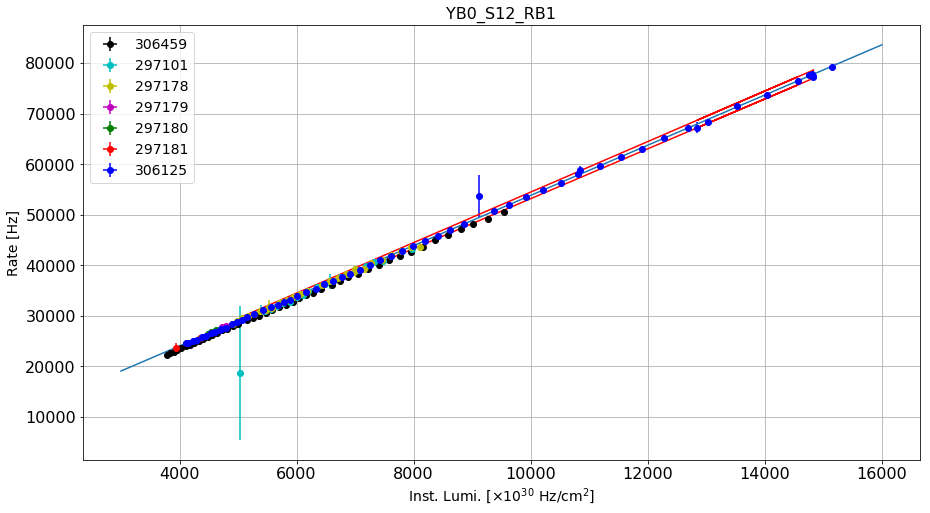

----------------------------------------------------------------------------------------------------------------
YB0_S12_RB2
Linear correlation: (0.9921456482807278, 2.824270472291016e-42)
Linear fit parameters: [1.78036373e+00 1.15262864e+04]
Paramenters uncertainty: [3.42306224e-02 3.34617827e+02]


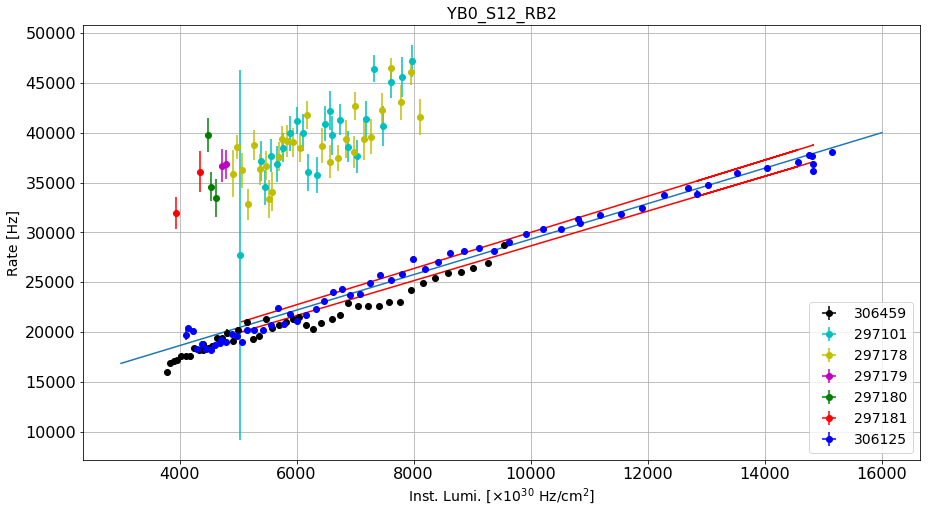

----------------------------------------------------------------------------------------------------------------
YB0_S12_RB3
Linear correlation: (0.8296469798533761, 5.735499682706495e-13)
Linear fit parameters: [5.14285765e-01 1.91716390e+04]
Paramenters uncertainty: [5.27758831e-02 5.15905060e+02]


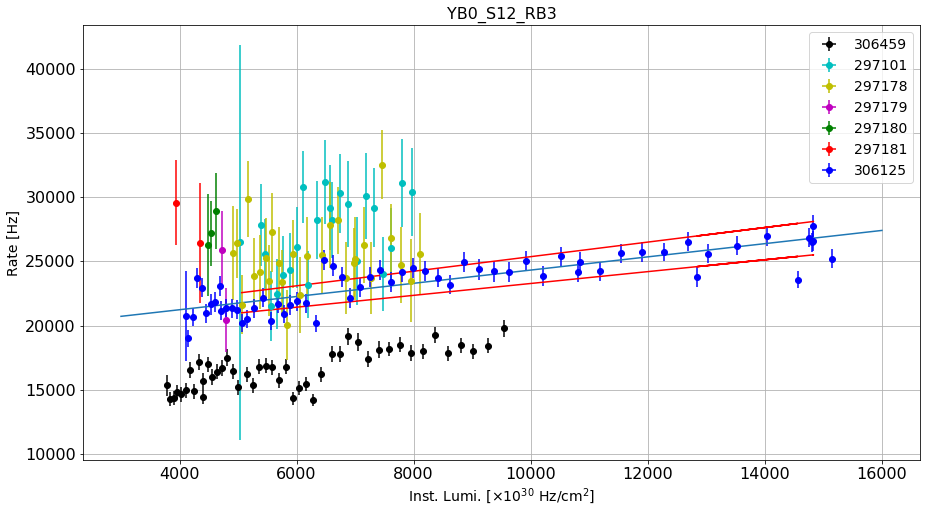

----------------------------------------------------------------------------------------------------------------
YB0_S12_RB4
Linear correlation: (0.9999361063056933, 2.9418162327784185e-89)
Linear fit parameters: [   5.78542231 3525.51537202]
Paramenters uncertainty: [9.97391467e-03 9.74989473e+01]


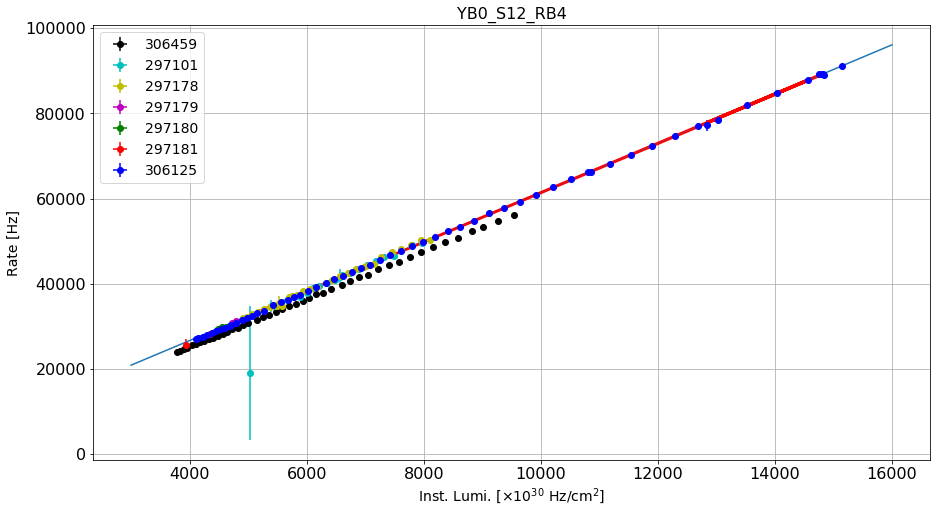

----------------------------------------------------------------------------------------------------------------
YB+1_S1_RB1
Linear correlation: (0.9999367206058339, 2.3670930418068093e-89)
Linear fit parameters: [  12.2110228  1660.31606287]
Paramenters uncertainty: [2.09500267e-02 2.04794769e+02]


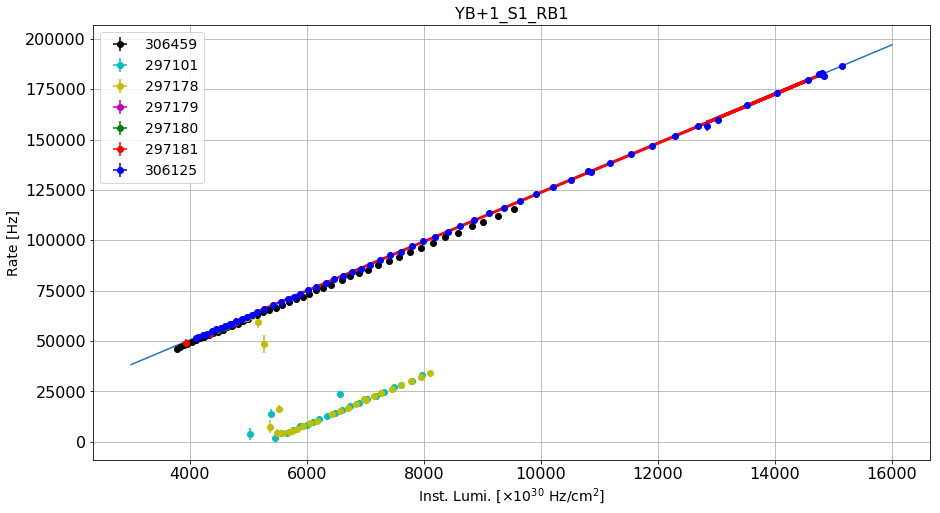

----------------------------------------------------------------------------------------------------------------
YB+1_S1_RB2
Linear correlation: (0.9992212489791599, 7.92654024536552e-65)
Linear fit parameters: [   4.32044559 4165.19378165]
Paramenters uncertainty: [2.60173102e-02 2.54329463e+02]


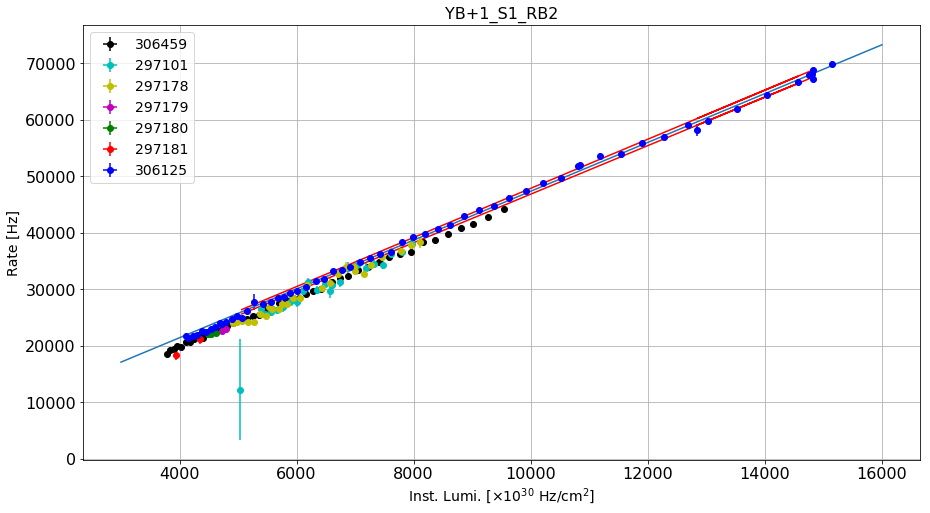

----------------------------------------------------------------------------------------------------------------
YB+1_S1_RB3
Linear correlation: (0.8694790329178387, 2.224573748891908e-15)
Linear fit parameters: [6.30965981e-01 9.78036838e+04]
Paramenters uncertainty: [5.46654647e-02 5.34376465e+02]


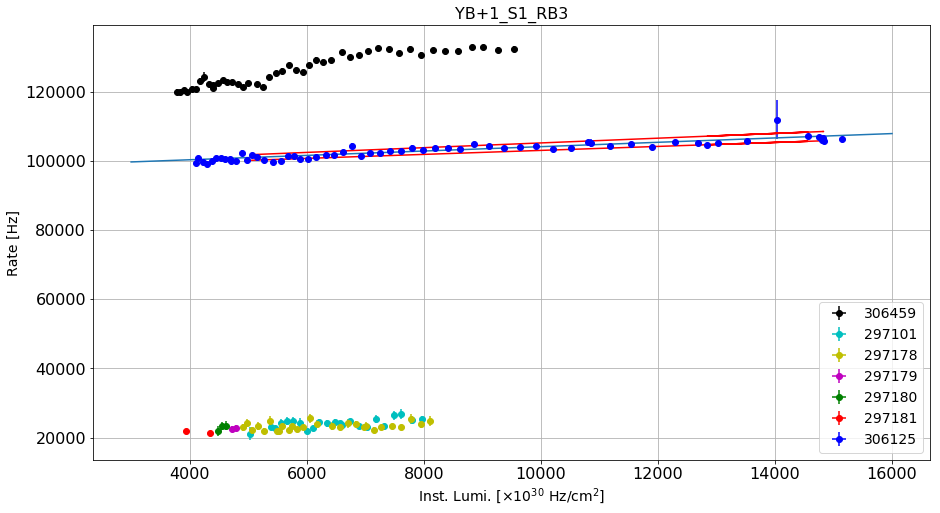

----------------------------------------------------------------------------------------------------------------
YB+1_S1_RB4
Linear correlation: (0.9999267131635204, 6.439512686947798e-88)
Linear fit parameters: [  17.8971011  9981.49815966]
Paramenters uncertainty: [3.30445865e-02 3.23023858e+02]


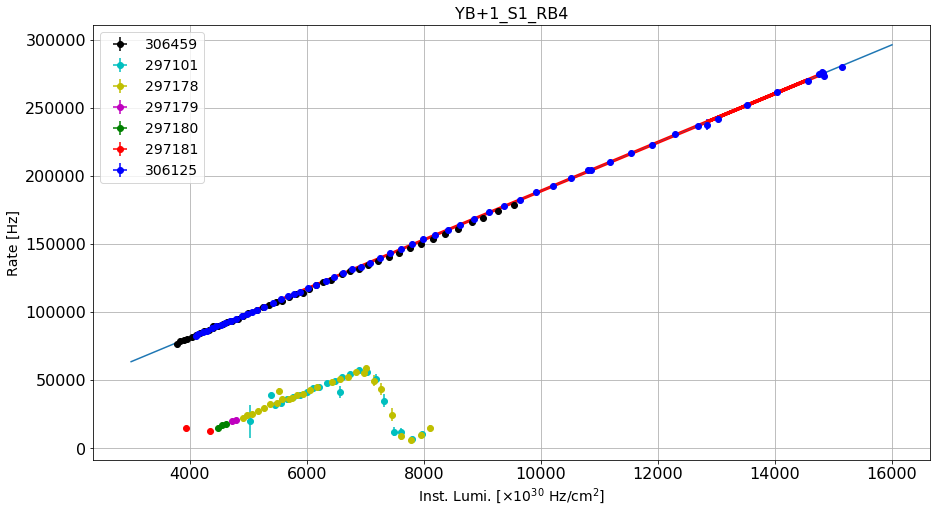

----------------------------------------------------------------------------------------------------------------
YB+1_S2_RB1
Linear correlation: (0.9999214758351203, 3.043126391813699e-87)
Linear fit parameters: [  16.35175997 8752.95091774]
Paramenters uncertainty: [3.12516185e-02 3.05496890e+02]


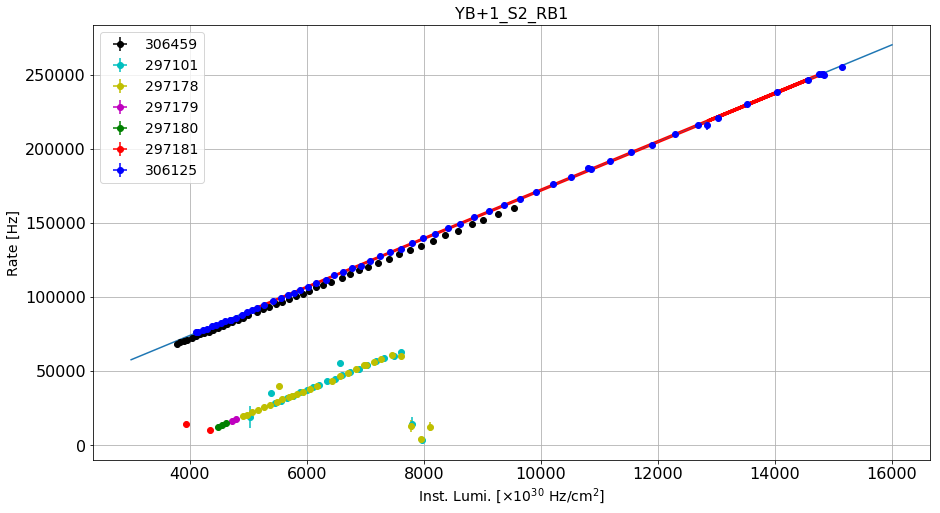

----------------------------------------------------------------------------------------------------------------
YB+1_S2_RB2
Linear correlation: (0.9996893291639961, 8.34580623974393e-74)
Linear fit parameters: [3.54347646e+00 6.86138516e+03]
Paramenters uncertainty: [1.34729214e-02 1.31703117e+02]


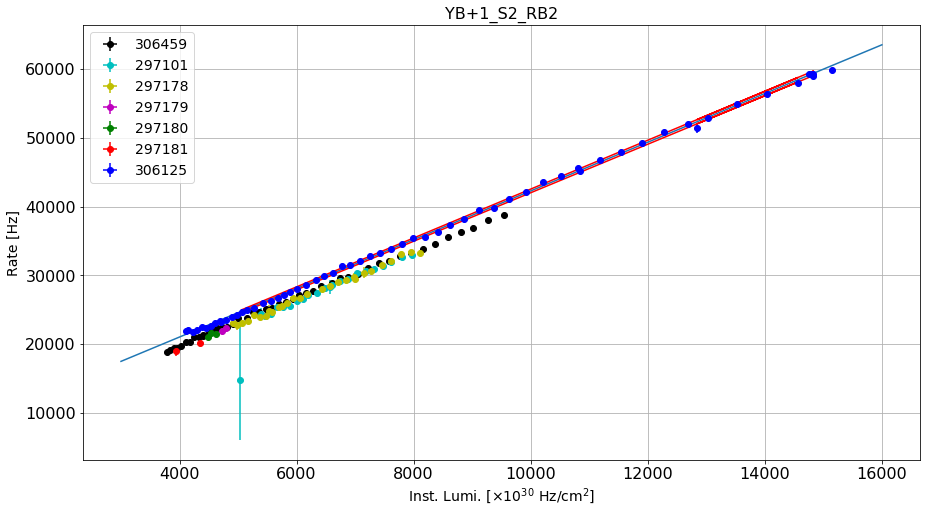

----------------------------------------------------------------------------------------------------------------
YB+1_S2_RB3
Linear correlation: (0.9961587696490628, 3.016432138807377e-49)
Linear fit parameters: [7.37843754e-01 7.99045790e+03]
Paramenters uncertainty: [9.89086630e-03 9.66871168e+01]


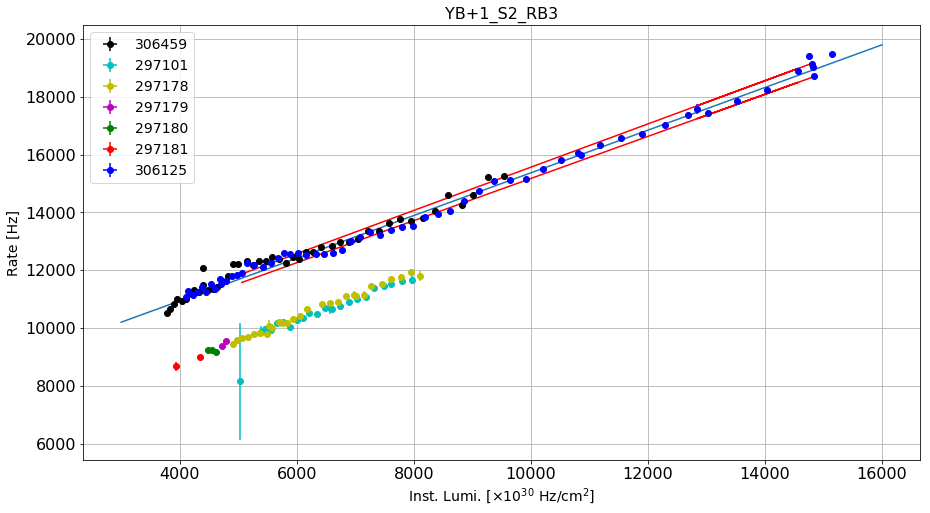

----------------------------------------------------------------------------------------------------------------
YB+1_S2_RB4
Linear correlation: (0.9999367919422584, 2.307775925872507e-89)
Linear fit parameters: [  24.44814287 9390.64912634]
Paramenters uncertainty: [4.19211759e-02 4.09796019e+02]


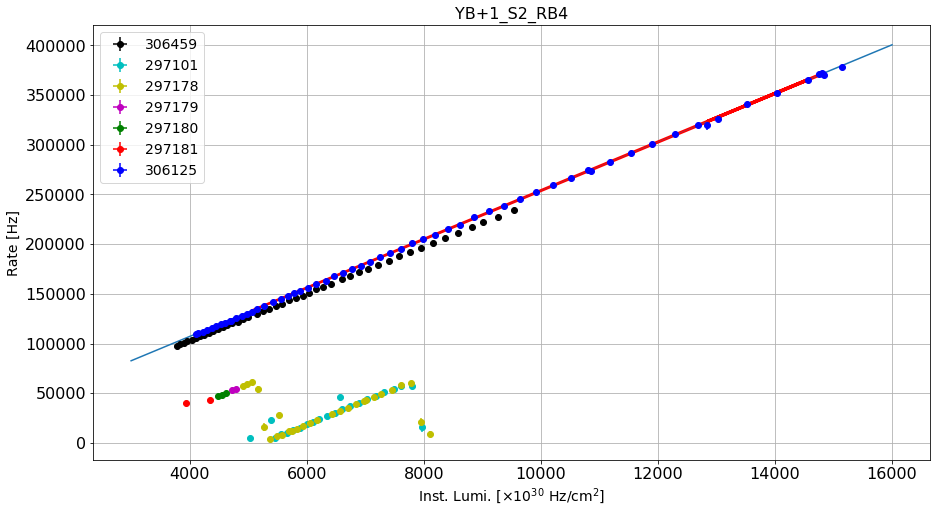

----------------------------------------------------------------------------------------------------------------
YB+1_S3_RB1
Linear correlation: (0.9997525488002791, 4.9946512943148236e-76)
Linear fit parameters: [  13.4072826 3245.8576578]
Paramenters uncertainty: [4.54932462e-02 4.44714414e+02]


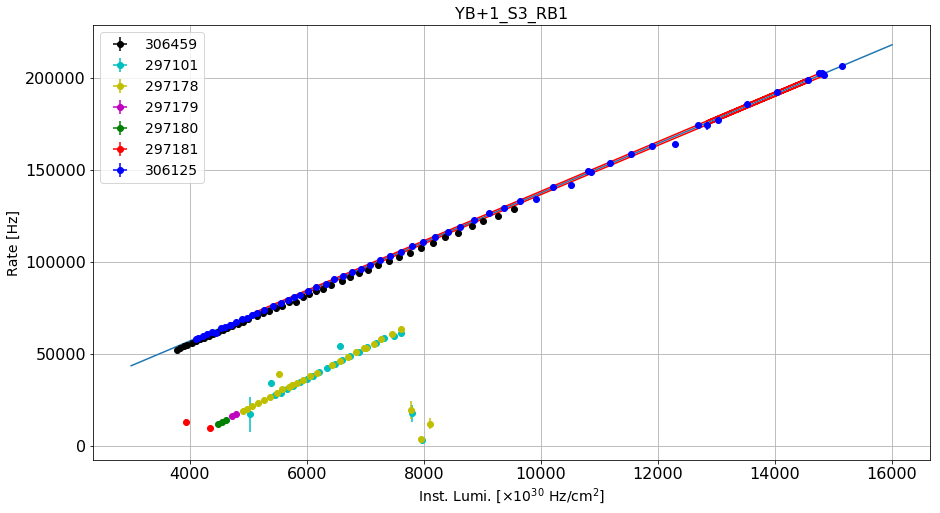

----------------------------------------------------------------------------------------------------------------
YB+1_S3_RB2
Linear correlation: (0.9998803075587848, 4.0000224340641926e-83)
Linear fit parameters: [3.59083788e+00 4.69101887e+03]
Paramenters uncertainty: [8.47322852e-03 8.28291487e+01]


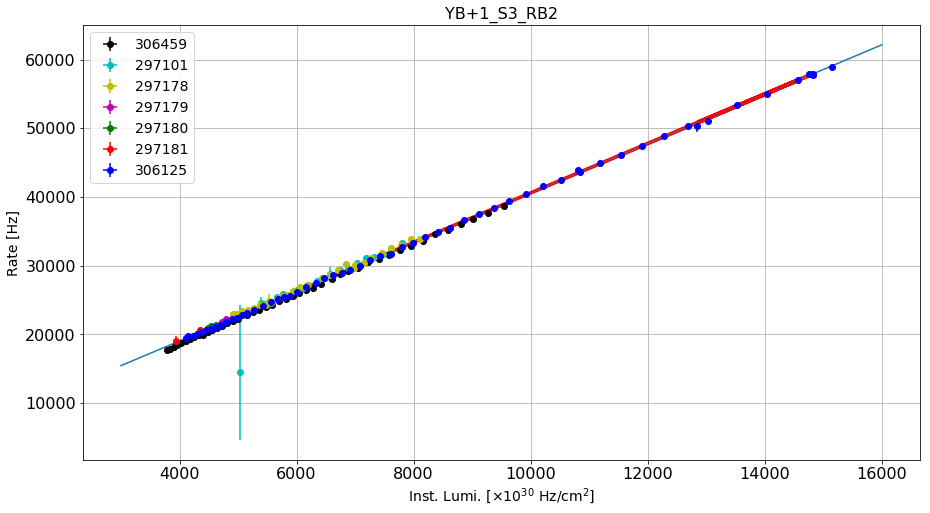

----------------------------------------------------------------------------------------------------------------
YB+1_S3_RB3
Linear correlation: (0.9454540782130604, 1.5007692905298646e-23)
Linear fit parameters: [1.03717824e+00 3.28595363e+03]
Paramenters uncertainty: [5.44967200e-02 5.32726919e+02]


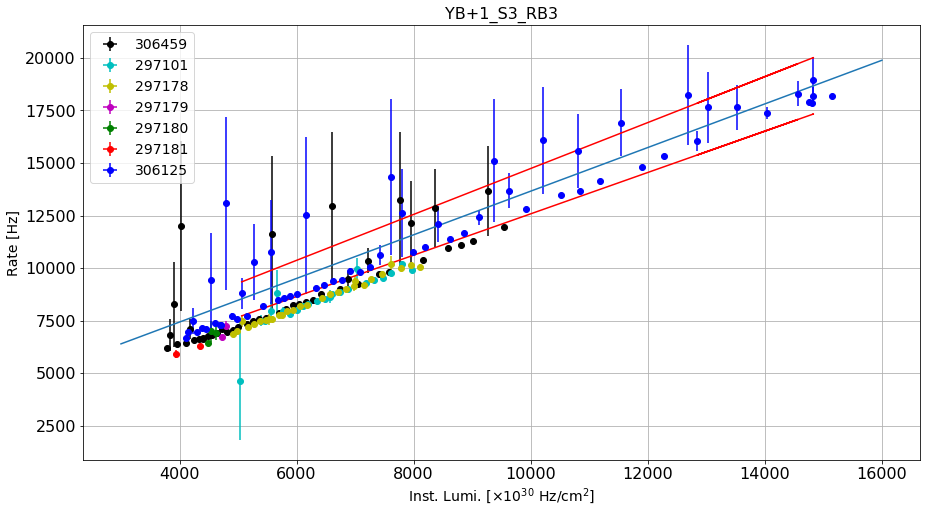

----------------------------------------------------------------------------------------------------------------
YB+1_S3_RB4
Linear correlation: (0.9998949557783838, 2.1208031655925203e-84)
Linear fit parameters: [   42.01724839 14480.74147613]
Paramenters uncertainty: [9.28813842e-02 9.07952142e+02]


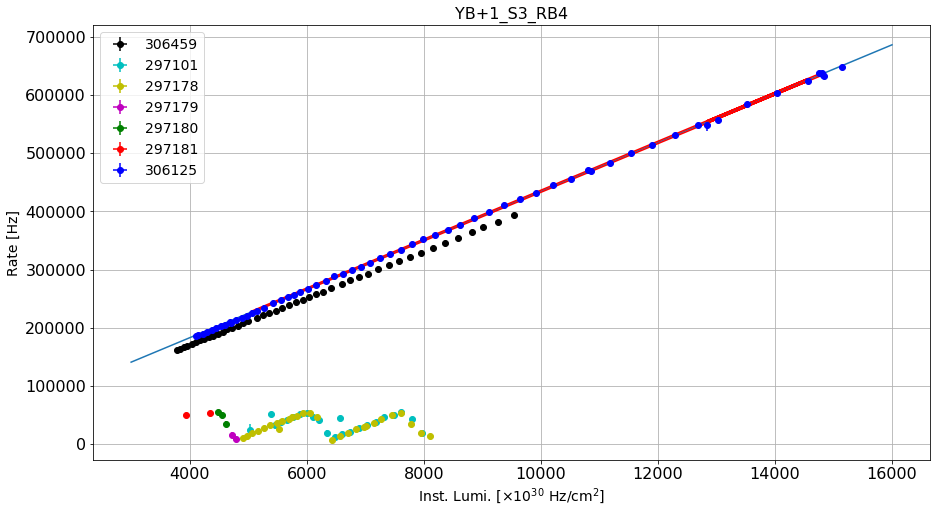

----------------------------------------------------------------------------------------------------------------
YB+1_S4_RB1
Linear correlation: (0.9999041319308479, 2.7122653727241806e-85)
Linear fit parameters: [  15.02979528 4273.99601416]
Paramenters uncertainty: [3.17396442e-02 3.10267532e+02]


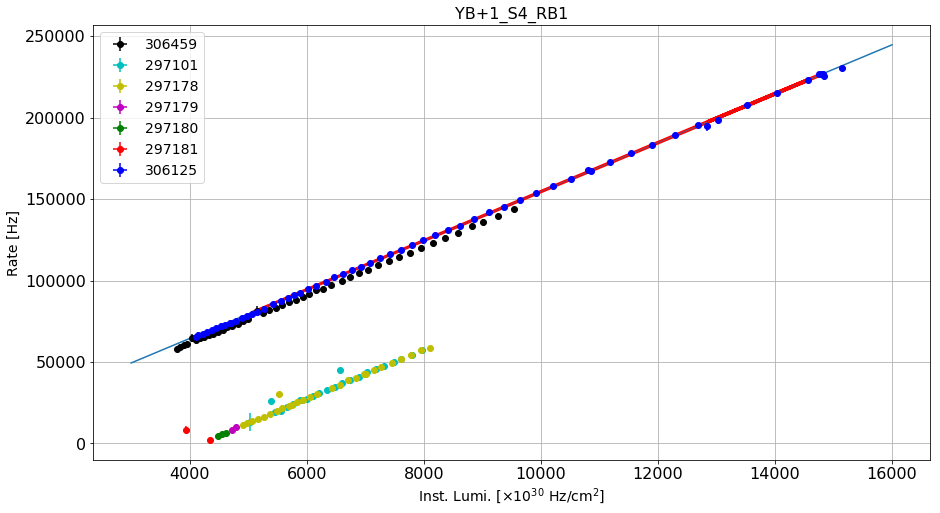

----------------------------------------------------------------------------------------------------------------
YB+1_S4_RB2
Linear correlation: (0.23805434429403224, 0.10710744018809959)
Linear fit parameters: [7.43924653e+00 6.35257727e+05]
Paramenters uncertainty: [4.62860868e+00 4.52464743e+04]


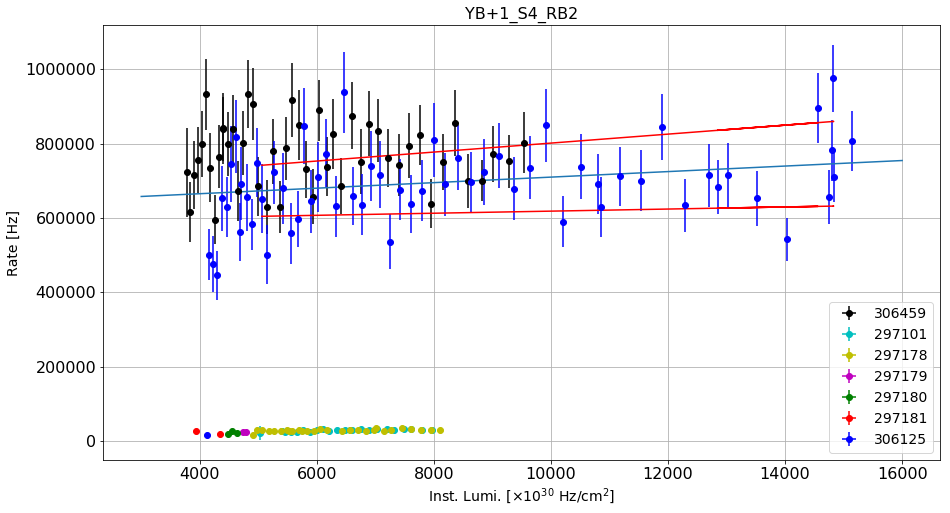

----------------------------------------------------------------------------------------------------------------
YB+1_S4_RB3
Linear correlation: (0.9932145182616677, 1.0623875524060144e-43)
Linear fit parameters: [1.00256135e+00 1.55410853e+03]
Paramenters uncertainty: [1.79019787e-02 1.74998898e+02]


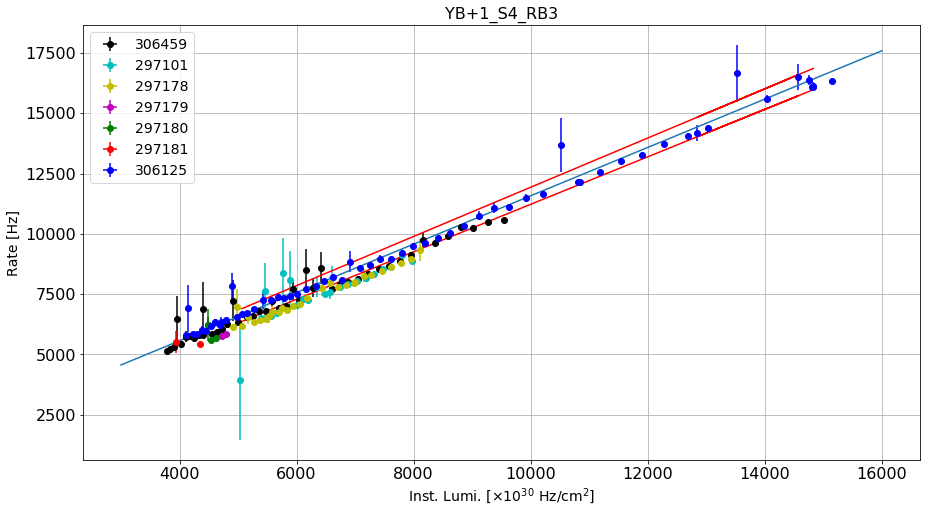

----------------------------------------------------------------------------------------------------------------
YB+1_S4_RB4
Linear correlation: (0.565684318466318, 3.4194166616285085e-05)
Linear fit parameters: [ 4.08645155e-04 -6.51673670e-01]
Paramenters uncertainty: [9.08432875e-05 8.88028943e-01]


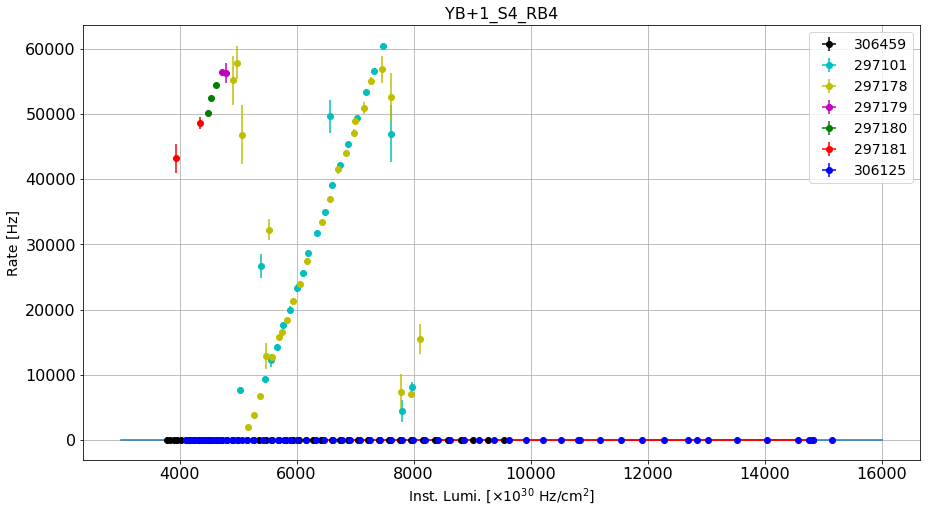

----------------------------------------------------------------------------------------------------------------
YB+1_S5_RB1
Linear correlation: (0.999779786693078, 3.623195985101963e-77)
Linear fit parameters: [  16.51399408 9224.51263244]
Paramenters uncertainty: [5.28599090e-02 5.16726447e+02]


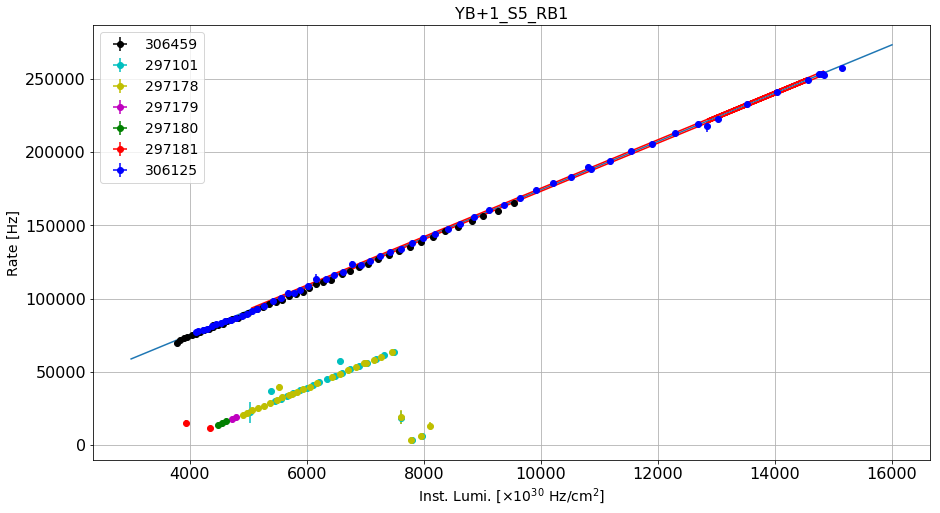

----------------------------------------------------------------------------------------------------------------
YB+1_S5_RB2
Linear correlation: (0.9995174193031211, 1.6759558490799147e-69)
Linear fit parameters: [3.27660039e+00 4.71156732e+03]
Paramenters uncertainty: [1.55291059e-02 1.51803132e+02]


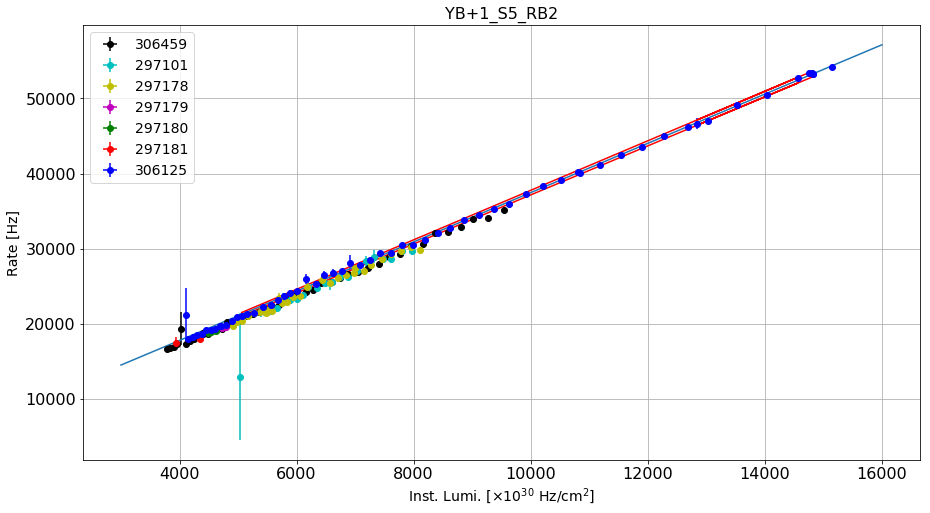

----------------------------------------------------------------------------------------------------------------
YB+1_S5_RB3
Linear correlation: (0.9904493892978063, 2.2594952418439095e-40)
Linear fit parameters: [8.11588440e-01 2.01867327e+03]
Paramenters uncertainty: [1.72290161e-02 1.68420424e+02]


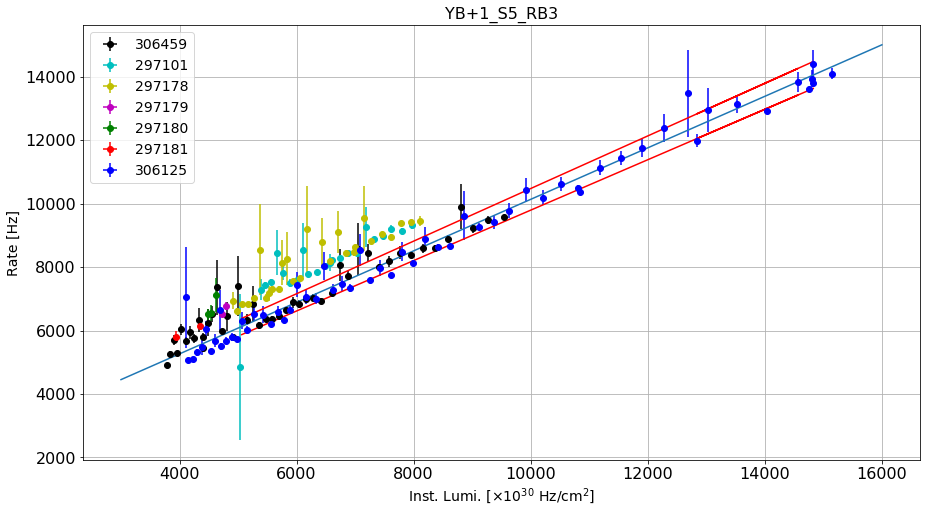

----------------------------------------------------------------------------------------------------------------
YB+1_S5_RB4
Linear correlation: (0.9999023966565094, 4.060836470153202e-85)
Linear fit parameters: [   40.40388204 21921.18159906]
Paramenters uncertainty: [8.60930325e-02 8.41593328e+02]


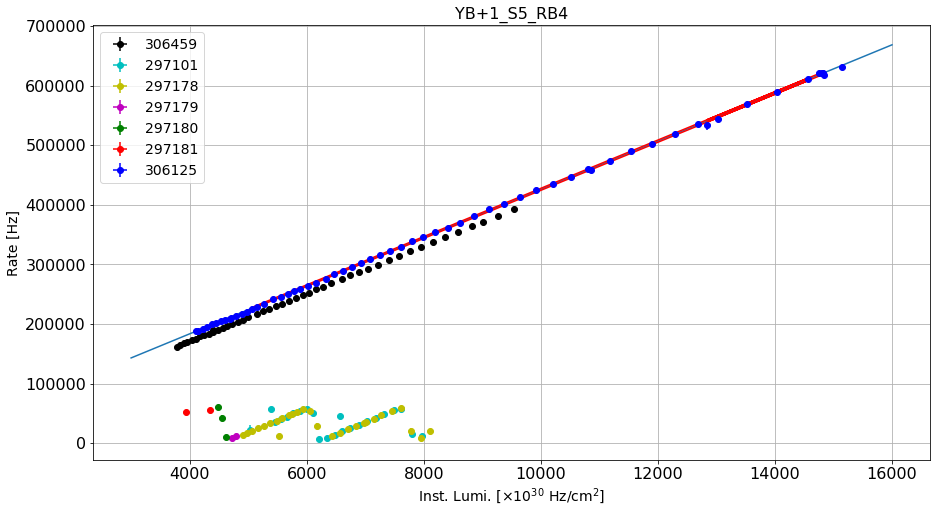

----------------------------------------------------------------------------------------------------------------
YB+1_S6_RB1
Linear correlation: (-0.10056892118856502, 0.5011963966922259)
Linear fit parameters: [-3.85653726e+00  2.01826294e+06]
Paramenters uncertainty: [5.8182460e+00 5.6875648e+04]


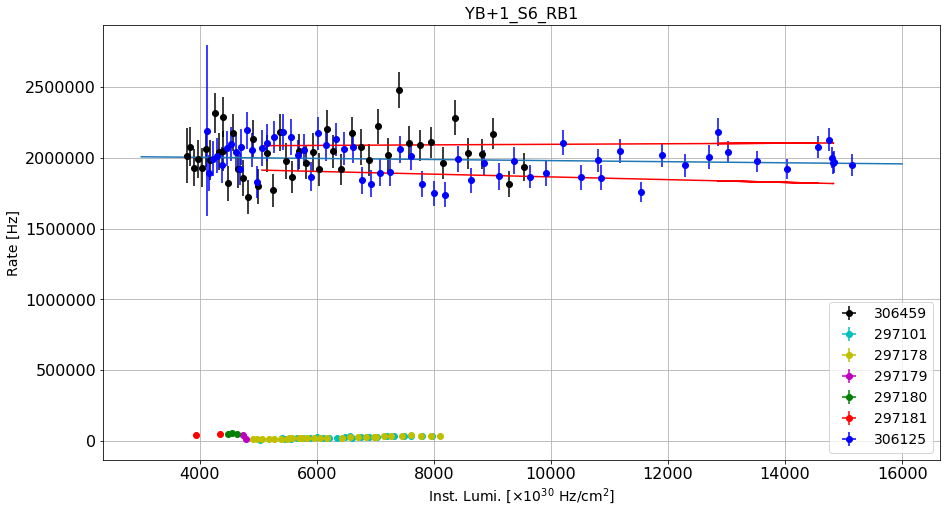

----------------------------------------------------------------------------------------------------------------
YB+1_S6_RB2
Linear correlation: (0.998936688082535, 8.733882039660237e-62)
Linear fit parameters: [3.77535290e+00 5.63234677e+03]
Paramenters uncertainty: [2.65714480e-02 2.59746378e+02]


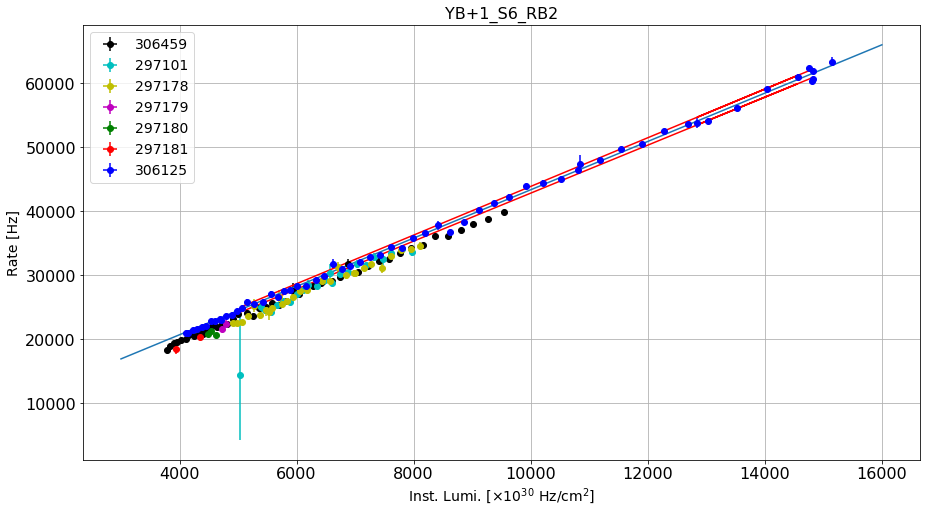

----------------------------------------------------------------------------------------------------------------
YB+1_S6_RB3
Linear correlation: (0.8325556426342346, 4.0214092780927567e-13)
Linear fit parameters: [7.53985915e-01 1.15328123e+04]
Paramenters uncertainty: [7.65031962e-02 7.47848899e+02]


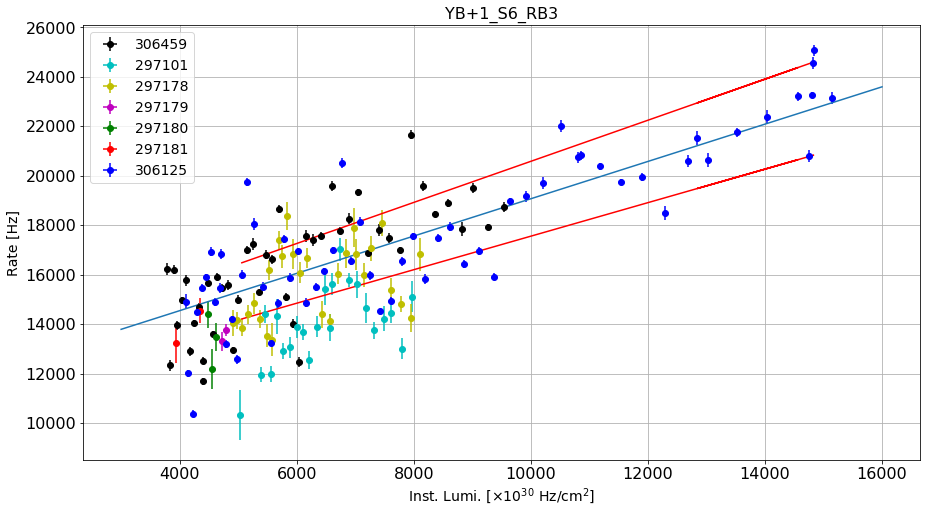

----------------------------------------------------------------------------------------------------------------
YB+1_S6_RB4
Linear correlation: (0.9993715347622513, 6.376977367381213e-67)
Linear fit parameters: [   23.86057257 10031.08809006]
Paramenters uncertainty: [1.29064571e-01 1.26165705e+03]


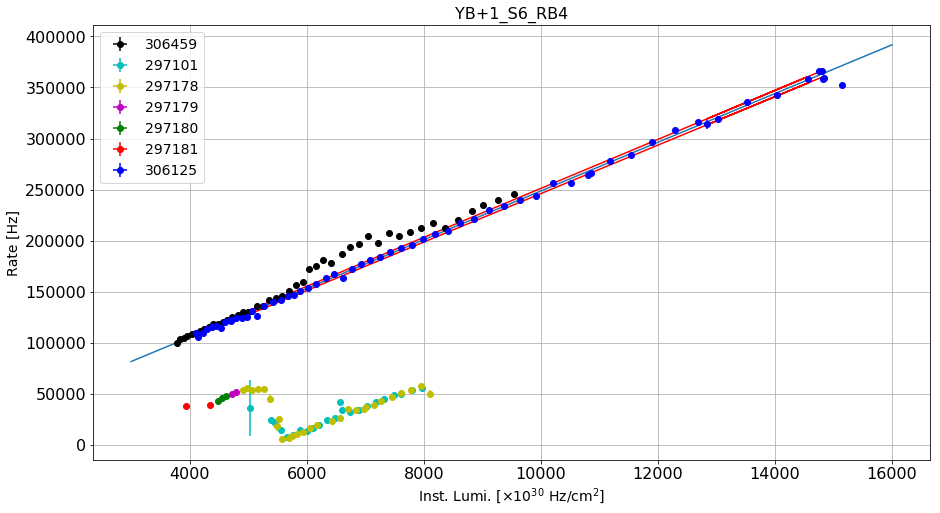

----------------------------------------------------------------------------------------------------------------
YB+1_S7_RB1
Linear correlation: (0.9999180956971343, 7.85472885007479e-87)
Linear fit parameters: [  15.73485809 5892.53872331]
Paramenters uncertainty: [3.07130989e-02 3.00232648e+02]


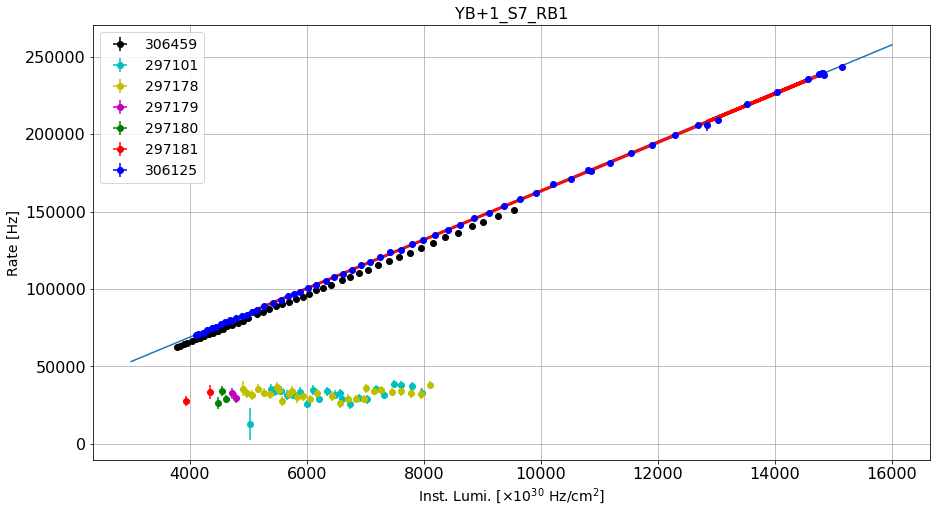

----------------------------------------------------------------------------------------------------------------
YB+1_S7_RB2
Linear correlation: (0.9998572990696261, 2.0895913807008607e-81)
Linear fit parameters: [   3.47891069 2041.8405891 ]
Paramenters uncertainty: [8.96363031e-03 8.76230195e+01]


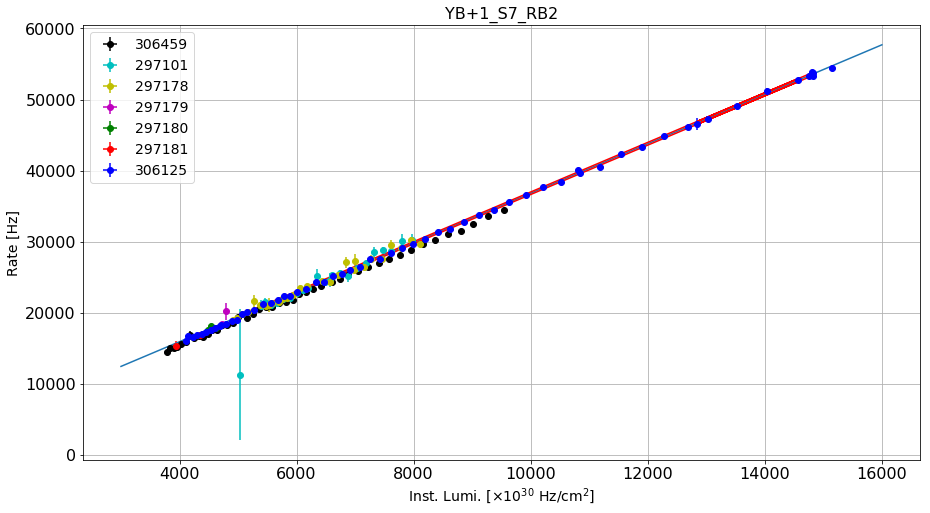

----------------------------------------------------------------------------------------------------------------
YB+1_S7_RB3
Linear correlation: (0.9994098875377216, 1.5470013435452145e-67)
Linear fit parameters: [5.87826146e-01 2.71719407e+03]
Paramenters uncertainty: [3.08098327e-03 3.01178259e+01]


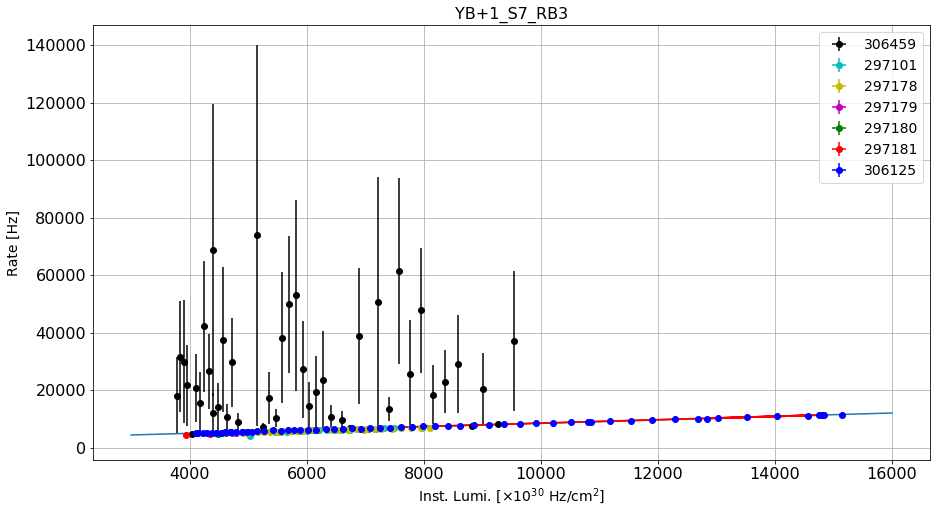

----------------------------------------------------------------------------------------------------------------
YB+1_S7_RB4
Linear correlation: (0.9984431254511404, 4.6221162145179616e-58)
Linear fit parameters: [  15.44357568 7244.63133742]
Paramenters uncertainty: [1.31571858e-01 1.28616677e+03]


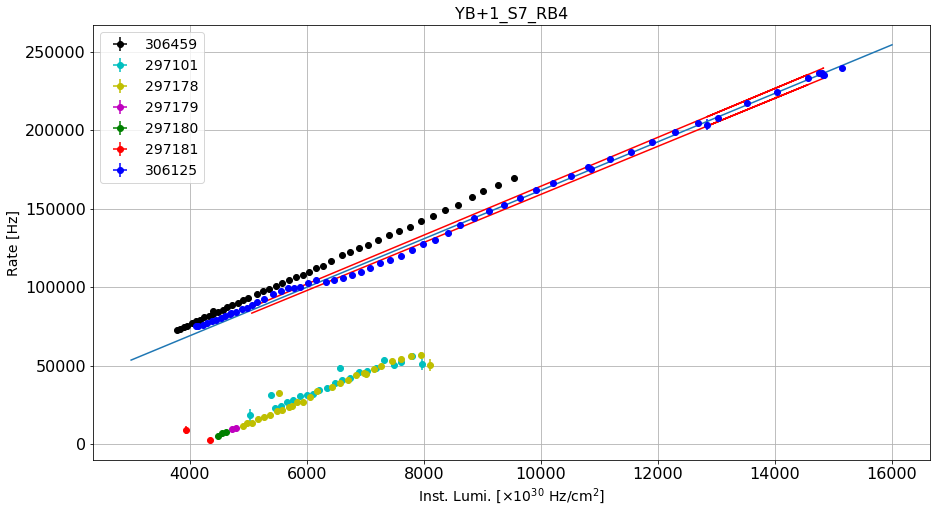

----------------------------------------------------------------------------------------------------------------
YB+1_S8_RB1
Linear correlation: (0.9971931361947481, 2.923674989431239e-43)
Linear fit parameters: [1.41915250e+01 2.73947135e+04]
Paramenters uncertainty: [1.80109436e-01 1.88028557e+03]


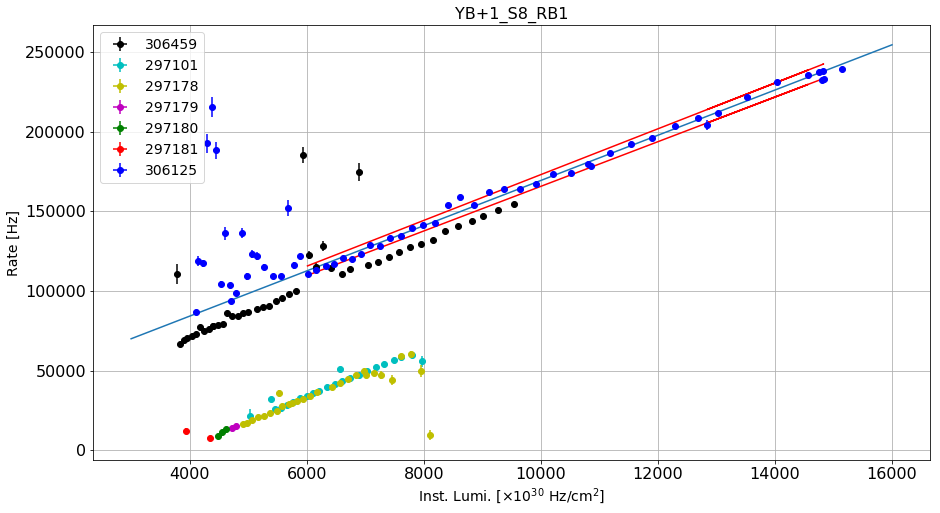

----------------------------------------------------------------------------------------------------------------
YB+1_S8_RB2
Linear correlation: (0.9982619358106134, 5.4929375306866e-57)
Linear fit parameters: [3.67471562e+00 7.55839778e+03]
Paramenters uncertainty: [3.30829409e-02 3.23398788e+02]


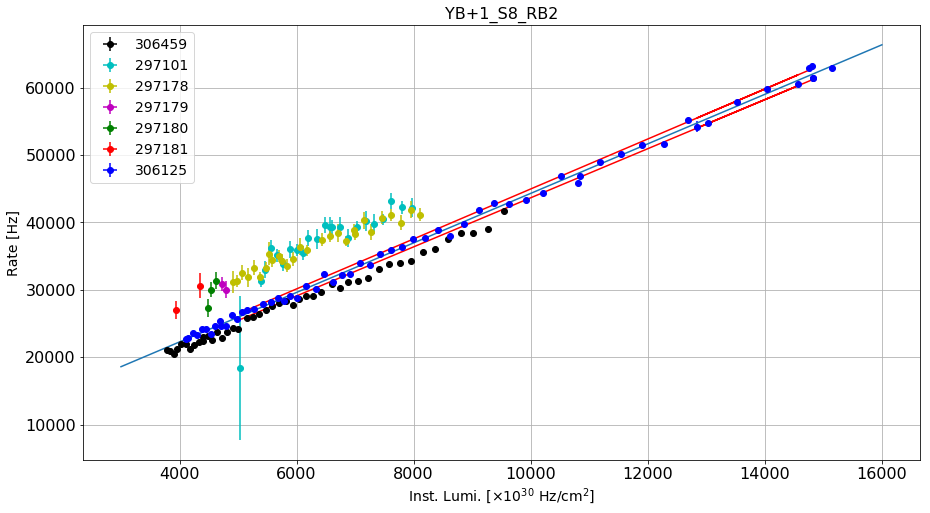

----------------------------------------------------------------------------------------------------------------
YB+1_S8_RB3
Linear correlation: (0.8845878246554594, 1.646937830451045e-16)
Linear fit parameters: [3.72594990e-01 4.56805807e+04]
Paramenters uncertainty: [2.99568282e-02 2.92839804e+02]


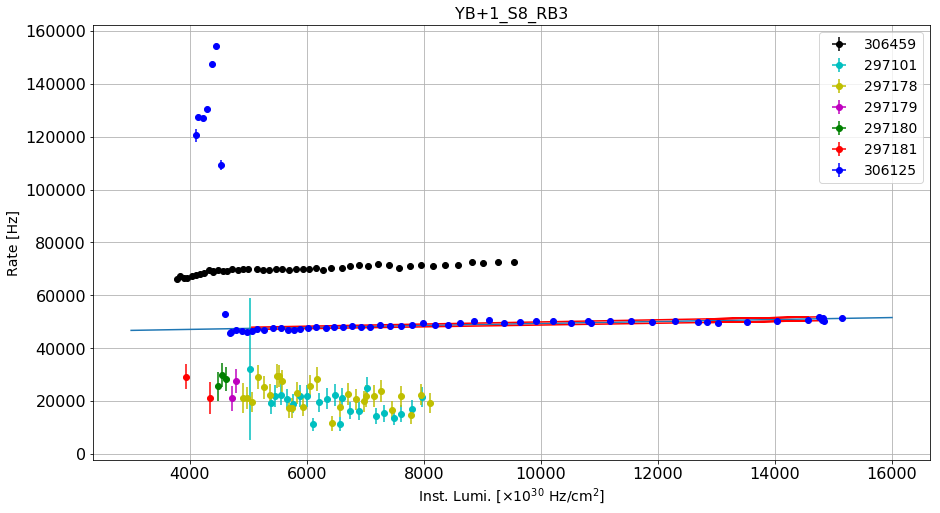

----------------------------------------------------------------------------------------------------------------
YB+1_S8_RB4
Linear correlation: (0.9999007113145554, 5.968936321334938e-85)
Linear fit parameters: [  10.80406267 3834.79593871]
Paramenters uncertainty: [2.32193516e-02 2.26978314e+02]


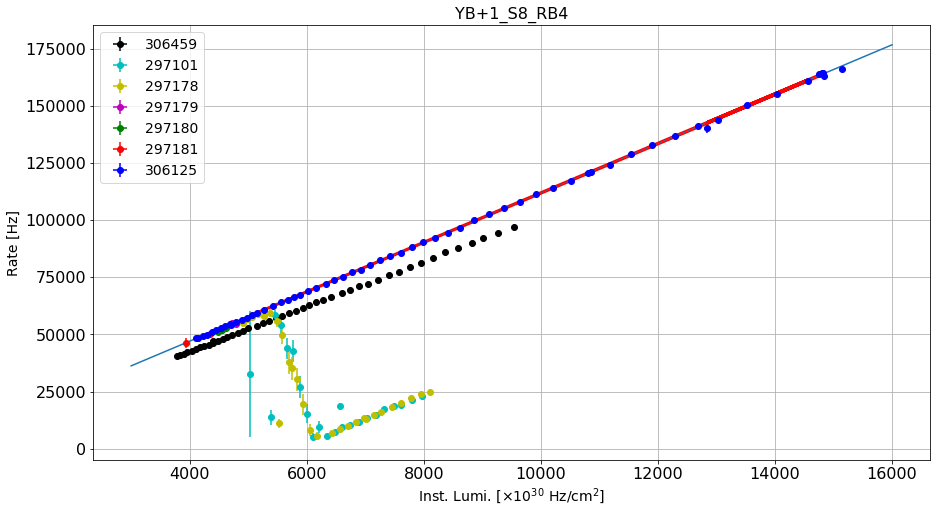

----------------------------------------------------------------------------------------------------------------
YB+1_S9_RB1
Linear correlation: (0.999914143351498, 2.267910059562468e-86)
Linear fit parameters: [  16.92035615 7326.55678939]
Paramenters uncertainty: [3.38146738e-02 3.30551765e+02]


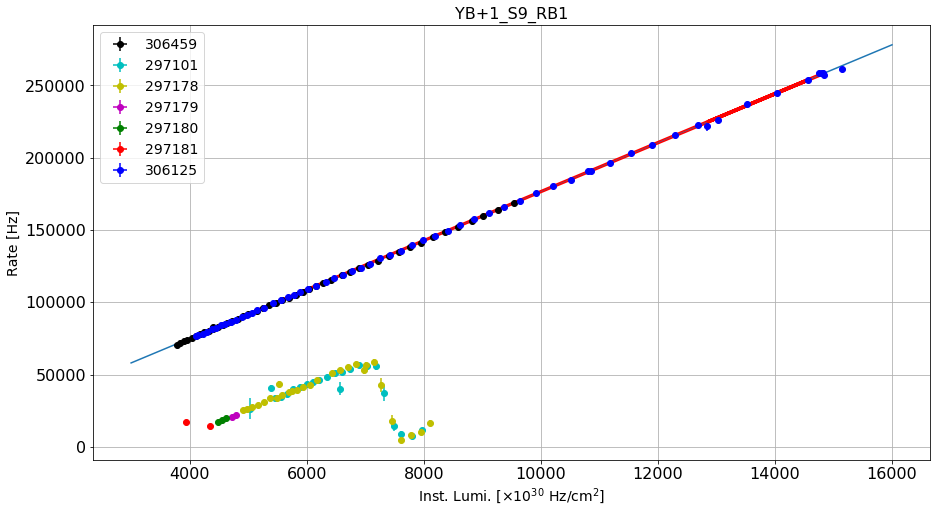

----------------------------------------------------------------------------------------------------------------
YB+1_S9_RB2
Linear correlation: (0.9997591482219221, 2.7188876993330216e-76)
Linear fit parameters: [2.85934025e+00 4.42409295e+03]
Paramenters uncertainty: [9.57194066e-03 9.35694929e+01]


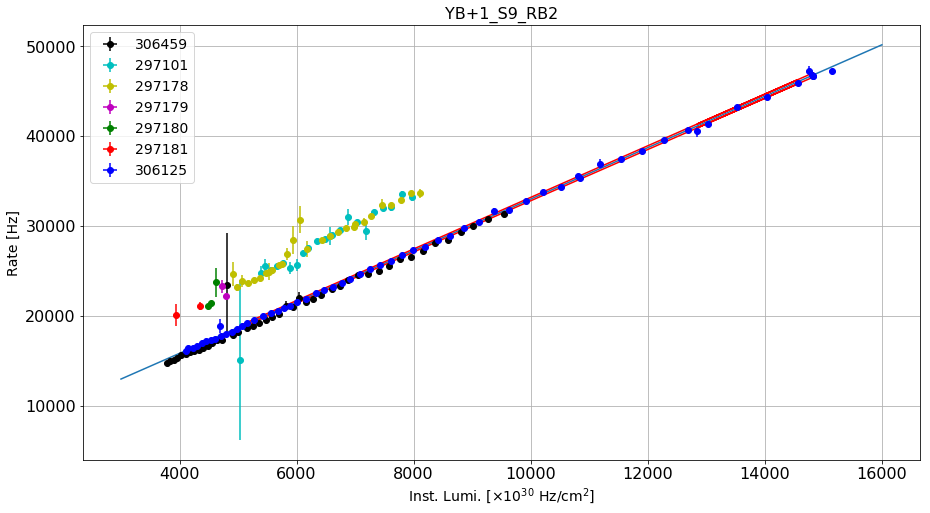

----------------------------------------------------------------------------------------------------------------
YB+1_S9_RB3
Linear correlation: (0.9980483946267291, 7.433420048019626e-56)
Linear fit parameters: [4.14851398e-01 1.63981501e+03]
Paramenters uncertainty: [3.95827290e-03 3.86936779e+01]


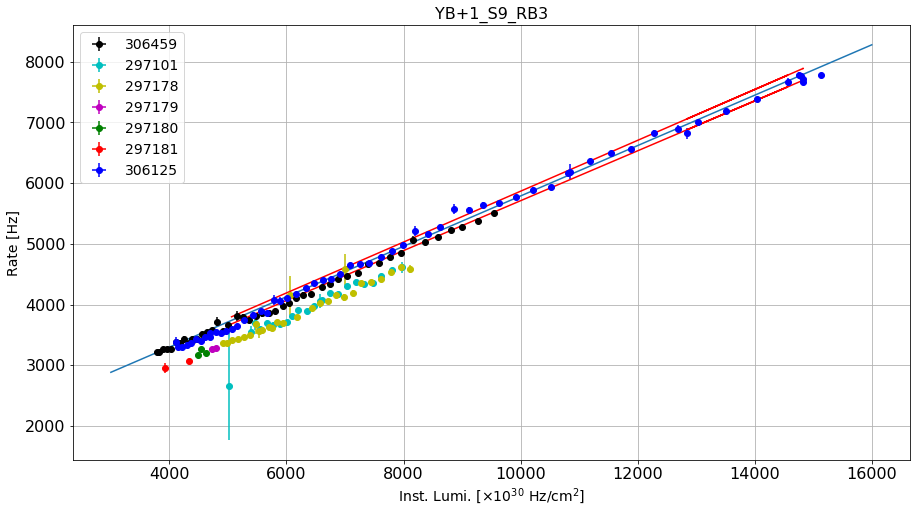

----------------------------------------------------------------------------------------------------------------
YB+1_S9_RB4
Linear correlation: (0.9942918988390799, 2.1958855930704507e-45)
Linear fit parameters: [7.09155920e-01 3.17696394e+03]
Paramenters uncertainty: [1.16046968e-02 1.13440485e+02]


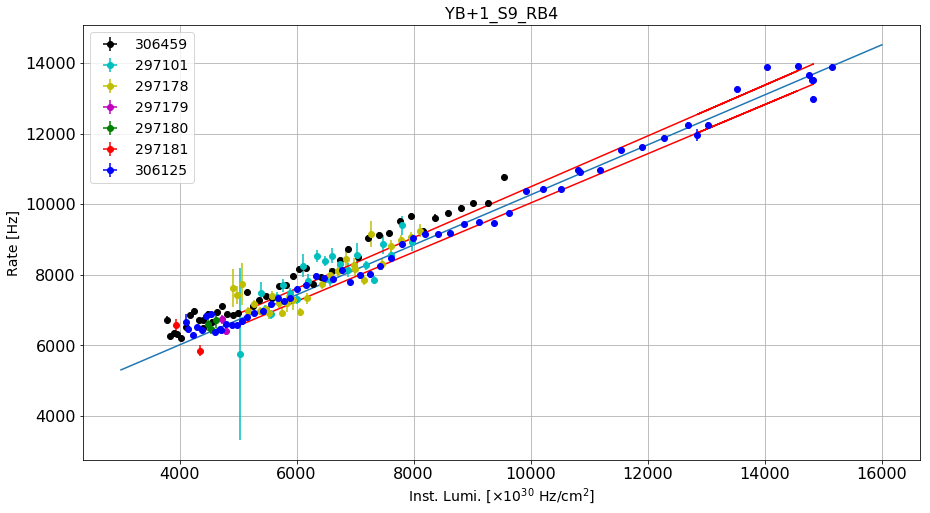

----------------------------------------------------------------------------------------------------------------
YB+1_S10_RB1
Linear correlation: (0.9998174674113977, 5.314219543373159e-79)
Linear fit parameters: [1.65015982e+01 2.83211475e+04]
Paramenters uncertainty: [4.80879702e-02 4.70078864e+02]


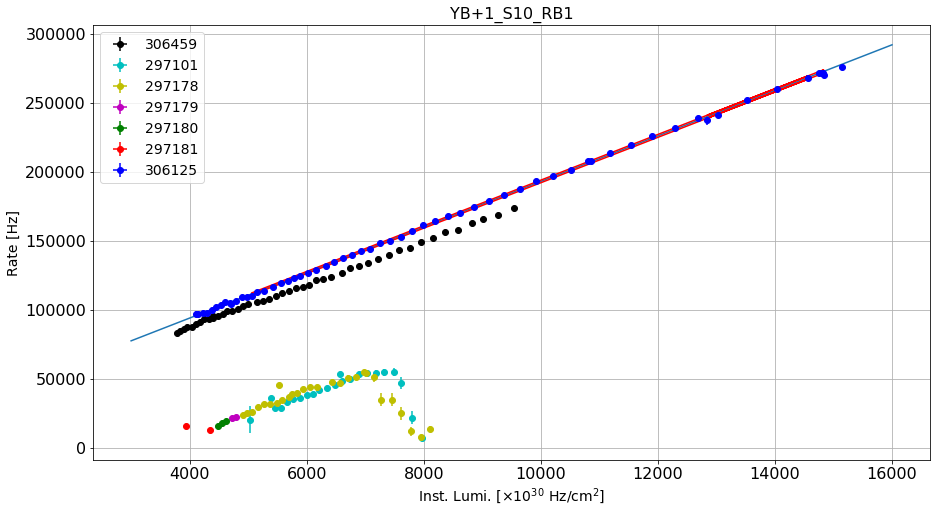

----------------------------------------------------------------------------------------------------------------
YB+1_S10_RB2
Linear correlation: (0.9996503308670116, 1.1934993514363972e-72)
Linear fit parameters: [3.59486391e+00 6.31925678e+03]
Paramenters uncertainty: [1.45012617e-02 1.41755549e+02]


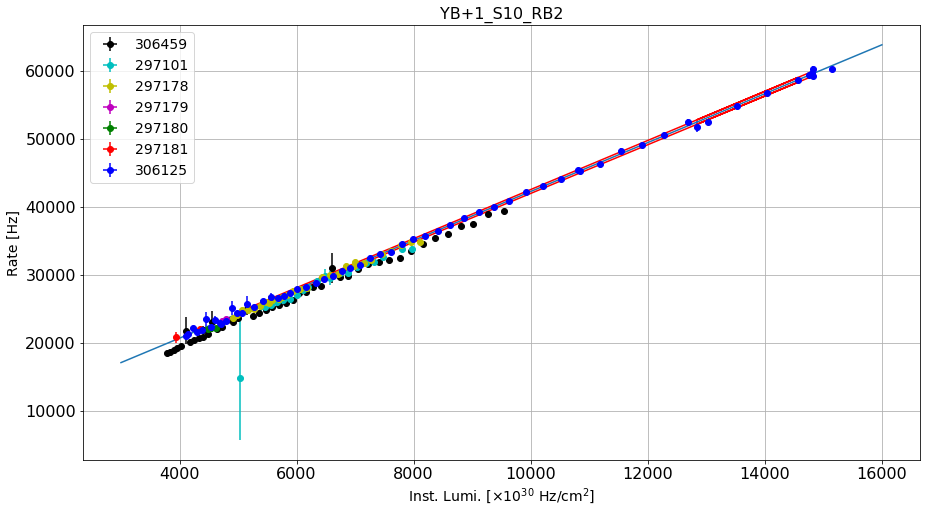

----------------------------------------------------------------------------------------------------------------
YB+1_S10_RB3
Linear correlation: (0.9983092389216817, 2.9538330834184863e-57)
Linear fit parameters: [3.83382398e-01 3.39845536e+03]
Paramenters uncertainty: [3.4041236e-03 3.3276650e+01]


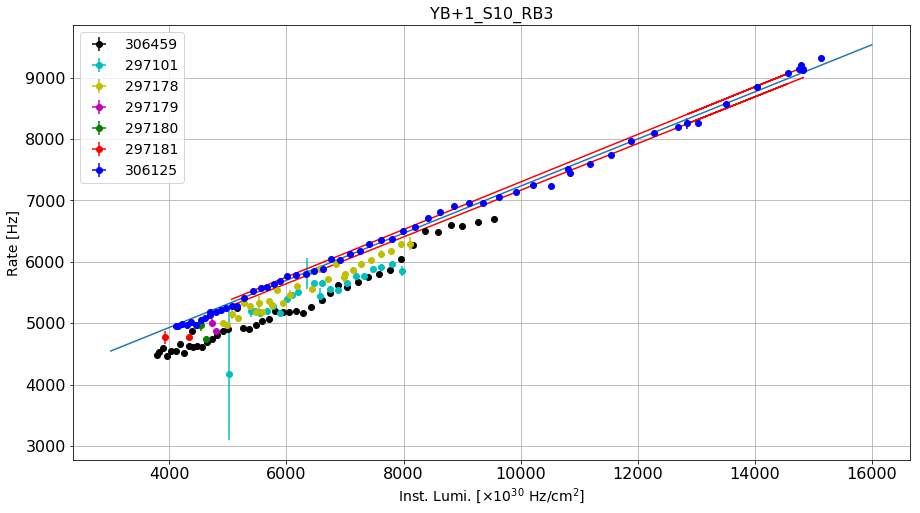

----------------------------------------------------------------------------------------------------------------
YB+1_S10_RB4
Linear correlation: (0.9988369865187755, 6.554701918388064e-61)
Linear fit parameters: [8.09365995e-01 3.07501907e+03]
Paramenters uncertainty: [5.95795438e-03 5.82413525e+01]


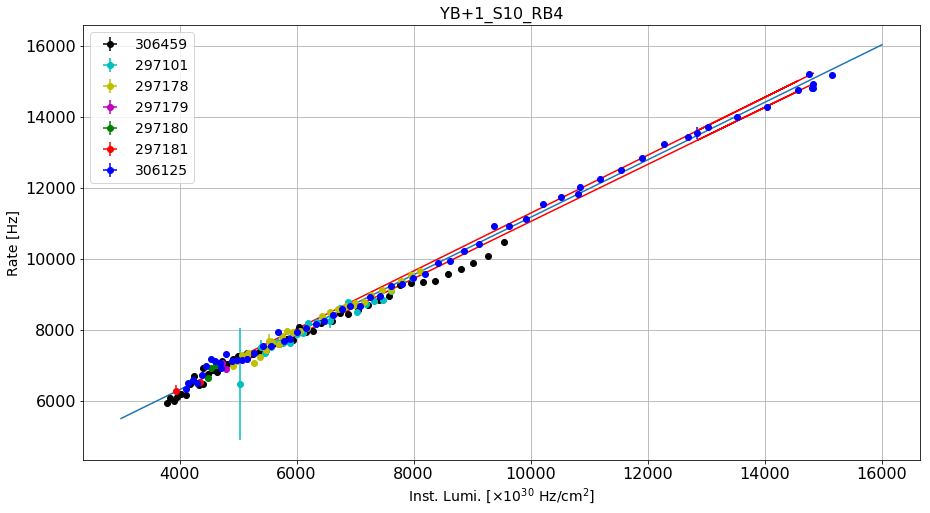

----------------------------------------------------------------------------------------------------------------
YB+1_S11_RB1
Linear correlation: (0.9995581062444191, 2.3108547333494752e-70)
Linear fit parameters: [1.48599993e+01 2.75018496e+04]
Paramenters uncertainty: [6.73910869e-02 6.58774439e+02]


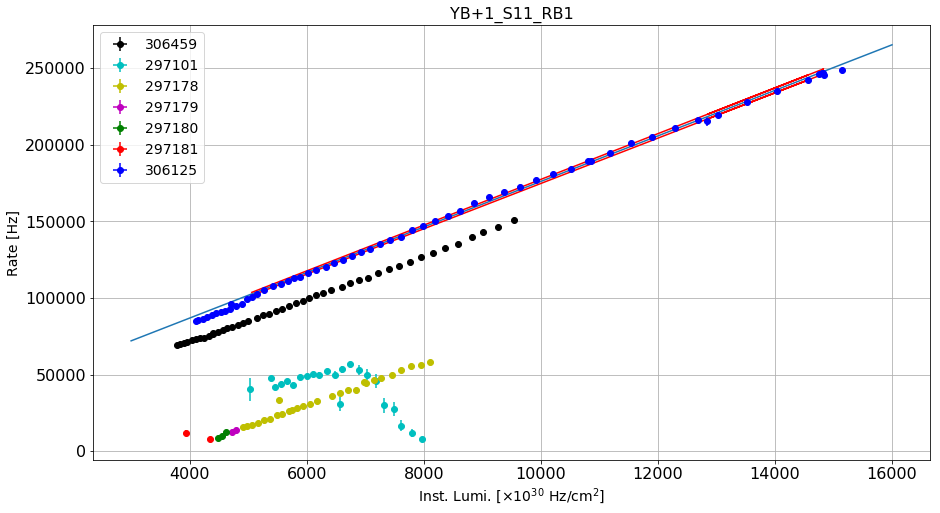

----------------------------------------------------------------------------------------------------------------
YB+1_S11_RB2
Linear correlation: (0.9998620381530092, 9.773653721134251e-82)
Linear fit parameters: [3.57742691e+00 5.53095214e+03]
Paramenters uncertainty: [9.06308347e-03 8.85952133e+01]


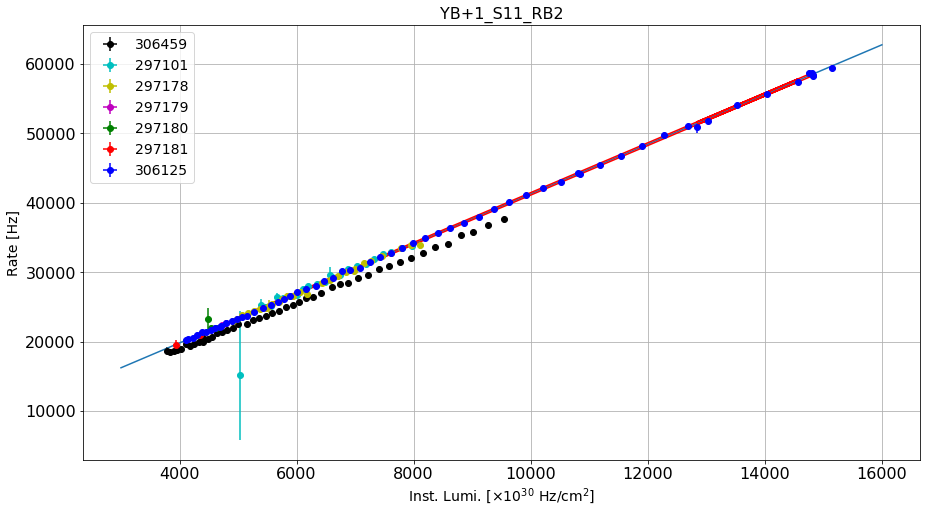

----------------------------------------------------------------------------------------------------------------
YB+1_S11_RB3
Linear correlation: (0.9989464992167818, 7.090392560017379e-62)
Linear fit parameters: [4.44281426e-01 2.79135669e+03]
Paramenters uncertainty: [3.11243089e-03 3.04252388e+01]


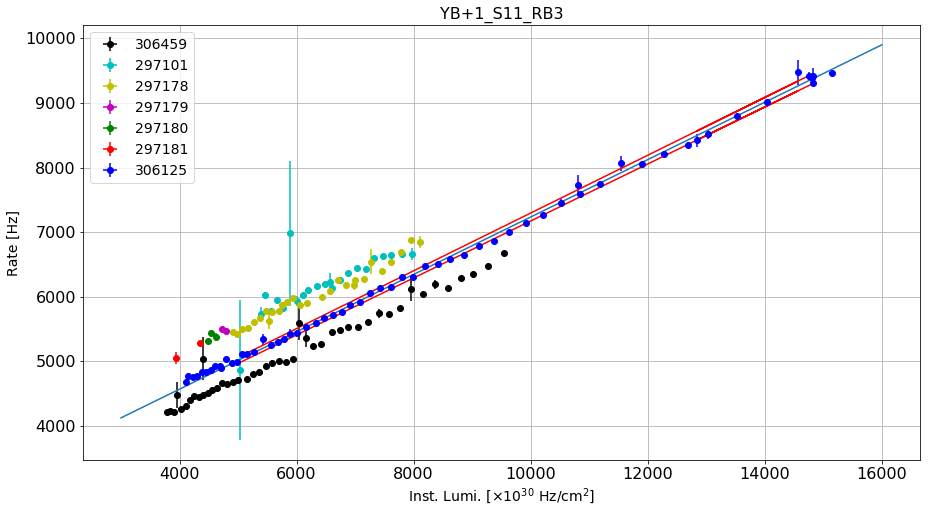

----------------------------------------------------------------------------------------------------------------
YB+1_S11_RB4
Linear correlation: (0.9684445101857908, 8.574205357266101e-29)
Linear fit parameters: [6.0172647e-01 9.0650461e+02]
Paramenters uncertainty: [2.36150679e-02 2.30846597e+02]


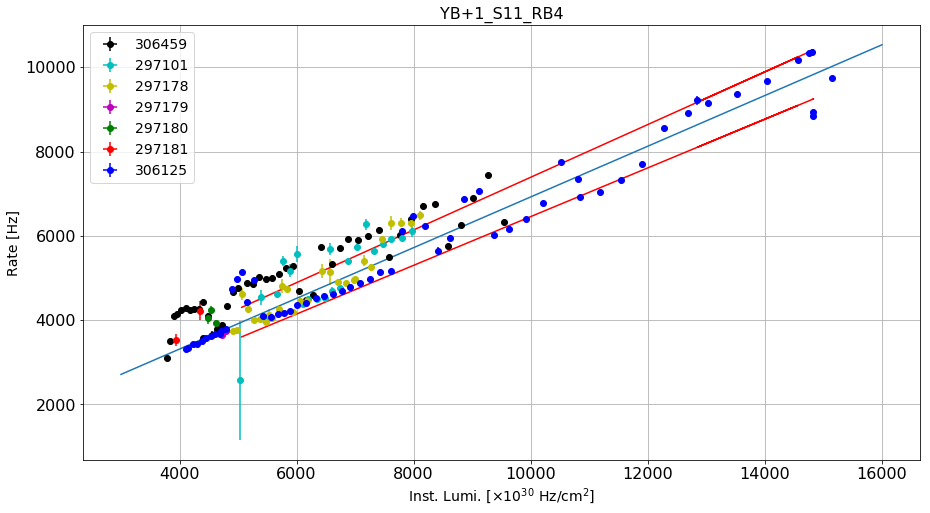

----------------------------------------------------------------------------------------------------------------
YB+1_S12_RB1
Linear correlation: (0.999906298114986, 1.6218649041369347e-85)
Linear fit parameters: [  15.30975919 6222.62270537]
Paramenters uncertainty: [3.19634623e-02 3.12455443e+02]


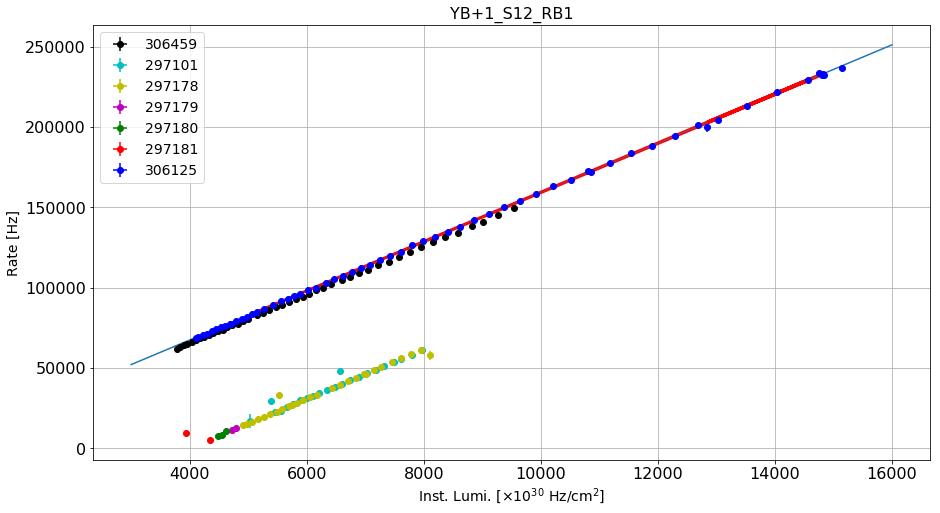

----------------------------------------------------------------------------------------------------------------
YB+1_S12_RB2
Linear correlation: (0.9782977364069302, 2.089113864064483e-32)
Linear fit parameters: [3.82917158e+00 7.60414365e+04]
Paramenters uncertainty: [1.23679549e-01 1.20901635e+03]


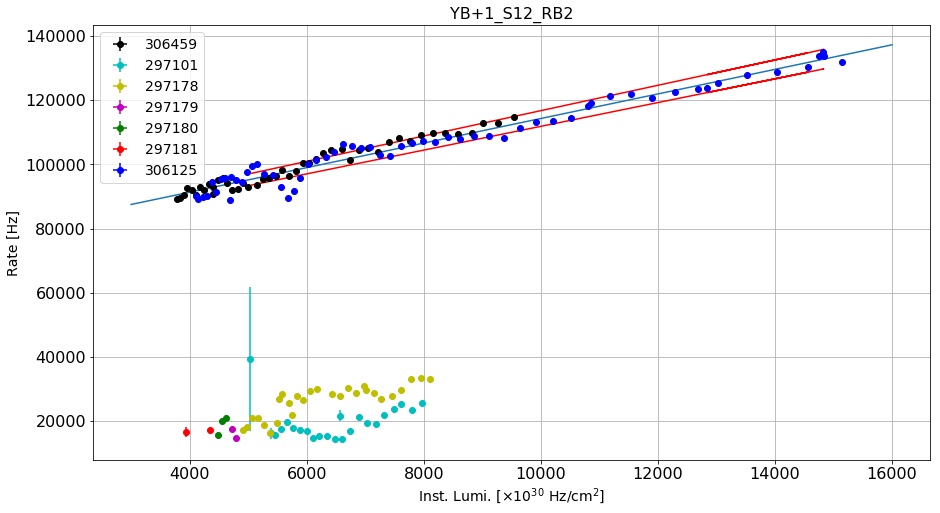

----------------------------------------------------------------------------------------------------------------
YB+1_S12_RB3
Linear correlation: (0.9712425256537991, 1.0929063950068898e-29)
Linear fit parameters: [5.76612985e-01 3.99739818e+03]
Paramenters uncertainty: [2.15559864e-02 2.10718264e+02]


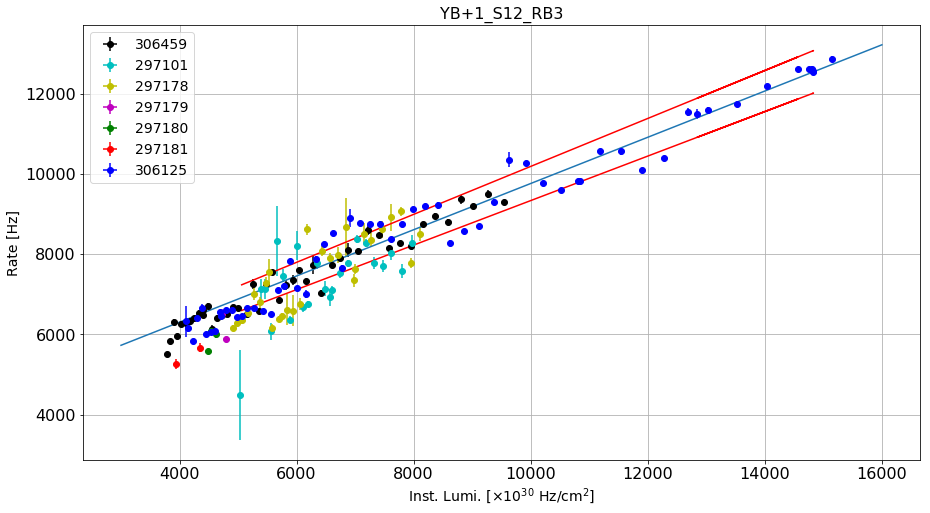

----------------------------------------------------------------------------------------------------------------
YB+1_S12_RB4
Linear correlation: (0.9998751226674238, 1.038530471859925e-82)
Linear fit parameters: [   9.13343496 5475.05090027]
Paramenters uncertainty: [2.20139206e-02 2.15194751e+02]


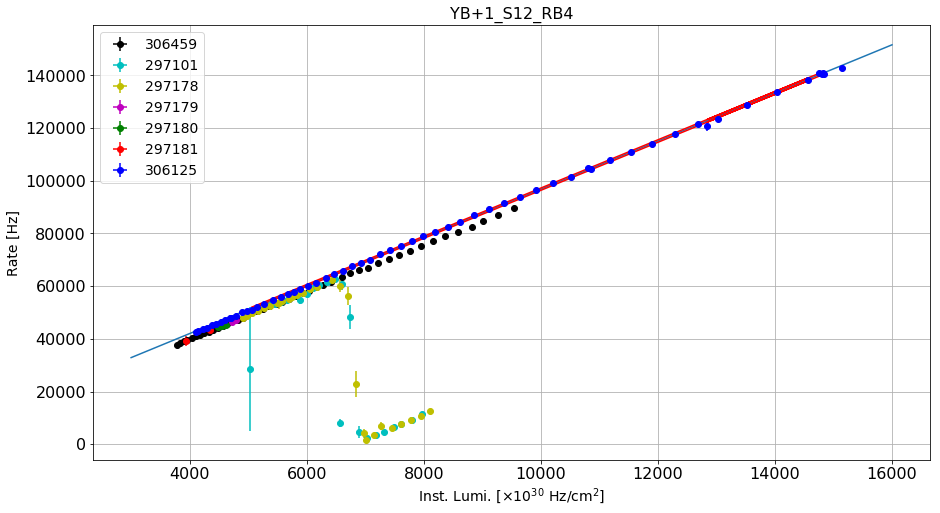

----------------------------------------------------------------------------------------------------------------
YB+2_S1_RB1
Linear correlation: (0.9999183900496073, 7.243549246911972e-87)
Linear fit parameters: [  34.78061285 6537.60635378]
Paramenters uncertainty: [6.77666692e-02 6.62445904e+02]


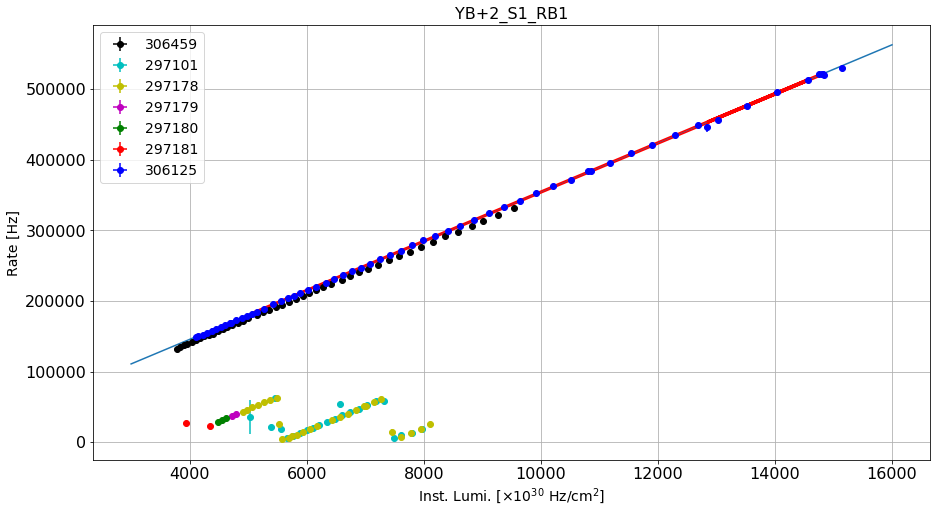

----------------------------------------------------------------------------------------------------------------
YB+2_S1_RB2
Linear correlation: (0.9925709960032911, 8.105314335803493e-43)
Linear fit parameters: [ 1.33925342e+01 -1.54764880e+04]
Paramenters uncertainty: [2.50345133e-01 2.44722236e+03]


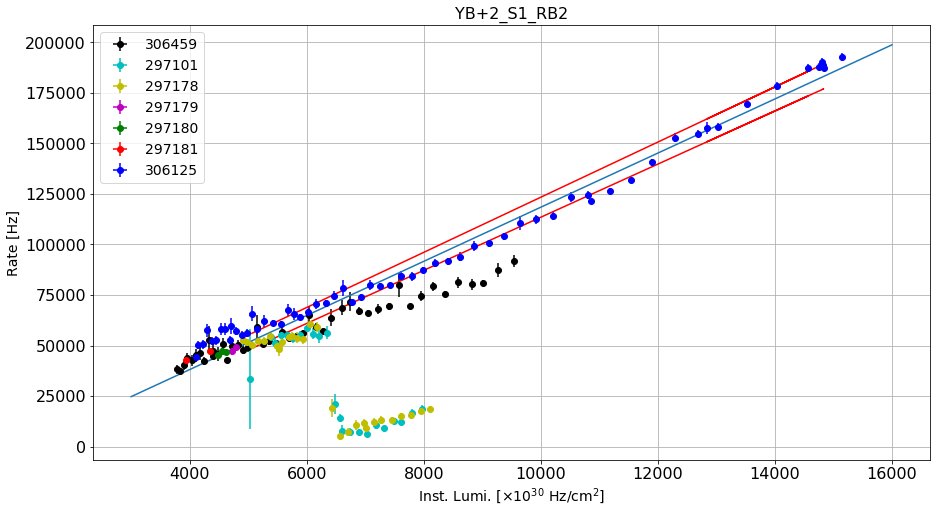

----------------------------------------------------------------------------------------------------------------
YB+2_S1_RB3
Linear correlation: (0.5219952483213147, 0.0001678033942895936)
Linear fit parameters: [1.99791370e+00 1.25466944e+04]
Paramenters uncertainty: [4.97850218e-01 4.86668212e+03]


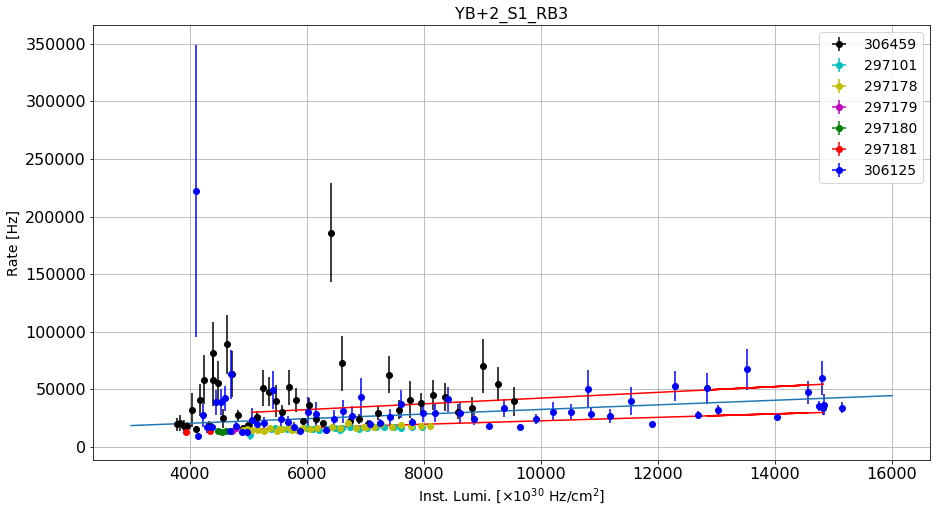

----------------------------------------------------------------------------------------------------------------
YB+2_S1_RB4
Linear correlation: (0.9993342246241651, 2.3334235472199246e-66)
Linear fit parameters: [   34.48194266 17843.01363456]
Paramenters uncertainty: [1.91978812e-01 1.87666856e+03]


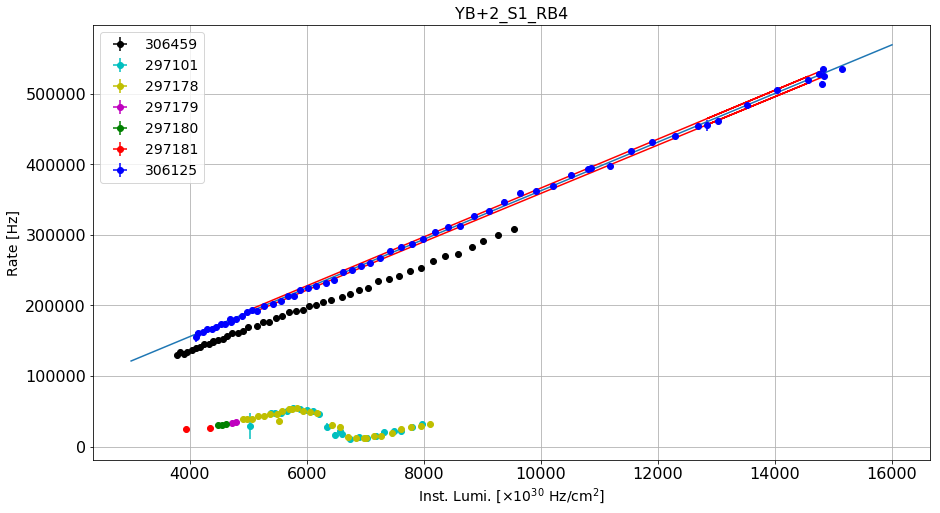

----------------------------------------------------------------------------------------------------------------
YB+2_S2_RB1
Linear correlation: (0.9999157522207559, 1.4817841787548328e-86)
Linear fit parameters: [   32.73741876 11514.4424733 ]
Paramenters uncertainty: [6.48084862e-02 6.33528498e+02]


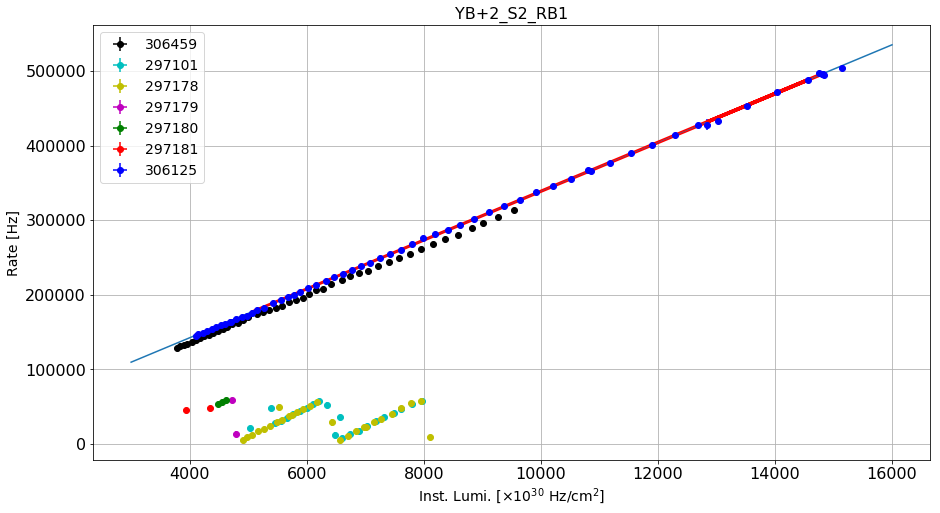

----------------------------------------------------------------------------------------------------------------
YB+2_S2_RB2
Linear correlation: (0.999896533146745, 1.508903876986886e-84)
Linear fit parameters: [   9.24083623 4946.16748171]
Paramenters uncertainty: [2.02733897e-02 1.98180375e+02]


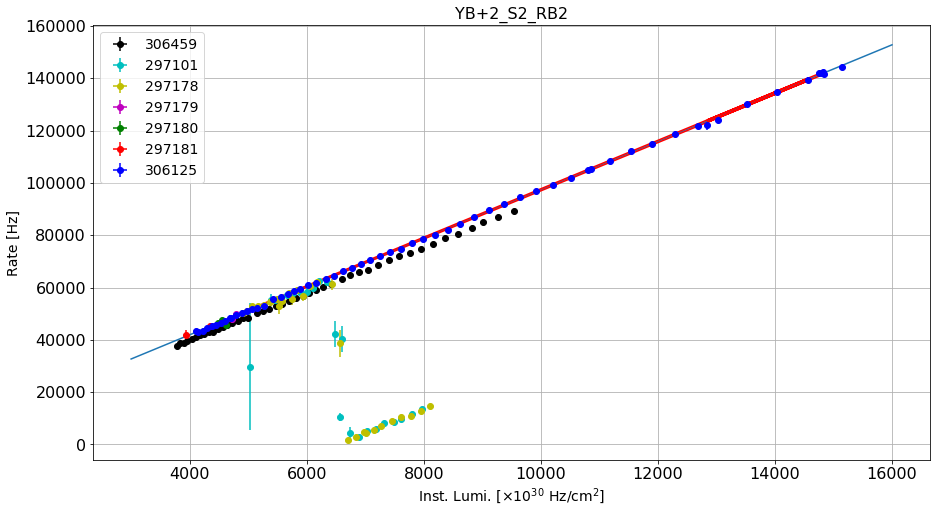

----------------------------------------------------------------------------------------------------------------
YB+2_S2_RB3
Linear correlation: (0.9992545787697636, 2.963487510792402e-65)
Linear fit parameters: [1.50822618e+00 5.73363118e+03]
Paramenters uncertainty: [8.88568739e-03 8.68610967e+01]


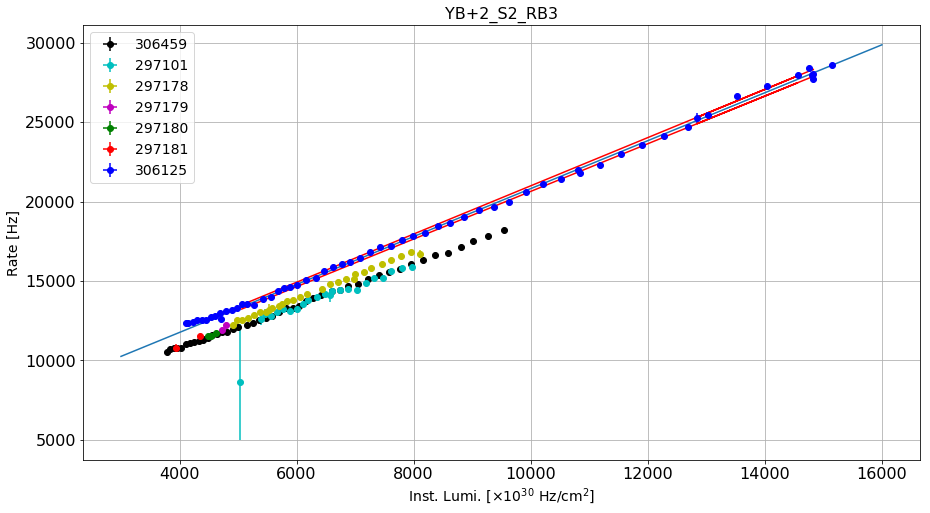

----------------------------------------------------------------------------------------------------------------
YB+2_S2_RB4
Linear correlation: (0.9991520623306588, 5.3764243724992854e-64)
Linear fit parameters: [3.44545429e+01 6.05353344e+04]
Paramenters uncertainty: [2.16513786e-01 2.11650760e+03]


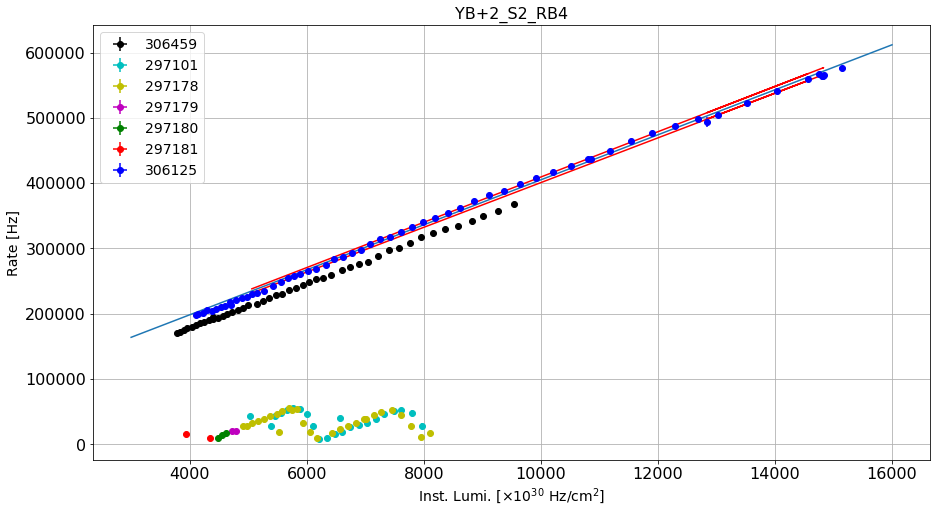

----------------------------------------------------------------------------------------------------------------
YB+2_S3_RB1
Linear correlation: (0.9996749277910811, 2.3130734853568765e-73)
Linear fit parameters: [   37.89808355 23422.97871509]
Paramenters uncertainty: [1.47398764e-01 1.44088102e+03]


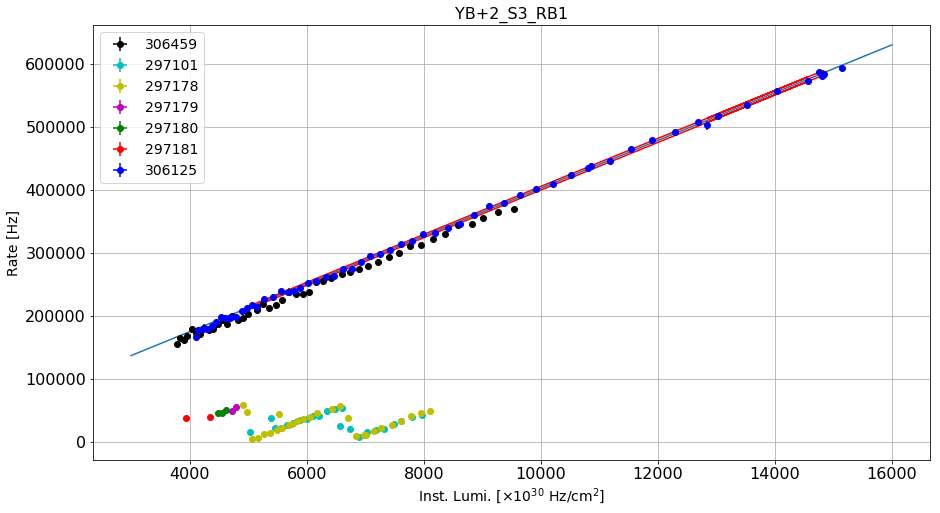

----------------------------------------------------------------------------------------------------------------
YB+2_S3_RB2
Linear correlation: (0.3525932509030971, 0.01506555096896043)
Linear fit parameters: [9.09552707e+00 8.24983481e+05]
Paramenters uncertainty: [3.68122080e+00 3.59853843e+04]


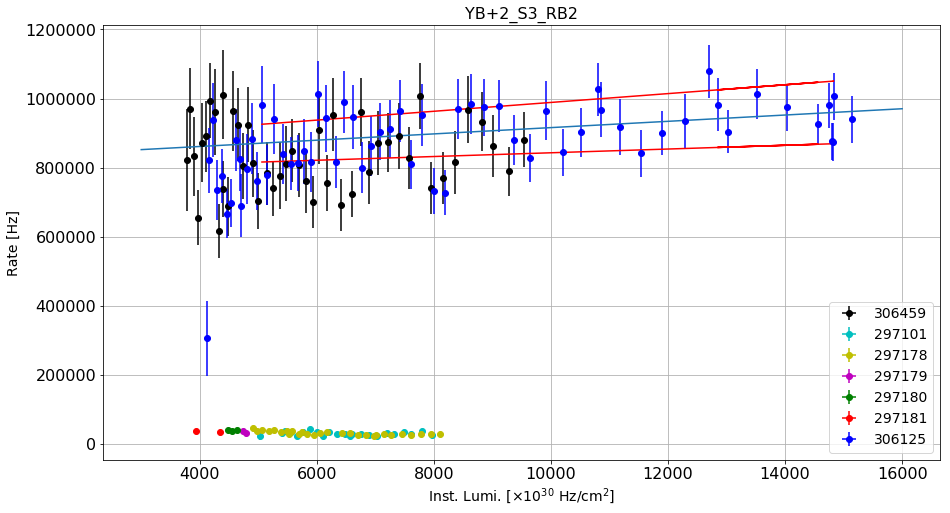

----------------------------------------------------------------------------------------------------------------
YB+2_S3_RB3
Linear correlation: (0.9992500448429346, 3.3965455072887026e-65)
Linear fit parameters: [1.73815121e+00 2.39761777e+03]
Paramenters uncertainty: [1.02714169e-02 1.00407149e+02]


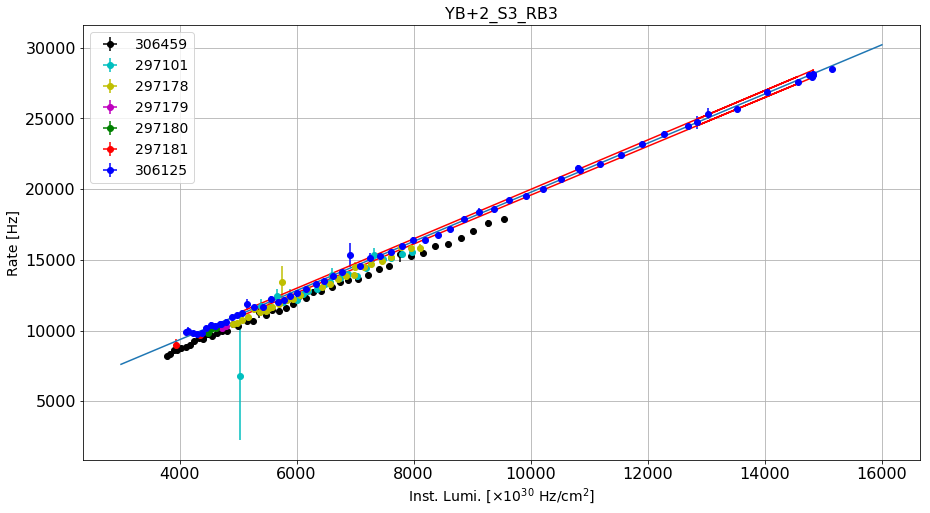

----------------------------------------------------------------------------------------------------------------
YB+2_S3_RB4
Linear correlation: (0.9998645370998035, 6.47811915819924e-82)
Linear fit parameters: [   41.69653686 24178.87020219]
Paramenters uncertainty: [1.04673095e-01 1.02322077e+03]


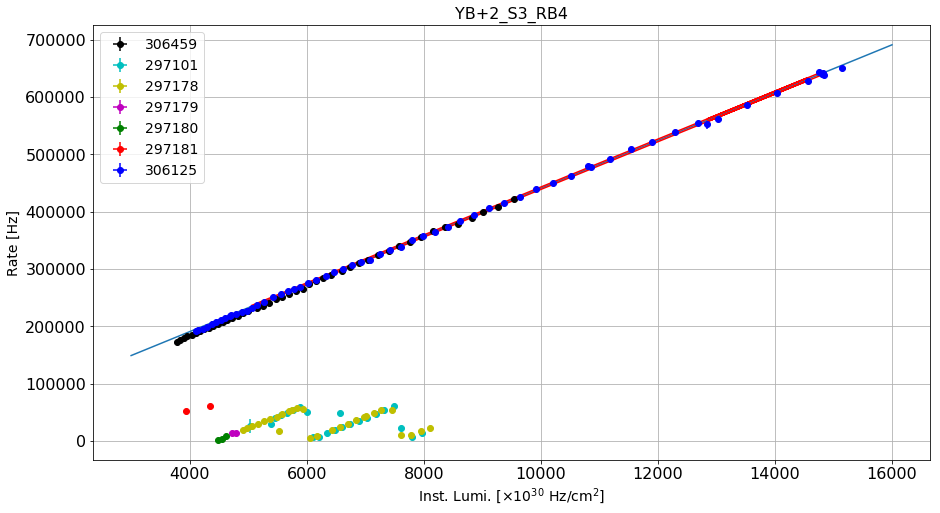

----------------------------------------------------------------------------------------------------------------
YB+2_S4_RB1
Linear correlation: (0.9997692415982954, 1.0377885252339355e-76)
Linear fit parameters: [   38.18713643 20273.56148521]
Paramenters uncertainty: [1.2512722e-01 1.2231679e+03]


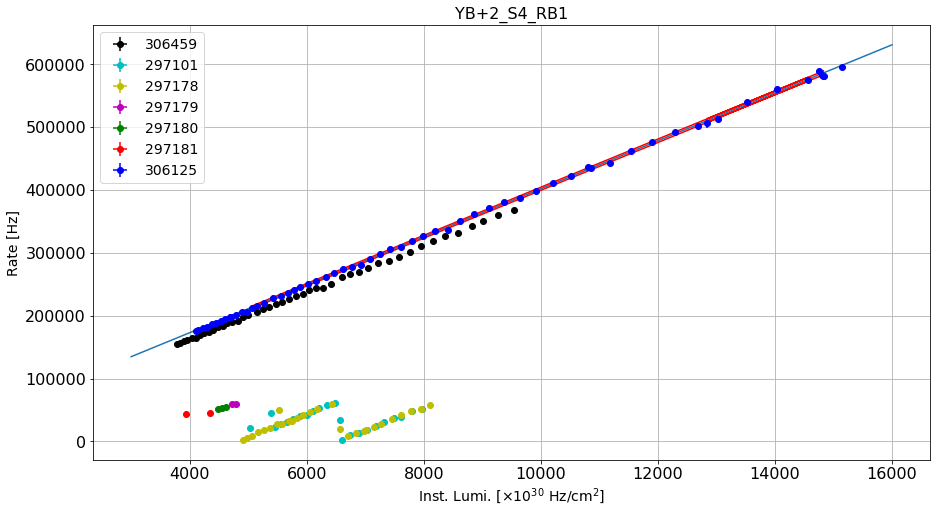

----------------------------------------------------------------------------------------------------------------
YB+2_S4_RB2
Linear correlation: (0.9991244454004758, 1.1054889389762832e-63)
Linear fit parameters: [   9.18018227 5005.14668004]
Paramenters uncertainty: [5.86217830e-02 5.73051036e+02]


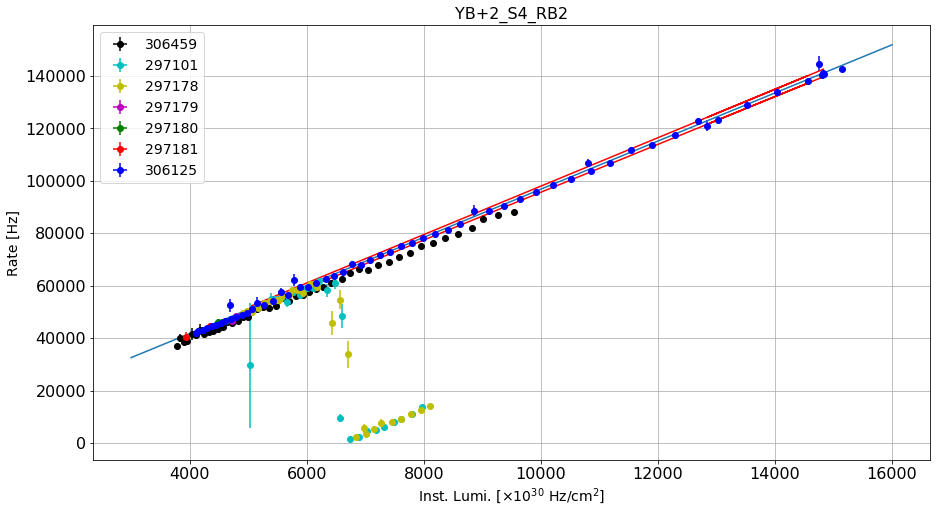

----------------------------------------------------------------------------------------------------------------
YB+2_S4_RB3
Linear correlation: (0.999636031528364, 2.940382272373419e-72)
Linear fit parameters: [1.49855101e+00 3.85890419e+03]
Paramenters uncertainty: [6.16740916e-03 6.02888556e+01]


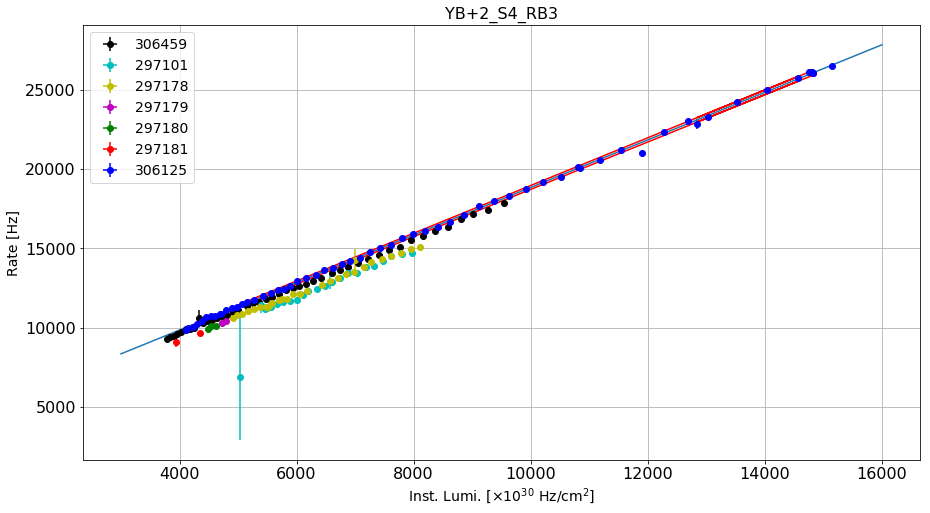

----------------------------------------------------------------------------------------------------------------
YB+2_S4_RB4
Linear correlation: (0.9999203103956417, 4.2391377494197915e-87)
Linear fit parameters: [   37.2338677  13916.11272649]
Paramenters uncertainty: [7.16878762e-02 7.00777247e+02]


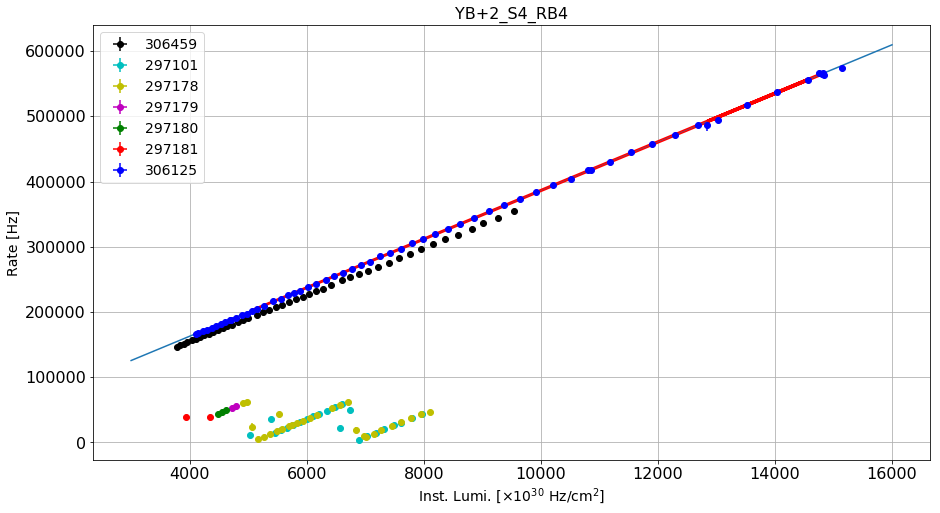

----------------------------------------------------------------------------------------------------------------
YB+2_S5_RB1
Linear correlation: (0.9999135008680682, 2.682093133111289e-86)
Linear fit parameters: [   38.6680973  22191.18585145]
Paramenters uncertainty: [7.75653262e-02 7.58231638e+02]


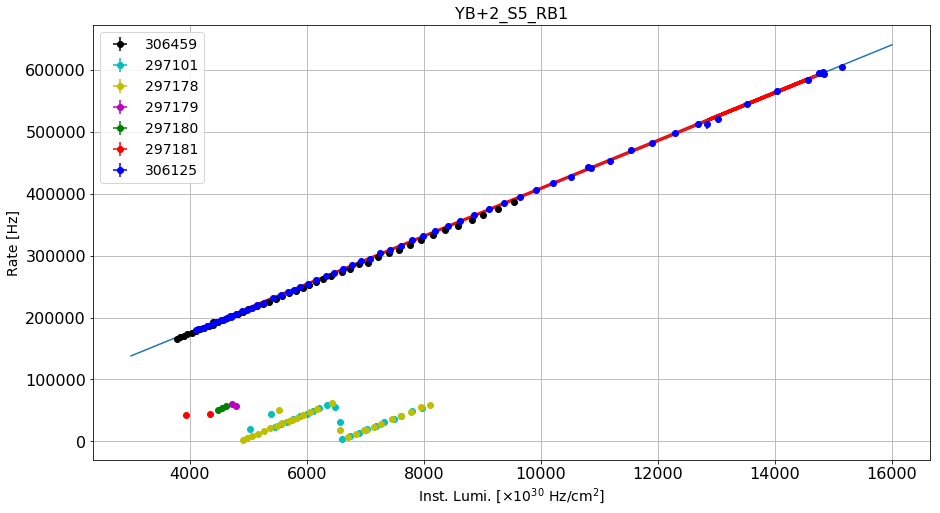

----------------------------------------------------------------------------------------------------------------
YB+2_S5_RB2
Linear correlation: (0.9968177809506552, 4.398329915190062e-51)
Linear fit parameters: [   9.67270249 5570.4590602 ]
Paramenters uncertainty: [1.17959271e-01 1.15309837e+03]


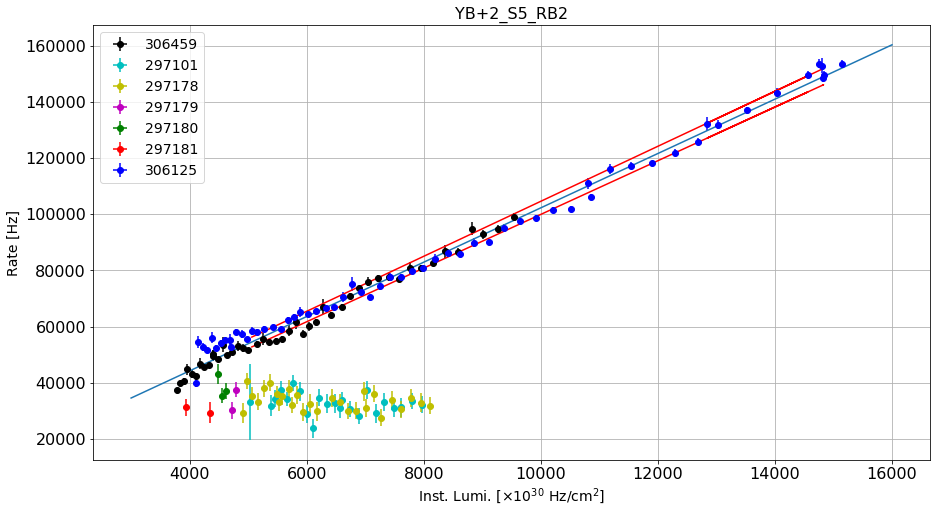

----------------------------------------------------------------------------------------------------------------
YB+2_S5_RB3
Linear correlation: (0.9853190706030643, 3.40568385677372e-36)
Linear fit parameters: [1.66523608e+00 4.81597419e+03]
Paramenters uncertainty: [4.40004002e-02 4.30121256e+02]


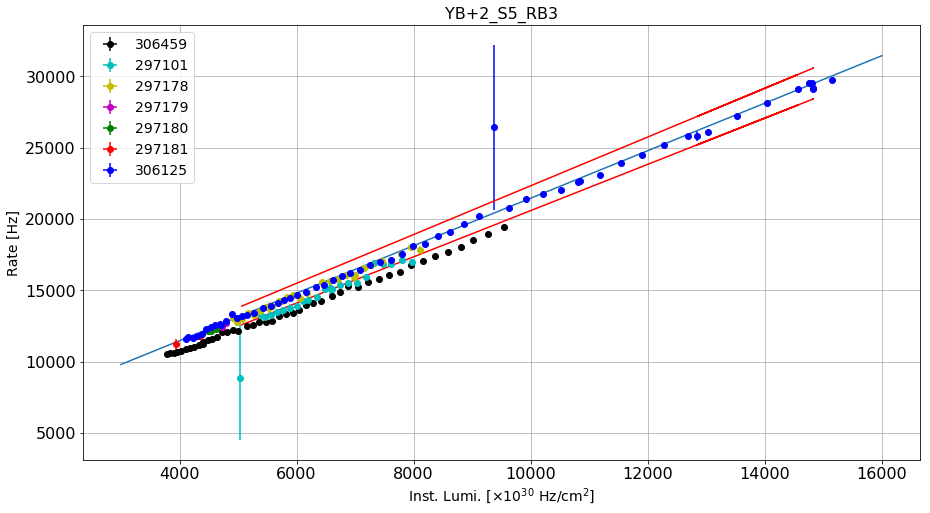

----------------------------------------------------------------------------------------------------------------
YB+2_S5_RB4
Linear correlation: (0.9998600932675826, 1.339181868362243e-81)
Linear fit parameters: [   45.97531974 24116.70687921]
Paramenters uncertainty: [1.17292545e-01 1.14658086e+03]


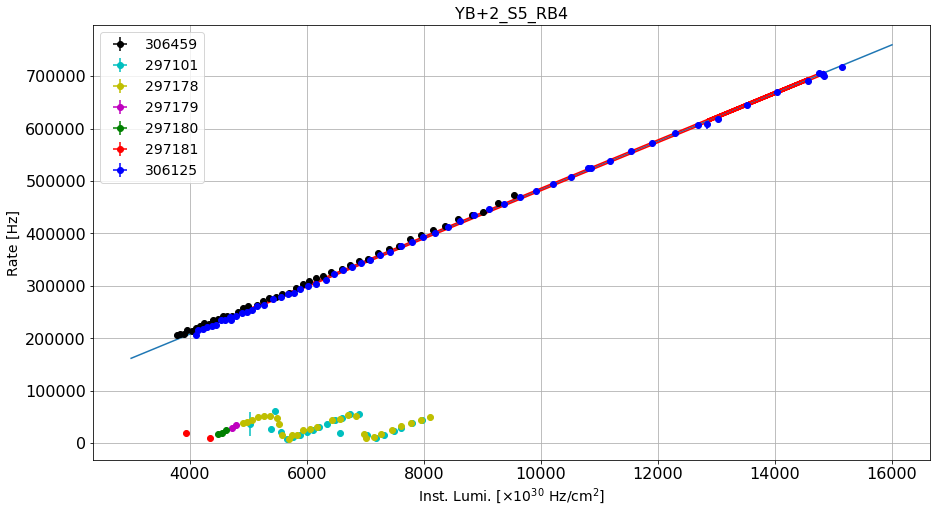

----------------------------------------------------------------------------------------------------------------
YB+2_S6_RB1
Linear correlation: (0.999830055708162, 1.0647179366452316e-79)
Linear fit parameters: [   39.9574757  17625.68002502]
Paramenters uncertainty: [1.12353722e-01 1.09830192e+03]


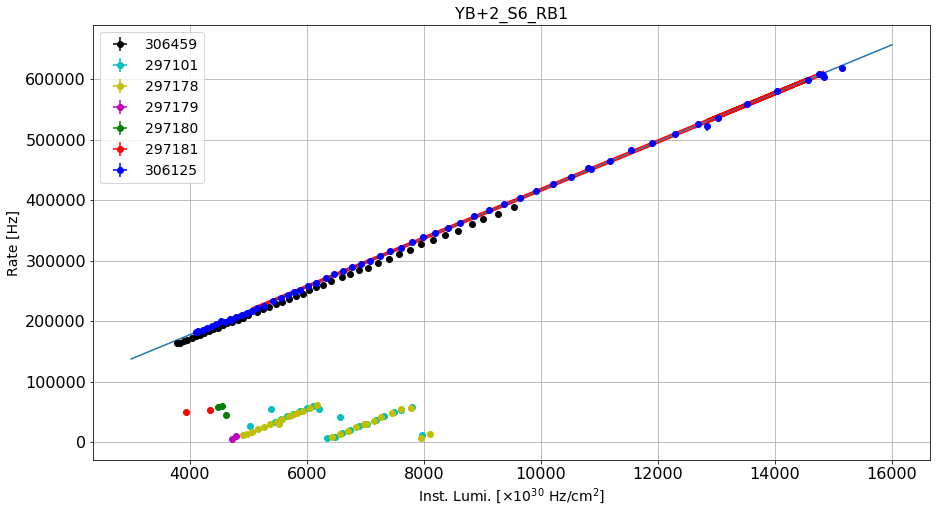

----------------------------------------------------------------------------------------------------------------
YB+2_S6_RB2
Linear correlation: (0.9999119328634153, 4.0180440957158524e-86)
Linear fit parameters: [   9.39567743 4601.01922488]
Paramenters uncertainty: [1.90171089e-02 1.85899735e+02]


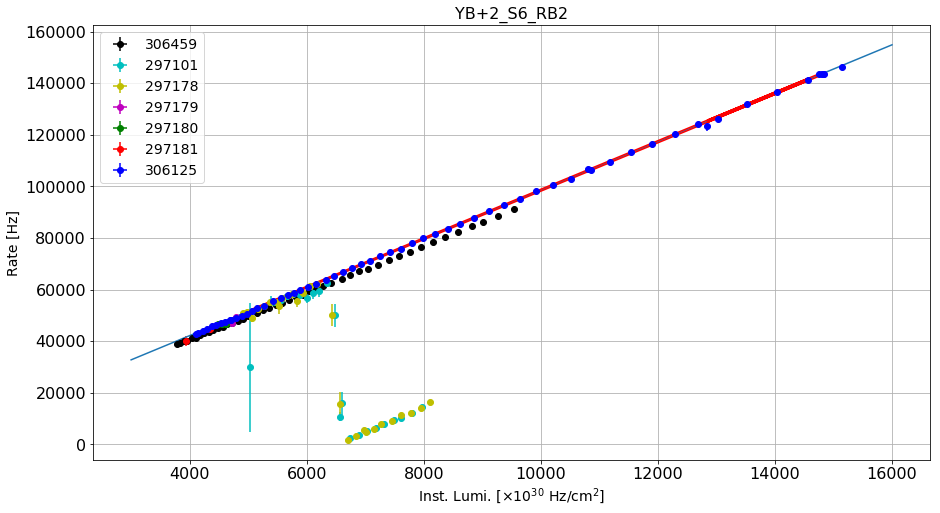

----------------------------------------------------------------------------------------------------------------
YB+2_S6_RB3
Linear correlation: (0.9840562022891906, 2.1521834118020683e-35)
Linear fit parameters: [1.39802164e+00 4.31573875e+03]
Paramenters uncertainty: [3.85329834e-02 3.76675102e+02]


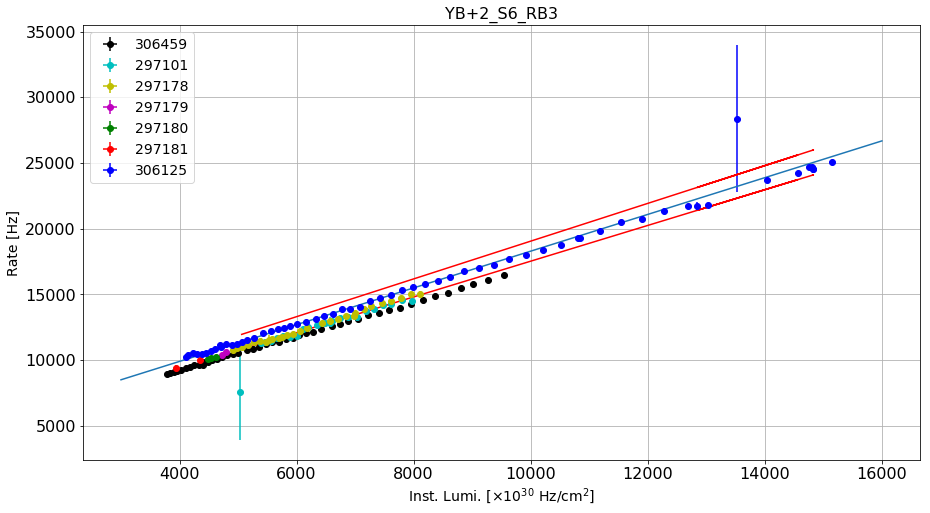

----------------------------------------------------------------------------------------------------------------
YB+2_S6_RB4
Linear correlation: (0.9998657486074444, 5.292599344752302e-82)
Linear fit parameters: [   33.42074639 28065.87461848]
Paramenters uncertainty: [8.35218387e-02 8.16458895e+02]


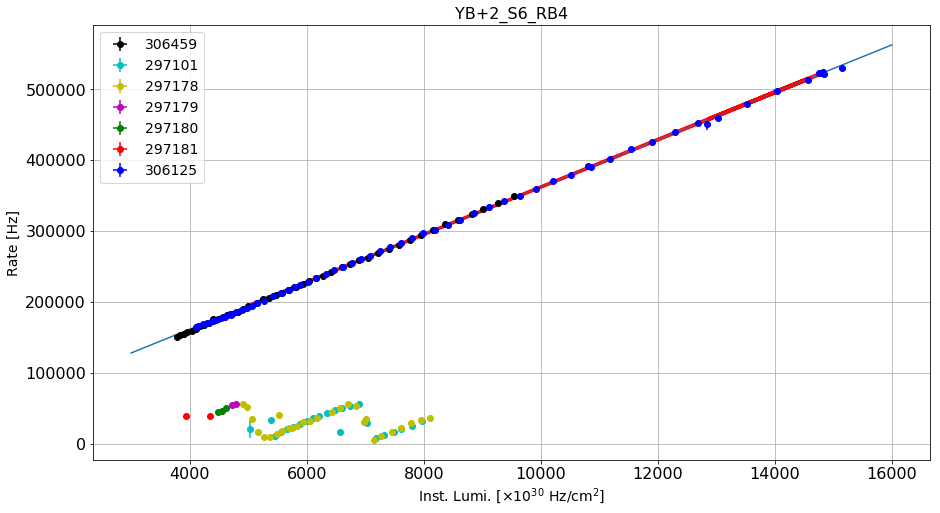

----------------------------------------------------------------------------------------------------------------
YB+2_S7_RB1
Linear correlation: (0.9998997471685264, 7.418610744189748e-85)
Linear fit parameters: [   40.34851422 17011.23210242]
Paramenters uncertainty: [8.71343302e-02 8.51772424e+02]


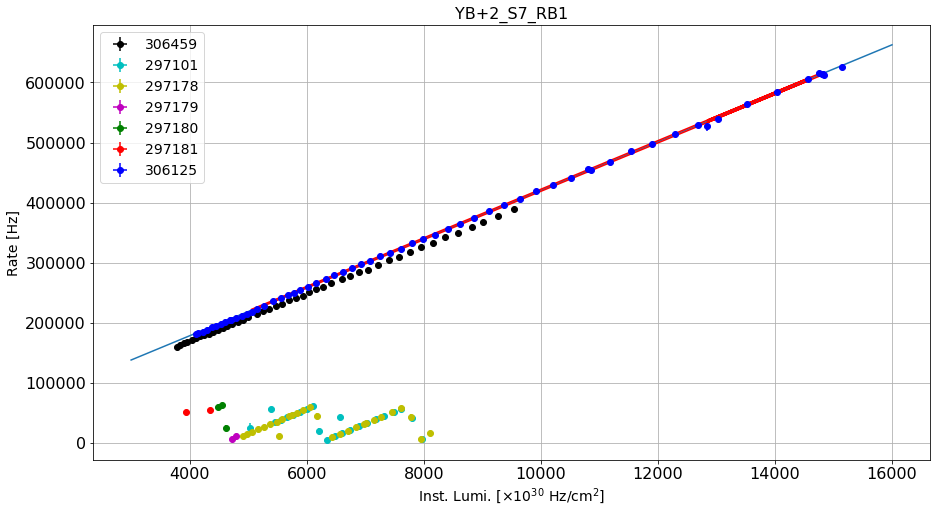

----------------------------------------------------------------------------------------------------------------
YB+2_S7_RB2
Linear correlation: (0.9997687342999354, 1.0903474743862051e-76)
Linear fit parameters: [   9.73184501 2381.26760757]
Paramenters uncertainty: [3.19232357e-02 3.12062212e+02]


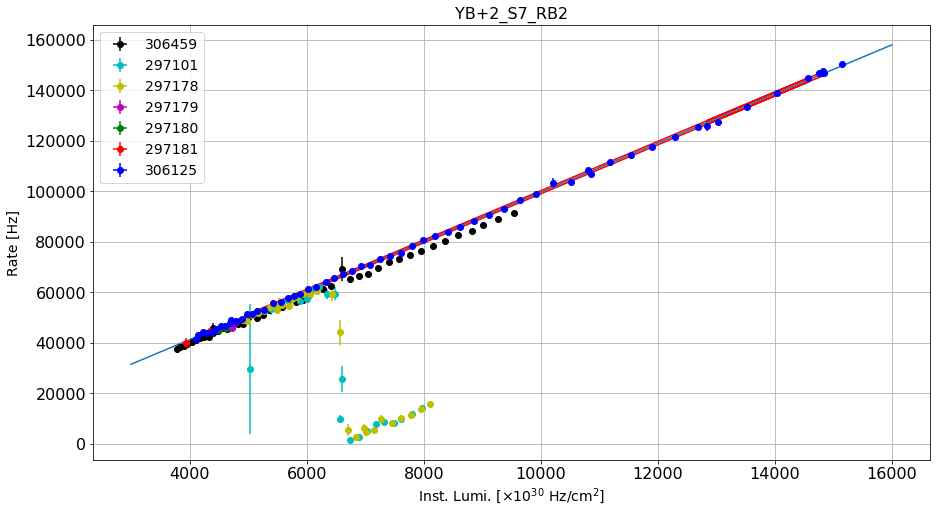

----------------------------------------------------------------------------------------------------------------
YB+2_S7_RB3
Linear correlation: (0.9529574808534337, 5.814913062842292e-25)
Linear fit parameters: [1.25348379e+00 2.40678337e+03]
Paramenters uncertainty: [6.07998700e-02 5.94342695e+02]


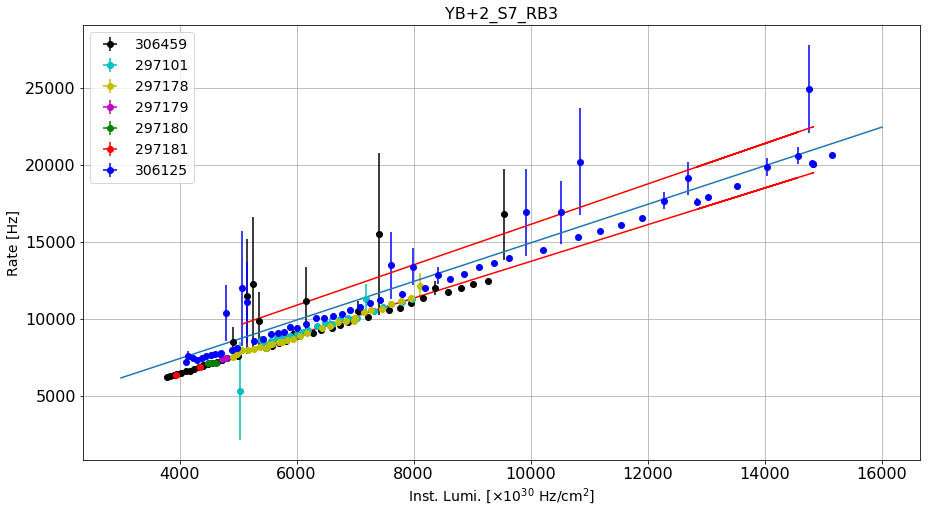

----------------------------------------------------------------------------------------------------------------
YB+2_S7_RB4
Linear correlation: (0.9991268365095967, 1.0395433834916392e-63)
Linear fit parameters: [  26.58996618 9560.64402579]
Paramenters uncertainty: [1.69562922e-01 1.65754440e+03]


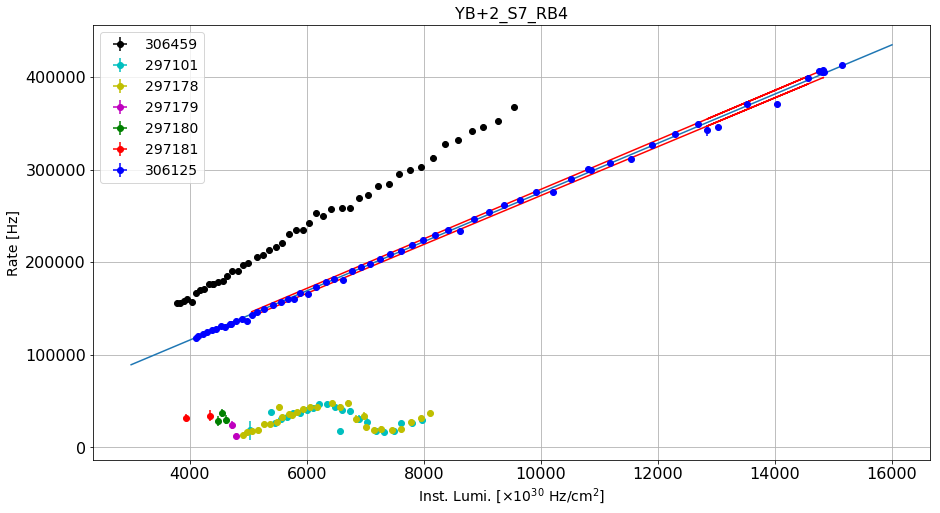

----------------------------------------------------------------------------------------------------------------
YB+2_S8_RB1
Linear correlation: (0.998559355696575, 8.075726128241351e-59)
Linear fit parameters: [4.27782094e+01 2.26393974e+05]
Paramenters uncertainty: [3.50551152e-01 3.42677568e+03]


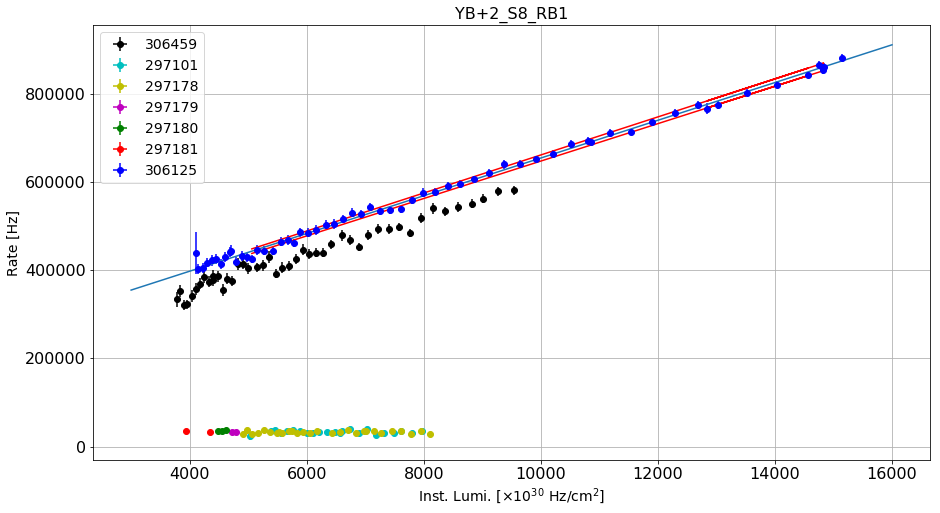

----------------------------------------------------------------------------------------------------------------
YB+2_S8_RB2
Linear correlation: (0.9985182281168075, 1.5207252101578872e-58)
Linear fit parameters: [7.98611871e+00 7.72301864e+04]
Paramenters uncertainty: [6.63728197e-02 6.48820475e+02]


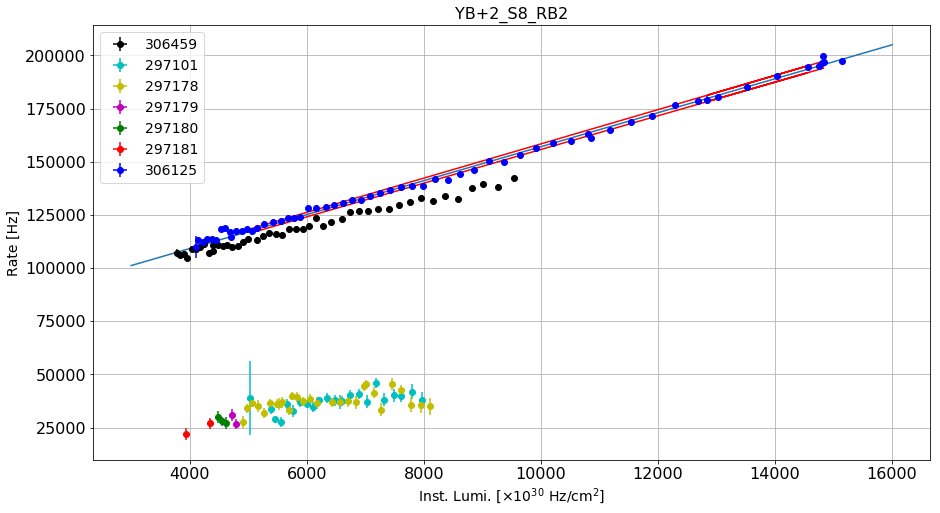

----------------------------------------------------------------------------------------------------------------
YB+2_S8_RB3
Linear correlation: (0.9984127284320028, 7.139228664982437e-58)
Linear fit parameters: [9.46068723e-01 7.33808531e+03]
Paramenters uncertainty: [8.13854108e-03 7.95574471e+01]


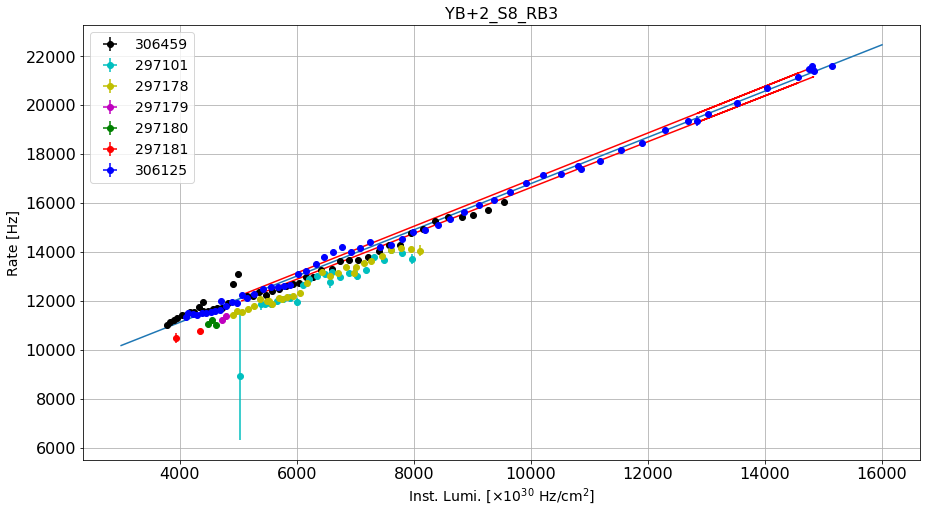

----------------------------------------------------------------------------------------------------------------
YB+2_S8_RB4
Linear correlation: (0.9999112343143842, 4.7997032215719135e-86)
Linear fit parameters: [   9.6889369  3143.64050397]
Paramenters uncertainty: [1.96883068e-02 1.92460959e+02]


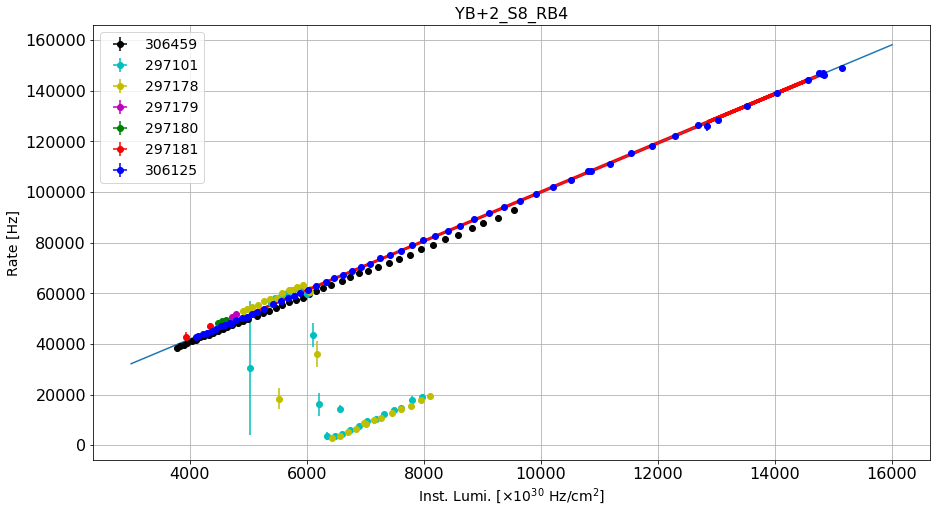

----------------------------------------------------------------------------------------------------------------
YB+2_S9_RB1
Linear correlation: (0.9996963072948881, 5.00623990508141e-74)
Linear fit parameters: [3.79300863e+01 3.79510650e+04]
Paramenters uncertainty: [1.42587258e-01 1.39384665e+03]


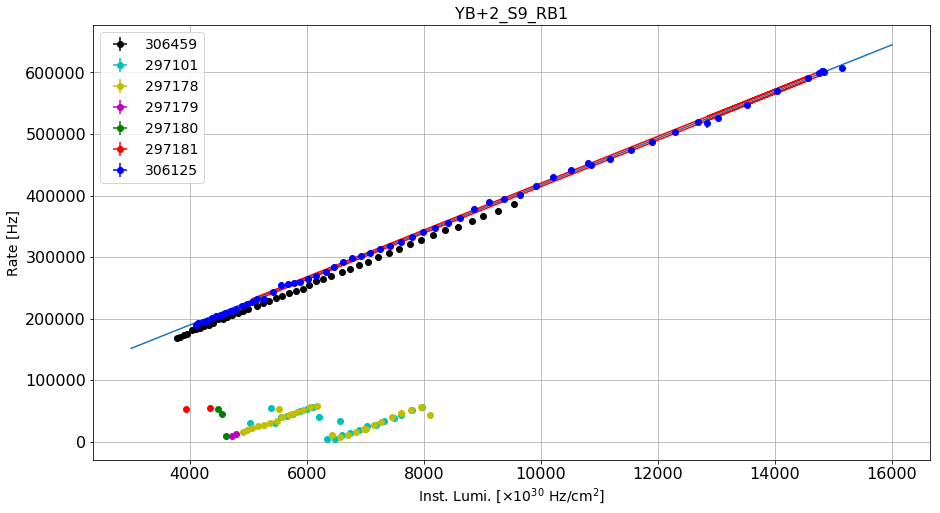

----------------------------------------------------------------------------------------------------------------
YB+2_S9_RB2
Linear correlation: (0.9995338051569777, 7.705130682260078e-70)
Linear fit parameters: [1.00101555e+01 1.70383965e+04]
Paramenters uncertainty: [4.66291200e-02 4.55818028e+02]


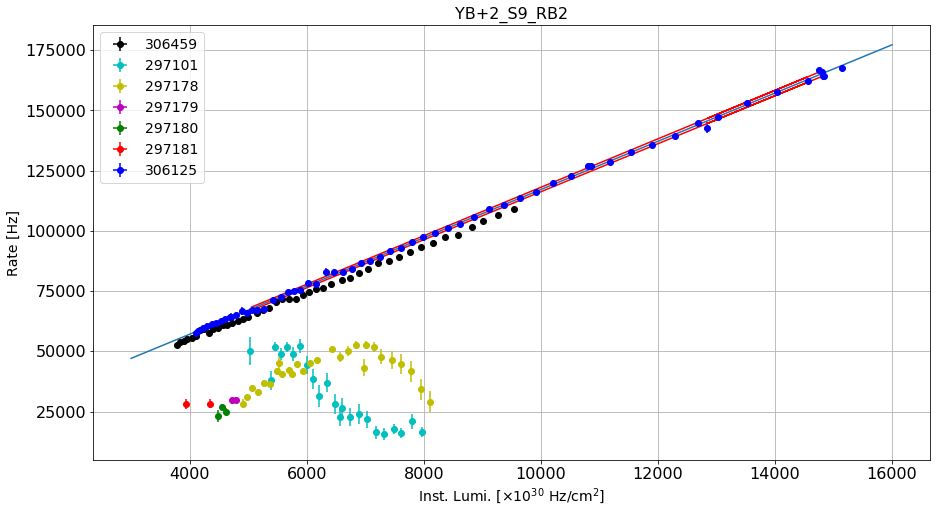

----------------------------------------------------------------------------------------------------------------
YB+2_S9_RB3
Linear correlation: (0.9993576250786387, 1.0434395939958432e-66)
Linear fit parameters: [7.55986350e-01 5.26992354e+03]
Paramenters uncertainty: [4.13426515e-03 4.04140714e+01]


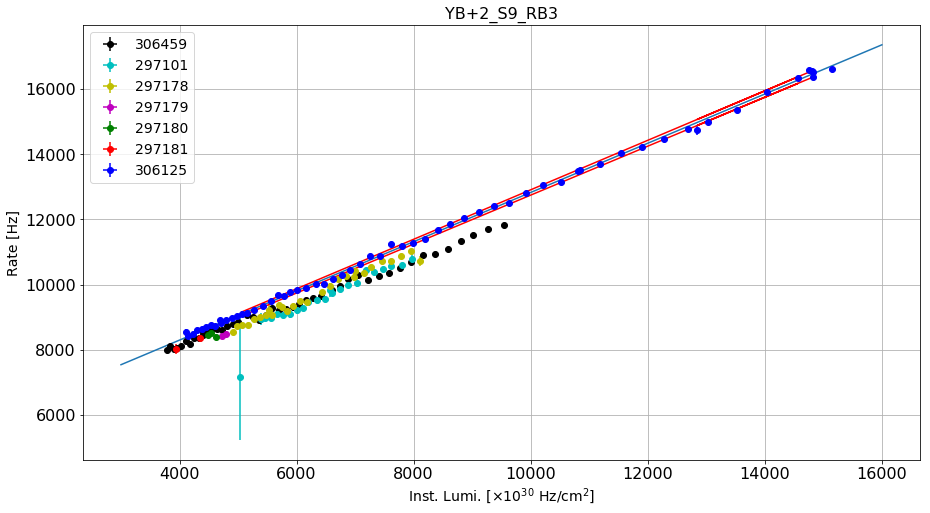

----------------------------------------------------------------------------------------------------------------
YB+2_S9_RB4
Linear correlation: (0.9983849882904907, 1.0539671330581e-57)
Linear fit parameters: [1.34306146e+00 1.82837104e+03]
Paramenters uncertainty: [1.16544299e-02 1.13926646e+02]


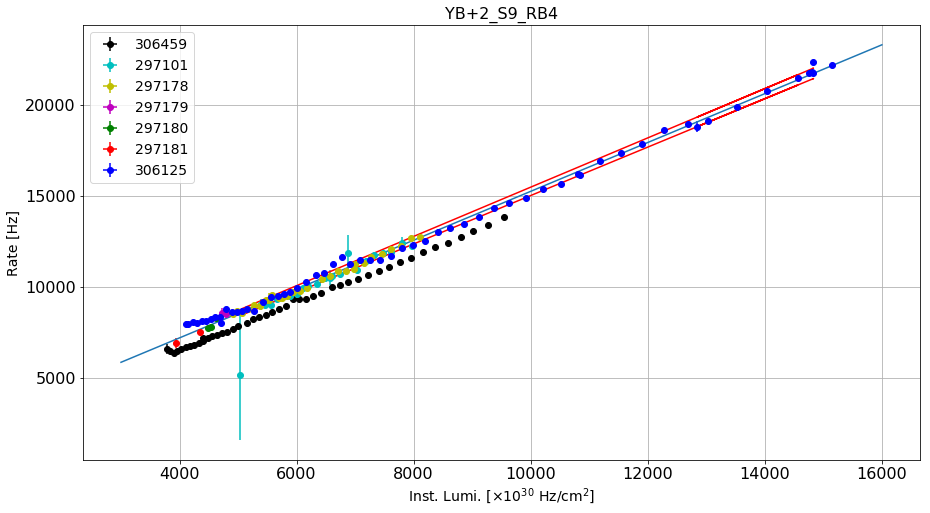

----------------------------------------------------------------------------------------------------------------
YB+2_S10_RB1
Linear correlation: (0.9999370488770424, 2.1056835344548906e-89)
Linear fit parameters: [   38.15277445 12537.22676033]
Paramenters uncertainty: [6.52873651e-02 6.38209728e+02]


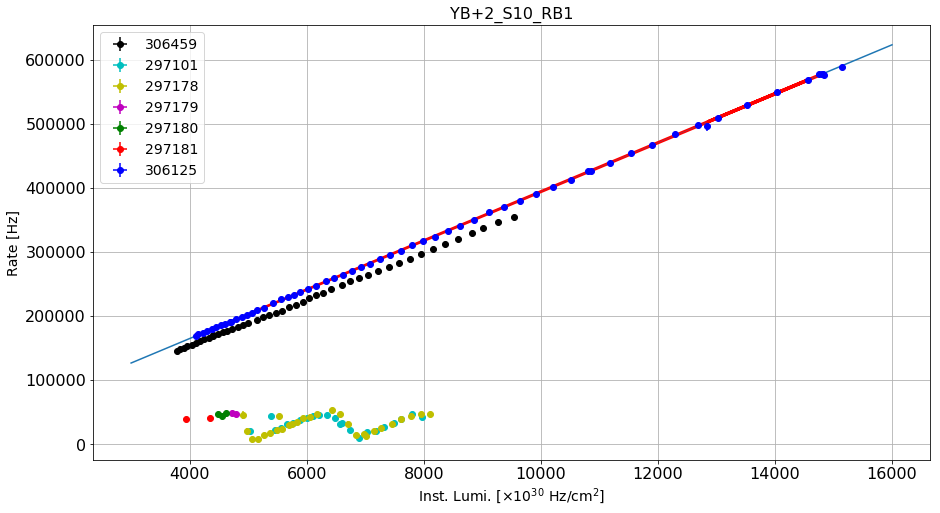

----------------------------------------------------------------------------------------------------------------
YB+2_S10_RB2
Linear correlation: (0.9999344386270704, 5.252716793994538e-89)
Linear fit parameters: [   8.65179548 5157.14992405]
Paramenters uncertainty: [1.51088841e-02 1.47695298e+02]


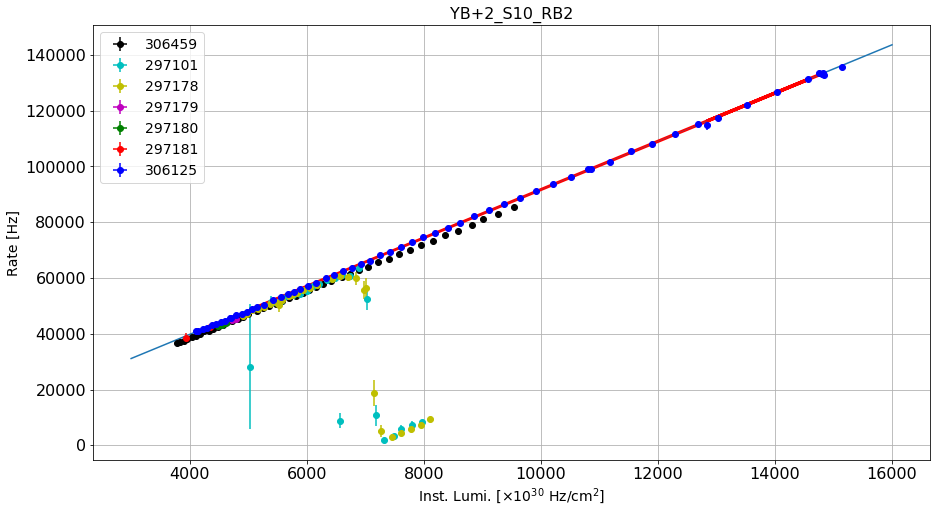

----------------------------------------------------------------------------------------------------------------
YB+2_S10_RB3
Linear correlation: (0.9996281079304963, 4.773251269653899e-72)
Linear fit parameters: [6.30353787e-01 4.17581245e+03]
Paramenters uncertainty: [2.62237475e-03 2.56347468e+01]


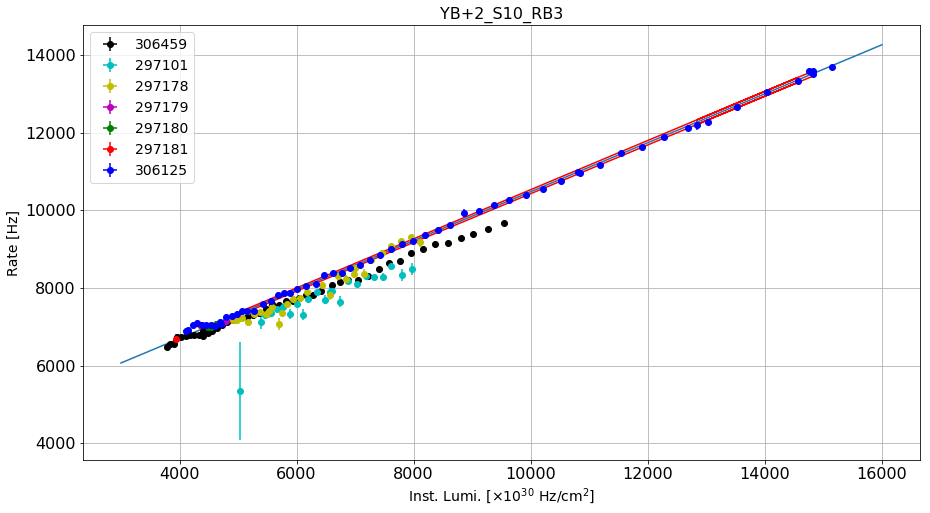

----------------------------------------------------------------------------------------------------------------
YB+2_S10_RB4
Linear correlation: (0.9986719674194161, 1.2952525459714046e-59)
Linear fit parameters: [1.46978959e+00 4.15058714e+03]
Paramenters uncertainty: [1.15630714e-02 1.13033580e+02]


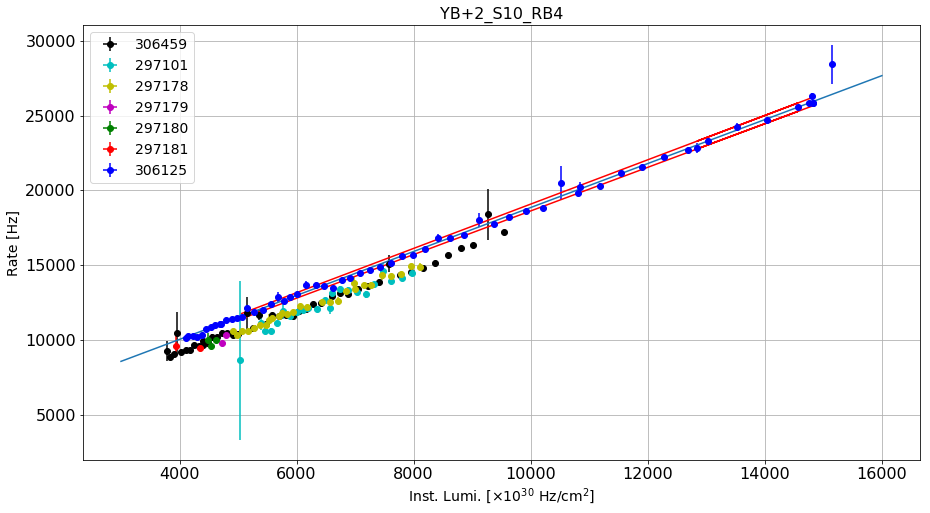

----------------------------------------------------------------------------------------------------------------
YB+2_S11_RB1
Linear correlation: (0.999710585754045, 1.6943387673657426e-74)
Linear fit parameters: [   38.0480644 23734.9642179]
Paramenters uncertainty: [1.39626411e-01 1.36490320e+03]


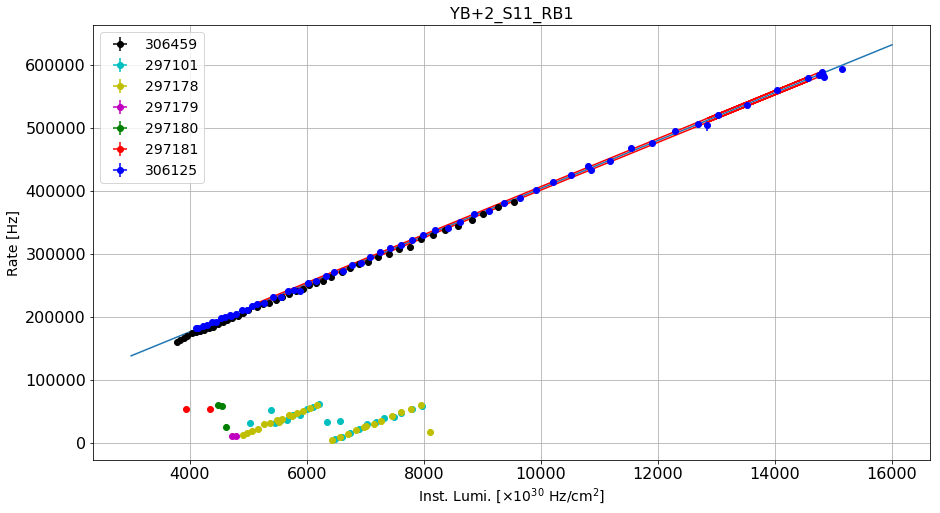

----------------------------------------------------------------------------------------------------------------
YB+2_S11_RB2
Linear correlation: (0.9998694440840435, 2.82445764802791e-82)
Linear fit parameters: [   8.82269369 2922.20605906]
Paramenters uncertainty: [2.17431658e-02 2.12548016e+02]


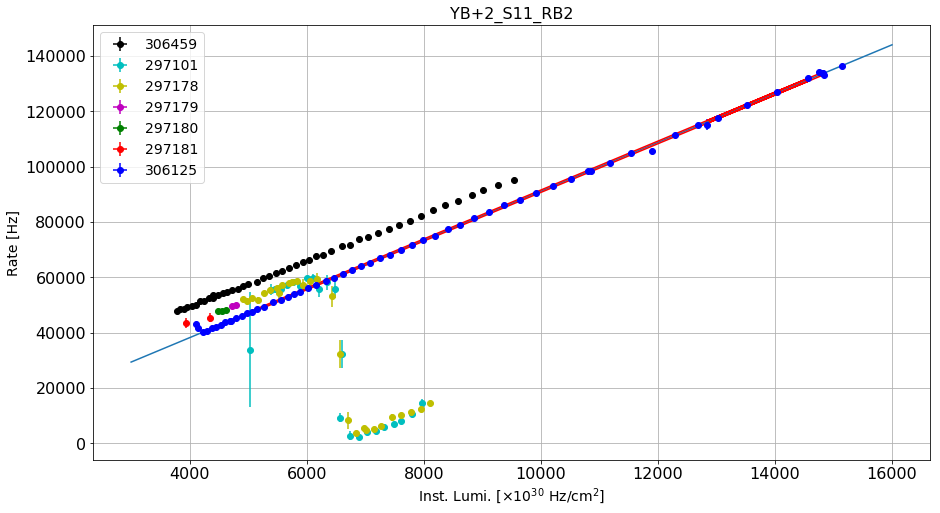

----------------------------------------------------------------------------------------------------------------
YB+2_S11_RB3
Linear correlation: (0.7458743136275544, 1.7866843080523332e-09)
Linear fit parameters: [5.15449259e-01 3.19526900e+04]
Paramenters uncertainty: [7.01967185e-02 6.86200593e+02]


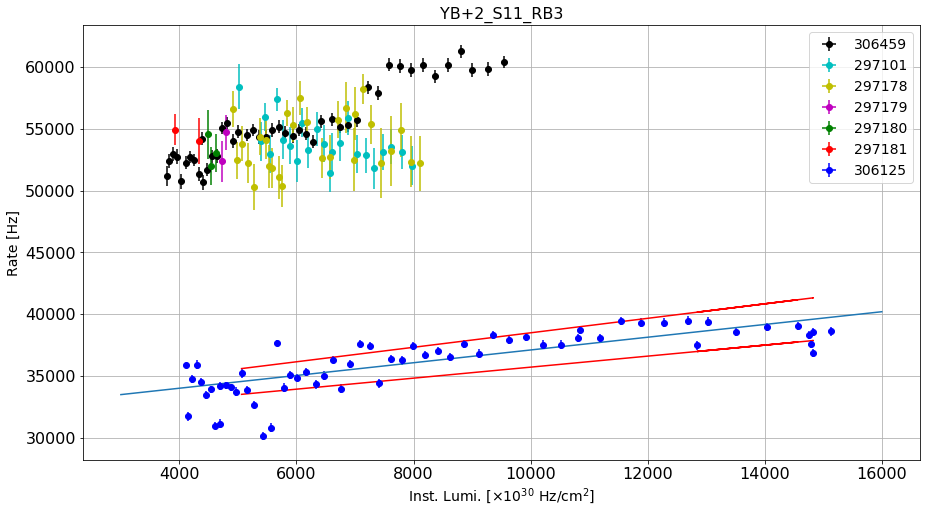

----------------------------------------------------------------------------------------------------------------
YB+2_S11_RB4
Linear correlation: (0.9749005356362055, 5.31738512374142e-31)
Linear fit parameters: [1.15837744e+00 1.18680040e+04]
Paramenters uncertainty: [4.0342276e-02 3.9436165e+02]


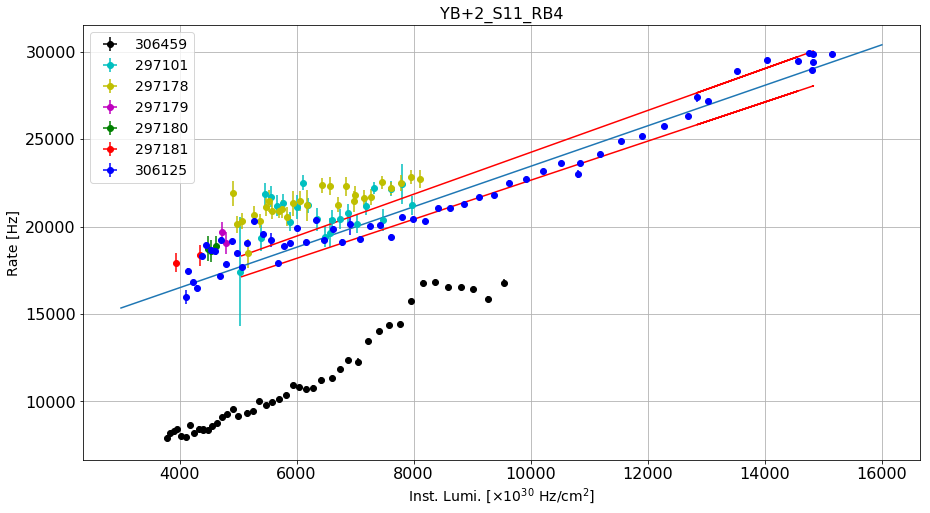

----------------------------------------------------------------------------------------------------------------
YB+2_S12_RB1
Linear correlation: (0.9993877149331392, 3.5466340280452506e-67)
Linear fit parameters: [   24.26429116 20781.24379729]
Paramenters uncertainty: [1.29546212e-01 1.26636528e+03]


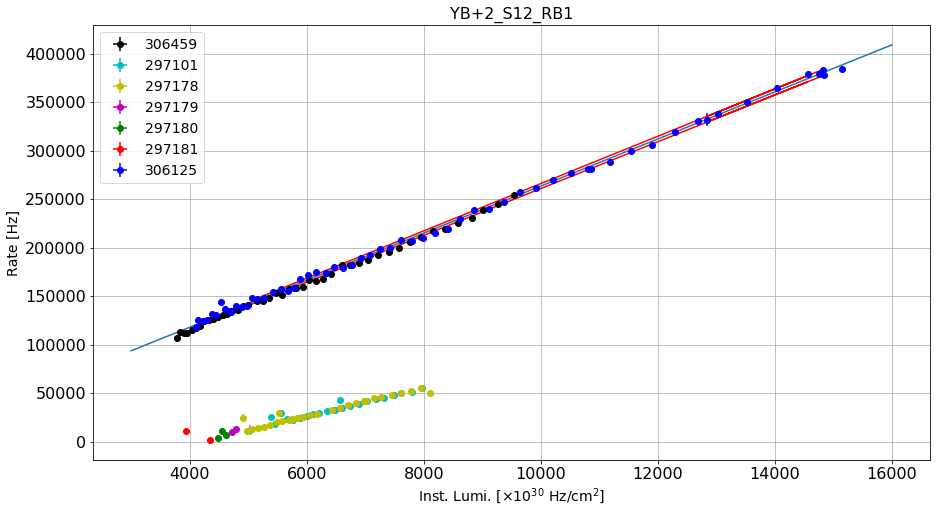

----------------------------------------------------------------------------------------------------------------
YB+2_S12_RB2
Linear correlation: (0.998986597749214, 2.962491718606603e-62)
Linear fit parameters: [7.21241276e+00 5.20046236e+04]
Paramenters uncertainty: [4.95544382e-02 4.84414166e+02]


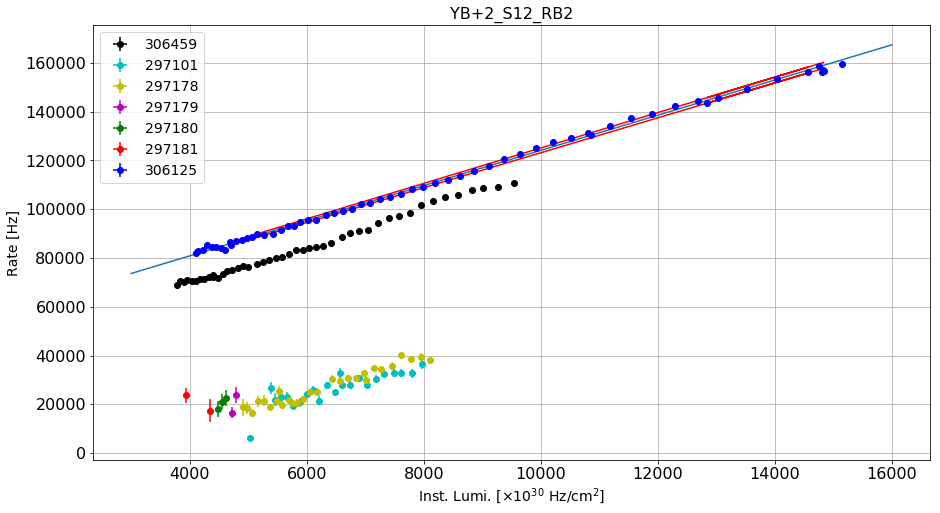

----------------------------------------------------------------------------------------------------------------
YB+2_S12_RB3
Linear correlation: (0.9998514199813134, 5.182522274050345e-81)
Linear fit parameters: [4.63625883e-01 7.60474935e+02]
Paramenters uncertainty: [1.21892518e-03 1.19154741e+01]


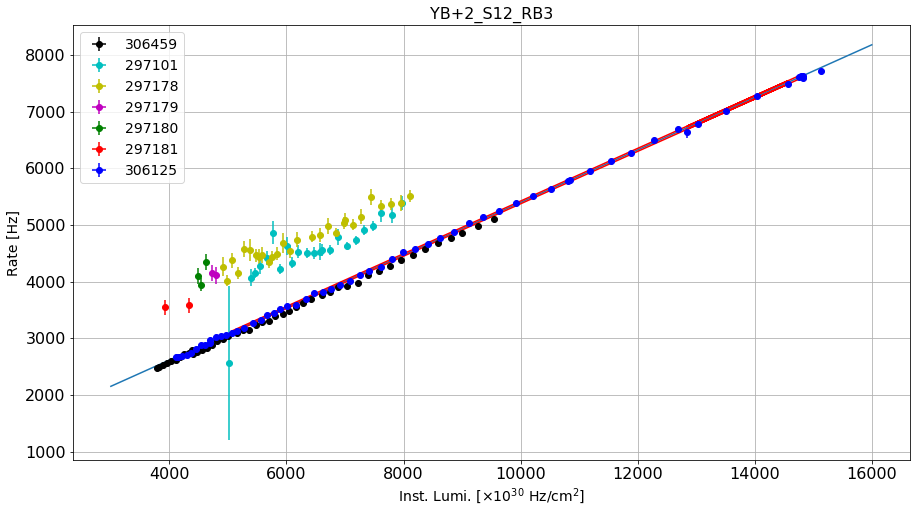

----------------------------------------------------------------------------------------------------------------
YB+2_S12_RB4
Linear correlation: (0.999397306916784, 2.4863737473028875e-67)
Linear fit parameters: [1.78659002e+01 1.00242807e+05]
Paramenters uncertainty: [9.46346448e-02 9.25090955e+02]


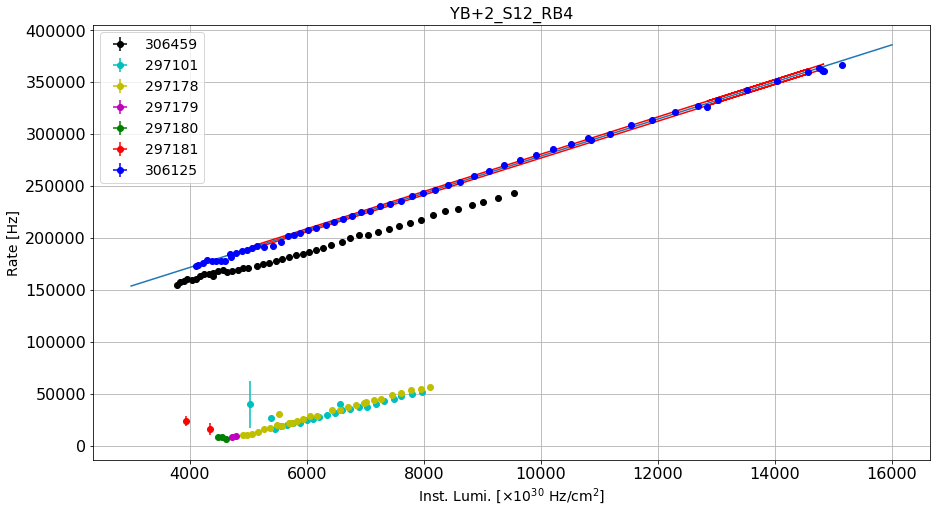

----------------------------------------------------------------------------------------------------------------


In [173]:
#for i in [-2]: #Only anomalous wheels
    #for j in range(7, 8): #Only anomalous sectors
        #range_ = range(3, 4)
for i in [-2, -1, 0, +1, +2]:
    for j in range(1, 13):
        range_ = range(1, 5)
        for k in range_:

            if (i > 0):
                board = "YB+" + str(i) + "_S" + str(j)
            else:
                board = "YB" + str(i) + "_S" + str(j)
            station = "RPC" + str(k)
            
            error = "err"+station
            
            title = board + "_RB" + str(k)
                
            print title
            
            fmin = df_rates_new_2[(df_rates_new_2.station == k) & (df_rates_new_2.board == board)]["fmin"].iloc[0]
            fmax = df_rates_new_2[(df_rates_new_2.station == k) & (df_rates_new_2.board == board)]["fmax"].iloc[0]
            #print fmin, fmax
                
            #plot_ratio_vs_ls(df_rates_new_2[df_rates_new_2.station == k],\
            #                [297179, 297180, 297181, 306125],\
            #                 "lumi", "rate", board, 0,\
            #                "err", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
            #                r"Cross-section [$\times10^{-30}$ cm$^{2}$]",\
            #                 title, ["mo", "go", "ro", "bo"], False, True, fmin, fmax)

            coeff = plot_rate_vs_ls(df_rates_new_2[df_rates_new_2.station == k],\
                                    [306459, 297101, 297178, 297179, 297180, 297181, 306125],\
                                    "lumi", "rate", board, 0, "err",\
                                    r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                                    "Rate [Hz]", title, ["ko", "co", "yo", "mo", "go", "ro", "bo"],\
                                    False, True, fmin, fmax)
            
            #print coeff
            rule = (df_rates_new_2.station == k) & (df_rates_new_2.board == board) & (df_rates_new_2.run == 306125)
            indexes = df_rates_new_2[rule].index
            for m in indexes:
                a = coeff[0][0]
                b = coeff[0][1]
                s_a = coeff[1][0]
                s_b = coeff[1][1]
                df_rates_new_2.loc[m, "slope"] = a
                df_rates_new_2.loc[m, "inter"] = b
                df_rates_new_2.loc[m, "err_a"] = s_a
                df_rates_new_2.loc[m, "err_b"] = s_b
                x = df_rates_new_2.loc[m, "lumi"]
                df_rates_new_2.loc[m, "rate_mid"] = x*a + b #central value
                df_rates_new_2.loc[m, "rate_low"] = x*(a - s_a) + (b - s_b) #lower limit
                df_rates_new_2.loc[m, "rate_high"] = x*(a + s_a) + (b + s_b) #upper limit
            print "----------------------------------------------------------------------------------------------------------------"



In [174]:
def get_matrix(df):
    x = np.zeros((5,12),dtype=int)
    for i in range(len(df)):
        a = int(5-df["station"].iloc[i])
        b = int(df["sector"].iloc[i]-1)
        x[a,b] = x[a,b] + 1
    return x

In [175]:
def plot_scatter(df, run, wheel, ls_min, ls_max):
    run_s = "All"
    wheel_s = "All"
    ls_s = "All"
    temp = df.copy()
    if wheel != -3:
        temp = temp[(temp["wheel"] == wheel)]
        wheel_s = str(wheel)
    if run != -1:
        temp = temp[(temp["run"] == run)]
        run_s = str(run)
    if ((ls_min != -1) & (ls_max == -1)):
        temp = temp[(temp["averageLS"] >= ls_min)]
        ls_s = "> "+str(ls_min)
    elif ((ls_min == -1) & (ls_max != -1)):
        temp = temp[(temp["averageLS"] <= ls_max)]
        ls_s = "< "+str(ls_max)
    elif ((ls_min != -1) & (ls_max != -1)):
        temp = temp[(temp["averageLS"] >= ls_min) & (temp["averageLS"] <= ls_max)]
        ls_s = " ["+str(ls_min)+", "+str(ls_max)+"]"
    mat = get_matrix(temp)
    print mat
    print mat.sum()

    plt.figure()
    
    ax = plt.gca()
    ax.set_yticklabels(["1", "2", "3", "4", "5"])
    ax.set_yticks([4, 3, 2, 1, 0])
    ax.set_xticklabels(["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"])
    ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])
    
    plt.xlabel("Sector")
    plt.ylabel("Station")
    
    im = ax.imshow(mat, interpolation="nearest")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    
    for i in range(0,5):
        for j in range(0,12):
            text = ax.text(j, i, mat[i, j],\
            ha="center", va="center", color="w")
    
    plt.colorbar(im, cax=cax, ticks=[np.min(np.nan_to_num(mat)), np.max(np.nan_to_num(mat))])
    title = "Run: "+run_s+", Wheel: "+wheel_s+", LS: "+ls_s
    plt.title(title, loc="right")   
    plt.show()

Calculating the number of hits as the area under the curve Rate vs. LS. Each point is the average rate over 10 LS.

In [176]:
def calcHits(data):
    # 230 is 10 lumisections times 23.3 seconds, the duration of one LS
    return data*10*23.3

df_rates_new_2["hits"] = df_rates_new_2["rate"].apply(calcHits)
#print df_rates_new_2["hits"]

In [177]:
temp = df_rates_new_2.groupby(["wheel", "sector", "station", "run", "system"])[["hits"]]\
.sum().reset_index()        

Normalizing the number of hits for each chamber to the total number of hits collected during the run:. N.B.: the numbers are percentages.

In [178]:
#plot_scatter_2(temp[temp.run == 306125], "hits", -2, True)
#plot_scatter_2(temp[temp.run == 306125], "hits", -1, True)
#plot_scatter_2(temp[temp.run == 306125], "hits", 0, True)
#plot_scatter_2(temp[temp.run == 306125], "hits", +1, True)
#plot_scatter_2(temp[temp.run == 306125], "hits", +2, True)

In [179]:
#plot_scatter_2(temp[temp.run == 297179], "hits", -2, True)
#plot_scatter_2(temp[temp.run == 297179], "hits", -1, True)
#plot_scatter_2(temp[temp.run == 297179], "hits", 0, True)
#plot_scatter_2(temp[temp.run == 297179], "hits", +1, True)
#plot_scatter_2(temp[temp.run == 297179], "hits", +2, True)

# Model training section <a class="anchor" id="fourth-bullet"></a>

In [180]:
print df_rates_new_2.columns

Index([u'run', u'group', u'board', u'wheel', u'sector', u'ls', u'lumi',
       u'errLumi', u'rate', u'err', u'system', u'station', u'CS', u'errCS',
       u'content', u'score', u'fmin', u'fmax', u'slope', u'inter', u'err_a',
       u'err_b', u'rate_low', u'rate_high', u'rate_mid', u'hits'],
      dtype='object')


## Creating train and test samples:

In [219]:
anomalies = df_rates_new_2.copy()

In [220]:
normalies = anomalies.copy()

In [221]:
print len(normalies), len(anomalies)

39600 39600


In [222]:
def assignScore(df, wheel, sector, station, run, ls_min, ls_max, score):
    temp = df.copy()
    
    rule = (temp["run"] > 0)
    
    if(run != -1):
        rule = rule & (temp["run"] == run)
        
    if(wheel != -1):
        rule = rule & (temp["wheel"] == wheel)
    if(sector != -1):
        rule = rule & (temp["sector"] == sector)
    if(station != -1):
        rule = rule & (temp["station"] == station)
    
    if ((ls_min != -1) & (ls_max == -1)):
        rule = rule & (temp["ls"] >= ls_min)
    elif ((ls_min == -1) & (ls_max != -1)):
        rule = rule & (temp["ls"] <= ls_max)
    elif ((ls_min != -1) & (ls_max != -1)):
        rule = rule & (temp["ls"] >= ls_min) & (temp["ls"] <= ls_max)
        
    #print rule
    indexes = temp[rule].index
    #print indexes
    for i in indexes:
        temp.loc[i, "score"] = score
    return temp

During runs 297179, 297180, 297181 LV tripped in: W-1_S4, all stations; W-1_S5, all stations; W-1_S6, all stations.

In [223]:
temp = assignScore(anomalies, -1, 4, -1, 297179, -1, -1, 1)
anomalies = temp
temp = assignScore(anomalies, -1, 5, -1, 297179, -1, -1, 1)
anomalies = temp
temp = assignScore(anomalies, -1, 6, -1, 297179, -1, -1, 1)
anomalies = temp

In [224]:
temp = assignScore(anomalies, -1, 4, -1, 297180, -1, -1, 1)
anomalies = temp
temp = assignScore(anomalies, -1, 5, -1, 297180, -1, -1, 1)
anomalies = temp
temp = assignScore(anomalies, -1, 6, -1, 297180, -1, -1, 1)
anomalies = temp

In [225]:
temp = assignScore(anomalies, -1, 4, -1, 297181, -1, -1, 1)
anomalies = temp
temp = assignScore(anomalies, -1, 5, -1, 297181, -1, -1, 1)
anomalies = temp
temp = assignScore(anomalies, -1, 6, -1, 297181, -1, -1, 1)
anomalies = temp

Check that the change affects only normalies:

In [226]:
rule = (normalies["wheel"] == -1) & (normalies["sector"] == 3) &\
(normalies["station"] == 3) & (normalies["run"] == 297180)
print "Normal chamber:"
print normalies[rule]["score"].iloc[0]

rule = (normalies["wheel"] == -1) & (normalies["sector"] == 4) &\
(normalies["station"] == 3) & (normalies["run"] == 297180)
print "Anomalous chamber:"
print normalies[rule]["score"].iloc[0]

Normal chamber:
-1
Anomalous chamber:
-1


In [227]:
rule = (anomalies["wheel"] == -1) & (anomalies["sector"] == 3) &\
(anomalies["station"] == 3) & (normalies["run"] == 297180)
print "Normal chamber:"
print anomalies[rule]["score"].iloc[0]

rule = (anomalies["wheel"] == -1) & (anomalies["sector"] == 4) &\
(anomalies["station"] == 3) & (normalies["run"] == 297180)
print "Anomalous chamber:"
print anomalies[rule]["score"].iloc[0]

Normal chamber:
-1
Anomalous chamber:
1


In [228]:
rule = (anomalies["wheel"] == -1) & (anomalies["sector"] == 3) &\
(anomalies["station"] == 3) & (normalies["run"] == 306125)
print "Normal chamber:"
print anomalies[rule]["score"].iloc[0]

rule = (anomalies["wheel"] == -1) & (anomalies["sector"] == 4) &\
(anomalies["station"] == 3) & (normalies["run"] == 306125)
print "Anomalous chamber:"
print anomalies[rule]["score"].iloc[0]

Normal chamber:
-1
Anomalous chamber:
-1


In [229]:
#Scale the data
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import minmax_scale
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing.data import QuantileTransformer
def scale_data(data, scaler_type = 2):
    
    types = ["RobustScaler", "MaxAbsScaler", "QuantileTransformerUniform",\
             "QuantileTransformerNormal", "Normalizer", "MinMaxScaler"]
    #print "Scaling data using:", types[scaler_type-1]
    
    # Need to reshape since scaler works per column

    if (scaler_type == 0):
        return data
    if (scaler_type == 1):
        data = data.reshape(-1, 1)
        scaler = RobustScaler(quantile_range=(25, 75)).fit(data)
        return scaler.transform(data).reshape(1, -1)
    if (scaler_type == 2):
        data = data.reshape(-1, 1)
        scaler = MaxAbsScaler().fit(data)
        return scaler.transform(data).reshape(1, -1)
    if (scaler_type == 3):
        data = data.reshape(-1, 1)
        scaler = QuantileTransformer(output_distribution='uniform').fit(data)
        return scaler.transform(data).reshape(1, -1)
    if (scaler_type == 4):
        data = data.reshape(-1, 1)
        scaler = QuantileTransformer(output_distribution='normal').fit(data)
        return scaler.transform(data).reshape(1, -1)
    if (scaler_type == 5):
        data = data.reshape(1, -1)
        scaler = Normalizer(norm='l2').fit_transform(data)
        return scaler.reshape(1, -1)
    if (scaler_type == 6):
        data = data.reshape(-1, 1)
        scaler = MinMaxScaler().fit(data)
        return scaler.transform(data).reshape(1, -1)

In [230]:
anomalies["content"] = anomalies["content"].apply(np.array)
anomalies["content_scaled"] = anomalies["content"].apply(scale_data)

normalies["content"] = normalies["content"].apply(np.array)
normalies["content_scaled"] = normalies["content"].apply(scale_data)

In [231]:
#print anomalies["content_scaled"]
#print normalies["content_scaled"]
normalies = normalies[normalies.run != 297179]
normalies = normalies[normalies.run != 297180]
normalies = normalies[normalies.run != 297181]

In [235]:
# Set a random seed to reproduce the results
rng = np.random.RandomState(0)
anomalies = anomalies[(anomalies.score == 1)]
normalies = normalies[(normalies.score == -1)]
print("%s faults and %s good samples. In total: %s." %
      (len(anomalies), len(normalies), len(anomalies) + len(normalies)))

anomalies_train, anomalies_test = train_test_split(anomalies, test_size = 0.2, random_state=rng)
normalies_train, normalies_test = train_test_split(normalies, test_size = 0.2, random_state=rng)

neural_anomalies_train, neural_anomalies_val = train_test_split(anomalies_train,\
                                                                test_size = 0.2, random_state=rng)
neural_normalies_train, neural_normalies_val = train_test_split(normalies_train,\
                                                                test_size = 0.2, random_state=rng)

layers_train = pd.concat([anomalies_train, normalies_train])
layers_test = pd.concat([anomalies_test, normalies_test])

neural_train = pd.concat([neural_anomalies_train, neural_normalies_train])
neural_val = pd.concat([neural_anomalies_val, neural_normalies_val])

420 faults and 37920 good samples. In total: 38340.


In [236]:
print("Number of anomalies in the train set: %s" % len(anomalies_train))
print("Number of normal in the train set: %s" % len(normalies_train))
print("Number of anomalies in the test set: %s" % len(anomalies_test))
print("Number of normal in the test set: %s" % len(normalies_test))

Number of anomalies in the train set: 336
Number of normal in the train set: 30336
Number of anomalies in the test set: 84
Number of normal in the test set: 7584


In [237]:
def score_to_array(score):
    if score == -1:
        return np.asarray([1, 0]) #Normaly
    return np.asarray([0, 1]) #Anomaly

def nn_generate_input():  
    return (np.array(np.concatenate(neural_train.content_scaled.values)).reshape(-1, 10),
            np.concatenate(neural_train["score"].apply(score_to_array).values).reshape(-1, 2),
            np.array(np.concatenate(neural_val.content_scaled.values)).reshape(-1, 10),
            np.concatenate(neural_val["score"].apply(score_to_array).values).reshape(-1, 2),
            np.array(np.concatenate(layers_test.content_scaled.values)).reshape(-1, 10))

(train_x, train_y, val_x, val_y, test_x) = nn_generate_input()

In [293]:
def cae_generate_input():
    return (np.array(np.concatenate(normalies.content_scaled.values)).reshape(-1, 10),
            np.array(np.concatenate(normalies[normalies.run == 306125].content_scaled.values)).reshape(-1, 10))

train_cae, train_cae_ref = cae_generate_input()

In [239]:
from sklearn.preprocessing import MaxAbsScaler
from sklearn.utils import class_weight

cw = class_weight.compute_class_weight("balanced",
                                       np.unique(np.argmax(train_y, axis=1)),
                                       np.argmax(train_y, axis=1))
cw = {0: cw[0], 1: cw[1]}
print cw

{0: 0.5055216746332619, 1: 45.776119402985074}


## Simple test

In [255]:
# Distribution of scores:
def plot_distr_score(df, model, title, th, log = True):
    fig, ax = plt.subplots()
    if log:
        ax.set_yscale('log')
    ax.grid()
    bins = np.linspace(0, 1.0, 100)
    plt.hist(df[df["score"] < 0][model], bins=bins, alpha=0.5,\
         label="Normal chambers")
    plt.hist(df[df["score"] > 0][model], bins=bins, alpha=0.5,\
         label="Anomalous chambers")
    plt.title(title)
    plt.legend(loc='best')
    plt.ylabel('Frequency')
    plt.xlabel('Score')
    plt.axvline(th, color='k', linestyle='dashed', linewidth=1)
    plt.show()

In [275]:
def simple_test(df_info, df_test, coeff = 0):
    for i in df_test.index:
        wheel = df_test.wheel.loc[i]
        sector = df_test.sector.loc[i]
        station = df_test.station.loc[i]
        lumi = df_test.lumi.loc[i]
        rate = df_test.rate.loc[i]

        rule = ((df_info.wheel == wheel) & (df_info.sector == sector) &\
                (df_info.station == station))
        
        a = (df_info[rule].slope).iloc[0]
        b = (df_info[rule].inter).iloc[0]
        s_a = (df_info[rule].err_a).iloc[0]
        s_b = (df_info[rule].err_b).iloc[0]
        
        mid = lumi*a + b #central value
        down = lumi*(a - s_a) + (b - s_b) #lower limit
        up = lumi*(a + s_a) + (b + s_b) #upper limit
        
        #print rate, down, mid, up

        delta = abs(rate - mid) / mid
        err1 = abs(up - mid) / mid
        err2 = abs(down - mid) / mid
        err = (err1 + err2) / 2
        
        #print delta, err
        
        res = 0
        if ((rate > (1 - coeff)*down) & (rate < (1 + coeff)*up)):
            res = delta
        else:
            res = 1
            #print rate, down, mid, up, err, delta
        df_test.loc[i, "st_score"] = res

In [280]:
layers_test_2 = layers_test.copy()
layers_test_2 = layers_test_2[layers_test_2.run == 306125]

layers_test_2["st_score"] = 0
layers_test_2.index = pd.RangeIndex(len(layers_test_2.index))
simple_test(df_info, layers_test_2, 0.5)

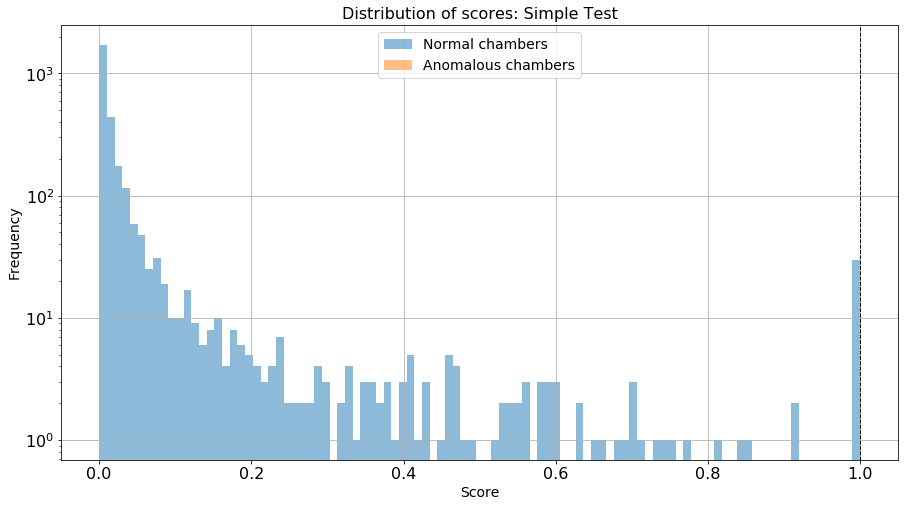

In [274]:
plot_distr_score(layers_test_2, "st_score", "Distribution of scores: Simple Test", 1)

In [278]:
df_info = normalies.copy()
df_info = df_info[df_info.run == 306125] #The assumption is that the fits are performed using 306125 only

layers_test["st_score"] = 0
layers_test.index = pd.RangeIndex(len(layers_test.index))
simple_test(df_info, layers_test, 0.5)

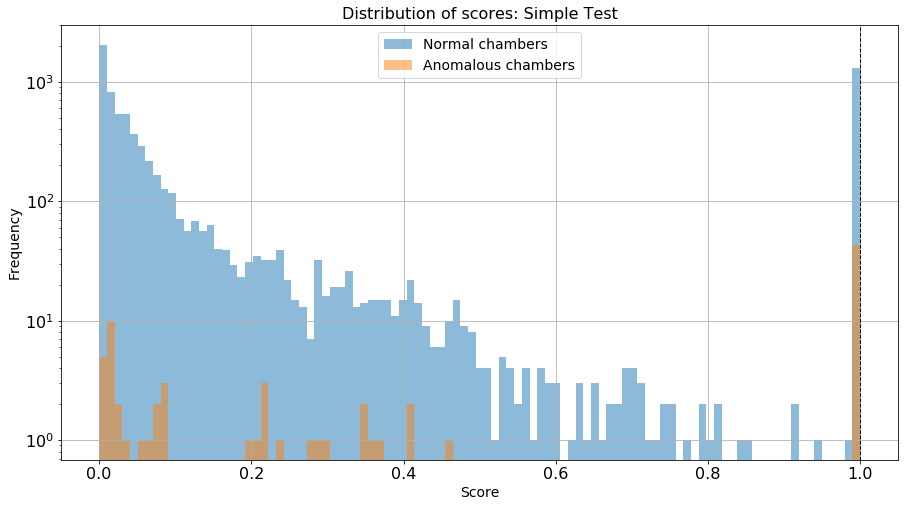

In [279]:
plot_distr_score(layers_test, "st_score", "Distribution of scores: Simple Test", 1)

In [328]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

## NN architectures:

In [281]:
sess = tf.Session()
sess.run(tf.global_variables_initializer())
K.set_session(sess)

Training the NN:

In [309]:
# This may take some time...

def train_nn(model, x, y, batch_size, loss, name, validation_data=None, 
             validation_split=0.0, class_weight=None):

    model.compile(loss=loss, optimizer='Nadam')

    early_stopper = EarlyStopping(monitor="val_loss",
                                  patience=32,
                                  verbose=True,
                                  mode="auto")
    
    checkpoint_callback = ModelCheckpoint(("./model_keras/%s.h5" % name),
                                          monitor="val_loss",
                                          verbose=False,
                                          save_best_only=True,
                                          mode="min")
    return model.fit(x, y,
                     batch_size=batch_size,
                     epochs=8192,
                     verbose=False,
                     class_weight=class_weight,
                     shuffle=True,
                     validation_split=validation_split,
                     validation_data=validation_data,
                     callbacks=[early_stopper, checkpoint_callback])

In [310]:
def plot_training_loss(data, title):
    """Plots the training and validation loss"""
    plt.figure()
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(title)
    plt.plot(data["loss"])
    plt.plot(data["val_loss"])
    plt.legend(["Train", "Validation"], loc="upper right")
    plt.yscale("log")
    plt.show()

In [311]:
def get_roc_curve(test_df, models, working_point=None):
    """Generates ROC Curves for a given array"""
    fig, ax = plt.subplots()
    ax.grid()

    for legend_label, model_score in models:
        false_positive_rate, true_positive_rate, _ = roc_curve(test_df["score"],
                                                               test_df[model_score])
        #plt.xlim(0, 0.2)
        plt.plot(false_positive_rate, true_positive_rate, linewidth=2,
                 label=('%s, AUC: %s' % (legend_label,
                                         round(auc(false_positive_rate, true_positive_rate), 4))))
    if working_point:
        plt.plot(1-working_point[0],
                 working_point[1],
                 'o',
                 label="DNN working point")
    plt.title("ROC")
    plt.legend(loc='best')
    plt.ylabel('True positive rate')
    plt.xlabel('False positive rate')
    plt.show();

In [315]:
def benchmark(y_true, y_score, treshold):
    y_pred = 2*(y_score > treshold)-1
    y_true = 2*(y_true > treshold)-1
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    sensitivity = round(float(tp)/(tp+fn), 4)
    specificity = round(float(tn)/(tn+fp), 4)

    print("Model accuracy: %s" % round(accuracy_score(y_true, y_pred), 4))
    print("Model sensitivity: %s" % sensitivity)
    print("Model specificity: %s" % specificity)

    return specificity, sensitivity

In [330]:
def autoencoder():
    from keras.layers import Input, Dense
    from keras.models import Model
    input_ = Input(shape=(10,))
    encoded = Dense(10, activation='relu')(input_)
    encoded = Dense(9, activation='relu')(encoded)
    encoded = Dense(8, activation='relu')(encoded)
    encoded = Dense(7, activation='relu')(encoded)
    encoded = Dense(6, activation='relu')(encoded)
    encoded = Dense(5, activation='relu')(encoded)
    encoded = Dense(4, activation='relu')(encoded)

    decoded = Dense(4, activation='relu')(encoded)
    decoded = Dense(5, activation='relu')(decoded)
    decoded = Dense(6, activation='relu')(decoded)
    decoded = Dense(7, activation='relu')(decoded)
    decoded = Dense(8, activation='relu')(decoded)
    decoded = Dense(9, activation='relu')(decoded)
    decoded = Dense(10, activation='sigmoid')(decoded)

    autoencoder = Model(input_, decoded)
    return autoencoder

Making an inference using the model and the test sample:

In [331]:
cae = autoencoder()
#print("Autoencoder Architecture:")
#cae.summary()

Epoch 00251: early stopping


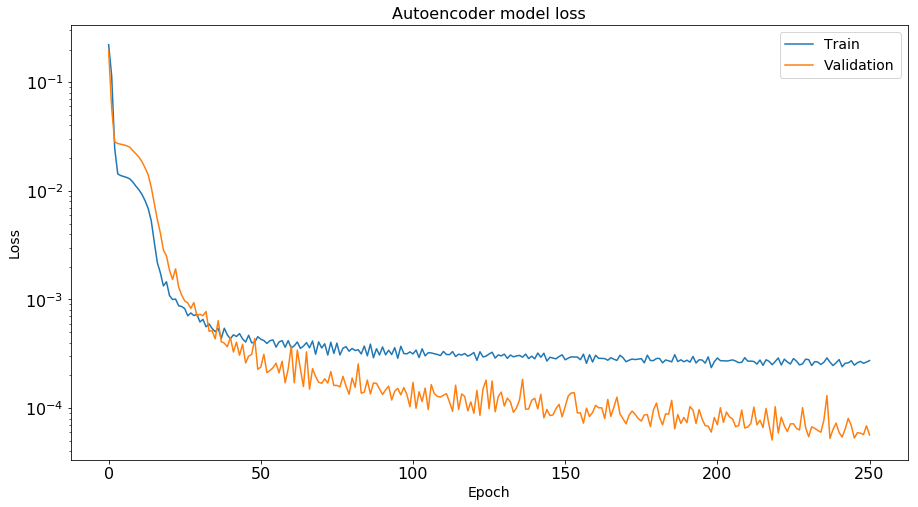

In [332]:
history_cae = train_nn(cae,
                       train_cae_ref,
                       train_cae_ref,
                       512,
                       keras.losses.mse,
                       "cae",
                       validation_split=0.2)
plot_training_loss(history_cae.history, "Autoencoder model loss")

In [314]:
cae_model = load_model("./model_keras/cae.h5")
layers_test["cae_score"] = np.sum(abs(test_x - cae_model.predict(np.array(test_x))), axis=1)

In [316]:
print "AE:"
specificity_cae, sensitivity_cae = benchmark(layers_test["score"], layers_test["cae_score"], 0.035)

AE:
Model accuracy: 0.7773
Model sensitivity: 0.4048
Model specificity: 0.7814


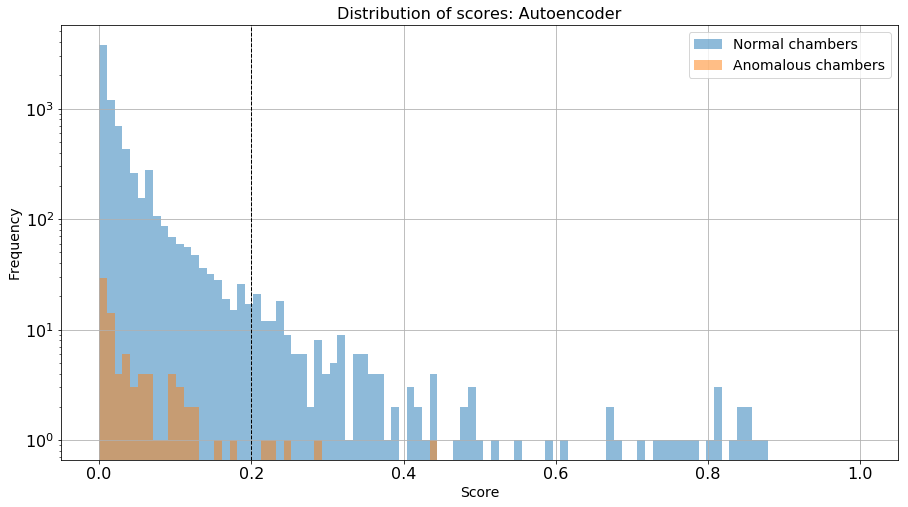

In [318]:
plot_distr_score(layers_test, "cae_score", "Distribution of scores: Autoencoder", 0.2)

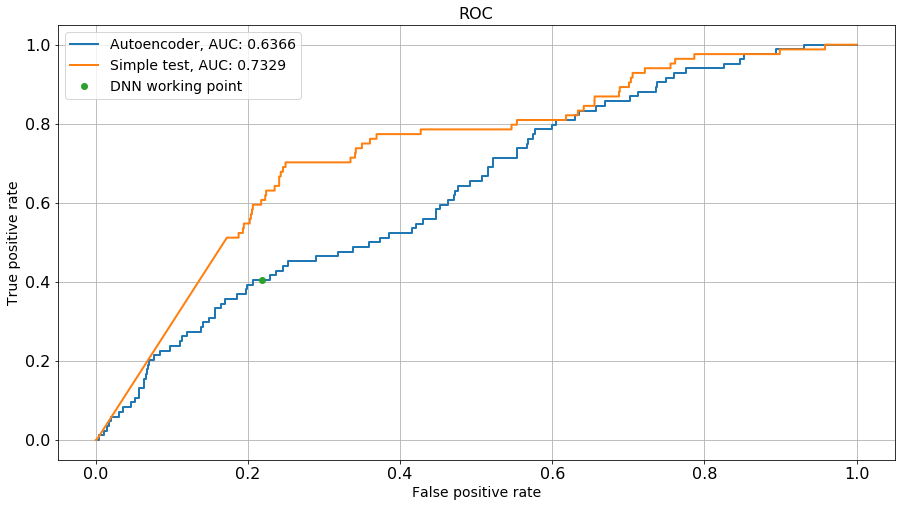

In [327]:
get_roc_curve(layers_test, 
              [
               ("Autoencoder", "cae_score"),
               ("Simple test", "st_score"),
               ], (specificity_cae, sensitivity_cae))

Normalized confusion matrix
[[0.91653481 0.08346519]
 [0.78571429 0.21428571]]


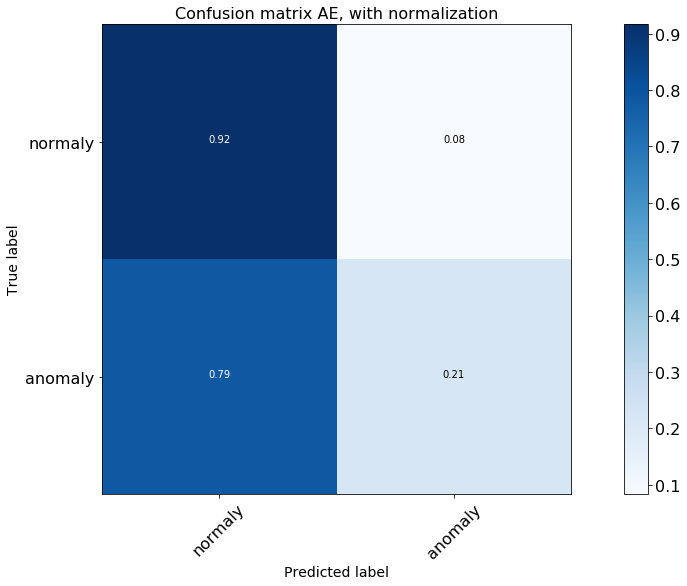

In [329]:
threshold = th_ae = 0.085
y_pred = 2*(layers_test["cae_score"] > threshold)-1
cnf_matrix = confusion_matrix(layers_test["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix AE, with normalization')

Studying the false positives

In [ ]:
print "Number of FPs for the AE:", len(layers_test[(layers_test["score"] == -1) &\
                                                   (layers_test["cae_score"] > th_ae)])

In [ ]:
layers_test["name"] = ("W" + layers_test["wheel"].astype(str) + "_S" + layers_test["sector"].astype(str) +\
       "_St" + layers_test["station"].astype(str))

Where are the FPs located?

In [ ]:
def count_fp(df, dis_nn, th, filt):
    df_temp = df[(layers_test["score"] == -1) & (layers_test[dis_nn] > th)].copy()
    df_temp = df_temp.groupby(['run', 'wheel', 'sector', 'station', 'name'])\
    .size().reset_index(name='counts')
    if filt:
        df_temp = df_temp[df_temp["counts"] > 1]
    #print df_temp
    return len(df_temp), df_temp

num_fp_ann, fp_ann = count_fp(layers_test, "ann_score_4", th_dnn, False)
num_fp_cae, fp_cae = count_fp(layers_test, "cae_score", th_ae, True)

print "Number of chambers with false positives DNN:", num_fp_ann
print "Number of chambers with false positives AE:", num_fp_cae
fp_cae.set_index("name",drop=True,inplace=True)
fp_ann.set_index("name",drop=True,inplace=True)

In [ ]:
#fp_ann["counts"].plot(kind='bar', title ="False positives DNN", legend=True, fontsize=12)

In [ ]:
fp_cae["counts"].plot(kind='bar', title ="False positives AE", legend=True, fontsize=12)

In [ ]:
def deduceLS(data):
    return data*10+5
layers_test["averageLS"] = layers_test["group"].apply(deduceLS)

In [ ]:
th = th_ae
dis_nn = "cae_score"
rule = (layers_test["score"] == -1) & (layers_test[dis_nn] > th)
plot_scatter(layers_test[rule], 306125, -3, 210, 230)

plot_scatter(layers_test[rule], -1, -2, -1, -1)
plot_scatter(layers_test[rule], -1, -1, -1, -1)
plot_scatter(layers_test[rule], -1, 0, -1, -1)
plot_scatter(layers_test[rule], -1, +1, -1, -1)
plot_scatter(layers_test[rule], -1, +2, -1, -1)

Where are the FPs located in time?

In [ ]:
def plotFpVsLs(run, wheel, sector, station, title, df, algo, threshold, log, bound):
    fig, ax = plt.subplots()
    if log:
        ax.set_yscale('log')
    bins = np.linspace(0, bound, int(bound/10)+10)
    (n, bins, patches) = plt.hist(df[(df["score"] == -1) & (df[algo] > threshold)
                         #& (df["wheel"] == 2) &\
                         #& (df["sector"] == 4) &\
                         #& (df["station"] == 2) &\
                         & (df["run"] == run)\
                        ]["averageLS"],
             bins=bins, alpha=0.5, label="False positives")
    plt.hist(df[(df["score"] == 1) & (df[algo] > threshold)
                         #& (df["wheel"] == 2) &\
                         #& (df["sector"] == 4) &\
                         #& (df["station"] == 2) &\
                         & (df["run"] == run)\
                        ]["averageLS"],
             bins=bins, alpha=0.5, label="True positives")
    plt.plot(df[(df["run"] == run)]["averageLS"],\
             df[(df["run"] == run)]["lumi"], "ro",\
             alpha=0.5, label="Inst. Lumi. $(x 10^{30} Hz/cm^2)$")
    plt.title(title+str(run))
    plt.legend(loc='best')
    plt.ylabel('Frequency')
    plt.xlabel('LS')
    plt.grid(True)
    #plt.plot([bound, bound], [0, 100], color='r', linestyle='--', linewidth=2)
    plt.show()
    return n
    
threshold = th_ae
n1 = plotFpVsLs(306121, 0, 0, 0, "Distribution of false positives: AE, ", layers_test, "cae_score",\
                threshold, True, boundaries[boundaries["run"] == 306121]["ls_end"])
n2 = plotFpVsLs(306122, 0, 0, 0, "Distribution of false positives: AE, ", layers_test, "cae_score",\
                threshold, True, boundaries[boundaries["run"] == 306122]["ls_end"])
n3 = plotFpVsLs(306125, 0, 0, 0, "Distribution of false positives: AE, ", layers_test, "cae_score",\
                threshold, True, boundaries[boundaries["run"] == 306125]["ls_end"])
n4 = plotFpVsLs(306126, 0, 0, 0, "Distribution of false positives: AE, ", layers_test, "cae_score",\
                threshold, True, boundaries[boundaries["run"] == 306126]["ls_end"])

Trying some benchmark algorithms (for outlier detection). Isolation forest first:

In [151]:
def cross_validation_split(train_X, train_y, clf_i, param_grid, return_params=False):
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=rng)
    clf = GridSearchCV(clf_i, param_grid, cv=skf, scoring='roc_auc'); 
    clf.fit(train_X, train_y)
    if return_params:
        return clf.best_params_
    return clf.best_estimator_

In [152]:
param_grid = [{"max_samples": [100, 1000],
               "n_estimators": [10, 100],
               "contamination": np.array(range(4, 13, 1))/100.0}]

ifparams = cross_validation_split(np.vstack(layers_train["content_scaled"].values),
                                 -layers_train["score"].astype(int),
                                 IsolationForest(random_state=rng, 
                                                 #verbose=1
                                                ),
                                 param_grid)

In [153]:
# Retrain IF using all unlabelled samples

ifclf = IsolationForest(max_samples=ifparams.max_samples,
                        n_estimators=ifparams.n_estimators,
                        contamination=ifparams.contamination,
                        random_state=rng)

ifclf.fit(np.vstack(normalies_train["content_scaled"].values))

IsolationForest(bootstrap=False, contamination=0.04, max_features=1.0,
        max_samples=100, n_estimators=100, n_jobs=1,
        random_state=<mtrand.RandomState object at 0x7f826a5958c0>,
        verbose=0)

Then use SVM for outlier detection:

In [154]:
# This may take some time... to be run on a remote machine possibly on GPU

#param_grid = [{"nu": np.array(range(1, 10, 1))/10.0,
#               "gamma": ["auto", 0.1, 0.01, 0.001, 0.0001],
#               "kernel": ["linear", "rbf"]}]

#svmparams = cross_validation_split(np.vstack(layers_train["content_scaled"].values),
#                                  -layers_train["score"].astype(int),
#                                  svm.OneClassSVM(random_state=rng, 
#                                                  verbose=1
#                                                 ),
#                                  param_grid)

In [155]:
# Retrain SVM using only good samples. For the moment using some temporary values.
svmclf = svm.OneClassSVM(
                         #nu=svmparams.nu,
                         nu=0.10000000000000001,
                         #gamma=svmparams.gamma,
                         gamma='auto',
                         kernel='linear',
                         random_state=rng
                        )
svmclf.fit(np.vstack(normalies_train["content_scaled"].values))

OneClassSVM(cache_size=200, coef0=0.0, degree=3, gamma='auto',
      kernel='linear', max_iter=-1, nu=0.1,
      random_state=<mtrand.RandomState object at 0x7f826a5958c0>,
      shrinking=True, tol=0.001, verbose=False)

In [156]:
layers_test["svm_score"] = -svmclf.decision_function(np.vstack(layers_test["content_scaled"].values))
layers_test["if_score"] = -ifclf.decision_function(np.vstack(layers_test["content_scaled"].values))

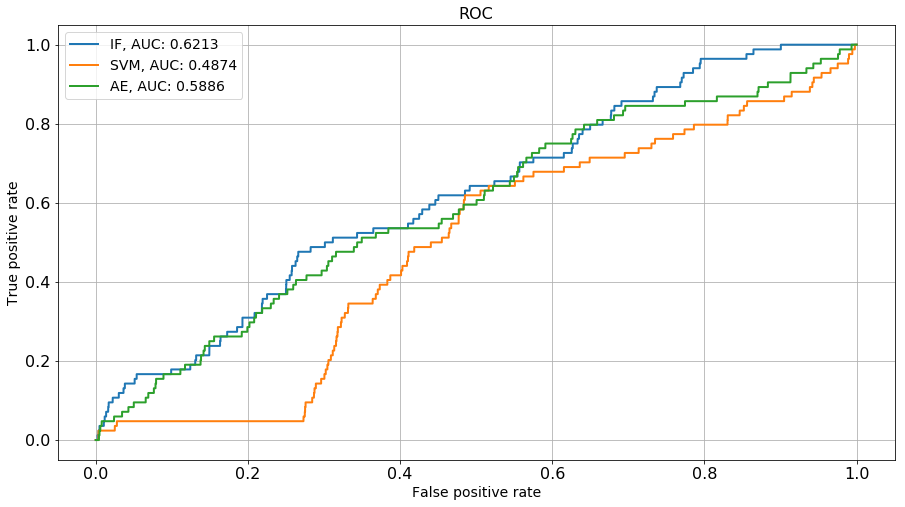

In [157]:
get_roc_curve(layers_test,[
                           ("IF", "if_score"),
                           ("SVM", "svm_score"),
                           ("AE", "cae_score"),
                          ]
             )

Trying unsupervised algorithms: LOF. Optimizing LOF parameters first:

In [ ]:
threshold = 0.0
result_lof = []
for i in range(5, 100, 2):
    lofclf = LocalOutlierFactor(n_neighbors=i, contamination=0.02)#It has to be a odd number
    layers_train["lof_score"] = -lofclf.fit_predict(np.vstack(layers_train["content_scaled"].values))
    y_pred = 2*(layers_train["lof_score"] > threshold)-1
    tn, fp, fn, tp = confusion_matrix(layers_train["score"].astype(int), y_pred).ravel()
    result_lof.append([i, tn, fp, fn, tp])

In [ ]:
for i in range(105, 1000, 100):
    lofclf = LocalOutlierFactor(n_neighbors=i, contamination=0.02)#It has to be a odd number
    layers_train["lof_score"] = -lofclf.fit_predict(np.vstack(layers_train["content_scaled"].values))
    y_pred = 2*(layers_train["lof_score"] > threshold)-1
    tn, fp, fn, tp = confusion_matrix(layers_train["score"].astype(int), y_pred).ravel()
    result_lof.append([i, tn, fp, fn, tp])

In [ ]:
for i in range(1005, 2000, 100):
    lofclf = LocalOutlierFactor(n_neighbors=i, contamination=0.02)#It has to be a odd number
    layers_train["lof_score"] = -lofclf.fit_predict(np.vstack(layers_train["content_scaled"].values))
    y_pred = 2*(layers_train["lof_score"] > threshold)-1
    tn, fp, fn, tp = confusion_matrix(layers_train["score"].astype(int), y_pred).ravel()
    result_lof.append([i, tn, fp, fn, tp])

In [ ]:
fp_rate = []
tp_rate = []
for i in range(len(result_lof)):
    fp_rate.append([result_lof[i][0], result_lof[i][2]*1.0/(result_lof[i][1]+result_lof[i][2])])
    tp_rate.append([result_lof[i][0], result_lof[i][4]*1.0/(result_lof[i][3]+result_lof[i][4])])

In [ ]:
def plot_perf(der, rel, xaxis, yaxis, x1, x2, y1, y2, logx, logy):
    fig, ax = plt.subplots()
    if logy:
        ax.set_yscale('log')
    if logx:
        ax.set_xscale('log')
    a, b = zip(*der)
    c, d = zip(*rel)
    plt.ylim(y1, y2)
    plt.xlim(x1, x2)
    plt.plot(a, b, "ro-", alpha=0.5, label = "False positive rate")
    plt.plot(c, d, "mo-", alpha=0.5, label = "True positive rate")
    plt.axhline(1.00, color='k', linestyle='dashed', linewidth=1)
    #plt.axhline(0.01, color='g', linestyle='dashed', linewidth=1)
    if (xaxis == 'Number of neighbors'):
        plt.axvline(1200, color='k', linestyle='dashed', linewidth=1)
    elif (xaxis == 'Contamination'):
        plt.axvline(0.02, color='k', linestyle='dashed', linewidth=1)
    plt.title("LOF")
    plt.legend(loc='best')
    #plt.ylabel('Inertia')
    plt.xlabel(xaxis)
    plt.show()
    
plot_perf(fp_rate, tp_rate, 'Number of neighbors', '', 0, 2000, 0.01, 1.1, False, True)

In [ ]:
threshold = 0.0
result_lof = []
for i in np.array(range(1, 500, 5))/1000.0:
    lofclf = LocalOutlierFactor(n_neighbors=1205, contamination=i)#It has to be a odd number
    layers_train["lof_score"] = -lofclf.fit_predict(np.vstack(layers_train["content_scaled"].values))
    y_pred = 2*(layers_train["lof_score"] > threshold)-1
    tn, fp, fn, tp = confusion_matrix(layers_train["score"].astype(int), y_pred).ravel()
    result_lof.append([i, tn, fp, fn, tp])

In [ ]:
fp_rate_c = []
tp_rate_c = []
for i in range(len(result_lof)):
    fp_rate_c.append([result_lof[i][0], result_lof[i][2]*1.0/(result_lof[i][1]+result_lof[i][2])])
    tp_rate_c.append([result_lof[i][0], result_lof[i][4]*1.0/(result_lof[i][3]+result_lof[i][4])])

In [ ]:
plot_perf(fp_rate_c, tp_rate_c, 'Contamination', '', 0.01, 0.2, 0.001, 1.1, False, True)

Choosing ...

In [160]:
# fit the model
lofclf = LocalOutlierFactor(n_neighbors=1205, contamination=0.02)#It has to be a odd number
layers_train["lof_score"] = -lofclf.fit_predict(np.vstack(layers_train["content_scaled"].values))

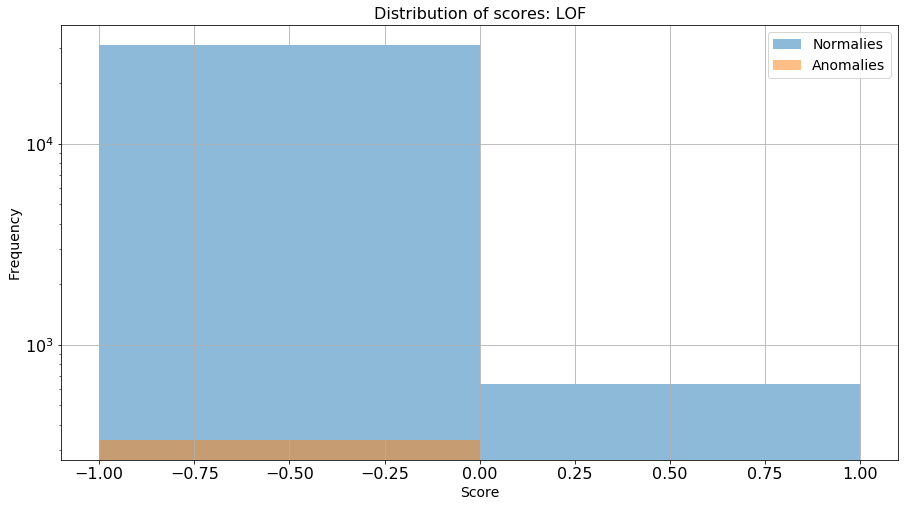

In [161]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(-1, +1, 3)
plt.hist(layers_train[layers_train["score"] < 0]["lof_score"], bins=bins, alpha=0.5, label="Normalies")
plt.hist(layers_train[layers_train["score"] > 0]["lof_score"], bins=bins, alpha=0.5, label="Anomalies")
plt.title("Distribution of scores: LOF")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.show()

Normalized confusion matrix
[[0.97976641 0.02023359]
 [1.         0.        ]]


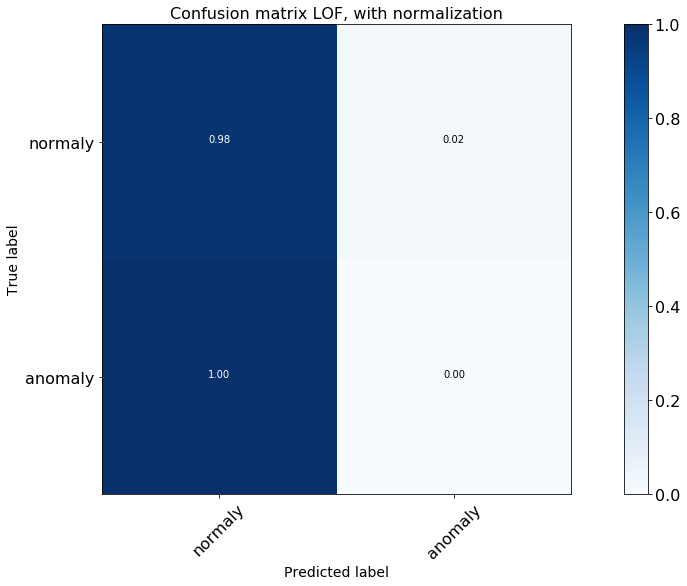

In [162]:
threshold = 0.0
y_pred = 2*(layers_train["lof_score"] > threshold)-1
cnf_matrix = confusion_matrix(layers_train["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix LOF, with normalization')

In [ ]:
layers_train["averageLS"] = layers_train["group"].apply(deduceLS)
threshold = 0.0
plotFpVsLs(306121, 0, 0, 0, "Distribution of false positives: LOF, ", layers_train, "lof_score",\
           threshold, True, boundaries[boundaries["run"] == 306121]["ls_end"])
plotFpVsLs(306122, 0, 0, 0, "Distribution of false positives: LOF, ", layers_train, "lof_score",\
           threshold, True, boundaries[boundaries["run"] == 306122]["ls_end"])
plotFpVsLs(306125, 0, 0, 0, "Distribution of false positives: LOF, ", layers_train, "lof_score",\
           threshold, True, boundaries[boundaries["run"] == 306125]["ls_end"])
plotFpVsLs(306126, 0, 0, 0, "Distribution of false positives: LOF, ", layers_train, "lof_score",\
           threshold, True, boundaries[boundaries["run"] == 306126]["ls_end"])

Trying KMeans clustering algorithm. First of all let's find the optimal number of clusters (parameter to the algorithm) by scanning the average distance vs. number of clusters:

In [402]:
means = []
for i in range(1, 300, 50):
    print i
    k_means = cluster.KMeans(n_clusters=i)
    k_means.fit(np.vstack(normalies_train["content"].values))
    means.append([i, k_means.inertia_])

1
51
101
151
201
251


In [404]:
for i in range(300, 500, 100):
    print i
    k_means = cluster.KMeans(n_clusters=i)
    k_means.fit(np.vstack(normalies_train["content"].values))
    means.append([i, k_means.inertia_])

300
400


In [405]:
for i in range(500, 1000, 200):
    print i
    k_means = cluster.KMeans(n_clusters=i)
    k_means.fit(np.vstack(normalies_train["content"].values))
    means.append([i, k_means.inertia_])

500
700
900


In [406]:
for i in range(1000, 2000, 500):
    print i
    k_means = cluster.KMeans(n_clusters=i)
    k_means.fit(np.vstack(normalies_train["content"].values))
    means.append([i, k_means.inertia_])

1000
1500


In [407]:
for i in range(2, 10, 2):
    print i
    k_means = cluster.KMeans(n_clusters=i)
    k_means.fit(np.vstack(normalies_train["content"].values))
    means.append([i, k_means.inertia_])

2
4
6
8


In [408]:
def getKey(item):
    return item[0]

means = sorted(means, key=getKey)

In [409]:
der = []
for i in range(0, len(means)-1):
    x, y = zip(*means)
    a = np.sqrt(y[i]/len(normalies_train))
    b = np.sqrt(y[i+1]/len(normalies_train))
    delta = (a-b)/a
    der.append([x[i], delta])

In [410]:
rel = []
for i in range(0, len(means)-1):
    x, y = zip(*means)
    a = np.sqrt(y[i]/len(normalies_train))
    b = np.sqrt(y[i+1]/len(normalies_train))
    delta = (a-b)*100000/y[0]
    rel.append([x[i], delta])

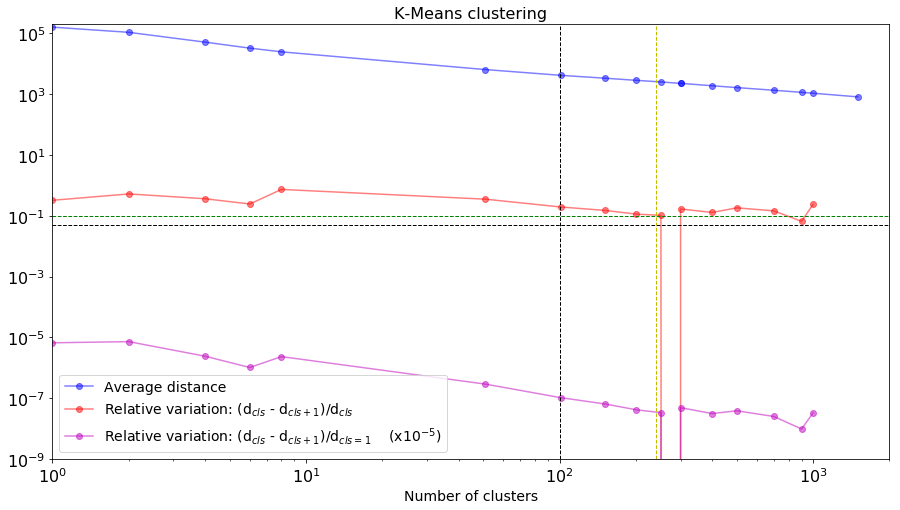

In [418]:
def plotDist(means, der, rel):
    fig, ax = plt.subplots()
    ax.set_yscale('log')
    ax.set_xscale('log')
    x, y = zip(*means)
    a, b = zip(*der)
    c, d = zip(*rel)
    plt.ylim(0.000000001, 200000.)
    plt.xlim(1, 2000)
    plt.plot(x, np.sqrt(np.array(y)/len(normalies_train)), "bo-", alpha=0.5, label="Average distance")
    plt.plot(a, b, "ro-", alpha=0.5, label = "Relative variation: (d$_{cls}$ - d$_{cls+1}$)/d$_{cls}$")
    plt.plot(c, d, "mo-", alpha=0.5, label = "Relative variation: (d$_{cls}$ - d$_{cls+1}$)/d$_{cls = 1}$\
    (x$10^{-5}$)")
    plt.axhline(0.05, color='k', linestyle='dashed', linewidth=1)
    plt.axhline(0.1, color='g', linestyle='dashed', linewidth=1)
    plt.axvline(100, color='k', linestyle='dashed', linewidth=1)
    plt.axvline(240, color='y', linestyle='dashed', linewidth=1)
    plt.title("K-Means clustering")
    plt.legend(loc='best')
    #plt.ylabel('Inertia')
    plt.xlabel('Number of clusters')
    plt.show()
    
plotDist(means, der, rel)

Choosing 450 clusters and training on the normalies only:

In [390]:
n_cls = 450
k_means = cluster.KMeans(n_clusters=n_cls)
#distances = k_means.fit_transform(np.vstack(normalies["content_scaled"].values))
distances = k_means.fit_transform(np.vstack(normalies["content"].values))
normalies["kmeans_score"] = k_means.labels_

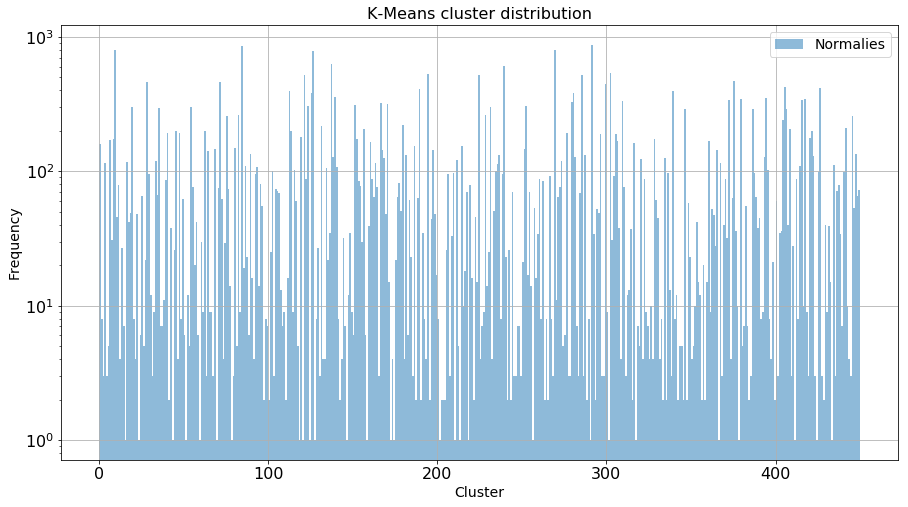

In [391]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, n_cls, n_cls+1)
plt.hist(normalies[normalies["score"] < 0]["kmeans_score"], bins=bins, alpha=0.5, label="Normalies")
plt.title("K-Means cluster distribution")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Cluster')
plt.show()

The minimal distance is used to assign the data to the clusters. Visualize the average distance within a cluster:

In [392]:
minim = []
for i in range(0, len(distances)):
    #print  min(distances[i])
    minim.append(min(distances[i]))

In [393]:
#print len(minim)
normalies["dist"] = minim
#print normalies["dist"]

In [394]:
temp1 = normalies.groupby(["kmeans_score"])[["dist"]].mean().reset_index()        

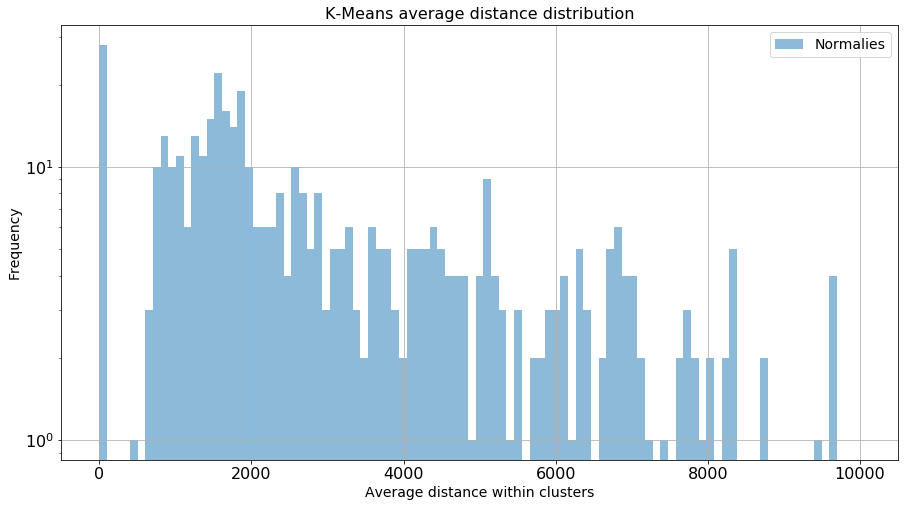

In [396]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, 10000, 100)
plt.hist(temp1["dist"], bins=bins, alpha=0.5, label="Normalies")
plt.title("K-Means average distance distribution")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Average distance within clusters')
plt.show()

Predicting the distances of the test sample data with respect to the clusters and plotting the minimum distance for each point (dividing anomalies and normalies):

In [397]:
#distances_test = k_means.transform(np.vstack(layers_test["content_scaled"].values))
distances_test = k_means.transform(np.vstack(layers_test["content"].values))

minim = []
for i in range(0, len(distances_test)):
    #print  min(distances_test[i])
    minim.append(min(distances_test[i]))
layers_test["dist"] = minim

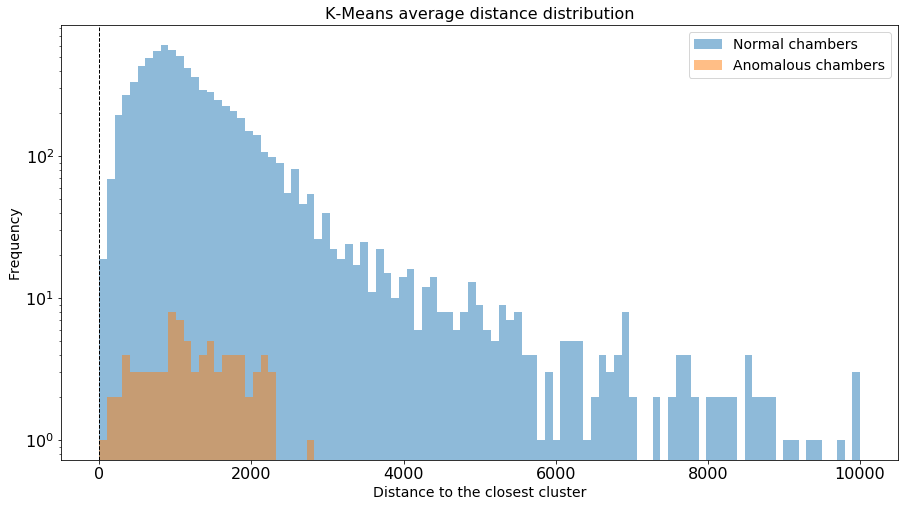

In [398]:
fig, ax = plt.subplots()
ax.set_yscale('log')
#ax.grid()
bins = np.linspace(0, 10000, 100)
plt.hist(layers_test[layers_test["score"] < 0]["dist"], bins=bins, alpha=0.5, label="Normal chambers")
plt.hist(layers_test[layers_test["score"] > 0]["dist"], bins=bins, alpha=0.5, label="Anomalous chambers")
plt.axvline(0.025, color='k', linestyle='dashed', linewidth=1)
plt.title("K-Means average distance distribution")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Distance to the closest cluster')
plt.show()

Normalized confusion matrix
[[0.84256329 0.15743671]
 [0.86904762 0.13095238]]


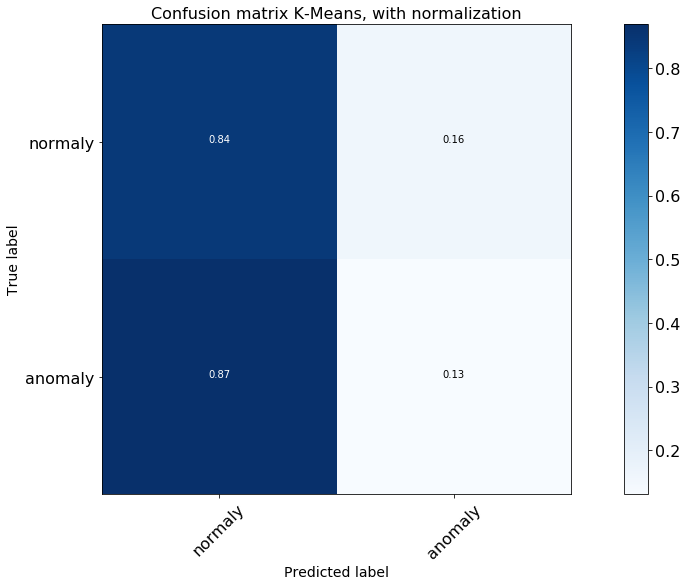

In [401]:
th_km = 2000
y_pred = 2*(layers_test["dist"] > th_km)-1
cnf_matrix = confusion_matrix(layers_test["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix K-Means, with normalization')

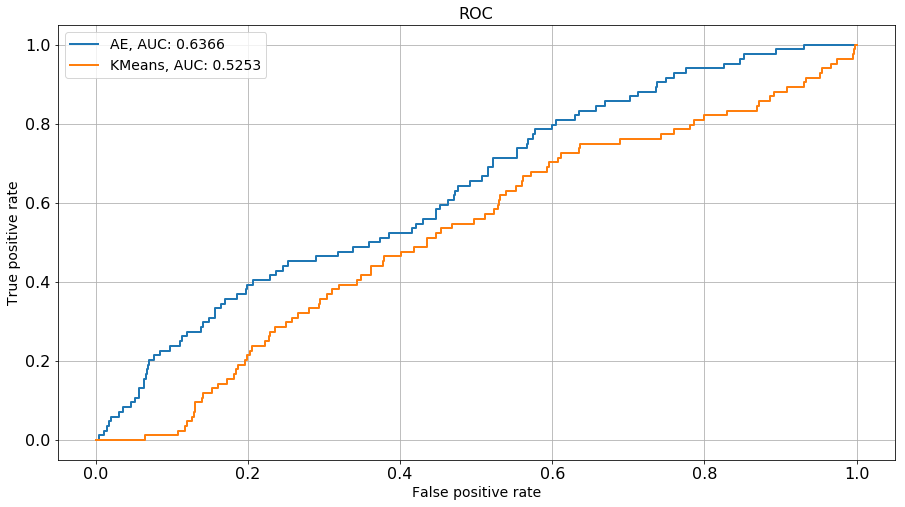

In [399]:
get_roc_curve(layers_test,[
                           #("IF", "if_score"),
                           #("SVM", "svm_score"),
                           ("AE", "cae_score"),
                           ("KMeans", "dist"),
                          ]
             )

In [ ]:
filename = './model_sktlearn/kmeans.sav'
joblib.dump(k_means, filename)